In [1]:
import pandas as pd
import numpy as np
import csv
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import re
from nltk.probability import FreqDist
import matplotlib.cm as cm

from sklearn.cluster import MiniBatchKMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [2]:
pd.set_option=("display.max_colwidth",'100')

df1=pd.read_csv("../ch_bug_data_new.csv")
df1.tail()

,Unnamed: 0,bug_id,priority,type,component,status,summary,owner,reporter,comp_id,component_new
99723,99723,987797,3.0,Bug,"UI>Accessibility, OS>Accessibility>ChromeVox",Fixed,[Compile Failure] Observing compile failure on...,nek...@chromium.org,pbomm...@chromium.org,202,os
99724,99724,987788,2.0,Bug,Mobile>WebView,Assigned,Change precedence for commandline/features to ...,ntfschr@chromium.org,ntfschr@chromium.org,212,mobile
99725,99725,987750,3.0,Bug,Blink>Paint,Available,Add a test of backdrop-filter with null (no) c...,NaN,a_deleted_user,188,blink
99726,99726,987730,2.0,Bug,Blink>Paint,Fixed,DL: beforeactivate commits DCHECK,vmp...@chromium.org,vmp...@chromium.org,188,blink
99727,99727,987686,3.0,Bug,Blink>WebOTP,Untriaged,Investigate what happens when chrome gets page...,goto@chromium.org,goto@chromium.org,188,blink


In [3]:
df2=df1.drop(['type','priority','status','owner','reporter'],axis=1)
df2['summary']=df2['summary'].str.lower()
df2.head()
df3=df2
df3

,Unnamed: 0,bug_id,component,summary,comp_id,component_new
0,0,1136185,UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui
1,1,1136184,Infra>Sheriffing>SheriffOMatic,sheriff-o-matic should no longer show m85 buil...,125,infra
2,2,1136183,Speed>Metrics,fps meter isnt capturing dropped frames,200,speed
3,3,1136181,UI>Browser>Promo,add chrome://flags entry for iph snooze,3,ui
4,4,1136179,UI>Browser>NewTabPage,second row of new tab page buttons not clickable,3,ui
...,...,...,...,...,...,...
99723,99723,987797,"UI>Accessibility, OS>Accessibility>ChromeVox",[compile failure] observing compile failure on...,202,os
99724,99724,987788,Mobile>WebView,change precedence for commandline/features to ...,212,mobile
99725,99725,987750,Blink>Paint,add a test of backdrop-filter with null (no) c...,188,blink
99726,99726,987730,Blink>Paint,dl: beforeactivate commits dcheck,188,blink


In [4]:
#removing punctuations from the summary

import string

def remove_punctuation(txt):
    if isinstance(txt, str):
        txt_nopunt = "".join([c for c in txt if c not in string.punctuation])
        return txt_nopunt
    else:
        return txt
df3['msg_clean'] = df3['summary'].apply(lambda x: remove_punctuation(x))
df3

,Unnamed: 0,bug_id,component,summary,comp_id,component_new,msg_clean
0,0,1136185,UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui,mohnstrudel a11y no keyboard focus ring on tab...
1,1,1136184,Infra>Sheriffing>SheriffOMatic,sheriff-o-matic should no longer show m85 buil...,125,infra,sheriffomatic should no longer show m85 builders
2,2,1136183,Speed>Metrics,fps meter isnt capturing dropped frames,200,speed,fps meter isnt capturing dropped frames
3,3,1136181,UI>Browser>Promo,add chrome://flags entry for iph snooze,3,ui,add chromeflags entry for iph snooze
4,4,1136179,UI>Browser>NewTabPage,second row of new tab page buttons not clickable,3,ui,second row of new tab page buttons not clickable
...,...,...,...,...,...,...,...
99723,99723,987797,"UI>Accessibility, OS>Accessibility>ChromeVox",[compile failure] observing compile failure on...,202,os,compile failure observing compile failure on l...
99724,99724,987788,Mobile>WebView,change precedence for commandline/features to ...,212,mobile,change precedence for commandlinefeatures to a...
99725,99725,987750,Blink>Paint,add a test of backdrop-filter with null (no) c...,188,blink,add a test of backdropfilter with null no crop...
99726,99726,987730,Blink>Paint,dl: beforeactivate commits dcheck,188,blink,dl beforeactivate commits dcheck


In [5]:
import re

def tokenize(text):
    tokens=re.split('\W+',text)
    return tokens

#df3['summary_tokenized']=df3['msg_clean'].apply(lambda x: tokenize(x.lower()))
df3['summary_tokenized'] = df3['msg_clean'].apply(lambda x: tokenize(x.lower()) if isinstance(x, str) else [])

df3

,Unnamed: 0,bug_id,component,summary,comp_id,component_new,msg_clean,summary_tokenized
0,0,1136185,UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui,mohnstrudel a11y no keyboard focus ring on tab...,"[mohnstrudel, a11y, no, keyboard, focus, ring,..."
1,1,1136184,Infra>Sheriffing>SheriffOMatic,sheriff-o-matic should no longer show m85 buil...,125,infra,sheriffomatic should no longer show m85 builders,"[sheriffomatic, should, no, longer, show, m85,..."
2,2,1136183,Speed>Metrics,fps meter isnt capturing dropped frames,200,speed,fps meter isnt capturing dropped frames,"[fps, meter, isnt, capturing, dropped, frames]"
3,3,1136181,UI>Browser>Promo,add chrome://flags entry for iph snooze,3,ui,add chromeflags entry for iph snooze,"[add, chromeflags, entry, for, iph, snooze]"
4,4,1136179,UI>Browser>NewTabPage,second row of new tab page buttons not clickable,3,ui,second row of new tab page buttons not clickable,"[second, row, of, new, tab, page, buttons, not..."
...,...,...,...,...,...,...,...,...
99723,99723,987797,"UI>Accessibility, OS>Accessibility>ChromeVox",[compile failure] observing compile failure on...,202,os,compile failure observing compile failure on l...,"[compile, failure, observing, compile, failure..."
99724,99724,987788,Mobile>WebView,change precedence for commandline/features to ...,212,mobile,change precedence for commandlinefeatures to a...,"[change, precedence, for, commandlinefeatures,..."
99725,99725,987750,Blink>Paint,add a test of backdrop-filter with null (no) c...,188,blink,add a test of backdropfilter with null no crop...,"[add, a, test, of, backdropfilter, with, null,..."
99726,99726,987730,Blink>Paint,dl: beforeactivate commits dcheck,188,blink,dl beforeactivate commits dcheck,"[dl, beforeactivate, commits, dcheck]"


In [6]:
#importing nltk to remove stopwords from the summary_tokenized

import nltk
nltk.download('stopwords')
stopwords=nltk.corpus.stopwords.words('english')

def remove_stopwords(txt_tokenized):
    txt_clean=[word for word in txt_tokenized if word not in stopwords]
    return txt_clean


df3['no_swds']=df3['summary_tokenized'].apply(lambda x: remove_stopwords(x))
df3

[nltk_data] Downloading package stopwords to /home/taj/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Unnamed: 0,bug_id,component,summary,comp_id,component_new,msg_clean,summary_tokenized,no_swds
0,0,1136185,UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui,mohnstrudel a11y no keyboard focus ring on tab...,"[mohnstrudel, a11y, no, keyboard, focus, ring,...","[mohnstrudel, a11y, keyboard, focus, ring, tab..."
1,1,1136184,Infra>Sheriffing>SheriffOMatic,sheriff-o-matic should no longer show m85 buil...,125,infra,sheriffomatic should no longer show m85 builders,"[sheriffomatic, should, no, longer, show, m85,...","[sheriffomatic, longer, show, m85, builders, ]"
2,2,1136183,Speed>Metrics,fps meter isnt capturing dropped frames,200,speed,fps meter isnt capturing dropped frames,"[fps, meter, isnt, capturing, dropped, frames]","[fps, meter, isnt, capturing, dropped, frames]"
3,3,1136181,UI>Browser>Promo,add chrome://flags entry for iph snooze,3,ui,add chromeflags entry for iph snooze,"[add, chromeflags, entry, for, iph, snooze]","[add, chromeflags, entry, iph, snooze]"
4,4,1136179,UI>Browser>NewTabPage,second row of new tab page buttons not clickable,3,ui,second row of new tab page buttons not clickable,"[second, row, of, new, tab, page, buttons, not...","[second, row, new, tab, page, buttons, clickable]"
...,...,...,...,...,...,...,...,...,...
99723,99723,987797,"UI>Accessibility, OS>Accessibility>ChromeVox",[compile failure] observing compile failure on...,202,os,compile failure observing compile failure on l...,"[compile, failure, observing, compile, failure...","[compile, failure, observing, compile, failure..."
99724,99724,987788,Mobile>WebView,change precedence for commandline/features to ...,212,mobile,change precedence for commandlinefeatures to a...,"[change, precedence, for, commandlinefeatures,...","[change, precedence, commandlinefeatures, alig..."
99725,99725,987750,Blink>Paint,add a test of backdrop-filter with null (no) c...,188,blink,add a test of backdropfilter with null no crop...,"[add, a, test, of, backdropfilter, with, null,...","[add, test, backdropfilter, null, crop, rect]"
99726,99726,987730,Blink>Paint,dl: beforeactivate commits dcheck,188,blink,dl beforeactivate commits dcheck,"[dl, beforeactivate, commits, dcheck]","[dl, beforeactivate, commits, dcheck]"


In [7]:
import nltk
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer

nltk.download('stopwords')
nltk.download('wordnet')

stopwords = nltk.corpus.stopwords.words('english')
wnl = WordNetLemmatizer()

def remove_stopwords(txt_tokenized):
    txt_clean = [word for word in txt_tokenized if word not in stopwords]
    return txt_clean

def lemmatize_words(txt_tokenized):
    txt_lemmatized = [wnl.lemmatize(word) for word in txt_tokenized]
    return txt_lemmatized

# Remove stopwords
df3['no_swds'] = df3['summary_tokenized'].apply(lambda x: remove_stopwords(x))



# Display the DataFrame
df3

[nltk_data] Downloading package stopwords to /home/taj/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/taj/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


,Unnamed: 0,bug_id,component,summary,comp_id,component_new,msg_clean,summary_tokenized,no_swds
0,0,1136185,UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui,mohnstrudel a11y no keyboard focus ring on tab...,"[mohnstrudel, a11y, no, keyboard, focus, ring,...","[mohnstrudel, a11y, keyboard, focus, ring, tab..."
1,1,1136184,Infra>Sheriffing>SheriffOMatic,sheriff-o-matic should no longer show m85 buil...,125,infra,sheriffomatic should no longer show m85 builders,"[sheriffomatic, should, no, longer, show, m85,...","[sheriffomatic, longer, show, m85, builders, ]"
2,2,1136183,Speed>Metrics,fps meter isnt capturing dropped frames,200,speed,fps meter isnt capturing dropped frames,"[fps, meter, isnt, capturing, dropped, frames]","[fps, meter, isnt, capturing, dropped, frames]"
3,3,1136181,UI>Browser>Promo,add chrome://flags entry for iph snooze,3,ui,add chromeflags entry for iph snooze,"[add, chromeflags, entry, for, iph, snooze]","[add, chromeflags, entry, iph, snooze]"
4,4,1136179,UI>Browser>NewTabPage,second row of new tab page buttons not clickable,3,ui,second row of new tab page buttons not clickable,"[second, row, of, new, tab, page, buttons, not...","[second, row, new, tab, page, buttons, clickable]"
...,...,...,...,...,...,...,...,...,...
99723,99723,987797,"UI>Accessibility, OS>Accessibility>ChromeVox",[compile failure] observing compile failure on...,202,os,compile failure observing compile failure on l...,"[compile, failure, observing, compile, failure...","[compile, failure, observing, compile, failure..."
99724,99724,987788,Mobile>WebView,change precedence for commandline/features to ...,212,mobile,change precedence for commandlinefeatures to a...,"[change, precedence, for, commandlinefeatures,...","[change, precedence, commandlinefeatures, alig..."
99725,99725,987750,Blink>Paint,add a test of backdrop-filter with null (no) c...,188,blink,add a test of backdropfilter with null no crop...,"[add, a, test, of, backdropfilter, with, null,...","[add, test, backdropfilter, null, crop, rect]"
99726,99726,987730,Blink>Paint,dl: beforeactivate commits dcheck,188,blink,dl beforeactivate commits dcheck,"[dl, beforeactivate, commits, dcheck]","[dl, beforeactivate, commits, dcheck]"


In [8]:
from nltk.corpus import wordnet
import nltk
import re

nltk.download('wordnet')
nltk.download('omw-1.4')
wn = nltk.WordNetLemmatizer()

# Define a function to check if a word has a dictionary meaning. Input: word
def word_has_dictionary_meaning(word):
    synsets = wordnet.synsets(word)
    return len(synsets) > 0

# Input: array of words as token
def clean_numbers(token_txt):
    number_pattern = r'^-?\d+$'
    text = [word for word in token_txt if not re.match(number_pattern, word)]
    return text

# Define a function to lemmatize words. Input: array of words as token
def lemmatization(token_txt):
    text = [wn.lemmatize(word) for word in token_txt]
    return text

# Apply the lemmatization function to the 'no_swds' column
df3['filtered_no_swds'] = df3['no_swds'].apply(lambda words: [word for word in words if word_has_dictionary_meaning(word)])

df3['lemmatized_no_swds'] = df3['filtered_no_swds'].apply(lambda x: lemmatization(x))

df3['clean_lemma']=df3['lemmatized_no_swds'].apply(lambda words: clean_numbers(words))

df3

[nltk_data] Downloading package wordnet to /home/taj/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /home/taj/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


,Unnamed: 0,bug_id,component,summary,comp_id,component_new,msg_clean,summary_tokenized,no_swds,filtered_no_swds,lemmatized_no_swds,clean_lemma
0,0,1136185,UI>Browser>TopChrome>TabStrip>ThumbnailTabStrip,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui,mohnstrudel a11y no keyboard focus ring on tab...,"[mohnstrudel, a11y, no, keyboard, focus, ring,...","[mohnstrudel, a11y, keyboard, focus, ring, tab...","[keyboard, focus, ring, tab, counter, button]","[keyboard, focus, ring, tab, counter, button]","[keyboard, focus, ring, tab, counter, button]"
1,1,1136184,Infra>Sheriffing>SheriffOMatic,sheriff-o-matic should no longer show m85 buil...,125,infra,sheriffomatic should no longer show m85 builders,"[sheriffomatic, should, no, longer, show, m85,...","[sheriffomatic, longer, show, m85, builders, ]","[longer, show, builders]","[longer, show, builder]","[longer, show, builder]"
2,2,1136183,Speed>Metrics,fps meter isnt capturing dropped frames,200,speed,fps meter isnt capturing dropped frames,"[fps, meter, isnt, capturing, dropped, frames]","[fps, meter, isnt, capturing, dropped, frames]","[fps, meter, capturing, dropped, frames]","[fps, meter, capturing, dropped, frame]","[fps, meter, capturing, dropped, frame]"
3,3,1136181,UI>Browser>Promo,add chrome://flags entry for iph snooze,3,ui,add chromeflags entry for iph snooze,"[add, chromeflags, entry, for, iph, snooze]","[add, chromeflags, entry, iph, snooze]","[add, entry, snooze]","[add, entry, snooze]","[add, entry, snooze]"
4,4,1136179,UI>Browser>NewTabPage,second row of new tab page buttons not clickable,3,ui,second row of new tab page buttons not clickable,"[second, row, of, new, tab, page, buttons, not...","[second, row, new, tab, page, buttons, clickable]","[second, row, new, tab, page, buttons]","[second, row, new, tab, page, button]","[second, row, new, tab, page, button]"
...,...,...,...,...,...,...,...,...,...,...,...,...
99723,99723,987797,"UI>Accessibility, OS>Accessibility>ChromeVox",[compile failure] observing compile failure on...,202,os,compile failure observing compile failure on l...,"[compile, failure, observing, compile, failure...","[compile, failure, observing, compile, failure...","[compile, failure, observing, compile, failure...","[compile, failure, observing, compile, failure...","[compile, failure, observing, compile, failure..."
99724,99724,987788,Mobile>WebView,change precedence for commandline/features to ...,212,mobile,change precedence for commandlinefeatures to a...,"[change, precedence, for, commandlinefeatures,...","[change, precedence, commandlinefeatures, alig...","[change, precedence, align, expectations]","[change, precedence, align, expectation]","[change, precedence, align, expectation]"
99725,99725,987750,Blink>Paint,add a test of backdrop-filter with null (no) c...,188,blink,add a test of backdropfilter with null no crop...,"[add, a, test, of, backdropfilter, with, null,...","[add, test, backdropfilter, null, crop, rect]","[add, test, null, crop]","[add, test, null, crop]","[add, test, null, crop]"
99726,99726,987730,Blink>Paint,dl: beforeactivate commits dcheck,188,blink,dl beforeactivate commits dcheck,"[dl, beforeactivate, commits, dcheck]","[dl, beforeactivate, commits, dcheck]","[dl, commits]","[dl, commits]","[dl, commits]"


In [9]:
# Check if words were lemmatized
df3['lemmatized_check'] = df3.apply(lambda row: any(original != lemmatized for original, lemmatized in zip(row['no_swds'], row['lemmatized_no_swds'])), axis=1)

# Filter rows where lemmatization was applied
lemmatized_rows = df3[df3['lemmatized_check']]

# Display the rows where lemmatization was applied
print(lemmatized_rows[['no_swds', 'clean_lemma']])

                                                 no_swds  \
0      [mohnstrudel, a11y, keyboard, focus, ring, tab...   
1         [sheriffomatic, longer, show, m85, builders, ]   
2         [fps, meter, isnt, capturing, dropped, frames]   
3                 [add, chromeflags, entry, iph, snooze]   
4      [second, row, new, tab, page, buttons, clickable]   
...                                                  ...   
99723  [compile, failure, observing, compile, failure...   
99724  [change, precedence, commandlinefeatures, alig...   
99725      [add, test, backdropfilter, null, crop, rect]   
99726              [dl, beforeactivate, commits, dcheck]   
99727        [investigate, happens, chrome, gets, paged]   

                                             clean_lemma  
0          [keyboard, focus, ring, tab, counter, button]  
1                                [longer, show, builder]  
2                [fps, meter, capturing, dropped, frame]  
3                                   [add, e

In [10]:
df3['meaningful_lemm_str'] = df3['clean_lemma'].apply(lambda x: ' '.join(x))

In [11]:
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer

# Define stop words to remove them from TFIDF matrix
stop = list(stopwords.words('english'))
stop.extend(['10','13','30','60','firefox','doesnt','using','user','use','new','zoomoutcur','x','xx','xxx','xxxx', 
             'xyz','äöü','类型','更新10101之后','没有找到支持的视频格式和','类','型','1st','2d','2nd','3d','3rd','aa','dd'])

# Update the word_to_drop list with the extended stopwords
word_to_drop = stop

# Create an instance of TfidfVectorizer with stop words
vectorizer = TfidfVectorizer(stop_words=word_to_drop, min_df=25, max_features=100000)

# Fit and transform your text data using the vectorizer
tfidf_matrix = vectorizer.fit_transform(df3['meaningful_lemm_str'])

# Apply threshold on TF-IDF values
min_threshold = 0.05  # example value
max_threshold = 0.8  # example value

# Set values below min_threshold to 0 and values above max_threshold to max_threshold
tfidf_matrix = tfidf_matrix.todense()  # Convert sparse matrix to dense
tfidf_matrix[tfidf_matrix < min_threshold] = 0
tfidf_matrix[tfidf_matrix > max_threshold] = max_threshold

# Get the feature names (i.e., words) from the vectorizer
feature_names = vectorizer.get_feature_names_out()

# Iterate over feature names and their corresponding TF-IDF scores for each document
for i in range(len(df3)):
    print(f"Document {i+1}:")
    for j, word in enumerate(feature_names):
        tfidf_score = tfidf_matrix[i, j]
        if tfidf_score > 0.3:
            print(f"{word}: {tfidf_score:.4f}")



Document 1:
button: 0.3261
counter: 0.5358
focus: 0.3459
keyboard: 0.3586
ring: 0.5182
Document 2:
builder: 0.5487
longer: 0.6529
show: 0.5222
Document 3:
capturing: 0.4764
dropped: 0.4522
fps: 0.4790
frame: 0.3230
meter: 0.4846
Document 4:
add: 0.5629
entry: 0.8000
Document 5:
button: 0.3896
page: 0.3430
row: 0.5704
second: 0.5264
tab: 0.3581
Document 6:
stop: 0.7141
sync: 0.7000
Document 7:
blocking: 0.4352
one: 0.3786
range: 0.4542
repeated: 0.5188
request: 0.3309
Document 8:
clipped: 0.6072
due: 0.4133
fails: 0.3348
sends: 0.5902
Document 9:
convert: 0.4960
directly: 0.5974
telemetry: 0.5526
test: 0.3029
Document 10:
cursor: 0.3976
mode: 0.6004
mouse: 0.3769
showing: 0.3942
tablet: 0.4288
Document 11:
name: 0.4141
package: 0.5390
sometimes: 0.4566
valid: 0.5740
Document 12:
modal: 0.5697
mode: 0.3675
shelf: 0.5146
tablet: 0.5250
Document 13:
check: 0.7371
failure: 0.6757
Document 14:
always: 0.4197
error: 0.3273
incorrect: 0.3943
key: 0.3904
spec: 0.4937
type: 0.4064
Document 15:
D

correctness: 0.8000
failure: 0.5751
Document 283:
correctness: 0.8000
failure: 0.5751
Document 284:
correctness: 0.8000
failure: 0.5751
Document 285:
flaky: 0.8000
Document 286:
broken: 0.6097
chrome: 0.4312
profile: 0.6651
Document 287:
ink: 0.5693
print: 0.3953
printer: 0.4832
say: 0.4708
Document 288:
return: 0.5712
sign: 0.6572
wrong: 0.4918
Document 289:
better: 0.3629
effect: 0.4005
find: 0.3586
prevent: 0.4132
render: 0.3504
surface: 0.3891
way: 0.3667
Document 290:
add: 0.3129
impression: 0.6186
interface: 0.4613
registration: 0.5537
Document 291:
correctness: 0.8000
failure: 0.5751
Document 292:
correctness: 0.8000
failure: 0.5751
Document 293:
correctness: 0.8000
failure: 0.5751
Document 294:
correctness: 0.8000
failure: 0.5751
Document 295:
correctness: 0.8000
failure: 0.5751
Document 296:
flaky: 0.8000
Document 297:
flaky: 0.8000
Document 298:
event: 0.3371
keyboard: 0.3384
korean: 0.5056
lost: 0.4439
pressing: 0.4361
Document 299:
make: 0.7298
support: 0.6837
Document 300:

Document 570:
broken: 0.4422
high: 0.5262
language: 0.4991
zoom: 0.5277
Document 571:
flaky: 0.8000
Document 572:
activation: 0.4966
chooser: 0.5847
dialog: 0.3663
file: 0.3146
shown: 0.4223
Document 573:
address: 0.4208
missing: 0.3313
status: 0.4068
token: 0.4328
validation: 0.4852
value: 0.3535
Document 574:
microphone: 0.8000
Document 575:
break: 0.3680
element: 0.3009
loaded: 0.4197
recorded: 0.4483
script: 0.3763
yet: 0.5053
Document 576:
always: 0.3361
file: 0.5195
input: 0.3073
report: 0.3145
type: 0.6510
Document 577:
freeze: 0.5122
recorder: 0.7061
sometimes: 0.4890
Document 578:
extra: 0.4930
first: 0.4117
launch: 0.4529
record: 0.4812
value: 0.3885
Document 579:
certain: 0.3236
loaded: 0.3281
page: 0.3979
put: 0.3714
see: 0.3111
Document 580:
navigation: 0.5924
wait: 0.8000
Document 581:
add: 0.3481
constraint: 0.6569
muted: 0.6688
Document 582:
badge: 0.4173
bubble: 0.3490
enterprise: 0.3849
profile: 0.6166
sometimes: 0.3170
Document 583:
crash: 0.3015
force: 0.5063
policy

player: 0.5427
timeline: 0.6342
video: 0.4013
work: 0.3770
Document 868:
reported: 0.8000
test: 0.4849
Document 869:
think: 0.6019
Document 870:
duration: 0.5133
show: 0.3197
timeline: 0.5091
year: 0.5428
Document 871:
Document 872:
case: 0.3285
different: 0.3153
method: 0.3211
payment: 0.7138
selecting: 0.3606
Document 873:
instead: 0.6435
pointer: 0.7655
Document 874:
convert: 0.8000
Document 875:
convert: 0.8000
Document 876:
convert: 0.8000
Document 877:
convert: 0.8000
Document 878:
convert: 0.8000
Document 879:
convert: 0.8000
Document 880:
convert: 0.8000
Document 881:
convert: 0.8000
Document 882:
cant: 0.4035
column: 0.5353
hide: 0.5164
network: 0.4204
tab: 0.3275
Document 883:
convert: 0.8000
Document 884:
convert: 0.8000
Document 885:
convert: 0.8000
Document 886:
convert: 0.8000
Document 887:
convert: 0.8000
Document 888:
convert: 0.8000
Document 889:
convert: 0.8000
Document 890:
convert: 0.7393
io: 0.6733
Document 891:
convert: 0.8000
Document 892:
convert: 0.8000
Documen

password: 0.4783
recorded: 0.6702
save: 0.5675
Document 1160:
Document 1161:
failure: 0.3967
import: 0.6133
introduced: 0.6830
Document 1162:
flaky: 0.8000
Document 1163:
mac: 0.4509
recorder: 0.7740
test: 0.3427
Document 1164:
drop: 0.5763
focus: 0.4549
policy: 0.5331
work: 0.4204
Document 1165:
builder: 0.7617
failing: 0.6479
Document 1166:
flaky: 0.8000
Document 1167:
block: 0.7763
missing: 0.6304
Document 1168:
blob: 0.3930
browsing: 0.3395
context: 0.3012
group: 0.3540
inherit: 0.4264
isolation: 0.3930
origin: 0.3215
Document 1169:
cleanup: 0.5254
measurement: 0.6493
old: 0.5499
Document 1170:
chinese: 0.4633
element: 0.6033
input: 0.3244
position: 0.3738
within: 0.4200
Document 1171:
Document 1172:
failed: 0.6156
report: 0.6459
test: 0.4516
Document 1173:
working: 0.8000
Document 1174:
error: 0.4412
http: 0.6228
page: 0.4066
working: 0.5022
Document 1175:
Document 1176:
android: 0.4850
location: 0.6684
report: 0.5639
Document 1177:
failure: 0.7709
flaky: 0.3114
start: 0.5557
Docu

io: 0.3210
listener: 0.4234
unresponsive: 0.4353
Document 1449:
freeze: 0.3200
hour: 0.4021
operation: 0.3620
ozone: 0.3897
random: 0.3874
stable: 0.3300
wayland: 0.3874
Document 1450:
audio: 0.3930
glitch: 0.4857
music: 0.5489
streaming: 0.5553
Document 1451:
read: 0.8000
Document 1452:
data: 0.3953
document: 0.4795
download: 0.4345
file: 0.3352
name: 0.4026
url: 0.3880
Document 1453:
chrome: 0.3242
error: 0.3919
extension: 0.4357
family: 0.7426
Document 1454:
call: 0.4865
catch: 0.7072
method: 0.5130
Document 1455:
check: 0.7371
failure: 0.6757
Document 1456:
case: 0.4461
doc: 0.4847
failing: 0.3075
found: 0.3701
link: 0.3752
pinpoint: 0.4401
Document 1457:
canary: 0.4969
channel: 0.5045
omaha: 0.5695
return: 0.4175
Document 1458:
call: 0.8000
Document 1459:
check: 0.7371
failure: 0.6757
Document 1460:
check: 0.7371
failure: 0.6757
Document 1461:
announced: 0.8000
change: 0.5665
Document 1462:
crash: 0.3061
incognito: 0.4206
mode: 0.3265
open: 0.3574
restore: 0.4852
session: 0.4356
D

Document 1737:
failing: 0.3075
fragment: 0.5164
match: 0.4388
suffix: 0.5806
text: 0.3303
Document 1738:
camera: 0.8000
failure: 0.4929
Document 1739:
clicking: 0.3767
content: 0.3246
disappear: 0.4529
full: 0.3984
make: 0.3263
notification: 0.3501
Document 1740:
container: 0.3691
hang: 0.3530
linux: 0.5661
program: 0.4466
upgrading: 0.4683
Document 1741:
clang: 0.6973
roll: 0.7168
Document 1742:
button: 0.3325
cast: 0.4828
device: 0.3484
find: 0.4422
longer: 0.4307
network: 0.3924
Document 1743:
console: 0.7000
problem: 0.7141
Document 1744:
Document 1745:
read: 0.8000
Document 1746:
bug: 0.4305
picker: 0.4955
property: 0.4878
transition: 0.5756
Document 1747:
chrome: 0.3633
like: 0.6603
stuck: 0.6573
Document 1748:
bug: 0.4169
function: 0.4750
timing: 0.5383
transition: 0.5574
Document 1749:
blocking: 0.5482
connection: 0.5028
router: 0.6683
Document 1750:
auto: 0.5309
canvas: 0.4969
clear: 0.5012
fails: 0.3637
Document 1751:
error: 0.8000
Document 1752:
authentication: 0.3903
comple

wifi: 0.4514
Document 2026:
builder: 0.4619
failing: 0.3928
need: 0.4880
package: 0.6279
Document 2027:
clean: 0.4233
external: 0.4409
id: 0.4250
state: 0.3869
variation: 0.5442
Document 2028:
figure: 0.5616
frame: 0.4176
main: 0.4901
null: 0.5196
Document 2029:
flake: 0.6983
found: 0.7158
Document 2030:
displaying: 0.5416
managed: 0.5627
pc: 0.6246
Document 2031:
avatar: 0.7439
gaia: 0.4050
true: 0.3428
Document 2032:
flaky: 0.8000
Document 2033:
candidate: 0.6696
release: 0.5214
roll: 0.5289
Document 2034:
component: 0.4175
doc: 0.4476
environment: 0.5060
server: 0.4157
setup: 0.4432
Document 2035:
option: 0.6167
remove: 0.5503
support: 0.5629
Document 2036:
open: 0.7578
tab: 0.6525
Document 2037:
animation: 0.3388
blurry: 0.4204
cs: 0.6192
rotation: 0.4119
scale: 0.3942
Document 2038:
Document 2039:
alert: 0.6506
bug: 0.5330
multiple: 0.5410
Document 2040:
Document 2041:
away: 0.3833
grid: 0.3568
navigate: 0.7535
Document 2042:
accessible: 0.3252
aria: 0.3213
encoded: 0.3999
view: 0

move: 0.5908
remove: 0.5065
Document 2310:
builder: 0.3952
failing: 0.3362
mac: 0.3828
none: 0.5539
step: 0.4391
Document 2311:
migrate: 0.8000
Document 2312:
add: 0.7525
test: 0.6586
Document 2313:
callback: 0.7599
fails: 0.4864
window: 0.4312
Document 2314:
complete: 0.4943
fix: 0.3506
limit: 0.4562
navigation: 0.3657
number: 0.3945
start: 0.3677
Document 2315:
make: 0.8000
Document 2316:
actually: 0.4877
embedding: 0.5160
site: 0.3386
target: 0.3814
visited: 0.4855
Document 2317:
Document 2318:
across: 0.4743
crash: 0.3043
navigation: 0.3912
persist: 0.5448
restore: 0.4823
Document 2319:
camera: 0.7995
working: 0.6006
Document 2320:
connection: 0.6827
failing: 0.4805
time: 0.5505
Document 2321:
cause: 0.3925
container: 0.4838
keyboard: 0.3838
scroll: 0.4162
snap: 0.5398
Document 2322:
address: 0.3621
bar: 0.3103
height: 0.3881
hide: 0.3809
scroll: 0.3134
stop: 0.3291
top: 0.3423
Document 2323:
amount: 0.5422
animated: 0.5399
cpu: 0.4502
playing: 0.4602
Document 2324:
Document 2325:


Document 2592:
Document 2593:
attempt: 0.4342
bot: 0.3117
clang: 0.3702
disk: 0.4290
fail: 0.3335
roll: 0.3805
space: 0.3705
Document 2594:
flaky: 0.8000
Document 2595:
make: 0.8000
Document 2596:
flaky: 0.8000
Document 2597:
updated: 0.5787
version: 0.5079
wheel: 0.6381
Document 2598:
blocked: 0.4756
exception: 0.5018
import: 0.4462
importer: 0.5683
Document 2599:
flaky: 0.8000
Document 2600:
flaky: 0.8000
Document 2601:
black: 0.4171
browser: 0.3411
picture: 0.5253
show: 0.3413
webcam: 0.5633
Document 2602:
allowed: 0.4448
content: 0.3070
context: 0.3400
downloads: 0.4081
mixed: 0.4265
open: 0.3006
Document 2603:
flaky: 0.8000
Document 2604:
flaky: 0.8000
Document 2605:
appears: 0.7627
broken: 0.6468
Document 2606:
device: 0.3883
responding: 0.6189
second: 0.5007
stop: 0.4642
Document 2607:
clicked: 0.4347
last: 0.4055
overlay: 0.3469
row: 0.4261
shifted: 0.5087
Document 2608:
account: 0.5261
dialog: 0.4780
read: 0.4161
title: 0.5671
Document 2609:
extension: 0.3037
filename: 0.4719


Document 2863:
data: 0.6232
race: 0.7820
Document 2864:
read: 0.8000
Document 2865:
deletion: 0.5352
first: 0.3915
message: 0.3687
seems: 0.4603
time: 0.3384
work: 0.3129
Document 2866:
flaky: 0.8000
Document 2867:
flaky: 0.8000
Document 2868:
add: 0.5203
fallback: 0.8000
Document 2869:
flaky: 0.8000
Document 2870:
border: 0.3460
contrast: 0.3635
control: 0.3173
dark: 0.3163
form: 0.3259
lack: 0.4025
Document 2871:
control: 0.3085
form: 0.3169
hover: 0.3610
keep: 0.3242
radio: 0.4137
select: 0.3222
state: 0.3060
tapping: 0.3725
Document 2872:
build: 0.5248
link: 0.5455
page: 0.4253
support: 0.4961
Document 2873:
preview: 0.3330
print: 0.3173
thing: 0.4391
viewer: 0.7240
Document 2874:
flaky: 0.8000
Document 2875:
flaky: 0.8000
Document 2876:
flaky: 0.8000
Document 2877:
disable: 0.8000
Document 2878:
analyzer: 0.6289
inside: 0.4578
recipe: 0.5263
work: 0.3434
Document 2879:
cause: 0.4673
crash: 0.3799
io: 0.4963
link: 0.4692
text: 0.4132
Document 2880:
flaky: 0.8000
Document 2881:
flak

freezing: 0.7126
keep: 0.5584
screen: 0.4248
Document 3152:
conversion: 0.8000
Document 3153:
caused: 0.4001
containing: 0.4165
intersection: 0.4599
lot: 0.3926
observer: 0.4209
Document 3154:
account: 0.4352
frequently: 0.5655
google: 0.3879
paused: 0.5834
Document 3155:
flaky: 0.8000
Document 3156:
flaky: 0.8000
Document 3157:
flaky: 0.8000
Document 3158:
open: 0.4195
size: 0.4607
surface: 0.5669
window: 0.3378
wrong: 0.4198
Document 3159:
flaky: 0.8000
Document 3160:
decode: 0.5086
pixel: 0.4134
trace: 0.4372
tracing: 0.4811
Document 3161:
code: 0.3748
delete: 0.4722
hint: 0.4918
loading: 0.4171
resource: 0.4699
Document 3162:
clearing: 0.6903
list: 0.5213
site: 0.5017
Document 3163:
checking: 0.3547
clearing: 0.3623
redirected: 0.4075
Document 3164:
developer: 0.3790
even: 0.3074
installed: 0.3619
showing: 0.3274
though: 0.3917
tool: 0.6085
Document 3165:
dynamic: 0.4139
management: 0.4047
policy: 0.3166
reporting: 0.3685
Document 3166:
flaky: 0.8000
Document 3167:
check: 0.7371
fa

working: 0.8000
Document 3443:
builder: 0.4867
building: 0.7243
failed: 0.4883
Document 3444:
link: 0.5294
populated: 0.8000
Document 3445:
flaky: 0.8000
Document 3446:
behavior: 0.4454
different: 0.4329
texture: 0.5422
uploading: 0.5659
Document 3447:
hitting: 0.8000
Document 3448:
background: 0.4638
cause: 0.4265
dark: 0.4633
transparent: 0.6231
Document 3449:
Document 3450:
blank: 0.4924
due: 0.4336
error: 0.3459
message: 0.4185
reporting: 0.5241
Document 3451:
later: 0.5312
list: 0.4402
read: 0.3474
reading: 0.5148
support: 0.3720
Document 3452:
crash: 0.4781
network: 0.6169
process: 0.6252
Document 3453:
browsing: 0.4376
context: 0.3882
missing: 0.3488
network: 0.3793
safe: 0.4892
Document 3454:
invoke: 0.6998
search: 0.4349
voice: 0.5668
Document 3455:
check: 0.3521
failure: 0.3228
node: 0.5520
number: 0.4993
type: 0.4668
Document 3456:
incorrect: 0.6707
rendering: 0.7417
Document 3457:
call: 0.4988
code: 0.4425
method: 0.5260
page: 0.3527
work: 0.3928
Document 3458:
adding: 0.49

Document 3733:
button: 0.3522
color: 0.4008
meet: 0.5548
search: 0.3874
spec: 0.5073
Document 3734:
auto: 0.6890
build: 0.5289
update: 0.4955
Document 3735:
black: 0.4500
color: 0.4046
us: 0.4960
white: 0.4935
wrong: 0.3798
Document 3736:
background: 0.3851
color: 0.3583
hover: 0.4514
option: 0.3543
picker: 0.4115
time: 0.3339
wrong: 0.3364
Document 3737:
background: 0.4200
calendar: 0.5786
color: 0.3908
picker: 0.4489
wrong: 0.3669
Document 3738:
flaky: 0.8000
Document 3739:
button: 0.3814
change: 0.3982
clicking: 0.4828
color: 0.4341
visible: 0.5239
Document 3740:
disabled: 0.4397
multiple: 0.4186
option: 0.4085
select: 0.4647
visible: 0.4986
Document 3741:
android: 0.6447
implement: 0.7644
Document 3742:
Document 3743:
ask: 0.6023
browsing: 0.4745
caret: 0.5433
work: 0.3418
Document 3744:
prompt: 0.5717
toast: 0.7059
update: 0.4182
Document 3745:
browsing: 0.5291
caret: 0.6058
pop: 0.5942
Document 3746:
different: 0.3757
find: 0.3876
hard: 0.4520
step: 0.3524
test: 0.4671
web: 0.323

side: 0.5286
window: 0.3120
Document 4023:
Document 4024:
computed: 0.4796
mode: 0.3032
pane: 0.4709
seen: 0.3131
switching: 0.4133
tablet: 0.4330
Document 4025:
automatically: 0.4054
bubble: 0.8000
content: 0.3197
Document 4026:
clicking: 0.3867
disappear: 0.4650
extension: 0.3244
overlay: 0.3642
remove: 0.3068
right: 0.4182
Document 4027:
account: 0.3734
menu: 0.3220
section: 0.4047
switch: 0.3709
title: 0.4026
unclear: 0.5417
Document 4028:
creation: 0.4530
jaw: 0.4473
local: 0.3780
navigate: 0.4282
picker: 0.3789
profile: 0.3534
Document 4029:
chrome: 0.3861
slow: 0.6225
startup: 0.6808
Document 4030:
button: 0.3574
cast: 0.5189
disappeared: 0.6079
video: 0.3731
window: 0.3072
Document 4031:
flaky: 0.8000
Document 4032:
debugging: 0.3829
entry: 0.3516
invalid: 0.3523
path: 0.3560
property: 0.3366
raw: 0.4494
scope: 0.4046
Document 4033:
apply: 0.4469
blink: 0.3629
dark: 0.3446
filter: 0.3882
force: 0.4331
website: 0.3686
Document 4034:
cursor: 0.4330
developer: 0.4968
moving: 0.496

Document 4316:
crash: 0.6553
mac: 0.7554
Document 4317:
android: 0.3405
crash: 0.3160
overriding: 0.6205
triggered: 0.5059
url: 0.3785
Document 4318:
move: 0.6049
target: 0.6804
test: 0.4138
Document 4319:
bar: 0.4395
browser: 0.3852
linux: 0.3956
top: 0.4848
white: 0.5166
Document 4320:
failing: 0.8000
Document 4321:
Document 4322:
access: 0.4711
finish: 0.6617
level: 0.5833
Document 4323:
Document 4324:
account: 0.4749
letter: 0.5974
spacing: 0.6462
Document 4325:
android: 0.4628
item: 0.5952
page: 0.4134
working: 0.5106
Document 4326:
flaky: 0.8000
Document 4327:
flaky: 0.8000
Document 4328:
fails: 0.4851
python: 0.7613
window: 0.4301
Document 4329:
background: 0.3807
getting: 0.4134
non: 0.4931
reflected: 0.5509
regression: 0.3708
Document 4330:
font: 0.4458
linux: 0.3782
mac: 0.3750
missing: 0.3860
platform: 0.4758
time: 0.3772
Document 4331:
deleting: 0.4207
deletion: 0.4479
expired: 0.4542
pipeline: 0.4423
token: 0.3785
Document 4332:
context: 0.3959
key: 0.3734
menu: 0.3427
ope

result: 0.5350
Document 4590:
navigate: 0.6408
test: 0.3476
unable: 0.4926
url: 0.4753
Document 4591:
google: 0.4032
icon: 0.3925
level: 0.5426
seen: 0.3759
zoom: 0.4976
Document 4592:
desktop: 0.3824
random: 0.4871
show: 0.3175
touchscreen: 0.5296
virtual: 0.4072
Document 4593:
implement: 0.8000
Document 4594:
crash: 0.8000
flaky: 0.5866
Document 4595:
pixel: 0.3097
positioned: 0.7676
presence: 0.4135
Document 4596:
changing: 0.4343
dark: 0.3959
fill: 0.5091
mode: 0.3161
touch: 0.4411
work: 0.3177
Document 4597:
annoying: 0.8000
Document 4598:
allow: 0.3645
cached: 0.4729
dedicated: 0.5123
possible: 0.4103
worker: 0.3812
Document 4599:
dark: 0.4577
mode: 0.3654
result: 0.4197
search: 0.4122
seen: 0.3774
url: 0.4104
Document 4600:
benchmark: 0.7129
pinpoint: 0.3273
runner: 0.4016
Document 4601:
fine: 0.6457
linux: 0.4074
null: 0.5555
window: 0.3295
Document 4602:
check: 0.6780
fails: 0.7351
Document 4603:
distorted: 0.3820
dragged: 0.3945
left: 0.3222
panel: 0.3016
screen: 0.4422
share

Document 4873:
cause: 0.7297
failure: 0.5319
flaky: 0.4297
Document 4874:
extension: 0.8000
Document 4875:
flag: 0.3824
invalidation: 0.5414
optimization: 0.4923
populate: 0.5642
Document 4876:
cooky: 0.6595
lost: 0.7517
Document 4877:
first: 0.3325
icon: 0.5702
show: 0.5614
Document 4878:
edit: 0.5504
launched: 0.6130
option: 0.4273
work: 0.3723
Document 4879:
detection: 0.5898
flake: 0.4640
result: 0.4783
wrong: 0.4561
Document 4880:
investigate: 0.7389
network: 0.6738
Document 4881:
investigate: 0.4315
progress: 0.4981
variation: 0.5700
visual: 0.4907
Document 4882:
across: 0.5171
browser: 0.3754
fix: 0.4088
resolution: 0.5462
screen: 0.3553
Document 4883:
Document 4884:
bug: 0.4338
report: 0.4377
script: 0.4972
want: 0.6107
Document 4885:
flaky: 0.8000
Document 4886:
aborted: 0.5742
connection: 0.4173
issue: 0.3289
sheriff: 0.5397
work: 0.3111
Document 4887:
clicked: 0.3448
computed: 0.7124
glimpse: 0.3637
Document 4888:
flaky: 0.8000
Document 4889:
flaky: 0.8000
Document 4890:
beg

navigating: 0.4800
unload: 0.6003
Document 5165:
keep: 0.7641
working: 0.6451
Document 5166:
read: 0.8000
Document 5167:
binding: 0.6151
extension: 0.4263
function: 0.5195
support: 0.4123
Document 5168:
checked: 0.4358
compression: 0.4632
implement: 0.3036
logic: 0.3704
rule: 0.3754
side: 0.3785
Document 5169:
make: 0.6091
manifest: 0.7931
Document 5170:
investigate: 0.5950
merging: 0.8000
Document 5171:
arc: 0.4776
delegate: 0.5477
make: 0.3368
primary: 0.5110
setting: 0.3120
Document 5172:
open: 0.7969
tab: 0.3430
update: 0.3799
window: 0.3208
Document 5173:
make: 0.6361
take: 0.7716
Document 5174:
crash: 0.8000
Document 5175:
failing: 0.8000
Document 5176:
android: 0.4468
nexus: 0.6900
Document 5177:
dashboard: 0.7653
test: 0.4073
work: 0.4984
Document 5178:
builder: 0.4463
failing: 0.3796
release: 0.5355
step: 0.4957
window: 0.3525
Document 5179:
account: 0.6123
cant: 0.5720
google: 0.5458
Document 5180:
connection: 0.5715
lost: 0.6269
profile: 0.5296
Document 5181:
failure: 0.3967

related: 0.4087
roll: 0.3776
suppress: 0.5081
Document 5454:
heap: 0.8000
page: 0.4749
Document 5455:
Document 5456:
broken: 0.4477
dark: 0.4895
local: 0.5223
theme: 0.5359
Document 5457:
roll: 0.5965
suppress: 0.8000
Document 5458:
android: 0.7802
chrome: 0.6256
Document 5459:
remove: 0.8000
Document 5460:
flaky: 0.8000
Document 5461:
builder: 0.3482
failing: 0.5923
linux: 0.3401
step: 0.3868
test: 0.5126
Document 5462:
bug: 0.3569
highlighting: 0.4924
merge: 0.4028
request: 0.3426
shared: 0.4357
string: 0.4007
Document 5463:
keep: 0.4739
page: 0.3239
refresh: 0.5507
variable: 0.5317
Document 5464:
across: 0.3570
bookmark: 0.3265
computer: 0.3904
reboot: 0.4183
requiring: 0.4498
Document 5465:
kill: 0.8000
process: 0.3055
Document 5466:
android: 0.3509
builder: 0.3875
device: 0.3731
failing: 0.3296
nexus: 0.5418
step: 0.4305
Document 5467:
builder: 0.4292
failing: 0.3651
leak: 0.5285
linux: 0.4193
step: 0.4768
Document 5468:
core: 0.4644
location: 0.4015
lost: 0.4264
pending: 0.4619
p

Document 5738:
clicking: 0.4006
error: 0.3023
found: 0.3526
name: 0.3598
result: 0.3546
show: 0.3278
viewer: 0.4438
Document 5739:
implement: 0.8000
Document 5740:
cursor: 0.3798
dragging: 0.4327
large: 0.3863
monitor: 0.4150
temporarily: 0.5321
Document 5741:
build: 0.4441
desktop: 0.5098
failing: 0.3784
waterfall: 0.6322
Document 5742:
overflow: 0.5937
problem: 0.5584
table: 0.5793
Document 5743:
buffer: 0.6589
checked: 0.7523
Document 5744:
cut: 0.6561
mixed: 0.6309
text: 0.4141
Document 5745:
account: 0.3395
bar: 0.3307
chooser: 0.4925
font: 0.3510
google: 0.3026
loading: 0.3442
one: 0.3493
Document 5746:
improve: 0.7127
performance: 0.7014
Document 5747:
android: 0.4646
fallback: 0.7084
fix: 0.5313
Document 5748:
baseline: 0.5660
cleanup: 0.4655
deprecate: 0.5346
translation: 0.4209
Document 5749:
bubble: 0.3558
card: 0.6813
label: 0.3445
save: 0.3385
view: 0.3126
Document 5750:
flake: 0.6983
found: 0.7158
Document 5751:
flaky: 0.8000
Document 5752:
flaky: 0.8000
Document 5753:
cl

event: 0.4639
inconsistent: 0.5697
state: 0.5146
video: 0.4420
Document 6026:
update: 0.8000
Document 6027:
control: 0.4382
hit: 0.5120
menu: 0.3738
preview: 0.4613
print: 0.4396
Document 6028:
away: 0.3985
back: 0.3256
come: 0.4342
go: 0.3435
respond: 0.4609
Document 6029:
file: 0.8000
Document 6030:
android: 0.4749
pixel: 0.6390
release: 0.3147
Document 6031:
incognito: 0.8000
window: 0.5646
Document 6032:
closing: 0.4432
decode: 0.5334
error: 0.3123
playing: 0.4635
tab: 0.3006
video: 0.3413
Document 6033:
due: 0.7222
failure: 0.4947
test: 0.4834
Document 6034:
io: 0.5457
large: 0.6003
log: 0.5847
Document 6035:
Document 6036:
Document 6037:
add: 0.4980
sequence: 0.8000
Document 6038:
animation: 0.3832
finished: 0.5299
reversed: 0.5263
state: 0.3613
updated: 0.4060
Document 6039:
hook: 0.6939
remove: 0.4033
upgrade: 0.5965
Document 6040:
mac: 0.4588
retina: 0.7367
Document 6041:
flaky: 0.8000
Document 6042:
accept: 0.4666
directory: 0.4024
echo: 0.5005
host: 0.3908
request: 0.3140
se

Document 6317:
better: 0.7052
page: 0.4614
support: 0.5383
Document 6318:
hardware: 0.4567
histogram: 0.4309
overlay: 0.3744
support: 0.3225
track: 0.4538
Document 6319:
chromium: 0.4991
fail: 0.5062
test: 0.3492
unit: 0.6105
Document 6320:
enabled: 0.3660
keyboard: 0.3405
lock: 0.4136
mode: 0.3020
pin: 0.4581
screen: 0.3033
tablet: 0.4313
Document 6321:
flaky: 0.8000
Document 6322:
flaky: 0.8000
Document 6323:
android: 0.3871
keyboard: 0.4320
layout: 0.4923
switching: 0.5223
work: 0.3851
Document 6324:
bug: 0.3976
button: 0.3501
clear: 0.4678
notification: 0.4118
transparent: 0.5753
Document 6325:
flaky: 0.3605
suite: 0.8000
test: 0.4360
Document 6326:
find: 0.6510
hard: 0.7591
Document 6327:
work: 0.8000
Document 6328:
authenticator: 0.5064
binary: 0.4768
instead: 0.3748
value: 0.3666
virtual: 0.4207
Document 6329:
extension: 0.6795
failure: 0.5247
test: 0.5127
Document 6330:
available: 0.3790
delayed: 0.4652
lead: 0.4263
packet: 0.4900
sending: 0.4670
Document 6331:
Document 6332:
r

one: 0.4692
Document 6610:
keyboard: 0.4231
later: 0.5642
menu: 0.4022
navigation: 0.4524
read: 0.3690
Document 6611:
directory: 0.5350
error: 0.3658
file: 0.3625
linux: 0.4072
tot: 0.5317
Document 6612:
read: 0.8000
Document 6613:
fails: 0.6770
mac: 0.7360
Document 6614:
roll: 0.8000
Document 6615:
builder: 0.5815
failing: 0.4946
step: 0.6460
Document 6616:
need: 0.8000
Document 6617:
merge: 0.8000
Document 6618:
argument: 0.3742
assertion: 0.3958
clang: 0.3210
incompatible: 0.4196
tot: 0.3457
Document 6619:
find: 0.5138
regressed: 0.6888
style: 0.5114
Document 6620:
image: 0.4178
return: 0.4706
shared: 0.5258
true: 0.5722
Document 6621:
engine: 0.4676
indication: 0.5760
mode: 0.3152
search: 0.3555
triggered: 0.4731
Document 6622:
apple: 0.6824
fails: 0.3657
mac: 0.3975
release: 0.4925
Document 6623:
invalidate: 0.7047
raster: 0.7095
Document 6624:
apple: 0.6737
mac: 0.3924
release: 0.4861
time: 0.3948
Document 6625:
download: 0.3694
incognito: 0.3784
notification: 0.3542
previous: 0.

product: 0.6148
read: 0.3308
Document 6902:
later: 0.6949
notification: 0.5574
read: 0.4544
Document 6903:
active: 0.3190
launcher: 0.6430
press: 0.3555
Document 6904:
required: 0.7114
unexpectedly: 0.7028
Document 6905:
add: 0.4651
pointer: 0.7152
support: 0.5217
Document 6906:
crashed: 0.3639
fault: 0.4167
headless: 0.3546
printed: 0.4224
Document 6907:
missing: 0.8000
Document 6908:
Document 6909:
full: 0.4918
interface: 0.4958
problem: 0.4857
screen: 0.3598
video: 0.3834
Document 6910:
unexpected: 0.8000
Document 6911:
page: 0.4621
tab: 0.4825
tile: 0.7441
Document 6912:
field: 0.6536
send: 0.7569
Document 6913:
flaky: 0.8000
Document 6914:
behavior: 0.3933
conversion: 0.4373
need: 0.3411
redirect: 0.4397
report: 0.3399
unit: 0.4154
Document 6915:
flaky: 0.8000
Document 6916:
foreground: 0.7584
start: 0.5272
window: 0.3833
Document 6917:
check: 0.7371
failure: 0.6757
Document 6918:
Document 6919:
failure: 0.4025
linux: 0.5218
release: 0.6411
test: 0.3933
Document 6920:
feature: 0.5

lag: 0.4417
playing: 0.3810
window: 0.4621
Document 7195:
finish: 0.6315
never: 0.5595
trace: 0.5368
Document 7196:
Document 7197:
animation: 0.5437
break: 0.5371
transform: 0.6449
Document 7198:
android: 0.3127
bot: 0.3444
bug: 0.3604
isolation: 0.4999
site: 0.3711
try: 0.4455
Document 7199:
announcement: 0.5259
difficult: 0.5259
download: 0.3691
make: 0.3298
progress: 0.4494
Document 7200:
failed: 0.3205
invalid: 0.3952
promise: 0.4707
url: 0.6430
web: 0.3258
Document 7201:
builder: 0.5928
failing: 0.5042
multiple: 0.6280
Document 7202:
count: 0.4705
investigate: 0.4159
sample: 0.5171
scroll: 0.3833
touch: 0.4374
Document 7203:
fails: 0.5888
linux: 0.6455
test: 0.4865
Document 7204:
policy: 0.7809
text: 0.6246
Document 7205:
icu: 0.6932
include: 0.5865
update: 0.4188
Document 7206:
cooky: 0.4358
every: 0.4822
lost: 0.4968
reboot: 0.5751
Document 7207:
client: 0.4151
disabled: 0.3788
misleading: 0.5140
result: 0.3504
show: 0.3240
viewer: 0.4386
Document 7208:
empty: 0.4523
event: 0.39

turning: 0.7790
Document 7479:
background: 0.5598
block: 0.6115
dark: 0.5591
Document 7480:
honor: 0.7099
snapping: 0.7043
Document 7481:
mac: 0.7163
support: 0.6978
Document 7482:
flaky: 0.8000
Document 7483:
allow: 0.4064
disabling: 0.5257
font: 0.4121
metric: 0.3718
recording: 0.5004
Document 7484:
garbage: 0.8000
Document 7485:
better: 0.3498
crashing: 0.3575
dried: 0.4226
freeze: 0.3413
handle: 0.3274
process: 0.3109
utility: 0.4401
Document 7486:
add: 0.3510
enterprise: 0.5834
policy: 0.4767
step: 0.4635
test: 0.3072
Document 7487:
issue: 0.6709
report: 0.7416
Document 7488:
interface: 0.8000
Document 7489:
lookup: 0.5776
name: 0.3656
record: 0.4612
unique: 0.5657
Document 7490:
copy: 0.3043
stable: 0.3010
Document 7491:
flaky: 0.8000
Document 7492:
incognito: 0.4657
mode: 0.3614
security: 0.4650
tell: 0.6605
Document 7493:
applying: 0.6819
consider: 0.5501
navigation: 0.4821
Document 7494:
bot: 0.7609
failing: 0.6489
Document 7495:
build: 0.6234
builder: 0.6245
failure: 0.4705
D

Document 7775:
dried: 0.4336
freeze: 0.3502
paint: 0.4009
pause: 0.4352
preview: 0.3441
removing: 0.4009
Document 7776:
audit: 0.7972
chromium: 0.6037
Document 7777:
appear: 0.4070
info: 0.3754
log: 0.3670
message: 0.3313
navigation: 0.3372
restoring: 0.4677
tool: 0.3413
Document 7778:
cs: 0.3483
descendant: 0.5236
handle: 0.3725
overlay: 0.3526
resize: 0.4481
used: 0.3751
Document 7779:
flaky: 0.8000
Document 7780:
navigation: 0.5330
title: 0.5925
update: 0.4615
window: 0.3897
Document 7781:
failing: 0.5129
pixel: 0.7347
test: 0.4439
Document 7782:
remove: 0.8000
Document 7783:
benchmark: 0.7898
result: 0.6134
Document 7784:
flaky: 0.8000
Document 7785:
color: 0.4318
cro: 0.4933
mode: 0.3700
support: 0.3896
toggle: 0.5306
Document 7786:
builder: 0.5346
failing: 0.4547
step: 0.5938
test: 0.3935
Document 7787:
builder: 0.7231
flaky: 0.4401
test: 0.5323
Document 7788:
paint: 0.4802
preview: 0.4123
shown: 0.4060
start: 0.3779
surface: 0.4611
Document 7789:
added: 0.4105
block: 0.3825
even

switcher: 0.5109
tab: 0.3106
Document 8069:
remove: 0.8000
Document 8070:
event: 0.3646
seek: 0.6023
stop: 0.4168
throttling: 0.5750
Document 8071:
angle: 0.4684
regardless: 0.5470
show: 0.3261
used: 0.3993
version: 0.3773
Document 8072:
adding: 0.3849
debugging: 0.3997
improve: 0.3519
label: 0.3648
quality: 0.4454
scenario: 0.4867
Document 8073:
flaky: 0.8000
Document 8074:
Document 8075:
around: 0.4560
button: 0.3156
centered: 0.5395
drawn: 0.5395
icon: 0.3320
Document 8076:
flake: 0.6983
found: 0.7158
Document 8077:
copy: 0.6195
location: 0.3074
press: 0.3518
Document 8078:
custom: 0.4258
effect: 0.4723
highlight: 0.4253
remove: 0.3193
ripple: 0.5593
Document 8079:
add: 0.6444
build: 0.7647
Document 8080:
await: 0.6058
promise: 0.5451
resolution: 0.5117
Document 8081:
binding: 0.7998
need: 0.6003
Document 8082:
browser: 0.4277
file: 0.7822
make: 0.4531
Document 8083:
profile: 0.5311
session: 0.5671
track: 0.6296
Document 8084:
move: 0.8000
Document 8085:
access: 0.4383
add: 0.3416
c

unnecessary: 0.7104
Document 8369:
known: 0.3832
logic: 0.3162
password: 0.4909
triggered: 0.3247
well: 0.3525
Document 8370:
compared: 0.5362
regressed: 0.5362
seems: 0.4339
selection: 0.3838
Document 8371:
flaky: 0.8000
Document 8372:
flaky: 0.8000
Document 8373:
cs: 0.3500
may: 0.4041
prevent: 0.4553
reload: 0.4564
triggering: 0.4798
Document 8374:
Document 8375:
address: 0.6752
unknown: 0.7376
Document 8376:
accessing: 0.4034
additional: 0.3866
term: 0.7784
Document 8377:
bug: 0.4943
insert: 0.6487
summary: 0.5787
Document 8378:
device: 0.5671
recording: 0.8000
Document 8379:
failure: 0.8000
Document 8380:
build: 0.3085
content: 0.3097
correct: 0.3895
indexing: 0.4722
run: 0.3369
time: 0.3011
tool: 0.3380
version: 0.3403
Document 8381:
failure: 0.3967
import: 0.6133
introduced: 0.6830
Document 8382:
element: 0.6123
end: 0.7906
Document 8383:
bar: 0.3518
download: 0.3654
downloaded: 0.4792
drag: 0.4264
shortcut: 0.3708
unable: 0.3381
Document 8384:
check: 0.5416
failure: 0.4965
resu

error: 0.5714
output: 0.8000
Document 8661:
flaky: 0.8000
Document 8662:
containing: 0.6772
rule: 0.6061
text: 0.4171
Document 8663:
computed: 0.3897
glimpse: 0.3979
section: 0.3318
style: 0.3343
switched: 0.4502
tool: 0.3006
Document 8664:
download: 0.4279
file: 0.3301
latest: 0.4930
opening: 0.4328
tab: 0.3206
version: 0.4180
Document 8665:
fix: 0.5399
guest: 0.7001
mode: 0.4673
Document 8666:
bubble: 0.5721
toast: 0.7124
work: 0.4065
Document 8667:
check: 0.7371
failure: 0.6757
Document 8668:
hovered: 0.3978
moving: 0.3353
tool: 0.5384
Document 8669:
invalid: 0.6245
process: 0.5544
run: 0.5501
Document 8670:
flaky: 0.8000
Document 8671:
check: 0.6336
failed: 0.7736
Document 8672:
issue: 0.4281
metric: 0.4669
moving: 0.6122
report: 0.4732
Document 8673:
cpu: 0.4393
high: 0.4214
play: 0.4234
stable: 0.4290
store: 0.4510
Document 8674:
different: 0.8000
policy: 0.4344
Document 8675:
extension: 0.4678
glitch: 0.6734
render: 0.5724
Document 8676:
Document 8677:
open: 0.5249
origin: 0.316

flaky: 0.8000
Document 8956:
mac: 0.7050
time: 0.7092
Document 8957:
Document 8958:
method: 0.6670
rename: 0.7451
Document 8959:
blocked: 0.5791
take: 0.5700
way: 0.5828
Document 8960:
blocked: 0.5791
take: 0.5700
way: 0.5828
Document 8961:
Document 8962:
even: 0.4152
keep: 0.4447
like: 0.4959
site: 0.4038
touch: 0.4700
Document 8963:
font: 0.4167
matching: 0.5224
metric: 0.3759
record: 0.4768
worker: 0.4299
Document 8964:
certificate: 0.5051
page: 0.3067
reload: 0.5351
update: 0.3547
viewer: 0.4886
Document 8965:
flaky: 0.8000
Document 8966:
consistently: 0.5774
failing: 0.3670
flaking: 0.6565
test: 0.3176
Document 8967:
canvas: 0.4328
context: 0.3946
cs: 0.3847
resolve: 0.5349
variable: 0.4721
Document 8968:
mac: 0.4805
port: 0.6891
tool: 0.5425
Document 8969:
flaky: 0.8000
Document 8970:
flake: 0.6983
found: 0.7158
Document 8971:
profile: 0.5236
single: 0.6237
thread: 0.5804
Document 8972:
alert: 0.4441
associated: 0.5305
bug: 0.3638
even: 0.3851
though: 0.4907
Document 8973:
Docume

invalid: 0.6248
return: 0.5756
Document 9243:
correctly: 0.4052
list: 0.4109
speech: 0.5647
text: 0.3362
voice: 0.4848
Document 9244:
font: 0.5720
legacy: 0.6804
remove: 0.4582
Document 9245:
improve: 0.8000
Document 9246:
flaky: 0.8000
Document 9247:
blink: 0.5502
cache: 0.5638
spec: 0.6159
Document 9248:
form: 0.7567
working: 0.6537
Document 9249:
file: 0.4563
format: 0.3372
provided: 0.4214
save: 0.3165
standard: 0.4143
Document 9250:
build: 0.4725
command: 0.5805
decoder: 0.6632
Document 9251:
flake: 0.8000
Document 9252:
builder: 0.6582
flaky: 0.4006
mac: 0.6375
Document 9253:
file: 0.3521
incorrect: 0.4281
name: 0.4230
result: 0.4169
saving: 0.5831
Document 9254:
change: 0.5941
update: 0.5794
work: 0.5580
Document 9255:
console: 0.3544
image: 0.3012
incorrect: 0.3145
line: 0.3294
number: 0.3468
reported: 0.3950
source: 0.3529
violation: 0.4189
Document 9256:
context: 0.3589
entry: 0.3994
later: 0.4358
menu: 0.3106
point: 0.4421
Document 9257:
automatic: 0.4073
explanation: 0.4424

process: 0.5070
shutdown: 0.3226
Document 9517:
aria: 0.4690
blueprint: 0.5156
dialog: 0.3553
dismiss: 0.5039
unable: 0.3661
Document 9518:
announced: 0.7291
button: 0.4802
setting: 0.4876
Document 9519:
read: 0.8000
Document 9520:
clank: 0.4634
color: 0.3510
dark: 0.3768
icon: 0.3244
issue: 0.3197
mode: 0.3008
smart: 0.4714
Document 9521:
fix: 0.3381
font: 0.3760
full: 0.4016
google: 0.3242
key: 0.3417
name: 0.3410
regular: 0.4949
Document 9522:
action: 0.3659
announce: 0.3988
correct: 0.3731
label: 0.3634
manage: 0.4046
people: 0.4452
Document 9523:
click: 0.3022
sending: 0.3976
tablet: 0.3345
tap: 0.3772
touch: 0.6536
Document 9524:
method: 0.5077
moving: 0.5732
pixel: 0.5128
remove: 0.3883
Document 9525:
cause: 0.5968
crash: 0.4852
switch: 0.6390
Document 9526:
Document 9527:
flaky: 0.8000
Document 9528:
flaky: 0.8000
Document 9529:
added: 0.4855
printer: 0.5088
printing: 0.4983
request: 0.3691
support: 0.3477
Document 9530:
computed: 0.3525
horizontal: 0.3676
pane: 0.3461
style: 0

Document 9799:
detail: 0.4076
expectation: 0.4233
instruction: 0.4807
parse: 0.4357
provide: 0.4033
Document 9800:
browser: 0.3552
propagate: 0.6077
side: 0.5000
time: 0.3640
update: 0.3494
Document 9801:
closure: 0.5286
compiler: 0.5324
date: 0.4603
doc: 0.4745
Document 9802:
creation: 0.5623
reduce: 0.5452
sampling: 0.6217
Document 9803:
box: 0.3548
context: 0.3371
direction: 0.4477
writing: 0.4942
Document 9804:
close: 0.3105
expand: 0.4064
manager: 0.3368
minimize: 0.4244
receive: 0.4112
task: 0.3151
Document 9805:
check: 0.7371
failure: 0.6757
Document 9806:
ill: 0.8000
Document 9807:
Document 9808:
clean: 0.4860
entry: 0.4913
high: 0.4860
logging: 0.5351
Document 9809:
flaky: 0.8000
Document 9810:
fps: 0.5247
loading: 0.3733
make: 0.3330
meter: 0.5309
track: 0.4389
Document 9811:
failed: 0.4473
parse: 0.6490
printer: 0.6154
Document 9812:
click: 0.7289
close: 0.3622
custom: 0.3877
menu: 0.3027
open: 0.3092
Document 9813:
element: 0.5766
higher: 0.4841
outline: 0.4364
parent: 0.39

hover: 0.5548
incorrect: 0.4451
medium: 0.4688
query: 0.5238
Document 10095:
committed: 0.4887
consider: 0.3926
given: 0.4847
origin: 0.3772
process: 0.3500
set: 0.3276
Document 10096:
away: 0.5669
go: 0.4886
keyboard: 0.4149
wont: 0.5175
Document 10097:
se: 0.7128
uma: 0.5637
video: 0.4174
Document 10098:
flag: 0.4218
headless: 0.5329
job: 0.5222
mode: 0.3473
wrong: 0.3804
Document 10099:
frame: 0.4491
lack: 0.5992
window: 0.6628
Document 10100:
error: 0.4321
site: 0.5291
triggering: 0.7303
Document 10101:
chrome: 0.4399
existing: 0.4199
instance: 0.4245
launch: 0.3757
single: 0.4041
Document 10102:
empty: 0.3493
maybe: 0.4605
return: 0.6844
string: 0.3516
Document 10103:
arrow: 0.4135
back: 0.3535
behavior: 0.3818
equal: 0.5170
non: 0.4562
Document 10104:
demo: 0.3610
token: 0.5923
trust: 0.6402
Document 10105:
delay: 0.6673
quality: 0.7448
Document 10106:
request: 0.4630
token: 0.6019
trust: 0.6506
Document 10107:
display: 0.6382
histogram: 0.7699
Document 10108:
file: 0.3154
filena

handler: 0.3492
logging: 0.7252
parent: 0.3568
Document 10386:
crash: 0.3285
dump: 0.5999
file: 0.3399
found: 0.4002
handler: 0.5064
Document 10387:
access: 0.4681
device: 0.4175
incognito: 0.5008
mode: 0.3887
unable: 0.4524
Document 10388:
android: 0.3700
get: 0.4169
manager: 0.5094
password: 0.4155
test: 0.3008
working: 0.4082
Document 10389:
flaky: 0.8000
Document 10390:
body: 0.6683
make: 0.4596
stream: 0.5849
Document 10391:
ml: 0.5436
runner: 0.4957
service: 0.3645
support: 0.3132
task: 0.3871
Document 10392:
cooky: 0.6721
disable: 0.3453
feature: 0.3210
must: 0.4207
secure: 0.3861
Document 10393:
allow: 0.4275
connect: 0.5089
internet: 0.5583
like: 0.4966
Document 10394:
enable: 0.4594
force: 0.5629
page: 0.3227
work: 0.3594
zoom: 0.4888
Document 10395:
blurry: 0.7778
cursor: 0.6285
Document 10396:
bar: 0.3397
bookmark: 0.3750
deleting: 0.4531
last: 0.4007
search: 0.3164
showing: 0.3684
still: 0.3772
Document 10397:
calculated: 0.8000
wrong: 0.5238
Document 10398:
directly: 0.59

replace: 0.8000
Document 10677:
browser: 0.3537
loading: 0.4200
proxy: 0.5094
used: 0.4334
webpage: 0.5011
Document 10678:
Document 10679:
event: 0.6342
input: 0.3241
original: 0.4673
preserve: 0.5238
Document 10680:
expected: 0.5929
inspect: 0.6616
working: 0.4591
Document 10681:
chrome: 0.3719
google: 0.5087
regular: 0.7765
Document 10682:
clear: 0.4602
launch: 0.4649
queue: 0.5580
redirect: 0.5106
Document 10683:
bug: 0.4329
cooky: 0.4824
insert: 0.5682
summary: 0.5069
Document 10684:
animation: 0.5034
overview: 0.5728
smooth: 0.6469
Document 10685:
flaky: 0.8000
Document 10686:
first: 0.4720
report: 0.4409
seen: 0.3876
spike: 0.6577
Document 10687:
coop: 0.4086
official: 0.3831
remaining: 0.3985
reporting: 0.3423
runner: 0.3844
test: 0.3790
Document 10688:
bad: 0.4500
board: 0.5381
certain: 0.4551
performance: 0.4032
site: 0.3718
Document 10689:
deletion: 0.6901
easy: 0.7237
Document 10690:
chrome: 0.3634
crash: 0.4206
mode: 0.4486
safe: 0.6999
Document 10691:
blue: 0.3637
characte

Document 10966:
flaky: 0.8000
Document 10967:
flaky: 0.8000
Document 10968:
flaky: 0.8000
Document 10969:
flaky: 0.8000
Document 10970:
flaky: 0.8000
Document 10971:
flaky: 0.8000
Document 10972:
flaky: 0.8000
Document 10973:
flaky: 0.8000
Document 10974:
android: 0.3925
fix: 0.4489
google: 0.4305
logo: 0.6775
Document 10975:
arm: 0.5104
emulation: 0.4847
mode: 0.3178
return: 0.4042
running: 0.4022
Document 10976:
Document 10977:
location: 0.4939
popover: 0.6356
string: 0.4637
update: 0.3702
Document 10978:
draw: 0.3004
overview: 0.5320
snapping: 0.3257
square: 0.3151
Document 10979:
color: 0.3938
icon: 0.3640
incorrect: 0.3980
permission: 0.4339
popover: 0.6047
Document 10980:
always: 0.5548
canvas: 0.6001
rendering: 0.5763
Document 10981:
allowing: 0.5761
finch: 0.5146
navigation: 0.3772
support: 0.3295
Document 10982:
credential: 0.5514
dialog: 0.4075
failure: 0.3033
payment: 0.5396
show: 0.3831
Document 10983:
flash: 0.3219
launcher: 0.3321
observed: 0.3801
overview: 0.6929
tablet:

freeze: 0.3948
initial: 0.4492
load: 0.3565
many: 0.4011
multiple: 0.3468
request: 0.3279
Document 11254:
applied: 0.3293
combination: 0.3871
disappear: 0.3428
height: 0.3327
specific: 0.3276
transform: 0.3444
width: 0.3266
Document 11255:
become: 0.5786
open: 0.3839
page: 0.3165
unavailable: 0.5805
Document 11256:
deleting: 0.5466
field: 0.4110
remains: 0.5702
still: 0.4551
Document 11257:
cached: 0.6236
change: 0.4058
memory: 0.4837
type: 0.4610
Document 11258:
assistant: 0.3975
available: 0.3352
banner: 0.4083
german: 0.3209
shorter: 0.4114
slightly: 0.4359
translation: 0.3170
Document 11259:
attempt: 0.3844
coop: 0.4392
developer: 0.3768
reported: 0.3673
warn: 0.4565
Document 11260:
access: 0.3222
disabled: 0.3322
enrollment: 0.4428
enterprise: 0.4174
even: 0.3298
incognito: 0.3447
policy: 0.3410
Document 11261:
console: 0.6582
saved: 0.7528
Document 11262:
check: 0.7371
failure: 0.6757
Document 11263:
code: 0.4408
delegate: 0.7114
send: 0.5474
Document 11264:
flaky: 0.8000
Documen

Document 11542:
add: 0.5334
single: 0.8000
Document 11543:
complete: 0.5641
delay: 0.5188
transfer: 0.6424
Document 11544:
ensure: 0.3598
leak: 0.3416
surface: 0.7355
transition: 0.3870
Document 11545:
extension: 0.5998
mode: 0.5510
support: 0.5802
Document 11546:
confirmation: 0.4859
credential: 0.4544
false: 0.4038
payment: 0.4448
secure: 0.4433
Document 11547:
flaky: 0.8000
Document 11548:
chromium: 0.5091
convert: 0.5832
swarming: 0.6330
Document 11549:
doc: 0.4434
google: 0.3284
jaw: 0.4689
line: 0.3662
previous: 0.4434
sometimes: 0.3808
Document 11550:
failure: 0.3967
import: 0.6133
introduced: 0.6830
Document 11551:
display: 0.3440
edge: 0.4436
gesture: 0.4645
navigation: 0.3557
prevent: 0.4634
start: 0.3576
Document 11552:
bug: 0.3281
entity: 0.4913
like: 0.4148
logo: 0.4913
look: 0.4306
Document 11553:
dawn: 0.6957
fail: 0.4773
release: 0.5368
Document 11554:
failing: 0.8000
Document 11555:
connect: 0.3622
directive: 0.4454
following: 0.3973
policy: 0.3060
security: 0.3089
sel

code: 0.4707
formatting: 0.7058
incorrectly: 0.5295
Document 11832:
flaky: 0.8000
Document 11833:
flaky: 0.8000
Document 11834:
code: 0.4428
detection: 0.5538
shape: 0.7051
Document 11835:
bar: 0.4133
bookmark: 0.4562
folder: 0.4817
sub: 0.6238
Document 11836:
fire: 0.8000
Document 11837:
active: 0.5088
interaction: 0.5730
result: 0.4086
way: 0.4959
Document 11838:
badge: 0.5849
disconnected: 0.6197
icon: 0.3730
show: 0.3672
Document 11839:
chromium: 0.3980
notification: 0.4089
update: 0.7077
version: 0.4166
Document 11840:
extension: 0.4464
getting: 0.5585
icon: 0.4423
keep: 0.5414
Document 11841:
issue: 0.7622
page: 0.6473
Document 11842:
cc: 0.5430
content: 0.3590
fill: 0.5172
form: 0.4143
option: 0.3704
Document 11843:
info: 0.4645
match: 0.4687
size: 0.4159
spec: 0.5110
update: 0.3611
Document 11844:
chrome: 0.6939
failure: 0.7201
Document 11845:
default: 0.4049
disable: 0.4589
play: 0.4715
search: 0.3882
store: 0.5023
Document 11846:
browser: 0.4888
closing: 0.6401
crash: 0.4319


drop: 0.3637
permission: 0.3393
Document 12122:
Document 12123:
camera: 0.6317
default: 0.5009
device: 0.4574
window: 0.3753
Document 12124:
area: 0.3851
back: 0.3292
inconsistent: 0.3608
navigation: 0.3153
scaling: 0.4225
switching: 0.3566
tablet: 0.3736
Document 12125:
access: 0.4134
behind: 0.5529
flag: 0.4169
move: 0.4122
switch: 0.4238
Document 12126:
read: 0.8000
Document 12127:
go: 0.4317
inactive: 0.5792
keyboard: 0.3666
soft: 0.5863
Document 12128:
fit: 0.4673
percentage: 0.4752
toggle: 0.3962
width: 0.4106
zoom: 0.3778
Document 12129:
allow: 0.8000
chrome: 0.5386
Document 12130:
Document 12131:
decoder: 0.5727
finish: 0.6195
reset: 0.5369
Document 12132:
flaky: 0.8000
Document 12133:
implement: 0.4027
interface: 0.4652
ml: 0.6144
service: 0.4120
Document 12134:
add: 0.5631
build: 0.6683
chrome: 0.4860
Document 12135:
chromium: 0.3095
distorted: 0.4575
formatting: 0.4477
recent: 0.4141
render: 0.3512
Document 12136:
browser: 0.3466
cpu: 0.4643
excessive: 0.5617
process: 0.4005

viewer: 0.5804
Document 12412:
empty: 0.7061
shown: 0.7081
Document 12413:
account: 0.3206
card: 0.3493
credit: 0.4269
id: 0.3530
number: 0.3354
offer: 0.4379
save: 0.3471
Document 12414:
conversion: 0.7837
implement: 0.6211
Document 12415:
exists: 0.4732
hide: 0.4107
one: 0.3535
selection: 0.3616
tab: 0.5209
Document 12416:
content: 0.3963
flicker: 0.5438
reduce: 0.5506
way: 0.4941
Document 12417:
back: 0.4178
browser: 0.3523
io: 0.4066
move: 0.3986
process: 0.4070
thread: 0.4598
Document 12418:
node: 0.8000
Document 12419:
fail: 0.6594
mac: 0.5985
test: 0.4549
Document 12420:
flaky: 0.6103
window: 0.7921
Document 12421:
bar: 0.3376
bookmark: 0.3727
close: 0.3575
command: 0.3815
folder: 0.3935
key: 0.3256
pressed: 0.4615
Document 12422:
common: 0.6348
replace: 0.5343
setup: 0.5582
Document 12423:
add: 0.4358
android: 0.4691
test: 0.3814
unit: 0.6667
Document 12424:
flaky: 0.8000
Document 12425:
build: 0.4325
chrome: 0.3145
instead: 0.4710
report: 0.4561
support: 0.4088
window: 0.3422


device: 0.4494
permission: 0.5379
serial: 0.7132
Document 12710:
android: 0.3191
compromised: 0.5564
credential: 0.4827
desktop: 0.4039
share: 0.4388
Document 12711:
incognito: 0.3315
launcher: 0.3709
launching: 0.4080
padding: 0.4041
shortcut: 0.3284
start: 0.3119
Document 12712:
add: 0.8000
Document 12713:
effect: 0.6849
placeholder: 0.7286
Document 12714:
browser: 0.4210
problem: 0.5379
submenu: 0.7304
Document 12715:
accessibility: 0.3805
feedback: 0.3926
issue: 0.3073
spoken: 0.5093
sub: 0.5284
Document 12716:
declaration: 0.4109
optional: 0.3784
property: 0.6012
protocol: 0.3510
Document 12717:
credential: 0.3217
password: 0.4776
paused: 0.3508
restore: 0.3128
stored: 0.3620
Document 12718:
check: 0.3438
count: 0.5626
header: 0.4810
password: 0.4253
update: 0.3912
Document 12719:
android: 0.3375
miss: 0.5628
runner: 0.5567
sometimes: 0.4292
Document 12720:
add: 0.8000
Document 12721:
cast: 0.8000
remove: 0.5688
Document 12722:
feed: 0.7276
trigger: 0.6860
Document 12723:
fix: 0.5

flaky: 0.8000
Document 12996:
flaky: 0.8000
Document 12997:
failing: 0.6598
mac: 0.7514
Document 12998:
corner: 0.4537
dialog: 0.3155
mac: 0.3019
modal: 0.4330
rounded: 0.4895
supported: 0.4200
Document 12999:
collapse: 0.7231
group: 0.5798
tab: 0.3755
Document 13000:
flaky: 0.8000
Document 13001:
flaky: 0.8000
Document 13002:
flaky: 0.8000
Document 13003:
check: 0.4100
hit: 0.6564
navigating: 0.6333
Document 13004:
flaky: 0.8000
Document 13005:
background: 0.3590
broken: 0.3279
image: 0.6467
orientation: 0.4496
position: 0.3785
Document 13006:
browsing: 0.4262
caret: 0.4880
setting: 0.3180
well: 0.4976
work: 0.3070
Document 13007:
flaky: 0.8000
Document 13008:
flaky: 0.8000
Document 13009:
browsing: 0.4562
caret: 0.5223
persist: 0.5487
startup: 0.4669
Document 13010:
browsing: 0.4807
caret: 0.8000
Document 13011:
roll: 0.8000
Document 13012:
enter: 0.3320
entering: 0.3803
old: 0.3678
pressing: 0.3542
restore: 0.3622
unlock: 0.4424
Document 13013:
create: 0.5290
format: 0.6004
mojo: 0.

need: 0.6965
Document 13284:
detail: 0.3075
proxy: 0.3093
resulting: 0.3480
reverse: 0.3725
Document 13285:
attempt: 0.4119
cl: 0.3561
date: 0.3856
infra: 0.4203
recipe: 0.4093
upload: 0.3781
Document 13286:
flaky: 0.8000
Document 13287:
blink: 0.4698
feature: 0.8000
Document 13288:
ca: 0.6167
client: 0.4812
integrate: 0.6230
Document 13289:
crash: 0.8000
Document 13290:
server: 0.6112
support: 0.4631
swarming: 0.6419
Document 13291:
image: 0.5576
mode: 0.4937
trigger: 0.6674
Document 13292:
available: 0.4551
device: 0.3547
english: 0.5276
message: 0.3912
voice: 0.4854
Document 13293:
certificate: 0.5205
name: 0.4082
server: 0.4867
validation: 0.5706
Document 13294:
connect: 0.5448
internet: 0.5976
occasionally: 0.5883
Document 13295:
created: 0.4279
expectation: 0.4587
importer: 0.4811
linux: 0.3168
mac: 0.3141
win: 0.4195
Document 13296:
body: 0.5866
comment: 0.5766
issue: 0.3815
report: 0.4217
Document 13297:
flaky: 0.8000
Document 13298:
flaky: 0.8000
Document 13299:
content: 0.357

support: 0.8000
Document 13583:
change: 0.4300
clear: 0.5504
mechanism: 0.7157
Document 13584:
blob: 0.6816
origin: 0.5576
url: 0.4739
Document 13585:
download: 0.4347
ensure: 0.5002
later: 0.5197
safe: 0.5392
Document 13586:
flaky: 0.8000
Document 13587:
broken: 0.8000
test: 0.5827
Document 13588:
black: 0.6872
page: 0.4780
seen: 0.5470
Document 13589:
clock: 0.5666
fix: 0.3653
phone: 0.4614
pixel: 0.4298
run: 0.3846
Document 13590:
latency: 0.7079
reduce: 0.7063
Document 13591:
cursor: 0.7564
like: 0.4204
theme: 0.3915
wrong: 0.3127
Document 13592:
computer: 0.4947
creation: 0.4960
flash: 0.4325
image: 0.3497
open: 0.3389
Document 13593:
abort: 0.5554
animation: 0.4095
mouse: 0.3891
scroll: 0.3789
wheel: 0.4784
Document 13594:
cl: 0.6018
false: 0.6100
set: 0.5155
Document 13595:
load: 0.4618
page: 0.3430
preview: 0.5026
print: 0.4789
web: 0.4326
Document 13596:
create: 0.6150
directly: 0.7885
Document 13597:
bug: 0.4329
cooky: 0.4824
insert: 0.5682
summary: 0.5069
Document 13598:
exp

feature: 0.4962
light: 0.6466
setting: 0.4168
work: 0.4024
Document 13871:
flaky: 0.8000
Document 13872:
behaves: 0.8000
content: 0.5359
Document 13873:
float: 0.4710
home: 0.3952
scrolling: 0.3311
single: 0.3779
start: 0.3077
surface: 0.3755
Document 13874:
failure: 0.7152
test: 0.6989
Document 13875:
application: 0.3728
capturing: 0.4680
connection: 0.3582
distorted: 0.4610
sharing: 0.4068
Document 13876:
check: 0.7371
failure: 0.6757
Document 13877:
Document 13878:
copied: 0.7302
today: 0.3948
Document 13879:
caused: 0.4459
execution: 0.4448
second: 0.3885
slow: 0.3663
super: 0.5163
Document 13880:
cache: 0.3991
object: 0.3994
returning: 0.4919
sometimes: 0.3793
throwing: 0.5434
Document 13881:
experiment: 0.4329
id: 0.4147
preview: 0.4007
unique: 0.5464
update: 0.3162
Document 13882:
confirm: 0.5343
dismissal: 0.5838
overlay: 0.3875
removed: 0.4728
Document 13883:
race: 0.8000
Document 13884:
changing: 0.3973
language: 0.3739
message: 0.3426
modal: 0.4482
overlay: 0.3534
translate:

Document 14161:
clear: 0.4795
commit: 0.5670
hint: 0.5202
navigation: 0.4219
Document 14162:
assignment: 0.5922
behavior: 0.4493
inconsistent: 0.4559
variable: 0.4896
Document 14163:
flaky: 0.8000
Document 14164:
flaky: 0.8000
Document 14165:
flaky: 0.8000
Document 14166:
length: 0.6259
report: 0.4552
sequence: 0.6332
Document 14167:
accessibility: 0.4157
node: 0.4540
property: 0.4166
set: 0.3625
text: 0.3220
tree: 0.4609
Document 14168:
appear: 0.4456
shard: 0.4974
swarming: 0.4469
timed: 0.5367
Document 14169:
design: 0.7956
improve: 0.6058
Document 14170:
actual: 0.5236
existing: 0.4546
function: 0.3899
rename: 0.4419
support: 0.3095
Document 14171:
font: 0.3726
instant: 0.4671
start: 0.3515
switcher: 0.4495
title: 0.3886
update: 0.3027
Document 14172:
debugger: 0.4503
lock: 0.3850
paused: 0.4684
reload: 0.4425
try: 0.4046
Document 14173:
context: 0.3646
invoke: 0.5344
menu: 0.3156
pressing: 0.4279
tapping: 0.4467
video: 0.3151
Document 14174:
canvas: 0.5873
content: 0.4835
count: 0

Document 14454:
announce: 0.4457
collapse: 0.5381
expand: 0.4976
group: 0.4314
Document 14455:
experiment: 0.5264
external: 0.5232
id: 0.5043
implement: 0.4414
Document 14456:
announce: 0.3536
closed: 0.3360
manage: 0.3588
overview: 0.3536
window: 0.6219
Document 14457:
better: 0.3895
german: 0.3725
item: 0.3669
mac: 0.3052
menu: 0.3026
stop: 0.3626
translation: 0.3680
view: 0.3510
Document 14458:
color: 0.3561
control: 0.3834
dark: 0.3822
form: 0.3937
mode: 0.3052
selection: 0.3992
text: 0.3111
Document 14459:
android: 0.3152
benchmark: 0.4614
builder: 0.3481
causing: 0.4593
cl: 0.4180
error: 0.3055
Document 14460:
broken: 0.6270
tot: 0.7790
Document 14461:
android: 0.3478
browser: 0.3652
fail: 0.4098
locally: 0.5678
run: 0.4187
Document 14462:
default: 0.3989
invocation: 0.5884
may: 0.4727
page: 0.3060
view: 0.4215
Document 14463:
dark: 0.5133
form: 0.5287
mode: 0.4098
select: 0.5377
Document 14464:
audio: 0.5051
available: 0.5489
mirroring: 0.6661
Document 14465:
created: 0.5194
inc

monitoring: 0.6415
Document 14734:
around: 0.3070
blue: 0.3219
global: 0.3357
invoked: 0.3714
medium: 0.5150
router: 0.3714
Document 14735:
checking: 0.5283
constructor: 0.5432
race: 0.4696
thread: 0.4531
Document 14736:
Document 14737:
focus: 0.3672
inaccurate: 0.6089
list: 0.4207
message: 0.4000
report: 0.3967
Document 14738:
docked: 0.4533
large: 0.3821
magnifier: 0.4445
notification: 0.3421
shown: 0.3694
size: 0.3409
Document 14739:
authenticator: 0.5029
id: 0.4198
payment: 0.4589
platform: 0.4207
touch: 0.4281
Document 14740:
created: 0.4610
function: 0.4154
handler: 0.4525
promise: 0.5149
run: 0.3809
Document 14741:
connecting: 0.5177
pac: 0.5555
proxy: 0.4678
working: 0.3412
Document 14742:
across: 0.3746
alert: 0.3644
announced: 0.3991
navigating: 0.3631
percentage: 0.4408
zoom: 0.3505
Document 14743:
migrate: 0.8000
remove: 0.5965
Document 14744:
camera: 0.4080
happen: 0.5026
often: 0.4394
permission: 0.3536
prompt: 0.3923
system: 0.3299
Document 14745:
bug: 0.6980
frame: 0.71

issue: 0.6709
report: 0.7416
Document 15018:
free: 0.4986
german: 0.3790
launcher: 0.4141
translation: 0.3744
turned: 0.4603
Document 15019:
fails: 0.6515
link: 0.7587
Document 15020:
instant: 0.3699
launched: 0.3800
single: 0.3418
start: 0.5566
surface: 0.3396
Document 15021:
consistent: 0.4411
explanation: 0.5266
german: 0.3877
linux: 0.3203
tool: 0.3586
translation: 0.3830
Document 15022:
io: 0.5981
runner: 0.4069
try: 0.3515
Document 15023:
module: 0.8000
mojo: 0.4161
source: 0.3845
Document 15024:
flaky: 0.8000
Document 15025:
android: 0.3625
sampling: 0.6355
support: 0.3777
tracing: 0.5675
Document 15026:
send: 0.5565
service: 0.4849
visibility: 0.6747
Document 15027:
integration: 0.6437
measurement: 0.7653
Document 15028:
consider: 0.4768
including: 0.6045
navigation: 0.4179
portal: 0.4822
Document 15029:
responding: 0.6734
switch: 0.4856
Document 15030:
check: 0.7371
failure: 0.6757
Document 15031:
Document 15032:
another: 0.3494
appear: 0.3536
page: 0.4387
part: 0.3714
scrolli

Document 15309:
black: 0.4281
box: 0.4300
element: 0.3521
html: 0.4449
rendering: 0.4303
video: 0.3531
Document 15310:
computed: 0.3816
grid: 0.3459
label: 0.3304
position: 0.3190
scale: 0.3708
track: 0.3573
Document 15311:
benchmark: 0.5432
failing: 0.3486
linux: 0.4003
profiling: 0.6505
Document 15312:
event: 0.6015
lock: 0.3668
pointer: 0.3865
queue: 0.4447
spec: 0.3955
Document 15313:
different: 0.3794
give: 0.4451
result: 0.3298
selection: 0.3756
tap: 0.4625
tt: 0.4406
Document 15314:
cooky: 0.8000
Document 15315:
alert: 0.5800
automatically: 0.5786
read: 0.4012
screen: 0.4098
Document 15316:
button: 0.3299
control: 0.4043
pip: 0.5345
playing: 0.4677
video: 0.3444
work: 0.3235
Document 15317:
icon: 0.3950
initial: 0.5608
load: 0.4451
page: 0.3306
security: 0.4712
Document 15318:
disable: 0.4509
double: 0.5350
tap: 0.5447
zoom: 0.4624
Document 15319:
flaky: 0.8000
Document 15320:
artifact: 0.5348
seem: 0.5804
stream: 0.4945
support: 0.3641
Document 15321:
auto: 0.4589
exiting: 0.55

scale: 0.3676
take: 0.3260
temporary: 0.4285
Document 15591:
direct: 0.3917
path: 0.3219
uploading: 0.7969
Document 15592:
disappeared: 0.5960
drive: 0.5071
file: 0.3316
google: 0.3787
menu: 0.3663
Document 15593:
beta: 0.6171
builder: 0.4821
try: 0.6219
Document 15594:
error: 0.4051
failed: 0.4632
open: 0.4529
request: 0.4624
time: 0.4498
Document 15595:
android: 0.3733
chromium: 0.4337
content: 0.4131
incognito: 0.4761
show: 0.3924
tab: 0.3482
Document 15596:
cause: 0.3792
discovery: 0.5857
freeze: 0.4426
service: 0.4029
Document 15597:
exist: 0.7965
failure: 0.3959
file: 0.4569
Document 15598:
id: 0.4362
linux: 0.3474
populated: 0.5914
product: 0.5825
Document 15599:
close: 0.6604
missing: 0.5729
tab: 0.4854
Document 15600:
multiple: 0.6664
space: 0.7456
Document 15601:
metric: 0.5803
missing: 0.5569
value: 0.5942
Document 15602:
device: 0.6238
save: 0.7816
Document 15603:
flaky: 0.8000
Document 15604:
animation: 0.4261
bottom: 0.4618
look: 0.4928
sheet: 0.4874
wrong: 0.3532
Documen

Document 15875:
Document 15876:
failing: 0.8000
Document 15877:
preview: 0.4376
print: 0.4170
properly: 0.4263
resizing: 0.5010
seen: 0.3418
Document 15878:
check: 0.6336
failed: 0.7736
Document 15879:
dark: 0.4591
form: 0.4729
meter: 0.6568
mode: 0.3665
Document 15880:
dark: 0.4883
form: 0.5030
mode: 0.3899
progress: 0.5970
Document 15881:
dark: 0.4880
form: 0.5027
mode: 0.3896
range: 0.5978
Document 15882:
size: 0.4320
specify: 0.6128
warn: 0.6617
Document 15883:
given: 0.3048
info: 0.4819
ip: 0.3130
Document 15884:
entity: 0.3217
search: 0.4161
similar: 0.3305
suggestion: 0.4848
Document 15885:
flaky: 0.8000
Document 15886:
global: 0.4881
google: 0.3339
icon: 0.3250
logo: 0.5255
truncated: 0.5182
Document 15887:
changed: 0.5758
history: 0.5556
restore: 0.5998
Document 15888:
color: 0.4018
dark: 0.4313
form: 0.4443
mode: 0.3444
radio: 0.5801
Document 15889:
able: 0.4698
added: 0.4835
device: 0.3533
different: 0.4346
sign: 0.4814
Document 15890:
access: 0.5120
cant: 0.4937
site: 0.509

Document 16165:
evaluation: 0.4784
guide: 0.4362
migrate: 0.3626
model: 0.4024
optimization: 0.4093
preview: 0.3462
Document 16166:
device: 0.4430
get: 0.4694
name: 0.4806
web: 0.4694
window: 0.3635
Document 16167:
flaky: 0.8000
Document 16168:
account: 0.3557
bottom: 0.4098
picker: 0.3835
sheet: 0.4325
state: 0.3565
three: 0.4943
Document 16169:
black: 0.4916
observed: 0.6251
top: 0.5060
window: 0.3340
Document 16170:
attribute: 0.3062
client: 0.3151
failing: 0.4396
import: 0.3009
module: 0.3284
object: 0.3134
pas: 0.3553
stable: 0.3214
Document 16171:
away: 0.4256
navigating: 0.3913
played: 0.4868
sound: 0.4350
unusual: 0.4894
Document 16172:
always: 0.4814
color: 0.4474
print: 0.4832
printing: 0.5785
Document 16173:
add: 0.3722
dried: 0.6609
freeze: 0.5338
tab: 0.3738
Document 16174:
audio: 0.5307
invalid: 0.5779
track: 0.6200
Document 16175:
bug: 0.6304
feed: 0.7763
Document 16176:
pas: 0.4705
render: 0.4085
safety: 0.4733
type: 0.3728
usage: 0.4075
Document 16177:
method: 0.8000
D

Document 16458:
explanation: 0.4875
extra: 0.4097
german: 0.3589
panel: 0.3726
space: 0.3597
sync: 0.3424
Document 16459:
flaky: 0.8000
Document 16460:
call: 0.5178
console: 0.5391
error: 0.3973
log: 0.5323
Document 16461:
start: 0.7444
time: 0.6677
Document 16462:
android: 0.4353
browser: 0.4572
chrome: 0.3491
link: 0.4989
working: 0.4803
Document 16463:
back: 0.3201
clicking: 0.3300
even: 0.3135
message: 0.3013
previous: 0.3804
still: 0.3420
unnecessarily: 0.3926
Document 16464:
browser: 0.3117
glimpse: 0.4745
minimizing: 0.5450
opening: 0.3737
seen: 0.3034
suggestion: 0.3860
Document 16465:
issue: 0.6709
report: 0.7416
Document 16466:
input: 0.7319
language: 0.4123
method: 0.4291
setting: 0.3319
Document 16467:
feature: 0.3413
load: 0.3345
open: 0.3014
quick: 0.4169
sandbox: 0.4277
unable: 0.3204
website: 0.3689
Document 16468:
multiple: 0.3147
operation: 0.8000
supported: 0.4002
Document 16469:
german: 0.4978
language: 0.4878
need: 0.4448
translate: 0.5625
Document 16470:
handle: 0

Document 16719:
code: 0.4096
directory: 0.5180
existing: 0.5595
migrate: 0.5010
Document 16720:
broken: 0.8000
Document 16721:
code: 0.4749
file: 0.4069
move: 0.5036
shared: 0.5961
Document 16722:
audio: 0.4303
cast: 0.5051
device: 0.3645
selector: 0.5451
show: 0.3603
Document 16723:
extension: 0.4131
improperly: 0.6760
menu: 0.4067
site: 0.4550
Document 16724:
launch: 0.6058
terminal: 0.6110
unable: 0.5096
Document 16725:
fit: 0.4193
german: 0.3270
recovery: 0.4176
shorter: 0.4193
translation: 0.3231
utility: 0.4302
Document 16726:
flaky: 0.8000
Document 16727:
incognito: 0.4190
opened: 0.4553
return: 0.4137
tab: 0.3065
top: 0.4343
view: 0.4042
Document 16728:
access: 0.4353
keyboard: 0.6113
ok: 0.3201
switch: 0.4463
Document 16729:
across: 0.4145
explore: 0.4899
language: 0.3667
localized: 0.5082
need: 0.3344
Document 16730:
bug: 0.3133
instead: 0.3265
make: 0.3024
shape: 0.4852
simple: 0.4884
square: 0.4794
Document 16731:
broken: 0.7926
window: 0.6098
Document 16732:
crash: 0.8000


screen: 0.3920
small: 0.6013
test: 0.3206
update: 0.4074
Document 16984:
gradient: 0.8000
start: 0.5647
Document 16985:
disable: 0.5969
temporary: 0.8000
Document 16986:
file: 0.3357
lint: 0.6096
skip: 0.5709
sync: 0.4356
Document 16987:
duplicate: 0.7396
entry: 0.6731
Document 16988:
android: 0.4464
flaky: 0.3000
pixel: 0.6006
release: 0.5916
Document 16989:
camera: 0.4861
created: 0.4823
folder: 0.4623
photo: 0.5633
Document 16990:
consistent: 0.7873
failure: 0.4410
test: 0.4309
Document 16991:
camera: 0.4649
file: 0.3040
folder: 0.4422
placed: 0.5582
play: 0.4293
Document 16992:
displayed: 0.3816
font: 0.3816
le: 0.4985
light: 0.4797
mac: 0.3210
system: 0.3563
Document 16993:
allow: 0.7640
change: 0.6452
Document 16994:
updated: 0.8000
Document 16995:
allow: 0.4839
default: 0.4491
file: 0.3704
handle: 0.4930
url: 0.4288
Document 16996:
remove: 0.8000
Document 16997:
layout: 0.5224
never: 0.6092
run: 0.4945
test: 0.3339
Document 16998:
java: 0.6694
native: 0.5905
remove: 0.4508
Docum

core: 0.6352
library: 0.6571
remove: 0.4059
Document 17267:
build: 0.4564
chrome: 0.3319
fails: 0.4073
syncing: 0.7181
Document 17268:
deleted: 0.3468
expectation: 0.7342
test: 0.3822
Document 17269:
enter: 0.7068
summary: 0.7074
Document 17270:
expected: 0.4973
file: 0.3352
run: 0.4202
suffix: 0.6191
Document 17271:
included: 0.5120
passing: 0.5141
result: 0.3478
set: 0.3475
virtual: 0.4123
Document 17272:
failed: 0.4315
resume: 0.6545
sleep: 0.6208
Document 17273:
blink: 0.5644
convert: 0.5753
interface: 0.5920
Document 17274:
blink: 0.5395
move: 0.4911
widget: 0.6839
Document 17275:
convert: 0.7503
message: 0.6610
Document 17276:
convert: 0.7503
message: 0.6610
Document 17277:
fail: 0.5508
installing: 0.7431
test: 0.3800
Document 17278:
accept: 0.5092
error: 0.3003
high: 0.4180
processor: 0.5565
usage: 0.4075
Document 17279:
cursor: 0.4630
large: 0.4709
mouse: 0.4389
Document 17280:
cursor: 0.6081
large: 0.3092
mouse: 0.5765
normal: 0.3614
Document 17281:
back: 0.4721
screen: 0.3767

Document 17554:
change: 0.4911
download: 0.5772
later: 0.3450
schedule: 0.4193
Document 17555:
data: 0.6722
print: 0.7403
Document 17556:
always: 0.4090
connection: 0.4392
disabled: 0.4045
migration: 0.5323
native: 0.4392
Document 17557:
flaky: 0.8000
Document 17558:
get: 0.6183
loaded: 0.4043
queue: 0.4511
request: 0.3036
stuck: 0.3981
Document 17559:
flaky: 0.8000
Document 17560:
jaw: 0.5135
lag: 0.5469
slider: 0.5373
value: 0.3853
Document 17561:
broken: 0.8000
Document 17562:
box: 0.3451
dynamic: 0.4413
initial: 0.4055
item: 0.3441
list: 0.3299
scrolling: 0.3453
set: 0.3039
Document 17563:
flaky: 0.8000
Document 17564:
button: 0.3920
chrome: 0.3098
method: 0.5146
payment: 0.5719
setting: 0.3980
Document 17565:
blank: 0.5501
device: 0.4239
linux: 0.4301
screen: 0.3963
show: 0.4191
Document 17566:
add: 0.6654
support: 0.7465
Document 17567:
read: 0.8000
Document 17568:
expected: 0.5295
frame: 0.4394
number: 0.4783
reporting: 0.5457
Document 17569:
expected: 0.5295
frame: 0.4394
numbe

tracking: 0.4466
uma: 0.4263
Document 17841:
add: 0.3134
android: 0.3373
desktop: 0.4270
error: 0.3269
message: 0.3955
partial: 0.5851
Document 17842:
crash: 0.4895
linux: 0.5690
running: 0.6608
Document 17843:
dragging: 0.4816
io: 0.3909
open: 0.3494
safari: 0.5654
tab: 0.3008
Document 17844:
content: 0.4634
display: 0.4832
headset: 0.7428
Document 17845:
remove: 0.8000
Document 17846:
bot: 0.5772
red: 0.8000
Document 17847:
copied: 0.3070
pasting: 0.6517
popping: 0.3119
third: 0.3160
Document 17848:
decoder: 0.8000
support: 0.5585
Document 17849:
extremely: 0.7919
rendering: 0.6107
Document 17850:
cant: 0.6416
query: 0.7670
Document 17851:
run: 0.8000
Document 17852:
flag: 0.8000
Document 17853:
implementation: 0.5198
limit: 0.5400
single: 0.5346
time: 0.3905
Document 17854:
read: 0.8000
Document 17855:
bookmark: 0.5022
drag: 0.5516
drop: 0.5178
working: 0.4188
Document 17856:
font: 0.3170
glyph: 0.4542
go: 0.3276
mixed: 0.3832
pro: 0.4243
table: 0.3470
Document 17857:
aborted: 0.410

character: 0.3843
considered: 0.5349
containing: 0.4844
url: 0.3287
valid: 0.4727
Document 18130:
cause: 0.3709
combination: 0.5666
crash: 0.3015
isolation: 0.5195
origin: 0.4250
Document 18131:
builder: 0.4769
failing: 0.4056
release: 0.5722
step: 0.5297
Document 18132:
check: 0.7371
failure: 0.6757
Document 18133:
Document 18134:
bubble: 0.4080
butter: 0.4742
manage: 0.4399
missing: 0.3208
padding: 0.4530
password: 0.3272
Document 18135:
assistant: 0.6051
hide: 0.5503
option: 0.4272
setting: 0.3855
Document 18136:
across: 0.5123
base: 0.5884
code: 0.3969
inconsistent: 0.4835
Document 18137:
assistant: 0.4546
consistent: 0.4175
german: 0.3670
input: 0.3193
translation: 0.3625
voice: 0.4089
Document 18138:
announce: 0.3513
bubble: 0.6611
password: 0.5302
save: 0.3145
Document 18139:
announce: 0.4166
dialog: 0.3130
generating: 0.4996
password: 0.6287
Document 18140:
assistant: 0.4522
better: 0.3817
german: 0.3651
info: 0.3715
related: 0.4068
translation: 0.3606
Document 18141:
blocking:

type: 0.8000
Document 18420:
corrupted: 0.5893
extension: 0.3822
may: 0.4895
version: 0.4314
Document 18421:
learn: 0.4606
link: 0.3263
schedule: 0.5151
wrong: 0.3087
Document 18422:
read: 0.8000
Document 18423:
enabled: 0.3141
first: 0.3260
instant: 0.4174
launching: 0.4110
load: 0.3149
start: 0.3141
Document 18424:
clicking: 0.4170
learn: 0.5252
link: 0.3721
setting: 0.3346
wifi: 0.4645
Document 18425:
detail: 0.3673
network: 0.5848
policy: 0.3081
reversed: 0.4387
toggle: 0.3466
Document 18426:
allow: 0.4126
general: 0.5800
header: 0.4178
origin: 0.4302
url: 0.3657
Document 18427:
displayed: 0.3570
entry: 0.3829
never: 0.4164
removing: 0.4281
save: 0.3740
still: 0.3737
Document 18428:
certificate: 0.5421
greyed: 0.3384
sur: 0.3249
Document 18429:
leak: 0.6659
linux: 0.5282
time: 0.5269
Document 18430:
assistant: 0.5257
german: 0.4244
search: 0.3628
setting: 0.3349
translation: 0.4192
wrong: 0.3523
Document 18431:
consistent: 0.8000
failure: 0.4887
Document 18432:
break: 0.5673
platfo

path: 0.4506
us: 0.4618
Document 18712:
builder: 0.7086
form: 0.4097
issue: 0.3375
tool: 0.3874
Document 18713:
enabled: 0.4058
expression: 0.5757
token: 0.4865
unknown: 0.5168
Document 18714:
message: 0.7023
move: 0.7119
Document 18715:
google: 0.3750
impossible: 0.5846
page: 0.3054
searching: 0.5680
tab: 0.3189
Document 18716:
remove: 0.8000
Document 18717:
android: 0.3593
code: 0.4027
coverage: 0.4862
generated: 0.5457
report: 0.4178
Document 18718:
correct: 0.4520
function: 0.4264
key: 0.3753
method: 0.4326
name: 0.3746
value: 0.3815
Document 18719:
base: 0.4412
easily: 0.4804
link: 0.3043
share: 0.3652
url: 0.5904
Document 18720:
flaky: 0.3820
test: 0.8000
Document 18721:
browser: 0.3612
clear: 0.8000
Document 18722:
agent: 0.4893
desktop: 0.3606
none: 0.4409
restored: 0.4637
session: 0.3763
Document 18723:
replace: 0.7209
summary: 0.6931
Document 18724:
logging: 0.8000
Document 18725:
enabled: 0.3201
instant: 0.4254
single: 0.3932
start: 0.3201
tab: 0.4978
title: 0.3540
Document 

get: 0.3077
load: 0.3285
reset: 0.3962
tag: 0.3745
timeline: 0.4572
Document 19002:
failing: 0.8000
Document 19003:
disabled: 0.4034
expose: 0.4956
search: 0.3664
setting: 0.6764
Document 19004:
failing: 0.8000
Document 19005:
due: 0.5516
failing: 0.4265
notification: 0.5420
update: 0.4691
Document 19006:
failing: 0.8000
Document 19007:
failing: 0.8000
Document 19008:
failing: 0.8000
Document 19009:
failing: 0.8000
Document 19010:
add: 0.7325
host: 0.5428
support: 0.4109
Document 19011:
failing: 0.8000
Document 19012:
failing: 0.8000
Document 19013:
search: 0.6121
setting: 0.5650
text: 0.5533
Document 19014:
amd: 0.4799
collection: 0.5269
driver: 0.4917
info: 0.4182
Document 19015:
failing: 0.8000
Document 19016:
failing: 0.8000
Document 19017:
failing: 0.8000
Document 19018:
failing: 0.8000
Document 19019:
failing: 0.8000
Document 19020:
failing: 0.8000
Document 19021:
failing: 0.8000
Document 19022:
failing: 0.8000
Document 19023:
failing: 0.8000
Document 19024:
failing: 0.8000
Docum

Document 19288:
appears: 0.5489
press: 0.6477
used: 0.5284
Document 19289:
memory: 0.4738
rotation: 0.5967
sheriff: 0.6477
Document 19290:
bug: 0.7040
report: 0.7102
Document 19291:
android: 0.8000
flaky: 0.5579
Document 19292:
debugging: 0.5182
hide: 0.5130
module: 0.4895
tag: 0.4782
Document 19293:
device: 0.3100
display: 0.3365
password: 0.6548
setting: 0.3004
tool: 0.3521
Document 19294:
ar: 0.8000
open: 0.5529
Document 19295:
account: 0.3420
cold: 0.4635
removing: 0.4238
start: 0.3335
window: 0.4850
Document 19296:
disappear: 0.3484
done: 0.3560
landscape: 0.3661
resizing: 0.3382
switcher: 0.3462
window: 0.3937
Document 19297:
common: 0.6556
file: 0.7551
Document 19298:
flaky: 0.8000
Document 19299:
read: 0.8000
Document 19300:
flaky: 0.6372
test: 0.7707
Document 19301:
animation: 0.5155
implement: 0.4673
shorthand: 0.7182
Document 19302:
auto: 0.4496
change: 0.3316
initial: 0.4744
possibly: 0.5429
source: 0.4100
Document 19303:
duplicated: 0.5370
handshake: 0.6005
signature: 0.59

portal: 0.4887
Document 19575:
image: 0.5433
show: 0.5108
tag: 0.6663
Document 19576:
allow: 0.5219
card: 0.5578
smart: 0.6454
Document 19577:
behind: 0.6865
flag: 0.5177
implement: 0.5106
Document 19578:
black: 0.3927
border: 0.4146
focus: 0.3291
get: 0.3445
site: 0.3629
ugly: 0.5615
Document 19579:
dictionary: 0.3924
different: 0.3002
sub: 0.4152
Document 19580:
flaky: 0.8000
Document 19581:
expected: 0.3666
extra: 0.3836
getting: 0.3469
hidden: 0.3611
normal: 0.4010
property: 0.3360
space: 0.3368
Document 19582:
disabled: 0.3874
get: 0.3551
key: 0.3644
lock: 0.4274
pointer: 0.4503
pressing: 0.4534
Document 19583:
forced: 0.6150
refresh: 0.5622
visual: 0.5528
Document 19584:
added: 0.3902
clicked: 0.4064
overlay: 0.3244
visible: 0.3737
Document 19585:
add: 0.6530
extension: 0.7573
Document 19586:
flaky: 0.8000
Document 19587:
improve: 0.6434
network: 0.5890
screen: 0.4890
Document 19588:
clipboard: 0.5111
fails: 0.3462
image: 0.3933
pasting: 0.6203
Document 19589:
closing: 0.5290
ope

cause: 0.3080
freeze: 0.3595
headless: 0.4098
host: 0.3715
start: 0.3238
stream: 0.3820
Document 19847:
convert: 0.6969
interface: 0.7171
Document 19848:
undefined: 0.8000
Document 19849:
convert: 0.5596
interface: 0.5759
mojo: 0.5960
Document 19850:
background: 0.4164
color: 0.3874
input: 0.3811
preference: 0.5278
respect: 0.5027
Document 19851:
experiment: 0.8000
remove: 0.5846
Document 19852:
clean: 0.6189
handling: 0.6588
tab: 0.4278
Document 19853:
crash: 0.5538
crashing: 0.8000
Document 19854:
behavior: 0.4476
close: 0.4222
effect: 0.5013
preference: 0.5234
tab: 0.3103
Document 19855:
clang: 0.6973
roll: 0.7168
Document 19856:
animation: 0.5892
experiment: 0.6370
working: 0.4971
Document 19857:
lot: 0.7252
reported: 0.6886
Document 19858:
metric: 0.8000
Document 19859:
experiment: 0.5738
hide: 0.5970
path: 0.5606
Document 19860:
add: 0.3218
border: 0.4697
dialog: 0.3873
shadow: 0.5293
wifi: 0.4956
Document 19861:
flaky: 0.8000
Document 19862:
detecting: 0.5806
presentation: 0.529

flaky: 0.8000
Document 20130:
flaky: 0.8000
Document 20131:
like: 0.6938
look: 0.7202
Document 20132:
black: 0.3888
dark: 0.3753
form: 0.3866
need: 0.3532
outline: 0.4840
removed: 0.4467
Document 20133:
form: 0.4781
implement: 0.4439
mixed: 0.5757
Document 20134:
form: 0.4016
implement: 0.3729
mixed: 0.4835
submission: 0.5428
Document 20135:
click: 0.3406
middle: 0.4483
mouse: 0.3315
pasting: 0.4703
terminal: 0.3684
twice: 0.3791
Document 20136:
beta: 0.3511
feedback: 0.3338
full: 0.3374
video: 0.5261
Document 20137:
content: 0.5314
correctly: 0.5840
handle: 0.6137
Document 20138:
causing: 0.3959
closure: 0.4481
compiler: 0.4513
io: 0.3293
latest: 0.3897
version: 0.3304
Document 20139:
anymore: 0.6508
launch: 0.5325
wont: 0.5412
Document 20140:
flaky: 0.8000
Document 20141:
flaky: 0.8000
Document 20142:
cooky: 0.5099
legacy: 0.6006
sent: 0.6158
Document 20143:
coverage: 0.4819
expand: 0.5917
extension: 0.3837
service: 0.4319
Document 20144:
overlay: 0.8000
test: 0.5578
Document 20145:


Document 20415:
click: 0.3945
html: 0.4123
overflow: 0.4407
thumb: 0.5673
Document 20416:
check: 0.7371
failure: 0.6757
Document 20417:
Document 20418:
flaky: 0.8000
Document 20419:
button: 0.5620
connect: 0.8000
Document 20420:
flake: 0.6983
found: 0.7158
Document 20421:
read: 0.8000
Document 20422:
read: 0.8000
Document 20423:
check: 0.4704
count: 0.7699
failure: 0.4312
Document 20424:
clean: 0.6730
telemetry: 0.7397
Document 20425:
flaky: 0.8000
Document 20426:
flaky: 0.8000
Document 20427:
flaky: 0.8000
Document 20428:
like: 0.8000
Document 20429:
flaky: 0.8000
Document 20430:
going: 0.3973
regression: 0.5619
rendering: 0.3000
team: 0.4268
Document 20431:
end: 0.3955
open: 0.6283
tab: 0.5409
Document 20432:
merge: 0.8000
Document 20433:
black: 0.5958
border: 0.6290
focus: 0.4994
Document 20434:
build: 0.3158
character: 0.3723
command: 0.3880
goma: 0.4725
limit: 0.4263
local: 0.3790
Document 20435:
completed: 0.5031
downloads: 0.4244
getting: 0.3890
keep: 0.3771
loading: 0.3599
long

zoom: 0.3424
Document 20702:
argument: 0.4703
get: 0.3475
restore: 0.4537
rid: 0.5350
session: 0.4074
Document 20703:
failure: 0.5685
run: 0.8000
Document 20704:
audit: 0.7284
missing: 0.5228
tab: 0.4429
Document 20705:
add: 0.4017
token: 0.6219
trust: 0.6722
Document 20706:
flaky: 0.8000
Document 20707:
canvas: 0.5567
folder: 0.5784
move: 0.4922
test: 0.3367
Document 20708:
marked: 0.7106
site: 0.5360
text: 0.4557
Document 20709:
adjust: 0.7209
calculation: 0.6930
Document 20710:
correctly: 0.5587
handle: 0.5871
incognito: 0.5859
Document 20711:
angle: 0.5235
creates: 0.5483
task: 0.4466
thread: 0.4753
Document 20712:
extension: 0.4431
manifest: 0.5957
version: 0.5001
wrong: 0.4458
Document 20713:
remove: 0.8000
Document 20714:
flaky: 0.8000
Document 20715:
apply: 0.3887
first: 0.3010
force: 0.3767
load: 0.5815
policy: 0.3050
top: 0.3195
Document 20716:
migrate: 0.8000
test: 0.5101
Document 20717:
migrate: 0.8000
test: 0.5101
Document 20718:
acceleration: 0.3773
doc: 0.3504
enable: 0.

Document 20982:
item: 0.3695
jaw: 0.4498
list: 0.3543
regression: 0.6947
Document 20983:
cro: 0.5267
need: 0.4657
paste: 0.6328
test: 0.3245
Document 20984:
audio: 0.3497
glitch: 0.4322
latency: 0.4293
playback: 0.4147
skip: 0.4550
Document 20985:
bar: 0.3221
doodle: 0.4898
expanded: 0.4639
interactive: 0.4739
local: 0.3556
search: 0.3001
Document 20986:
button: 0.4628
icon: 0.4869
missing: 0.5022
notification: 0.5445
Document 20987:
flaky: 0.8000
Document 20988:
flaky: 0.8000
Document 20989:
flaky: 0.8000
Document 20990:
article: 0.8000
feed: 0.3567
navigate: 0.3767
Document 20991:
chromium: 0.4710
headless: 0.6157
throw: 0.6317
Document 20992:
commit: 0.5533
empty: 0.4435
submit: 0.5823
unable: 0.3976
Document 20993:
flaky: 0.8000
Document 20994:
annotation: 0.5703
every: 0.5026
make: 0.3934
mode: 0.3501
time: 0.3806
Document 20995:
clang: 0.6973
roll: 0.7168
Document 20996:
code: 0.6217
delete: 0.7833
Document 20997:
checking: 0.6815
device: 0.4532
virtual: 0.5746
Document 20998:
Do

test: 0.5764
Document 21269:
space: 0.6113
span: 0.7914
Document 21270:
common: 0.5031
expected: 0.4299
optimize: 0.5261
query: 0.4145
search: 0.3368
Document 21271:
connection: 0.3554
empty: 0.3423
misleading: 0.4441
response: 0.3846
secure: 0.3930
server: 0.3662
Document 21272:
bot: 0.3940
log: 0.4645
output: 0.4979
spam: 0.6173
Document 21273:
lead: 0.8000
Document 21274:
log: 0.8000
Document 21275:
applied: 0.3967
gap: 0.4595
indicator: 0.4055
padding: 0.4159
range: 0.4063
style: 0.3593
Document 21276:
input: 0.4621
pixel: 0.5473
selected: 0.5643
text: 0.4104
Document 21277:
find: 0.7634
option: 0.6460
Document 21278:
crash: 0.7846
page: 0.3777
report: 0.4916
Document 21279:
based: 0.4685
count: 0.4754
histogram: 0.4455
mismatch: 0.5176
Document 21280:
portal: 0.5111
simplified: 0.6168
support: 0.3869
view: 0.4568
Document 21281:
flake: 0.6983
found: 0.7158
Document 21282:
bottom: 0.5443
highlighted: 0.6027
input: 0.4362
text: 0.3875
Document 21283:
fuchsia: 0.5432
mode: 0.3613
tra

Document 21556:
flake: 0.6983
found: 0.7158
Document 21557:
read: 0.8000
Document 21558:
flaky: 0.8000
Document 21559:
flaky: 0.8000
Document 21560:
already: 0.4859
even: 0.3969
group: 0.4686
job: 0.4842
start: 0.3903
Document 21561:
ensure: 0.8000
Document 21562:
casting: 0.3557
notify: 0.3872
recording: 0.3281
required: 0.3458
Document 21563:
dot: 0.3980
misaligned: 0.4305
radio: 0.4218
selection: 0.3275
zoomed: 0.4000
Document 21564:
flake: 0.6983
found: 0.7158
Document 21565:
flaky: 0.8000
Document 21566:
failed: 0.3338
job: 0.4483
must: 0.4843
start: 0.3614
string: 0.3897
tag: 0.4130
Document 21567:
button: 0.3939
first: 0.4833
install: 0.5223
opening: 0.4888
test: 0.3156
Document 21568:
Document 21569:
add: 0.3362
io: 0.4387
item: 0.4655
managed: 0.5820
setting: 0.3729
Document 21570:
button: 0.3235
extension: 0.3435
radio: 0.5317
seen: 0.3259
spacing: 0.5337
text: 0.3217
Document 21571:
flaky: 0.8000
Document 21572:
code: 0.6240
hidden: 0.7814
Document 21573:
better: 0.6076
sign

monitor: 0.5922
need: 0.4824
request: 0.4574
Document 21845:
issue: 0.6837
password: 0.7298
Document 21846:
allow: 0.4615
attribute: 0.4815
extra: 0.5484
tag: 0.5044
Document 21847:
flaky: 0.8000
Document 21848:
Document 21849:
benchmark: 0.4271
empty: 0.3750
pinpoint: 0.3922
target: 0.3900
validate: 0.5035
value: 0.3427
Document 21850:
application: 0.5252
audio: 0.4746
break: 0.4885
switching: 0.5102
Document 21851:
flaky: 0.8000
Document 21852:
flaky: 0.8000
Document 21853:
correctly: 0.4210
device: 0.3680
input: 0.3933
microphone: 0.5566
working: 0.3819
Document 21854:
argument: 0.6812
get: 0.5034
size: 0.5315
Document 21855:
flaky: 0.8000
Document 21856:
flaky: 0.8000
Document 21857:
instead: 0.5311
name: 0.5101
show: 0.4648
url: 0.4916
Document 21858:
character: 0.4660
get: 0.4039
japanese: 0.5685
typing: 0.5445
Document 21859:
absolute: 0.3911
element: 0.4763
play: 0.3057
positioned: 0.3760
width: 0.3316
Document 21860:
flaky: 0.8000
Document 21861:
check: 0.7371
failure: 0.6757


pressing: 0.4105
result: 0.3245
search: 0.3186
Document 22132:
another: 0.3671
canvas: 0.6937
copied: 0.4286
drawn: 0.4475
Document 22133:
error: 0.3554
getting: 0.4943
started: 0.5741
tutorial: 0.5476
Document 22134:
container: 0.4284
descendant: 0.5470
generic: 0.5256
get: 0.3430
name: 0.3512
Document 22135:
polish: 0.7465
setting: 0.4362
site: 0.5025
Document 22136:
false: 0.6628
pas: 0.7488
Document 22137:
interval: 0.6390
rendering: 0.4592
sends: 0.6171
Document 22138:
browser: 0.5595
fix: 0.6092
flaky: 0.3581
test: 0.4331
Document 22139:
select: 0.6468
text: 0.5025
unable: 0.5737
Document 22140:
change: 0.4256
color: 0.4641
portal: 0.5532
theme: 0.5454
Document 22141:
Document 22142:
support: 0.8000
Document 22143:
flaky: 0.8000
Document 22144:
command: 0.4080
first: 0.3750
get: 0.3393
info: 0.4002
installed: 0.4326
requires: 0.4802
Document 22145:
bot: 0.4633
move: 0.5000
suite: 0.6468
test: 0.3420
Document 22146:
broken: 0.4854
full: 0.5816
key: 0.4949
screen: 0.4256
Document 2

flaky: 0.8000
Document 22419:
language: 0.3871
multiple: 0.3539
send: 0.4211
server: 0.4160
target: 0.4044
tt: 0.4594
Document 22420:
console: 0.6629
logging: 0.7487
Document 22421:
fails: 0.6739
linux: 0.7388
Document 22422:
address: 0.7593
bar: 0.6507
Document 22423:
display: 0.3574
high: 0.4179
rendering: 0.3998
resolution: 0.4732
stutter: 0.5602
Document 22424:
html: 0.3078
spell: 0.4043
tag: 0.3162
underlying: 0.4143
word: 0.3336
wrap: 0.4116
Document 22425:
browser: 0.4040
building: 0.6323
cro: 0.5076
missing: 0.4235
Document 22426:
color: 0.5917
hard: 0.8000
Document 22427:
Document 22428:
crash: 0.3285
enabled: 0.4247
increased: 0.6404
rate: 0.5491
Document 22429:
process: 0.7733
work: 0.6340
Document 22430:
bug: 0.6318
startup: 0.7751
Document 22431:
bug: 0.6318
startup: 0.7751
Document 22432:
bypass: 0.5862
console: 0.4862
restriction: 0.6481
Document 22433:
check: 0.7371
failure: 0.6757
Document 22434:
error: 0.4687
playback: 0.7197
video: 0.5123
Document 22435:
box: 0.3457


Document 22701:
case: 0.4437
http: 0.4455
load: 0.3917
request: 0.3603
security: 0.4147
site: 0.3865
Document 22702:
also: 0.4746
blocked: 0.4302
manifest: 0.4545
permission: 0.3993
type: 0.3776
Document 22703:
directly: 0.7820
handle: 0.6233
Document 22704:
flash: 0.5359
policy: 0.4889
related: 0.5639
remove: 0.3948
Document 22705:
html: 0.3865
save: 0.3859
unable: 0.3337
website: 0.7684
Document 22706:
disabled: 0.6658
event: 0.6023
test: 0.4405
Document 22707:
bot: 0.3151
client: 0.3853
fetch: 0.4055
internal: 0.4354
response: 0.4133
swarming: 0.4133
Document 22708:
bad: 0.3526
contain: 0.4022
date: 0.3526
domain: 0.6959
top: 0.3245
Document 22709:
also: 0.5087
contain: 0.5509
domain: 0.4767
entry: 0.4587
Document 22710:
read: 0.8000
Document 22711:
code: 0.3767
exit: 0.4976
power: 0.5506
returning: 0.5544
Document 22712:
issue: 0.8000
Document 22713:
announced: 0.6031
list: 0.4827
narrator: 0.6351
Document 22714:
fail: 0.8000
Document 22715:
passing: 0.5115
query: 0.4182
server: 0.

typo: 0.7430
Document 22980:
cooky: 0.5444
display: 0.4891
embedded: 0.6815
Document 22981:
entity: 0.8000
error: 0.4896
Document 22982:
flaky: 0.8000
Document 22983:
displayed: 0.3700
linux: 0.6277
terminal: 0.4019
updating: 0.4185
Document 22984:
flaky: 0.8000
Document 22985:
flaky: 0.8000
Document 22986:
client: 0.5173
disabled: 0.4720
hint: 0.5650
set: 0.4363
Document 22987:
data: 0.6242
directory: 0.7812
Document 22988:
bot: 0.4424
flakiness: 0.6477
investigate: 0.5274
test: 0.3265
Document 22989:
aspect: 0.4466
cover: 0.4182
ratio: 0.4196
together: 0.4421
used: 0.3297
Document 22990:
behind: 0.5192
drive: 0.4783
file: 0.3127
temporary: 0.5777
Document 22991:
button: 0.3852
reversed: 0.6819
volume: 0.6218
Document 22992:
Document 22993:
flaky: 0.8000
Document 22994:
bug: 0.8000
Document 22995:
flaky: 0.8000
Document 22996:
flaky: 0.8000
Document 22997:
test: 0.8000
Document 22998:
chrome: 0.3387
drag: 0.6137
drop: 0.5762
work: 0.4203
Document 22999:
flaky: 0.8000
Document 23000:
c

tell: 0.3828
Document 23260:
attribute: 0.5070
input: 0.4400
respect: 0.5805
size: 0.4608
Document 23261:
host: 0.5882
move: 0.5078
single: 0.6294
Document 23262:
flake: 0.6983
found: 0.7158
Document 23263:
appear: 0.5476
bar: 0.4557
mac: 0.4067
page: 0.3396
scroll: 0.4601
Document 23264:
disappears: 0.3334
hovering: 0.3564
immediately: 0.3564
scroll: 0.5587
track: 0.3384
Document 23265:
cs: 0.3094
hovered: 0.4621
resized: 0.4270
specific: 0.3821
styling: 0.4621
Document 23266:
capture: 0.4874
device: 0.3488
frame: 0.3879
low: 0.4810
rate: 0.5089
Document 23267:
Document 23268:
report: 0.5568
spike: 0.8000
Document 23269:
force: 0.5760
page: 0.3302
scrolled: 0.6212
web: 0.4164
Document 23270:
android: 0.3410
dark: 0.4228
get: 0.3842
mode: 0.3376
page: 0.3047
state: 0.4206
switch: 0.4168
Document 23271:
cold: 0.5104
desktop: 0.3874
google: 0.3357
loaded: 0.4509
start: 0.3672
version: 0.3722
Document 23272:
secure: 0.6425
showing: 0.5659
site: 0.5167
Document 23273:
accessible: 0.6693
ch

Document 23541:
authenticator: 0.6361
extension: 0.4224
filter: 0.5477
window: 0.3420
Document 23542:
call: 0.5764
error: 0.4422
io: 0.5531
page: 0.4076
Document 23543:
failure: 0.3967
import: 0.6133
introduced: 0.6830
Document 23544:
Document 23545:
blur: 0.6180
listener: 0.5830
logic: 0.5275
Document 23546:
Document 23547:
integrate: 0.8000
Document 23548:
chromium: 0.6635
source: 0.7481
Document 23549:
android: 0.4426
crash: 0.8000
test: 0.3598
Document 23550:
cooky: 0.4276
database: 0.5692
deleted: 0.4913
upgrade: 0.5017
Document 23551:
Document 23552:
flake: 0.6983
found: 0.7158
Document 23553:
assertion: 0.8000
error: 0.5151
Document 23554:
builder: 0.7430
work: 0.6693
Document 23555:
bad: 0.4399
flake: 0.6755
known: 0.5369
Document 23556:
mojo: 0.7507
print: 0.6606
Document 23557:
collection: 0.5195
crash: 0.5759
disabled: 0.3814
error: 0.3007
showing: 0.4033
Document 23558:
bug: 0.8000
Document 23559:
bug: 0.8000
Document 23560:
copy: 0.5287
file: 0.3656
investigate: 0.4999
rem

flaky: 0.8000
Document 23827:
flaky: 0.8000
Document 23828:
flaky: 0.8000
Document 23829:
flaky: 0.8000
Document 23830:
flaky: 0.8000
Document 23831:
flaky: 0.8000
Document 23832:
flaky: 0.8000
Document 23833:
flake: 0.6983
found: 0.7158
Document 23834:
account: 0.5955
google: 0.5308
sync: 0.6030
Document 23835:
flake: 0.6983
found: 0.7158
Document 23836:
flaky: 0.8000
Document 23837:
flaky: 0.8000
Document 23838:
update: 0.8000
Document 23839:
video: 0.8000
Document 23840:
code: 0.3282
incorrectly: 0.3692
nested: 0.4455
string: 0.3788
template: 0.4781
within: 0.4307
Document 23841:
crash: 0.5894
sometimes: 0.8000
Document 23842:
capture: 0.5326
event: 0.3985
logic: 0.5186
respect: 0.5373
Document 23843:
correctness: 0.8000
failure: 0.5751
Document 23844:
descriptor: 0.5858
property: 0.4165
rule: 0.4677
style: 0.4284
Document 23845:
page: 0.3220
profiling: 0.6319
stuck: 0.5229
worker: 0.4729
Document 23846:
descriptor: 0.5573
inherit: 0.5264
initial: 0.4600
value: 0.3565
Document 23847

Document 24102:
dismissing: 0.3226
mobile: 0.5702
though: 0.3051
Document 24103:
cleanup: 0.8000
Document 24104:
blocked: 0.4729
error: 0.3343
navigation: 0.4115
need: 0.4025
page: 0.3081
us: 0.4883
Document 24105:
scroll: 0.8000
Document 24106:
dashboard: 0.5563
debug: 0.5098
request: 0.4028
trace: 0.5181
Document 24107:
seems: 0.8000
Document 24108:
bot: 0.5892
fails: 0.5264
link: 0.6130
Document 24109:
fix: 0.5292
wayland: 0.7463
window: 0.4037
Document 24110:
break: 0.3994
button: 0.3137
inside: 0.4101
made: 0.5262
multiple: 0.3617
render: 0.4076
Document 24111:
already: 0.3003
guest: 0.5965
near: 0.3567
Document 24112:
code: 0.3422
implementation: 0.4373
scope: 0.4792
separate: 0.4780
url: 0.3394
web: 0.3440
Document 24113:
handling: 0.5449
improve: 0.4961
multiple: 0.4438
pinpoint: 0.5099
Document 24114:
io: 0.3513
issue: 0.3048
ok: 0.5080
range: 0.4401
request: 0.3206
response: 0.4186
Document 24115:
action: 0.3797
component: 0.3842
creating: 0.4267
fragment: 0.4387
manifest: 0.

Document 24393:
thread: 0.6095
us: 0.6294
wrong: 0.4820
Document 24394:
check: 0.7371
failure: 0.6757
Document 24395:
correctness: 0.8000
failure: 0.5751
Document 24396:
flaky: 0.8000
Document 24397:
contains: 0.4324
filename: 0.4576
one: 0.3460
playback: 0.4068
single: 0.4028
Document 24398:
flaky: 0.8000
Document 24399:
flaky: 0.8000
Document 24400:
additional: 0.4991
breaking: 0.5258
padding: 0.4736
selection: 0.3945
text: 0.3074
Document 24401:
check: 0.7371
failure: 0.6757
Document 24402:
check: 0.7371
failure: 0.6757
Document 24403:
failing: 0.6347
fix: 0.7727
Document 24404:
enter: 0.4248
idle: 0.5466
may: 0.4348
state: 0.3886
time: 0.3391
Document 24405:
query: 0.6148
remove: 0.4559
tile: 0.6436
Document 24406:
flaky: 0.8000
Document 24407:
native: 0.5572
query: 0.5736
tile: 0.6005
Document 24408:
cache: 0.4932
like: 0.5371
part: 0.5576
time: 0.3967
Document 24409:
cache: 0.3733
call: 0.3524
database: 0.4769
initialization: 0.4485
query: 0.3832
tile: 0.4012
Document 24410:
chec

Document 24681:
flaky: 0.8000
Document 24682:
flaky: 0.8000
Document 24683:
flaky: 0.8000
Document 24684:
Document 24685:
custom: 0.5046
fallback: 0.5664
tab: 0.3465
triggered: 0.5518
Document 24686:
flake: 0.6983
found: 0.7158
Document 24687:
change: 0.3767
element: 0.3756
object: 0.4763
reload: 0.5541
type: 0.4279
Document 24688:
flake: 0.6983
found: 0.7158
Document 24689:
database: 0.7625
storage: 0.6470
Document 24690:
coming: 0.4679
download: 0.3423
existing: 0.4209
failed: 0.3047
internal: 0.4184
Document 24691:
blur: 0.6340
cs: 0.4470
issue: 0.3936
render: 0.4933
Document 24692:
android: 0.3181
data: 0.3602
packet: 0.5608
phone: 0.4595
smart: 0.4934
Document 24693:
configure: 0.3844
discovery: 0.3866
glimpse: 0.3506
Document 24694:
flaky: 0.8000
Document 24695:
multiple: 0.4415
span: 0.6395
vertical: 0.3123
Document 24696:
set: 0.6546
worker: 0.7560
Document 24697:
already: 0.6225
crash: 0.3868
one: 0.5276
setting: 0.4295
Document 24698:
chrome: 0.4140
echo: 0.8000
Document 2469

Document 24970:
agent: 0.7225
queue: 0.6914
Document 24971:
bug: 0.7040
report: 0.7102
Document 24972:
agent: 0.6886
allocate: 0.7252
Document 24973:
always: 0.7387
broken: 0.6740
Document 24974:
like: 0.6216
spammer: 0.7833
Document 24975:
build: 0.3436
dependency: 0.4483
fix: 0.3564
query: 0.4282
support: 0.3248
tile: 0.4483
Document 24976:
mouse: 0.7164
scroll: 0.6977
Document 24977:
component: 0.3157
query: 0.6280
tile: 0.6574
Document 24978:
Document 24979:
check: 0.7371
failure: 0.6757
Document 24980:
ad: 0.6446
appropriate: 0.7646
Document 24981:
Document 24982:
correctness: 0.8000
failure: 0.5751
Document 24983:
correctness: 0.8000
failure: 0.5751
Document 24984:
font: 0.6741
visible: 0.7387
Document 24985:
browsing: 0.3559
disabled: 0.3167
played: 0.4493
playing: 0.3706
sound: 0.4015
top: 0.3406
Document 24986:
correctly: 0.5857
stop: 0.6121
working: 0.5314
Document 24987:
hit: 0.5505
html: 0.5057
unusual: 0.6643
Document 24988:
content: 0.4705
screen: 0.4226
vertically: 0.774

element: 0.4618
transform: 0.6781
Document 25267:
bubble: 0.5289
linux: 0.4075
mac: 0.4041
widget: 0.6253
Document 25268:
border: 0.4792
canvas: 0.4751
cs: 0.4223
inconsistent: 0.4826
update: 0.3651
Document 25269:
flake: 0.4163
high: 0.5093
score: 0.6878
test: 0.3069
Document 25270:
replace: 0.7558
version: 0.6548
Document 25271:
document: 0.3848
narrator: 0.4544
scan: 0.4938
space: 0.3666
start: 0.3360
Document 25272:
chrome: 0.3827
mac: 0.5105
opening: 0.6009
text: 0.4816
Document 25273:
check: 0.3332
token: 0.5281
trust: 0.5708
type: 0.4418
Document 25274:
export: 0.7538
result: 0.5345
test: 0.3822
Document 25275:
hardware: 0.4703
make: 0.3546
overlay: 0.3855
size: 0.3792
sure: 0.4967
video: 0.3376
Document 25276:
fix: 0.6031
legacy: 0.7977
Document 25277:
class: 0.5364
include: 0.5316
problem: 0.4932
value: 0.4318
Document 25278:
loading: 0.4188
migrate: 0.4604
prediction: 0.5667
testing: 0.4659
Document 25279:
due: 0.7845
file: 0.6201
Document 25280:
compression: 0.6034
image: 0.

crash: 0.5159
description: 0.8000
Document 25555:
despite: 0.5852
passing: 0.6062
running: 0.4518
Document 25556:
alert: 0.6279
investigate: 0.5861
metric: 0.5121
Document 25557:
flaky: 0.8000
Document 25558:
android: 0.7289
failing: 0.6847
Document 25559:
accessibility: 0.4402
action: 0.4613
chromium: 0.3926
fuchsia: 0.5028
handle: 0.4318
Document 25560:
braille: 0.5678
display: 0.3944
entering: 0.5277
text: 0.3449
update: 0.3530
Document 25561:
code: 0.3519
mapped: 0.5680
removed: 0.4633
source: 0.4113
worker: 0.4120
Document 25562:
call: 0.5774
clear: 0.6197
report: 0.5315
Document 25563:
instance: 0.8000
Document 25564:
column: 0.4697
console: 0.4052
logged: 0.5137
number: 0.3965
show: 0.3238
Document 25565:
time: 0.8000
Document 25566:
calculation: 0.7178
mismatch: 0.6962
Document 25567:
crashing: 0.7911
linux: 0.6117
Document 25568:
check: 0.7371
failure: 0.6757
Document 25569:
builder: 0.4831
often: 0.6918
step: 0.5367
Document 25570:
android: 0.3399
background: 0.4219
music: 0.

report: 0.7102
Document 25842:
flaky: 0.8000
Document 25843:
flaky: 0.4116
fuchsia: 0.8000
Document 25844:
lazy: 0.6868
loaded: 0.5633
Document 25845:
generated: 0.8000
Document 25846:
audio: 0.5390
issue: 0.4518
quality: 0.7109
Document 25847:
cleanup: 0.4099
code: 0.3220
focus: 0.3093
handling: 0.4127
improve: 0.3757
input: 0.3264
management: 0.4633
Document 25848:
active: 0.5159
keep: 0.4762
option: 0.4161
turned: 0.5779
Document 25849:
default: 0.4791
desktop: 0.5208
io: 0.4988
version: 0.5004
Document 25850:
manage: 0.4515
people: 0.4968
reader: 0.3933
remove: 0.3046
setting: 0.3081
unable: 0.3445
Document 25851:
lag: 0.7438
resizing: 0.6684
Document 25852:
arm: 0.6780
clipboard: 0.6195
crash: 0.3957
Document 25853:
flaky: 0.3242
outdated: 0.8000
test: 0.3922
Document 25854:
cl: 0.5528
git: 0.5915
upload: 0.5870
Document 25855:
binary: 0.4284
exception: 0.4056
implement: 0.3325
java: 0.4242
native: 0.3742
reporting: 0.4118
Document 25856:
flaky: 0.8000
Document 25857:
cl: 0.3760
e

Document 26131:
binary: 0.5097
display: 0.3850
file: 0.3204
garbage: 0.5918
image: 0.3730
Document 26132:
failed: 0.4725
linux: 0.4600
run: 0.5134
task: 0.5492
Document 26133:
failure: 0.5533
running: 0.8000
Document 26134:
data: 0.3600
error: 0.3081
failed: 0.3522
false: 0.4273
open: 0.3444
see: 0.4440
Document 26135:
Document 26136:
properly: 0.6568
rendered: 0.7540
Document 26137:
android: 0.4265
fail: 0.5026
run: 0.5135
task: 0.5494
Document 26138:
flaky: 0.8000
Document 26139:
announce: 0.5276
cause: 0.4046
control: 0.4408
field: 0.4262
type: 0.4266
Document 26140:
across: 0.4030
activation: 0.4223
keep: 0.3641
open: 0.3018
portal: 0.3836
remote: 0.3870
target: 0.3725
Document 26141:
correctness: 0.8000
failure: 0.5751
Document 26142:
check: 0.7371
failure: 0.6757
Document 26143:
check: 0.7371
failure: 0.6757
Document 26144:
read: 0.8000
Document 26145:
change: 0.6001
possible: 0.7999
Document 26146:
add: 0.4315
platform: 0.6304
test: 0.3776
web: 0.5233
Document 26147:
disabled: 0

made: 0.4252
say: 0.3711
try: 0.3559
version: 0.3038
Document 26419:
Document 26420:
read: 0.8000
Document 26421:
back: 0.4035
playback: 0.4820
smooth: 0.5443
switching: 0.4370
video: 0.3431
Document 26422:
different: 0.6645
width: 0.7473
Document 26423:
body: 0.5614
buggy: 0.6325
resize: 0.5337
Document 26424:
effect: 0.7178
strip: 0.6962
Document 26425:
correct: 0.4259
incorrect: 0.3572
report: 0.3558
script: 0.4041
sent: 0.4746
tag: 0.4195
Document 26426:
content: 0.3613
display: 0.3767
extension: 0.3518
name: 0.3766
particular: 0.5906
setting: 0.3364
Document 26427:
chrome: 0.6062
issue: 0.7953
Document 26428:
delete: 0.5656
manually: 0.3531
one: 0.5070
reason: 0.3113
Document 26429:
call: 0.4438
cooky: 0.4512
current: 0.5012
return: 0.4424
url: 0.3905
Document 26430:
chrome: 0.3678
notification: 0.5476
power: 0.7515
Document 26431:
image: 0.6547
rendering: 0.7559
Document 26432:
access: 0.6359
trying: 0.7717
Document 26433:
font: 0.4824
print: 0.4731
properly: 0.4838
variable: 0.5

persistent: 0.7611
storage: 0.6487
Document 26714:
file: 0.7023
read: 0.7118
Document 26715:
create: 0.8000
Document 26716:
chromium: 0.3160
driver: 0.8000
start: 0.3263
Document 26717:
file: 0.4019
submit: 0.7063
wont: 0.5827
Document 26718:
error: 0.4820
page: 0.4443
pas: 0.7552
Document 26719:
build: 0.5333
cause: 0.5521
release: 0.6410
Document 26720:
aria: 0.7507
select: 0.6607
Document 26721:
end: 0.3514
info: 0.3423
instead: 0.3093
intermittently: 0.4280
jaw: 0.4033
reading: 0.3716
suggestion: 0.3351
Document 26722:
check: 0.3642
hardware: 0.5922
need: 0.4682
support: 0.4182
window: 0.3501
Document 26723:
application: 0.4012
call: 0.3649
maximum: 0.5156
running: 0.3619
size: 0.3437
stack: 0.4370
Document 26724:
Document 26725:
Document 26726:
lead: 0.8000
Document 26727:
failure: 0.4637
signal: 0.8000
Document 26728:
add: 0.6293
metric: 0.7772
Document 26729:
mac: 0.8000
Document 26730:
normal: 0.7948
size: 0.6068
Document 26731:
installs: 0.7581
support: 0.4302
system: 0.4902
D

start: 0.8000
Document 26982:
bookmark: 0.3591
desktop: 0.3435
expand: 0.4509
monitor: 0.3888
multiple: 0.3175
right: 0.3770
Document 26983:
runner: 0.7882
task: 0.6155
Document 26984:
implement: 0.4330
query: 0.5017
spec: 0.5338
tile: 0.5253
Document 26985:
embedded: 0.5254
html: 0.4361
image: 0.3653
rotated: 0.5613
Document 26986:
failure: 0.4678
pixel: 0.7565
test: 0.4571
Document 26987:
check: 0.4979
failure: 0.4564
false: 0.7374
Document 26988:
Document 26989:
android: 0.3598
flakiness: 0.5802
investigate: 0.4725
render: 0.4744
Document 26990:
arrow: 0.3061
caret: 0.3322
claim: 0.3857
pressed: 0.3441
Document 26991:
flaky: 0.8000
Document 26992:
flaky: 0.8000
Document 26993:
empty: 0.7108
sometimes: 0.7034
Document 26994:
locking: 0.5796
orientation: 0.5111
screen: 0.3268
unify: 0.5441
Document 26995:
edge: 0.6086
fails: 0.4024
overflow: 0.5834
window: 0.3568
Document 26996:
running: 0.7091
sync: 0.7051
Document 26997:
cause: 0.4286
focus: 0.4042
swipe: 0.6092
tablet: 0.5309
Docum

Document 27271:
code: 0.3765
handling: 0.4825
incognito: 0.4284
incorrectly: 0.4235
page: 0.3001
profile: 0.4154
Document 27272:
minimized: 0.4999
phone: 0.4072
rotated: 0.4842
updated: 0.3906
value: 0.3311
Document 27273:
incorrect: 0.3945
io: 0.4097
parsing: 0.5388
runner: 0.5574
Document 27274:
attempting: 0.3938
hang: 0.3153
many: 0.3171
period: 0.4210
pro: 0.3988
Document 27275:
greyed: 0.5066
leak: 0.3751
password: 0.3097
protection: 0.4550
selected: 0.3827
toggle: 0.3915
Document 27276:
assistant: 0.6253
google: 0.4240
responding: 0.6551
Document 27277:
activation: 0.4922
experimental: 0.5662
mechanism: 0.5725
remove: 0.3308
Document 27278:
history: 0.4967
incognito: 0.4649
search: 0.4069
show: 0.3831
suggestion: 0.4741
Document 27279:
frame: 0.5688
simplify: 0.8000
Document 27280:
flaky: 0.8000
Document 27281:
attribute: 0.6247
failing: 0.4484
object: 0.6393
Document 27282:
make: 0.4812
path: 0.5975
telemetry: 0.6415
Document 27283:
creation: 0.4151
date: 0.3760
enrollment: 0.4

system: 0.3575
telemetry: 0.4465
Document 27561:
black: 0.4148
enabled: 0.3875
flag: 0.3882
play: 0.4379
screen: 0.3210
show: 0.3395
video: 0.3421
Document 27562:
flake: 0.6983
found: 0.7158
Document 27563:
build: 0.5539
error: 0.4869
false: 0.6754
Document 27564:
action: 0.4281
icon: 0.6695
password: 0.3521
seen: 0.3206
Document 27565:
combo: 0.6168
filter: 0.4691
improve: 0.4392
zoom: 0.4545
Document 27566:
build: 0.3015
certain: 0.3973
rendered: 0.4004
resize: 0.4205
timeline: 0.4578
Document 27567:
flake: 0.6983
found: 0.7158
Document 27568:
email: 0.6528
google: 0.4867
improve: 0.5805
Document 27569:
Document 27570:
extension: 0.3517
flicker: 0.4957
page: 0.5831
scrolling: 0.4213
setting: 0.3363
Document 27571:
accept: 0.8000
Document 27572:
add: 0.4012
make: 0.4804
test: 0.3511
validation: 0.6964
Document 27573:
sheet: 0.7653
tab: 0.3181
Document 27574:
column: 0.6388
honor: 0.7694
Document 27575:
crashed: 0.7117
fails: 0.4494
frame: 0.5400
Document 27576:
displayed: 0.3163
lands

Document 27861:
build: 0.3735
building: 0.5568
fails: 0.3333
target: 0.4529
win: 0.4839
Document 27862:
flaky: 0.8000
Document 27863:
board: 0.7421
fails: 0.4251
start: 0.5183
Document 27864:
element: 0.6378
even: 0.3683
scrolling: 0.3897
stay: 0.4826
Document 27865:
button: 0.3075
cancel: 0.4722
drive: 0.4450
nothing: 0.4593
notification: 0.3618
sync: 0.3775
Document 27866:
expectation: 0.6782
match: 0.5821
update: 0.4485
Document 27867:
check: 0.7371
failure: 0.6757
Document 27868:
browser: 0.4886
credential: 0.7038
failed: 0.5156
Document 27869:
feature: 0.4315
provider: 0.5352
quota: 0.6132
request: 0.3891
Document 27870:
flaky: 0.3525
mac: 0.5609
win: 0.7491
Document 27871:
child: 0.3854
outside: 0.4120
parent: 0.7765
Document 27872:
screen: 0.6871
show: 0.7265
Document 27873:
android: 0.4608
browser: 0.4840
error: 0.4466
rendering: 0.5949
Document 27874:
install: 0.5515
printer: 0.6249
virtual: 0.5525
Document 27875:
flaky: 0.8000
Document 27876:
builder: 0.4151
change: 0.3981
io

stop: 0.3385
Document 28152:
blink: 0.7395
move: 0.6731
Document 28153:
interface: 0.7553
move: 0.6554
Document 28154:
crash: 0.5243
effect: 0.8000
Document 28155:
content: 0.3184
document: 0.3953
effect: 0.4336
focus: 0.3097
focusing: 0.5044
root: 0.4516
Document 28156:
convert: 0.7503
message: 0.6610
Document 28157:
content: 0.5293
convert: 0.6366
message: 0.5608
Document 28158:
flaky: 0.8000
Document 28159:
audio: 0.4387
multiple: 0.4089
play: 0.4739
startup: 0.4942
window: 0.3049
Document 28160:
check: 0.7371
failure: 0.6757
Document 28161:
respect: 0.8000
Document 28162:
icu: 0.7861
roll: 0.6181
Document 28163:
flaky: 0.8000
Document 28164:
check: 0.7371
failure: 0.6757
Document 28165:
content: 0.8000
test: 0.5920
Document 28166:
flaky: 0.8000
Document 28167:
latest: 0.4631
many: 0.4369
monitor: 0.4625
multiple: 0.3777
update: 0.3335
working: 0.3562
Document 28168:
allow: 0.3810
creating: 0.4660
different: 0.3973
pool: 0.5535
thread: 0.4165
Document 28169:
notification: 0.7554
ref

overlapped: 0.3350
three: 0.3394
Document 28439:
arabic: 0.4035
english: 0.3797
language: 0.3072
ready: 0.4343
Document 28440:
direction: 0.4743
ellipsis: 0.5201
overflow: 0.4157
position: 0.3814
wrong: 0.3159
Document 28441:
computer: 0.6068
data: 0.4345
syncing: 0.6655
Document 28442:
dark: 0.7815
mode: 0.6239
Document 28443:
check: 0.4979
failure: 0.4564
false: 0.7374
Document 28444:
block: 0.3957
closing: 0.4014
dialog: 0.3263
mac: 0.3122
strip: 0.4266
tab: 0.5444
Document 28445:
animate: 0.5595
marker: 0.5163
option: 0.3478
reliably: 0.5473
Document 28446:
equivalent: 0.7723
provide: 0.6353
Document 28447:
flaky: 0.8000
Document 28448:
edge: 0.5118
playing: 0.4946
session: 0.4542
sound: 0.5359
Document 28449:
enter: 0.5017
inside: 0.4936
key: 0.4302
mode: 0.3684
unable: 0.4288
Document 28450:
flaky: 0.8000
Document 28451:
directly: 0.3550
map: 0.3376
mechanism: 0.3904
preference: 0.3484
setting: 0.4563
standard: 0.3861
Document 28452:
flaky: 0.8000
Document 28453:
extension: 0.629

Document 28719:
flaky: 0.8000
Document 28720:
flake: 0.6983
found: 0.7158
Document 28721:
behind: 0.4311
correct: 0.3764
cursor: 0.3545
drag: 0.3928
lag: 0.4509
state: 0.3334
Document 28722:
bound: 0.6408
confusing: 0.6182
incorrect: 0.4551
Document 28723:
called: 0.6867
crash: 0.4551
key: 0.5669
Document 28724:
array: 0.3207
observer: 0.6238
resize: 0.5794
Document 28725:
card: 0.3617
drive: 0.3962
external: 0.3791
hard: 0.4245
sd: 0.4916
Document 28726:
define: 0.5158
fuchsia: 0.4469
handling: 0.4313
origin: 0.3928
rule: 0.4403
Document 28727:
automatic: 0.5445
character: 0.4334
download: 0.4152
file: 0.3202
null: 0.4905
Document 28728:
add: 0.3734
isolation: 0.6427
key: 0.4646
network: 0.4813
Document 28729:
add: 0.3339
binary: 0.5492
decoding: 0.5971
video: 0.3807
Document 28730:
builder: 0.3279
chromium: 0.3449
definition: 0.5100
io: 0.3599
recipe: 0.4527
try: 0.4230
Document 28731:
clean: 0.6620
override: 0.7495
Document 28732:
deprecate: 0.3931
microphone: 0.7716
say: 0.3565
spe

test: 0.3406
working: 0.4622
Document 29003:
android: 0.3464
arm: 0.5508
builder: 0.3826
failing: 0.3254
official: 0.5695
Document 29004:
camera: 0.3533
capture: 0.3574
logic: 0.3480
portrait: 0.4152
rotation: 0.3825
Document 29005:
build: 0.4277
entity: 0.6695
infra: 0.6074
Document 29006:
corrupted: 0.6952
free: 0.7188
Document 29007:
Document 29008:
compiler: 0.8000
crash: 0.4876
Document 29009:
clear: 0.5463
default: 0.4691
flag: 0.4844
state: 0.4969
Document 29010:
clear: 0.6002
network: 0.5300
zoom: 0.5990
Document 29011:
enabling: 0.6840
failed: 0.4940
run: 0.5367
Document 29012:
change: 0.3723
failing: 0.3301
job: 0.5230
swarming: 0.5076
trigger: 0.4703
Document 29013:
feature: 0.5902
policy: 0.6069
request: 0.5322
Document 29014:
beta: 0.5715
simulator: 0.7011
test: 0.3286
Document 29015:
argument: 0.5441
failing: 0.3352
given: 0.5997
take: 0.4815
Document 29016:
failing: 0.7561
test: 0.6544
Document 29017:
check: 0.4698
password: 0.5812
progress: 0.3923
scanning: 0.4649
Docum

Document 29300:
download: 0.3191
file: 0.4923
header: 0.3256
including: 0.4424
return: 0.3228
server: 0.3525
Document 29301:
animation: 0.5942
break: 0.5870
scroll: 0.5499
Document 29302:
downloading: 0.5734
file: 0.3414
stopped: 0.5653
working: 0.3923
Document 29303:
time: 0.8000
Document 29304:
chromium: 0.3235
hit: 0.4045
initialization: 0.4477
microphone: 0.4477
permission: 0.3543
required: 0.4532
Document 29305:
create: 0.3725
entry: 0.4063
navigation: 0.3555
reload: 0.4642
tapping: 0.4473
Document 29306:
dark: 0.5259
mode: 0.4199
optimize: 0.7397
Document 29307:
butter: 0.4347
case: 0.3640
conflict: 0.4471
correctly: 0.3248
filling: 0.4610
Document 29308:
close: 0.3478
closed: 0.3875
fire: 0.4115
laptop: 0.4588
pc: 0.4891
regression: 0.3313
Document 29309:
appears: 0.3176
block: 0.3221
cooky: 0.3051
incognito: 0.3029
party: 0.3854
third: 0.4061
toggle: 0.3371
Document 29310:
copy: 0.4903
notification: 0.4214
remote: 0.4903
string: 0.4567
update: 0.3647
Document 29311:
docked: 0.3

save: 0.3397
used: 0.3282
Document 29598:
error: 0.5520
fatal: 0.8000
Document 29599:
Document 29600:
Document 29601:
character: 0.6289
due: 0.5878
issue: 0.5090
Document 29602:
read: 0.8000
Document 29603:
correctness: 0.8000
failure: 0.5751
Document 29604:
instead: 0.4928
sequence: 0.6638
thread: 0.5626
Document 29605:
caching: 0.7308
implement: 0.5068
mac: 0.4572
Document 29606:
browser: 0.4315
cache: 0.5497
crash: 0.3812
loaded: 0.6052
Document 29607:
loop: 0.6572
mac: 0.4682
switching: 0.5906
Document 29608:
copied: 0.4128
frame: 0.5876
previous: 0.3679
top: 0.3285
transparent: 0.4144
Document 29609:
browser: 0.4034
bug: 0.4427
chrome: 0.3080
small: 0.5856
value: 0.4512
Document 29610:
change: 0.3731
comment: 0.5601
pixel: 0.4740
wont: 0.4904
Document 29611:
builder: 0.7076
flake: 0.7066
Document 29612:
default: 0.3923
file: 0.3236
internal: 0.5127
treat: 0.5816
url: 0.3746
Document 29613:
android: 0.4792
failing: 0.4502
pixel: 0.6449
test: 0.3896
Document 29614:
display: 0.3794
f

make: 0.6192
work: 0.5538
Document 29890:
context: 0.4971
create: 0.5072
element: 0.4285
portal: 0.5585
Document 29891:
done: 0.4728
ensure: 0.4293
navigation: 0.3576
portal: 0.4127
replacement: 0.5422
Document 29892:
back: 0.6067
interstitial: 0.3872
safety: 0.3720
Document 29893:
set: 0.8000
Document 29894:
item: 0.4860
menu: 0.4008
scroll: 0.4573
search: 0.4218
view: 0.4649
Document 29895:
bad: 0.4436
count: 0.4589
index: 0.5027
queue: 0.5077
Document 29896:
fix: 0.8000
Document 29897:
disable: 0.6641
triggered: 0.7476
Document 29898:
flag: 0.8000
Document 29899:
investigate: 0.4238
navigating: 0.4525
portal: 0.4444
possible: 0.4558
race: 0.4587
Document 29900:
fails: 0.8000
Document 29901:
call: 0.3850
change: 0.3229
default: 0.3549
name: 0.3516
policy: 0.3845
report: 0.3544
violation: 0.4738
Document 29902:
apple: 0.5689
displaying: 0.4794
font: 0.3940
properly: 0.3950
system: 0.3678
Document 29903:
marked: 0.7635
still: 0.6458
Document 29904:
directive: 0.8000
Document 29905:
bug

list: 0.4186
return: 0.4274
value: 0.3987
Document 30183:
detection: 0.8000
failing: 0.5567
Document 30184:
issue: 0.7268
screen: 0.6868
Document 30185:
completely: 0.5326
last: 0.4774
two: 0.4792
upgrade: 0.5088
Document 30186:
allowed: 0.6970
let: 0.7171
Document 30187:
flake: 0.6983
found: 0.7158
Document 30188:
imported: 0.4874
lifetime: 0.4674
max: 0.4674
service: 0.3268
set: 0.3061
worker: 0.3535
Document 30189:
hosted: 0.4319
html: 0.3209
locally: 0.3926
modify: 0.4291
security: 0.3062
Document 30190:
chrome: 0.3617
number: 0.5805
properly: 0.5752
work: 0.4487
Document 30191:
build: 0.3492
builder: 0.3498
canary: 0.4747
failing: 0.5951
release: 0.4198
Document 30192:
aria: 0.7489
property: 0.6627
Document 30193:
annotation: 0.5447
aria: 0.4984
feature: 0.4144
flag: 0.4060
remove: 0.3441
Document 30194:
Document 30195:
Document 30196:
console: 0.4251
misleading: 0.5390
special: 0.5454
timing: 0.4810
Document 30197:
instead: 0.4695
page: 0.3493
save: 0.5208
saving: 0.6216
Document

failed: 0.8000
test: 0.5915
Document 30475:
custom: 0.5490
hidden: 0.5672
keyboard: 0.4510
setting: 0.4164
Document 30476:
end: 0.6571
event: 0.5356
missing: 0.5304
Document 30477:
return: 0.5201
stored: 0.7030
value: 0.4852
Document 30478:
open: 0.8000
Document 30479:
chrome: 0.4268
compile: 0.7535
failing: 0.5000
Document 30480:
read: 0.8000
Document 30481:
element: 0.5084
incorrect: 0.5619
panel: 0.6526
Document 30482:
limit: 0.3932
mapped: 0.4779
memory: 0.3336
much: 0.4179
process: 0.3206
set: 0.3002
shared: 0.3717
Document 30483:
control: 0.4782
remote: 0.5342
screen: 0.3823
sharing: 0.5829
Document 30484:
changed: 0.3156
left: 0.3238
many: 0.3024
player: 0.3201
right: 0.3104
second: 0.3064
Document 30485:
mouse: 0.6633
read: 0.5195
text: 0.5386
Document 30486:
broken: 0.4141
open: 0.3957
pane: 0.5615
style: 0.4905
tab: 0.3407
Document 30487:
cause: 0.6303
crash: 0.5124
element: 0.5833
Document 30488:
case: 0.6510
error: 0.4630
return: 0.6015
Document 30489:
color: 0.3289
flicker

Document 30767:
keep: 0.6149
opening: 0.5924
request: 0.5205
Document 30768:
enter: 0.4387
every: 0.4625
mac: 0.3482
password: 0.3654
time: 0.3502
turn: 0.4649
Document 30769:
form: 0.4998
issue: 0.4117
replace: 0.5493
summary: 0.5281
Document 30770:
missing: 0.4528
player: 0.5891
presentation: 0.6693
Document 30771:
read: 0.8000
Document 30772:
activate: 0.6048
navigated: 0.6017
redirect: 0.5217
Document 30773:
let: 0.5789
problem: 0.4709
type: 0.4223
variable: 0.5146
Document 30774:
broken: 0.3892
build: 0.3785
cross: 0.5724
linux: 0.3703
win: 0.4904
Document 30775:
early: 0.4666
enabled: 0.3289
fail: 0.3231
portal: 0.7548
Document 30776:
blocked: 0.7444
medium: 0.6677
Document 30777:
design: 0.4233
installs: 0.4525
side: 0.7285
Document 30778:
learn: 0.4164
loss: 0.4444
navigating: 0.3609
observed: 0.4204
performance: 0.3314
Document 30779:
Document 30780:
check: 0.4401
failure: 0.4034
flag: 0.5829
result: 0.5512
Document 30781:
displayed: 0.4203
input: 0.3755
selection: 0.4279
shad

process: 0.4181
search: 0.3846
selected: 0.4780
within: 0.5068
Document 31047:
break: 0.4327
lite: 0.5978
payment: 0.4959
request: 0.3706
Document 31048:
Document 31049:
animation: 0.4468
context: 0.4186
large: 0.4555
screen: 0.3396
size: 0.4064
wrong: 0.3703
Document 31050:
content: 0.3041
direction: 0.4473
scroll: 0.6652
wheel: 0.4199
Document 31051:
Document 31052:
correctness: 0.8000
failure: 0.5751
Document 31053:
failing: 0.4467
related: 0.6920
test: 0.3866
window: 0.4149
Document 31054:
code: 0.5796
flag: 0.6217
remove: 0.5269
Document 31055:
Document 31056:
optimization: 0.8000
Document 31057:
bug: 0.6209
hover: 0.7839
Document 31058:
credential: 0.4458
logic: 0.4263
matching: 0.4699
password: 0.3309
saved: 0.4433
update: 0.3044
Document 31059:
bot: 0.5020
building: 0.3746
red: 0.7103
tot: 0.3210
Document 31060:
bot: 0.5772
red: 0.8000
Document 31061:
drag: 0.5378
drop: 0.5049
machine: 0.6064
Document 31062:
badge: 0.7027
chrome: 0.3366
data: 0.4754
read: 0.4085
Document 31063:

Document 31335:
correctness: 0.8000
failure: 0.5751
Document 31336:
blob: 0.4517
byte: 0.4831
converting: 0.5189
slow: 0.3653
stream: 0.4000
Document 31337:
Document 31338:
Document 31339:
extremely: 0.7915
slow: 0.6112
Document 31340:
first: 0.4771
table: 0.5335
vertically: 0.6984
Document 31341:
issue: 0.7750
panel: 0.4995
show: 0.3872
Document 31342:
check: 0.4477
feature: 0.6052
native: 0.6583
Document 31343:
already: 0.3342
another: 0.3184
menu: 0.4748
opened: 0.6202
Document 31344:
docked: 0.3285
magnifier: 0.3222
screen: 0.4129
tray: 0.3173
zoomed: 0.3285
Document 31345:
bot: 0.4672
failing: 0.3984
official: 0.6972
window: 0.3700
Document 31346:
bot: 0.4672
failing: 0.3984
official: 0.6972
window: 0.3700
Document 31347:
downloading: 0.4927
focus: 0.3289
icon: 0.3262
stay: 0.4885
unnecessarily: 0.4668
Document 31348:
automatically: 0.5638
chrome: 0.3221
closed: 0.5679
opening: 0.5058
Document 31349:
bot: 0.4672
failing: 0.3984
official: 0.6972
window: 0.3700
Document 31350:
downl

failing: 0.5728
pinpoint: 0.8000
Document 31629:
storage: 0.8000
support: 0.5834
Document 31630:
binary: 0.4874
called: 0.4467
exception: 0.4615
manager: 0.4392
Document 31631:
console: 0.4698
displaying: 0.5528
incorrect: 0.4170
tab: 0.3332
version: 0.4344
Document 31632:
failing: 0.8000
Document 31633:
canvas: 0.3772
certain: 0.4077
disappears: 0.4054
level: 0.4141
rendering: 0.3623
zoom: 0.3798
Document 31634:
add: 0.3096
camera: 0.4894
code: 0.3735
error: 0.3230
fails: 0.3279
load: 0.4008
message: 0.3908
Document 31635:
binary: 0.4874
called: 0.4467
exception: 0.4615
manager: 0.4392
Document 31636:
connect: 0.5019
error: 0.3258
instead: 0.4037
proxy: 0.5085
see: 0.4695
Document 31637:
flaky: 0.8000
Document 31638:
error: 0.5520
fatal: 0.8000
Document 31639:
command: 0.5132
disable: 0.5000
line: 0.4633
portal: 0.5216
Document 31640:
butter: 0.5096
clear: 0.4245
cleared: 0.5242
cooky: 0.4021
password: 0.3516
Document 31641:
changing: 0.4259
first: 0.3899
language: 0.4008
screen: 0.31

read: 0.8000
Document 31911:
flaky: 0.8000
Document 31912:
bar: 0.3833
correctly: 0.3889
maximized: 0.5467
rendering: 0.4128
Document 31913:
block: 0.7810
within: 0.4236
Document 31914:
flaky: 0.8000
Document 31915:
appears: 0.3152
inside: 0.6255
legacy: 0.3567
marker: 0.3996
position: 0.3086
Document 31916:
console: 0.5580
longer: 0.5576
order: 0.6146
Document 31917:
clip: 0.3671
honor: 0.3671
layer: 0.5959
Document 31918:
flake: 0.6983
found: 0.7158
Document 31919:
branch: 0.5139
broken: 0.3798
commit: 0.5371
processing: 0.5506
Document 31920:
bot: 0.3598
catapult: 0.5638
error: 0.3166
failing: 0.3068
roll: 0.4391
sync: 0.4069
Document 31921:
exception: 0.4693
log: 0.4214
parse: 0.5217
pinpoint: 0.4362
unable: 0.3738
Document 31922:
load: 0.5539
preview: 0.6028
print: 0.5744
Document 31923:
card: 0.4506
computer: 0.5315
id: 0.4552
reader: 0.4420
work: 0.3344
Document 31924:
flaky: 0.8000
Document 31925:
change: 0.4343
content: 0.4537
empty: 0.5269
filter: 0.5727
Document 31926:
appea

flaky: 0.8000
Document 32198:
infrastructure: 0.7689
setup: 0.6394
Document 32199:
exchange: 0.7969
send: 0.6041
Document 32200:
android: 0.3801
notification: 0.4537
playing: 0.5467
sound: 0.5923
Document 32201:
failing: 0.6598
mac: 0.7514
Document 32202:
background: 0.3613
interface: 0.3986
public: 0.4892
scheduler: 0.5075
task: 0.3749
Document 32203:
disable: 0.7370
scroll: 0.6759
Document 32204:
Document 32205:
driver: 0.5745
file: 0.3532
printing: 0.5492
problem: 0.4935
Document 32206:
chrome: 0.4338
command: 0.7328
error: 0.5243
Document 32207:
add: 0.4405
ci: 0.8000
test: 0.3855
Document 32208:
local: 0.4722
recording: 0.5511
remote: 0.4957
target: 0.4771
Document 32209:
cant: 0.5155
download: 0.5585
sign: 0.6498
Document 32210:
back: 0.3506
entered: 0.4675
go: 0.3698
japanese: 0.4463
text: 0.5680
Document 32211:
bot: 0.5148
failing: 0.4391
flaky: 0.3142
multiple: 0.5469
test: 0.3800
Document 32212:
flaky: 0.8000
Document 32213:
link: 0.7163
search: 0.6978
Document 32214:
flaky: 

existing: 0.5239
function: 0.4493
migrate: 0.4691
usage: 0.4501
Document 32491:
accessibility: 0.4982
available: 0.5216
field: 0.4597
id: 0.5180
Document 32492:
invalid: 0.4335
output: 0.4415
produce: 0.4897
request: 0.3509
saving: 0.5042
Document 32493:
Document 32494:
canvas: 0.3416
font: 0.3232
html: 0.3392
inconsistently: 0.4456
minimum: 0.4326
size: 0.3023
Document 32495:
add: 0.8000
Document 32496:
flaky: 0.8000
Document 32497:
bound: 0.6141
gc: 0.6627
metric: 0.4287
Document 32498:
buffer: 0.3747
mask: 0.4407
running: 0.3149
unsupported: 0.4260
virtual: 0.3389
visual: 0.3754
Document 32499:
flaky: 0.8000
Document 32500:
header: 0.4886
page: 0.3437
Document 32501:
copy: 0.3782
domain: 0.3860
host: 0.3749
image: 0.3044
instead: 0.3270
match: 0.3650
remote: 0.3782
url: 0.3027
Document 32502:
across: 0.3044
next: 0.3072
overlapping: 0.3496
page: 0.3760
printing: 0.3143
rendered: 0.3081
row: 0.3127
split: 0.3172
Document 32503:
extension: 0.7218
update: 0.6921
Document 32504:
debugge

chrome: 0.4359
driver: 0.4245
headless: 0.4127
wont: 0.3783
Document 32782:
flaky: 0.8000
Document 32783:
flaky: 0.8000
Document 32784:
deprecate: 0.5042
domain: 0.4363
hint: 0.4527
parameter: 0.4831
url: 0.3422
Document 32785:
flaky: 0.8000
Document 32786:
flaky: 0.8000
Document 32787:
flaky: 0.8000
Document 32788:
connected: 0.4252
issue: 0.3031
laptop: 0.4823
mode: 0.5704
turn: 0.4116
Document 32789:
beta: 0.8000
chrome: 0.4933
Document 32790:
flaky: 0.8000
Document 32791:
data: 0.3658
file: 0.3101
honored: 0.5728
image: 0.3611
local: 0.4273
url: 0.3590
Document 32792:
cursor: 0.4056
enabled: 0.3712
lock: 0.4195
mouse: 0.3845
pointer: 0.4420
show: 0.3252
Document 32793:
regression: 0.3926
review: 0.5415
text: 0.3276
typed: 0.5527
unable: 0.3741
Document 32794:
sync: 0.8000
title: 0.4490
Document 32795:
caption: 0.4108
effect: 0.3698
reopening: 0.4471
requires: 0.3912
take: 0.3311
updated: 0.3400
Document 32796:
crash: 0.5083
download: 0.6819
file: 0.5260
Document 32797:
guest: 0.614

swarming: 0.3678
Document 33072:
part: 0.7587
select: 0.6514
Document 33073:
compiler: 0.5882
fails: 0.3484
find: 0.4777
reference: 0.5517
Document 33074:
copy: 0.3219
extra: 0.3455
impact: 0.4063
negative: 0.3797
see: 0.3237
visible: 0.3230
Document 33075:
cert: 0.5307
correct: 0.4378
isolation: 0.5028
key: 0.3635
network: 0.3765
Document 33076:
data: 0.6280
hidden: 0.7782
Document 33077:
break: 0.5375
chooser: 0.7426
file: 0.3995
Document 33078:
failure: 0.8000
Document 33079:
multiple: 0.3600
overlay: 0.3722
preview: 0.4027
print: 0.3838
regression: 0.3720
seen: 0.3145
time: 0.3311
Document 33080:
crash: 0.3758
leak: 0.5507
memory: 0.5112
object: 0.5424
Document 33081:
flaky: 0.8000
Document 33082:
dictionary: 0.5728
old: 0.5003
remove: 0.3414
type: 0.4032
web: 0.3775
Document 33083:
write: 0.8000
Document 33084:
flaky: 0.8000
Document 33085:
group: 0.8000
test: 0.4915
Document 33086:
flaky: 0.8000
Document 33087:
flaky: 0.8000
Document 33088:
flaky: 0.8000
Document 33089:
flaky: 0.

Document 33365:
remove: 0.8000
Document 33366:
block: 0.5401
heading: 0.6946
navigation: 0.4753
Document 33367:
failing: 0.8000
Document 33368:
lock: 0.4315
partial: 0.5520
stuck: 0.4617
wake: 0.5441
Document 33369:
additional: 0.4320
benchmark: 0.3861
command: 0.3572
histogram: 0.3671
line: 0.3225
option: 0.3011
record: 0.3837
Document 33370:
flaky: 0.8000
Document 33371:
device: 0.7339
fails: 0.6792
Document 33372:
fails: 0.6770
mac: 0.7360
Document 33373:
hanging: 0.8000
Document 33374:
flaky: 0.3798
test: 0.4594
unit: 0.8000
Document 33375:
detail: 0.4883
device: 0.3451
enforce: 0.5757
fails: 0.3194
upload: 0.4572
Document 33376:
action: 0.4295
attempting: 0.5287
error: 0.3049
form: 0.4017
submit: 0.5308
Document 33377:
required: 0.6878
swap: 0.7259
Document 33378:
android: 0.4609
emulator: 0.7629
fails: 0.4535
Document 33379:
behavior: 0.5976
exit: 0.6576
update: 0.4588
Document 33380:
insert: 0.8000
Document 33381:
error: 0.3631
getting: 0.5050
opening: 0.4717
view: 0.4609
web: 0

memory: 0.3871
Document 33659:
protocol: 0.8000
remove: 0.5556
Document 33660:
causing: 0.4908
data: 0.3815
flake: 0.3715
medium: 0.4142
race: 0.4786
Document 33661:
activating: 0.6490
portal: 0.5038
reload: 0.5702
Document 33662:
add: 0.5023
service: 0.6558
support: 0.5635
Document 33663:
animation: 0.4949
mac: 0.4048
run: 0.4556
test: 0.3076
unit: 0.5377
Document 33664:
cant: 0.6283
node: 0.7780
Document 33665:
inconsistent: 0.8000
Document 33666:
activating: 0.3671
announce: 0.3080
canary: 0.3102
chrome: 0.3319
exiting: 0.3590
search: 0.4621
Document 33667:
calendar: 0.4211
date: 0.3537
month: 0.4230
part: 0.3726
ring: 0.3972
Document 33668:
control: 0.3201
date: 0.3698
live: 0.4041
month: 0.4422
push: 0.4041
Document 33669:
flaky: 0.8000
Document 33670:
click: 0.4837
sound: 0.5902
tab: 0.3533
turn: 0.5411
Document 33671:
behavior: 0.3908
canary: 0.4353
changed: 0.4102
jaw: 0.4548
regression: 0.3512
search: 0.3243
Document 33672:
contain: 0.5845
manifest: 0.5168
play: 0.4837
url: 0.

child: 0.4033
dismissal: 0.5066
frame: 0.3287
possible: 0.3926
still: 0.3700
sync: 0.3463
Document 33951:
anchor: 0.3674
impression: 0.7929
Document 33952:
build: 0.6053
builder: 0.6063
failing: 0.5157
Document 33953:
broken: 0.7169
build: 0.6971
Document 33954:
console: 0.6374
selector: 0.7705
Document 33955:
check: 0.7371
failure: 0.6757
Document 33956:
browsing: 0.5856
full: 0.5759
hang: 0.5704
Document 33957:
blink: 0.7003
convert: 0.7138
Document 33958:
file: 0.5448
please: 0.8000
Document 33959:
blink: 0.5644
convert: 0.5753
interface: 0.5920
Document 33960:
chrome: 0.3417
query: 0.5854
server: 0.5860
support: 0.4440
Document 33961:
allowed: 0.7587
portal: 0.6515
Document 33962:
console: 0.5944
reset: 0.6556
setting: 0.4657
Document 33963:
angle: 0.5358
context: 0.4349
instead: 0.4262
request: 0.3926
switch: 0.4337
Document 33964:
class: 0.4908
connection: 0.4488
mojo: 0.4767
replaced: 0.5749
Document 33965:
investigate: 0.6683
spec: 0.7439
Document 33966:
downloads: 0.6554
file:

result: 0.3521
screen: 0.3079
session: 0.4091
started: 0.4850
starting: 0.4695
Document 34244:
clear: 0.3550
close: 0.3323
dynamic: 0.4319
manifest: 0.3793
rule: 0.3839
way: 0.3613
Document 34245:
mode: 0.3881
rotate: 0.7144
screen: 0.3897
working: 0.4326
Document 34246:
button: 0.4772
make: 0.5232
pin: 0.7061
Document 34247:
flaky: 0.8000
Document 34248:
apis: 0.4280
content: 0.3081
frame: 0.3291
inside: 0.3692
interface: 0.3812
move: 0.3308
moved: 0.4717
Document 34249:
flaky: 0.8000
Document 34250:
flaky: 0.8000
Document 34251:
global: 0.3991
handler: 0.3561
large: 0.3319
memory: 0.3142
potential: 0.4026
unused: 0.3991
usage: 0.3274
Document 34252:
stay: 0.8000
Document 34253:
become: 0.4141
call: 0.3204
domain: 0.3595
http: 0.3470
made: 0.4317
unresponsive: 0.4169
Document 34254:
casting: 0.5576
crash: 0.3091
process: 0.4042
resizing: 0.4992
tab: 0.3107
Document 34255:
form: 0.6151
incorrect: 0.5623
metric: 0.5527
Document 34256:
display: 0.3418
incorrectly: 0.3734
item: 0.3810
lea

flaky: 0.8000
Document 34538:
add: 0.3235
animation: 0.4554
color: 0.4022
correctly: 0.4234
display: 0.4018
profile: 0.4307
Document 34539:
animation: 0.8000
Document 34540:
flaky: 0.8000
Document 34541:
hack: 0.8000
remove: 0.4851
Document 34542:
clang: 0.5750
tot: 0.6193
version: 0.5346
Document 34543:
character: 0.4308
name: 0.3823
state: 0.8000
Document 34544:
character: 0.3725
name: 0.3306
part: 0.8000
Document 34545:
error: 0.5520
fatal: 0.8000
Document 34546:
name: 0.8000
Document 34547:
command: 0.5076
fix: 0.4286
flag: 0.4505
line: 0.4582
remove: 0.3818
Document 34548:
flaky: 0.8000
Document 34549:
flaky: 0.8000
Document 34550:
create: 0.8000
Document 34551:
credential: 0.3800
imported: 0.4544
installation: 0.3953
script: 0.3318
service: 0.3047
worker: 0.3296
Document 34552:
always: 0.4945
clean: 0.5369
mount: 0.6835
Document 34553:
allocate: 0.5618
error: 0.3010
failed: 0.3442
memory: 0.3921
virtual: 0.4187
Document 34554:
button: 0.4618
data: 0.5155
issue: 0.4788
site: 0.540

Document 34829:
file: 0.6573
missing: 0.7537
Document 34830:
called: 0.4107
every: 0.4168
method: 0.3907
packet: 0.5172
received: 0.4873
Document 34831:
decode: 0.8000
error: 0.5053
Document 34832:
inconsistency: 0.7068
lead: 0.6251
test: 0.3312
Document 34833:
background: 0.3789
contrast: 0.4350
force: 0.4757
high: 0.4120
theme: 0.4143
update: 0.3154
Document 34834:
blink: 0.7003
convert: 0.7138
Document 34835:
call: 0.5696
convert: 0.6001
sync: 0.5617
Document 34836:
blink: 0.5644
convert: 0.5753
interface: 0.5920
Document 34837:
issue: 0.6709
report: 0.7416
Document 34838:
event: 0.3854
guest: 0.5141
kernel: 0.5624
loop: 0.5205
Document 34839:
blink: 0.7003
convert: 0.7138
Document 34840:
define: 0.7819
interface: 0.6234
Document 34841:
blink: 0.7003
convert: 0.7138
Document 34842:
blink: 0.5644
convert: 0.5753
interface: 0.5920
Document 34843:
blink: 0.7003
convert: 0.7138
Document 34844:
allow: 0.5268
bar: 0.5034
navigation: 0.5011
url: 0.4669
Document 34845:
blink: 0.7003
convert

Document 35121:
change: 0.4380
read: 0.4024
reader: 0.5438
screen: 0.4110
setting: 0.4260
Document 35122:
click: 0.4176
element: 0.3454
end: 0.4460
may: 0.4512
scrolling: 0.4221
wrong: 0.3545
Document 35123:
chrome: 0.3155
completely: 0.6208
installing: 0.6257
page: 0.3516
Document 35124:
detail: 0.3278
hovering: 0.3365
pointer: 0.3113
tip: 0.3185
Document 35125:
close: 0.6729
crashing: 0.7397
Document 35126:
flaky: 0.8000
Document 35127:
customize: 0.3500
hide: 0.3087
shortcut: 0.5303
Document 35128:
flash: 0.6213
player: 0.6436
work: 0.4470
Document 35129:
build: 0.5318
error: 0.4675
fatal: 0.7061
Document 35130:
focus: 0.4899
hover: 0.6622
sync: 0.5670
Document 35131:
allow: 0.4719
enabled: 0.4513
fails: 0.3702
selection: 0.4871
site: 0.4465
Document 35132:
cache: 0.5799
deleting: 0.3464
deletion: 0.3688
single: 0.3193
Document 35133:
color: 0.5800
cs: 0.3001
custom: 0.3411
fired: 0.3904
transition: 0.3869
Document 35134:
console: 0.4006
display: 0.3515
limit: 0.4533
loop: 0.4573
to

Document 35419:
pro: 0.8000
work: 0.5047
Document 35420:
check: 0.4732
failure: 0.4338
width: 0.7668
Document 35421:
origin: 0.3804
resource: 0.8000
timing: 0.4328
Document 35422:
read: 0.8000
Document 35423:
event: 0.5816
fired: 0.8000
Document 35424:
check: 0.3318
failure: 0.3042
false: 0.4914
id: 0.4952
paint: 0.5574
Document 35425:
chrome: 0.3048
download: 0.4733
failed: 0.4213
show: 0.3996
want: 0.3084
Document 35426:
distorted: 0.6738
site: 0.4655
text: 0.3958
video: 0.4155
Document 35427:
chromium: 0.6210
reported: 0.7838
Document 35428:
Document 35429:
max: 0.5693
min: 0.5896
scrolling: 0.4237
value: 0.3856
Document 35430:
android: 0.3484
builder: 0.3848
device: 0.3705
green: 0.5511
nexus: 0.5381
Document 35431:
level: 0.5399
name: 0.4220
rename: 0.5445
top: 0.4836
Document 35432:
experiment: 0.3929
loading: 0.3466
prediction: 0.4689
predictor: 0.4992
score: 0.5064
Document 35433:
copy: 0.4428
operation: 0.4804
paste: 0.5055
terminal: 0.4403
working: 0.3517
Document 35434:
desk

remove: 0.8000
Document 35712:
remove: 0.8000
Document 35713:
remove: 0.8000
Document 35714:
remove: 0.8000
Document 35715:
remove: 0.8000
Document 35716:
remove: 0.8000
Document 35717:
remove: 0.8000
Document 35718:
remove: 0.8000
Document 35719:
remove: 0.8000
Document 35720:
remove: 0.8000
Document 35721:
remove: 0.8000
Document 35722:
remove: 0.8000
Document 35723:
remove: 0.8000
Document 35724:
remove: 0.8000
Document 35725:
remove: 0.8000
Document 35726:
remove: 0.8000
Document 35727:
extension: 0.3200
listener: 0.4748
properly: 0.3787
registration: 0.4882
wait: 0.4818
Document 35728:
headless: 0.5185
minimizing: 0.6270
mode: 0.3379
updated: 0.4731
Document 35729:
applied: 0.4823
filter: 0.4543
hidden: 0.4564
hover: 0.4732
working: 0.3588
Document 35730:
failing: 0.8000
Document 35731:
flickering: 0.5006
scroll: 0.7757
start: 0.3844
Document 35732:
flaky: 0.6103
window: 0.7921
Document 35733:
instead: 0.4749
investigate: 0.5193
presented: 0.7105
Document 35734:
browser: 0.4026
cr

flaky: 0.8000
Document 36005:
flaky: 0.8000
Document 36006:
flaky: 0.8000
Document 36007:
flaky: 0.8000
Document 36008:
flaky: 0.8000
Document 36009:
flaky: 0.8000
Document 36010:
flaky: 0.8000
Document 36011:
flaky: 0.8000
Document 36012:
flaky: 0.8000
Document 36013:
flaky: 0.8000
Document 36014:
flaky: 0.8000
Document 36015:
flaky: 0.8000
Document 36016:
flaky: 0.8000
Document 36017:
flaky: 0.8000
Document 36018:
flaky: 0.8000
Document 36019:
flaky: 0.8000
Document 36020:
flaky: 0.8000
Document 36021:
flaky: 0.8000
Document 36022:
Document 36023:
flaky: 0.8000
Document 36024:
flaky: 0.8000
Document 36025:
flaky: 0.8000
Document 36026:
flaky: 0.8000
Document 36027:
flaky: 0.8000
Document 36028:
fix: 0.5796
initialization: 0.8000
Document 36029:
binary: 0.3612
compiler: 0.3928
goma: 0.3900
hash: 0.4061
mismatch: 0.3824
stopped: 0.3759
Document 36030:
flaky: 0.8000
Document 36031:
binary: 0.3612
compiler: 0.3928
goma: 0.3900
hash: 0.4061
mismatch: 0.3824
stopped: 0.3759
Document 36032:

cro: 0.4029
fails: 0.3004
flash: 0.4221
found: 0.3451
path: 0.4217
requested: 0.5219
Document 36296:
domain: 0.3655
engine: 0.3787
generated: 0.3916
getting: 0.3476
keep: 0.3370
weird: 0.4048
Document 36297:
started: 0.4320
storage: 0.8000
Document 36298:
key: 0.4692
physical: 0.6822
terminal: 0.5607
Document 36299:
alert: 0.4011
buggy: 0.5195
function: 0.3744
word: 0.4124
wrap: 0.5088
Document 36300:
unify: 0.8000
Document 36301:
failure: 0.3967
import: 0.6133
introduced: 0.6830
Document 36302:
add: 0.3373
content: 0.4018
finch: 0.5910
indexing: 0.6128
Document 36303:
error: 0.3421
template: 0.5763
undefined: 0.5488
us: 0.4997
Document 36304:
builder: 0.7617
failing: 0.6479
Document 36305:
branch: 0.5809
fix: 0.4330
merge: 0.4925
security: 0.4822
Document 36306:
check: 0.3130
disable: 0.4551
manifest: 0.4995
system: 0.4094
update: 0.3562
web: 0.3885
Document 36307:
code: 0.5427
unreachable: 0.8000
Document 36308:
check: 0.7371
failure: 0.6757
Document 36309:
check: 0.7371
failure: 0.6

testing: 0.5473
throughput: 0.7040
Document 36586:
header: 0.4190
merge: 0.4291
override: 0.5040
scope: 0.5178
support: 0.3438
Document 36587:
android: 0.3468
device: 0.3688
missing: 0.3819
nexus: 0.5356
shard: 0.5577
Document 36588:
automatically: 0.3960
bug: 0.3252
build: 0.3111
current: 0.4025
link: 0.3233
sheriff: 0.4870
Document 36589:
feedback: 0.4896
report: 0.4235
security: 0.4638
stable: 0.5004
tab: 0.3397
Document 36590:
fake: 0.5488
migrate: 0.4421
omaha: 0.5538
server: 0.4435
Document 36591:
colour: 0.6606
patch: 0.6158
wrong: 0.4294
Document 36592:
cause: 0.4733
debug: 0.5806
fail: 0.4887
linux: 0.4473
Document 36593:
candidate: 0.6691
change: 0.4164
reloading: 0.6155
Document 36594:
break: 0.3555
cleanup: 0.3926
internal: 0.4187
mojo: 0.3900
recent: 0.4278
tool: 0.3323
Document 36595:
clean: 0.6428
initialization: 0.7660
Document 36596:
Document 36597:
failed: 0.4165
mac: 0.4021
release: 0.4981
retina: 0.6456
Document 36598:
bot: 0.5130
broken: 0.5281
link: 0.5337
page: 0

nested: 0.5152
slow: 0.4377
tree: 0.4891
Document 36870:
affect: 0.5112
attribute: 0.4274
behavior: 0.4393
changing: 0.4440
loading: 0.4072
Document 36871:
check: 0.4937
upstream: 0.8000
Document 36872:
built: 0.6824
fails: 0.3909
violation: 0.6177
Document 36873:
bot: 0.3416
catapult: 0.5352
collect: 0.5500
fails: 0.3051
trying: 0.4486
Document 36874:
create: 0.4656
garbage: 0.6605
much: 0.5890
Document 36875:
built: 0.6608
fail: 0.4534
violation: 0.5981
Document 36876:
adding: 0.4060
dashboard: 0.4337
give: 0.4355
graph: 0.4790
server: 0.3904
Document 36877:
Document 36878:
metric: 0.4011
need: 0.4080
performance: 0.4500
throughput: 0.6240
Document 36879:
chrome: 0.4654
get: 0.3270
google: 0.3183
snap: 0.4555
start: 0.3482
wont: 0.4040
Document 36880:
bound: 0.8000
override: 0.4215
Document 36881:
font: 0.5364
loading: 0.5261
remove: 0.4297
system: 0.5008
Document 36882:
check: 0.3848
fails: 0.4171
flake: 0.4676
upstream: 0.6777
Document 36883:
blocked: 0.4584
conflict: 0.5597
export

startup: 0.4380
Document 37149:
chooser: 0.5396
debugger: 0.4794
exit: 0.4476
pop: 0.4689
Document 37150:
allow: 0.4464
builder: 0.3930
change: 0.3769
host: 0.4899
swarming: 0.5140
Document 37151:
key: 0.3491
last: 0.4270
layout: 0.3841
main: 0.4190
removed: 0.4457
touch: 0.4172
Document 37152:
test: 0.8000
Document 37153:
inside: 0.3112
intervention: 0.4012
listener: 0.3751
see: 0.3278
target: 0.3137
treated: 0.4162
Document 37154:
display: 0.3752
extended: 0.5585
orientation: 0.5055
persist: 0.5402
Document 37155:
chinese: 0.5778
many: 0.4819
symbol: 0.5337
wrong: 0.3861
Document 37156:
applied: 0.4196
embedded: 0.4549
font: 0.3598
html: 0.3775
minimum: 0.4815
size: 0.3366
Document 37157:
might: 0.6594
script: 0.5334
worker: 0.5298
Document 37158:
audio: 0.8000
Document 37159:
blink: 0.4828
focusing: 0.6482
input: 0.4200
keyboard: 0.4126
Document 37160:
failing: 0.8000
Document 37161:
hang: 0.5433
native: 0.5389
sleep: 0.6438
Document 37162:
content: 0.3653
error: 0.6398
fails: 0.324

support: 0.7000
Document 37428:
input: 0.3899
key: 0.3967
layout: 0.4365
shift: 0.5336
status: 0.4640
Document 37429:
factor: 0.3961
follow: 0.4072
ordering: 0.4311
spacing: 0.3930
tablet: 0.3319
Document 37430:
alignment: 0.5112
device: 0.3207
memory: 0.3809
requirement: 0.5351
respect: 0.4521
Document 37431:
build: 0.3448
builder: 0.3454
engine: 0.4593
execution: 0.4908
incorrect: 0.3651
pinpoint: 0.4204
Document 37432:
blob: 0.4880
byte: 0.5219
returned: 0.5130
zero: 0.4757
Document 37433:
cro: 0.5057
failed: 0.4246
flash: 0.5299
remote: 0.5322
Document 37434:
banner: 0.4471
cut: 0.4302
drive: 0.3952
get: 0.3032
low: 0.3946
space: 0.3522
Document 37435:
failed: 0.5244
git: 0.6716
request: 0.5235
Document 37436:
incorrectly: 0.4612
landscape: 0.5935
render: 0.4823
tab: 0.3412
Document 37437:
display: 0.3450
ensure: 0.4283
generation: 0.4780
id: 0.4050
stable: 0.4108
Document 37438:
android: 0.3543
limit: 0.5273
raster: 0.6409
version: 0.4309
Document 37439:
Document 37440:
Document 3

increase: 0.5487
kill: 0.6048
memory: 0.4524
Document 37720:
screen: 0.8000
Document 37721:
migrate: 0.8000
Document 37722:
item: 0.5091
memory: 0.4997
selection: 0.5125
tool: 0.4780
Document 37723:
failure: 0.3967
import: 0.6133
introduced: 0.6830
Document 37724:
fail: 0.8000
Document 37725:
attempting: 0.4185
exception: 0.3602
merge: 0.3239
occurs: 0.4238
step: 0.3055
Document 37726:
input: 0.3629
latency: 0.4922
pc: 0.5701
refresh: 0.4851
Document 37727:
method: 0.8000
Document 37728:
crash: 0.5323
translate: 0.8000
Document 37729:
beta: 0.4746
blank: 0.4631
device: 0.3569
running: 0.4205
tab: 0.3131
Document 37730:
android: 0.4584
entering: 0.3540
pip: 0.7536
Document 37731:
freezing: 0.6251
intervention: 0.6409
move: 0.4455
Document 37732:
attribute: 0.4505
contains: 0.5443
name: 0.3970
truncated: 0.5858
Document 37733:
flaky: 0.8000
Document 37734:
fail: 0.3396
locally: 0.4706
object: 0.3860
pas: 0.4377
waterfall: 0.4523
Document 37735:
build: 0.3408
directory: 0.4381
git: 0.4387

issue: 0.6163
pinpoint: 0.7875
Document 38013:
container: 0.8000
Document 38014:
activated: 0.5820
assistant: 0.5399
google: 0.3660
voice: 0.4856
Document 38015:
card: 0.4305
keep: 0.4197
removal: 0.5442
sd: 0.5852
Document 38016:
content: 0.5882
ignored: 0.8000
Document 38017:
back: 0.8000
take: 0.4762
Document 38018:
crash: 0.3654
process: 0.4778
removing: 0.6004
trigger: 0.5269
Document 38019:
automatically: 0.3478
center: 0.4218
flex: 0.3909
good: 0.4423
item: 0.3187
reason: 0.3853
Document 38020:
data: 0.4602
deletion: 0.6915
test: 0.3303
working: 0.4483
Document 38021:
Document 38022:
crash: 0.5164
page: 0.4972
running: 0.6972
Document 38023:
annoying: 0.4484
crashing: 0.3459
freeze: 0.3302
mobile: 0.3601
often: 0.3920
updating: 0.3565
well: 0.3997
Document 38024:
job: 0.7687
pinpoint: 0.3472
switching: 0.3485
Document 38025:
broken: 0.5102
cro: 0.5938
flash: 0.6222
Document 38026:
get: 0.3774
install: 0.4507
installed: 0.4811
policy: 0.4226
removed: 0.4943
Document 38027:
interf

disappears: 0.3361
right: 0.6464
side: 0.3440
Document 38294:
desk: 0.4966
keyboard: 0.3540
layout: 0.4034
missing: 0.3492
shortcut: 0.4007
virtual: 0.4276
Document 38295:
trap: 0.8000
Document 38296:
block: 0.6024
descendant: 0.7982
Document 38297:
clipboard: 0.4245
context: 0.3581
detached: 0.5152
execution: 0.4586
figure: 0.4646
Document 38298:
correct: 0.5787
ensure: 0.5955
match: 0.5573
Document 38299:
Document 38300:
expose: 0.5016
frame: 0.3928
interface: 0.4550
one: 0.4205
way: 0.4584
Document 38301:
coverage: 0.7191
improve: 0.6949
Document 38302:
custom: 0.3538
dark: 0.3229
default: 0.3032
light: 0.4163
regression: 0.3148
separator: 0.4452
theme: 0.3534
Document 38303:
finish: 0.5323
java: 0.4810
migration: 0.5143
side: 0.4700
Document 38304:
continuation: 0.3784
dot: 0.3243
mode: 0.4079
normal: 0.3211
restored: 0.3354
unnecessarily: 0.3148
zoomed: 0.3259
Document 38305:
focus: 0.3741
mode: 0.3440
seen: 0.3553
tab: 0.3242
tray: 0.5310
unnecessary: 0.4780
Document 38306:
conne

model: 0.3905
prediction: 0.4330
Document 38585:
cookie: 0.3846
cooky: 0.3336
list: 0.3203
reloading: 0.4067
resource: 0.3650
single: 0.3827
website: 0.3445
Document 38586:
build: 0.4524
component: 0.5668
mac: 0.4389
slow: 0.5305
Document 38587:
crash: 0.4588
source: 0.6477
view: 0.6083
Document 38588:
read: 0.8000
Document 38589:
check: 0.7371
failure: 0.6757
Document 38590:
mac: 0.4872
produce: 0.7033
result: 0.5178
Document 38591:
cl: 0.5120
file: 0.3707
format: 0.5479
git: 0.5479
Document 38592:
close: 0.6737
wont: 0.7390
Document 38593:
allow: 0.3312
feature: 0.3239
method: 0.3517
payment: 0.3909
policy: 0.3331
saved: 0.3972
site: 0.3134
Document 38594:
fault: 0.8000
security: 0.5809
Document 38595:
Document 38596:
automatic: 0.6687
typing: 0.6219
work: 0.4075
Document 38597:
check: 0.7371
failure: 0.6757
Document 38598:
around: 0.4091
focus: 0.3003
notification: 0.6661
see: 0.3897
Document 38599:
automatic: 0.4010
certain: 0.3568
exit: 0.3636
redirect: 0.3694
scenario: 0.4442
sec

Document 38877:
button: 0.3560
color: 0.8000
picker: 0.4653
Document 38878:
benchmark: 0.8000
failing: 0.5400
Document 38879:
ensure: 0.4658
future: 0.5883
trusted: 0.5327
type: 0.3913
Document 38880:
control: 0.4721
focus: 0.4087
form: 0.4849
ring: 0.6123
Document 38881:
handling: 0.4525
script: 0.4161
spec: 0.4605
trusted: 0.5161
type: 0.3791
Document 38882:
capturing: 0.5459
get: 0.3527
video: 0.6633
Document 38883:
file: 0.4990
put: 0.8000
Document 38884:
announce: 0.3446
hide: 0.3406
need: 0.5403
reader: 0.3045
time: 0.4983
Document 38885:
crash: 0.5008
method: 0.7189
page: 0.4821
Document 38886:
icon: 0.6924
make: 0.7215
Document 38887:
affect: 0.6473
medium: 0.5083
query: 0.5680
Document 38888:
cleanup: 0.6246
device: 0.4655
implementation: 0.6271
Document 38889:
date: 0.3865
incorrectly: 0.3392
label: 0.3648
month: 0.4622
saying: 0.4717
Document 38890:
even: 0.4244
feedback: 0.4677
focus: 0.3745
hidden: 0.4883
panel: 0.4717
Document 38891:
hidden: 0.8000
Document 38892:
bar: 0.

Document 39167:
turn: 0.7162
wont: 0.6979
Document 39168:
already: 0.5160
bound: 0.5679
check: 0.3136
remote: 0.4799
Document 39169:
accessing: 0.7867
problem: 0.6174
Document 39170:
delete: 0.7761
metric: 0.6306
Document 39171:
background: 0.3571
custom: 0.3909
flash: 0.3978
image: 0.3217
second: 0.3945
white: 0.4053
Document 39172:
check: 0.3790
failed: 0.8000
Document 39173:
read: 0.8000
Document 39174:
account: 0.3915
computer: 0.5033
desktop: 0.4028
log: 0.4133
remote: 0.4420
Document 39175:
connection: 0.6316
private: 0.7753
Document 39176:
additional: 0.3524
header: 0.8000
map: 0.3280
Document 39177:
bug: 0.4030
memory: 0.4414
safety: 0.5342
three: 0.5978
Document 39178:
completed: 0.4048
cro: 0.3064
flash: 0.3210
giving: 0.4200
reboot: 0.3934
second: 0.3183
Document 39179:
disk: 0.5707
memory: 0.4753
run: 0.4533
space: 0.4928
Document 39180:
bad: 0.7447
performance: 0.6674
Document 39181:
beta: 0.6525
compile: 0.6533
failure: 0.3840
Document 39182:
accept: 0.5901
angle: 0.5420


Document 39461:
correctness: 0.8000
failure: 0.5751
Document 39462:
correctness: 0.8000
failure: 0.5751
Document 39463:
correctness: 0.8000
failure: 0.5751
Document 39464:
correctness: 0.8000
failure: 0.5751
Document 39465:
correctness: 0.8000
failure: 0.5751
Document 39466:
correctness: 0.8000
failure: 0.5751
Document 39467:
correctness: 0.8000
failure: 0.5751
Document 39468:
correctness: 0.8000
failure: 0.5751
Document 39469:
correctness: 0.8000
failure: 0.5751
Document 39470:
correctness: 0.8000
failure: 0.5751
Document 39471:
correctness: 0.8000
failure: 0.5751
Document 39472:
correctness: 0.8000
failure: 0.5751
Document 39473:
correctness: 0.8000
failure: 0.5751
Document 39474:
correctness: 0.8000
failure: 0.5751
Document 39475:
correctness: 0.8000
failure: 0.5751
Document 39476:
correctness: 0.8000
failure: 0.5751
Document 39477:
correctness: 0.8000
failure: 0.5751
Document 39478:
corner: 0.6113
hand: 0.3464
screen: 0.3779
Document 39479:
function: 0.5112
main: 0.5401
rewrite: 0.

Document 39748:
every: 0.6882
load: 0.5824
page: 0.4326
Document 39749:
symbol: 0.6940
undefined: 0.7200
Document 39750:
Document 39751:
error: 0.3711
missing: 0.4216
texture: 0.6273
tot: 0.5394
Document 39752:
disk: 0.6135
fails: 0.3983
io: 0.4906
multiple: 0.4736
Document 39753:
enabled: 0.4017
printing: 0.5000
scaling: 0.5353
selection: 0.4335
text: 0.3379
Document 39754:
also: 0.3754
argument: 0.3784
pinpoint: 0.3336
provided: 0.4401
story: 0.3784
trace: 0.3531
Document 39755:
access: 0.4916
cant: 0.4739
linux: 0.4449
resource: 0.5795
Document 39756:
check: 0.6336
failed: 0.7736
Document 39757:
inside: 0.7448
move: 0.6673
Document 39758:
entire: 0.6226
line: 0.5003
within: 0.6018
Document 39759:
catapult: 0.5398
commits: 0.5514
going: 0.5347
missing: 0.3444
Document 39760:
flakey: 0.8000
linux: 0.5241
Document 39761:
merge: 0.7831
update: 0.6219
Document 39762:
check: 0.7371
failure: 0.6757
Document 39763:
reduce: 0.8000
Document 39764:
failing: 0.5251
performance: 0.7195
test: 0.4

Document 40032:
get: 0.5229
hack: 0.8000
Document 40033:
get: 0.8000
Document 40034:
check: 0.7371
failure: 0.6757
Document 40035:
check: 0.3902
current: 0.6133
end: 0.5863
failure: 0.3577
Document 40036:
another: 0.4059
archive: 0.5060
content: 0.3157
html: 0.3807
link: 0.3269
long: 0.3807
Document 40037:
cleanup: 0.4249
different: 0.3895
function: 0.3911
logic: 0.4308
move: 0.3540
sharing: 0.4514
Document 40038:
working: 0.8000
Document 40039:
improve: 0.4070
info: 0.4134
ordering: 0.5714
permission: 0.3960
setting: 0.3206
Document 40040:
android: 0.3492
bot: 0.3846
capacity: 0.6273
enough: 0.5802
Document 40041:
chrome: 0.3004
crash: 0.3476
creating: 0.5747
preview: 0.4903
print: 0.4672
Document 40042:
error: 0.3997
result: 0.4688
run: 0.4965
telemetry: 0.6116
Document 40043:
block: 0.3323
cooky: 0.3148
party: 0.3977
third: 0.4190
two: 0.3479
Document 40044:
center: 0.7275
wallpaper: 0.3457
Document 40045:
language: 0.3197
preview: 0.3270
selected: 0.3466
voice: 0.7270
Document 4004

setting: 0.3574
Document 40318:
bot: 0.4025
consistently: 0.5401
fail: 0.4306
official: 0.6007
Document 40319:
flaky: 0.5288
linux: 0.8000
Document 40320:
incorrect: 0.4702
line: 0.4925
several: 0.6093
text: 0.4064
Document 40321:
cant: 0.5475
language: 0.6096
type: 0.5733
Document 40322:
read: 0.8000
Document 40323:
entry: 0.5106
exist: 0.6266
multiple: 0.4380
show: 0.3935
Document 40324:
android: 0.8000
Document 40325:
idle: 0.6668
wake: 0.3286
Document 40326:
component: 0.7800
failed: 0.6258
Document 40327:
define: 0.4453
incorrect: 0.3026
line: 0.6340
space: 0.3393
span: 0.4393
Document 40328:
defined: 0.3805
hovering: 0.3549
paused: 0.3791
variable: 0.6740
Document 40329:
failing: 0.8000
Document 40330:
docked: 0.6900
magnifier: 0.3384
region: 0.3562
Document 40331:
instead: 0.7656
text: 0.6433
Document 40332:
blank: 0.3880
delay: 0.4171
open: 0.3047
overlay: 0.3402
person: 0.4878
Document 40333:
binding: 0.4971
channel: 0.4865
id: 0.4331
remove: 0.3257
removed: 0.4718
Document 40

lot: 0.8000
Document 40611:
origin: 0.3743
receiver: 0.4754
site: 0.3396
sm: 0.4720
trial: 0.4429
working: 0.3157
Document 40612:
origin: 0.3743
receiver: 0.4754
site: 0.3396
sm: 0.4720
trial: 0.4429
working: 0.3157
Document 40613:
Document 40614:
one: 0.5471
page: 0.3861
setting: 0.4453
share: 0.5944
Document 40615:
color: 0.7011
value: 0.7131
Document 40616:
header: 0.4415
opening: 0.4377
showing: 0.4518
white: 0.4897
window: 0.3032
Document 40617:
Document 40618:
android: 0.3364
chrome: 0.5394
crashed: 0.5242
running: 0.4214
web: 0.3789
Document 40619:
angle: 0.4644
compiler: 0.5110
effect: 0.4635
enabled: 0.3690
take: 0.4150
Document 40620:
observed: 0.8000
Document 40621:
android: 0.4796
enterprise: 0.7406
testing: 0.3327
Document 40622:
notification: 0.3360
push: 0.4418
request: 0.6228
resulting: 0.4791
Document 40623:
missing: 0.6751
type: 0.7378
Document 40624:
jaw: 0.3105
language: 0.7614
marked: 0.3121
Document 40625:
color: 0.5227
local: 0.5988
match: 0.6068
Document 40626:


restore: 0.5298
session: 0.4757
window: 0.3142
Document 40902:
adding: 0.6109
attribute: 0.5589
investigate: 0.5607
Document 40903:
mime: 0.3615
override: 0.6400
Document 40904:
announcement: 0.5507
dialog: 0.3471
inconsistent: 0.4239
modal: 0.4764
title: 0.4118
Document 40905:
behind: 0.4302
cancel: 0.4205
editing: 0.4406
end: 0.3681
hidden: 0.3787
Document 40906:
Document 40907:
external: 0.3960
laptop: 0.4717
monitor: 0.4036
playback: 0.4193
sound: 0.4391
Document 40908:
exception: 0.8000
Document 40909:
fails: 0.8000
Document 40910:
content: 0.3868
frame: 0.4133
loading: 0.4360
stop: 0.4443
top: 0.4621
Document 40911:
announce: 0.5369
attribute: 0.4723
field: 0.4337
input: 0.4099
text: 0.3641
Document 40912:
ignore: 0.6277
issue: 0.4119
please: 0.5788
test: 0.3183
Document 40913:
build: 0.3933
causing: 0.5198
compiler: 0.5926
update: 0.3685
Document 40914:
background: 0.3306
bar: 0.3192
dark: 0.3302
interface: 0.3648
swipe: 0.4322
theme: 0.3615
white: 0.3752
Document 40915:
allow: 

saying: 0.3850
unexpectedly: 0.3531
Document 41193:
marked: 0.4739
table: 0.8000
Document 41194:
hard: 0.5923
selection: 0.4873
wrap: 0.3359
Document 41195:
enabled: 0.3425
incorrectly: 0.3600
ozone: 0.4632
scale: 0.4345
showing: 0.3711
wayland: 0.4604
Document 41196:
drop: 0.8000
Document 41197:
consent: 0.7112
enabling: 0.6439
Document 41198:
enter: 0.4925
nothing: 0.5537
select: 0.4744
suggestion: 0.4752
Document 41199:
painted: 0.6610
selection: 0.4795
specified: 0.5772
Document 41200:
black: 0.4065
go: 0.4160
screen: 0.6293
share: 0.4353
Document 41201:
fail: 0.6574
linux: 0.6018
test: 0.4535
Document 41202:
fill: 0.4674
removing: 0.4470
suggestion: 0.7627
Document 41203:
directory: 0.7361
remove: 0.5291
test: 0.4222
Document 41204:
clang: 0.3486
compiling: 0.4727
coverage: 0.3607
lld: 0.4727
range: 0.4047
Document 41205:
clear: 0.5594
click: 0.5269
outside: 0.6399
Document 41206:
clang: 0.3460
compiling: 0.4692
coverage: 0.3580
creation: 0.4195
lld: 0.4692
Document 41207:
applied

implement: 0.4635
system: 0.4641
terminal: 0.5399
Document 41484:
code: 0.5517
run: 0.5926
test: 0.4002
window: 0.4294
Document 41485:
date: 0.3472
inside: 0.3206
number: 0.3111
reader: 0.3179
Document 41486:
end: 0.3495
maximum: 0.4573
minimum: 0.4361
reading: 0.3696
slider: 0.4198
value: 0.3010
Document 41487:
add: 0.3426
binding: 0.5734
interaction: 0.5880
profile: 0.4562
Document 41488:
character: 0.5135
mac: 0.4226
navigate: 0.5921
unable: 0.4551
Document 41489:
error: 0.5520
fatal: 0.8000
Document 41490:
close: 0.3591
dialog: 0.3163
escape: 0.4933
invoked: 0.5018
item: 0.3639
Document 41491:
deleted: 0.5317
fill: 0.5745
input: 0.4094
suggestion: 0.4687
Document 41492:
local: 0.6002
polish: 0.7999
Document 41493:
extremely: 0.7512
failure: 0.3734
service: 0.5443
Document 41494:
builder: 0.6971
set: 0.7170
Document 41495:
control: 0.3191
interactive: 0.4525
jaw: 0.4018
multiple: 0.3003
selection: 0.3323
well: 0.4139
Document 41496:
design: 0.6375
doc: 0.5495
write: 0.5400
Document 

kill: 0.5406
kiosk: 0.5342
still: 0.4264
true: 0.4905
Document 41775:
click: 0.5418
mac: 0.4538
transparent: 0.7075
Document 41776:
android: 0.3570
content: 0.3950
handle: 0.4562
mixed: 0.5488
properly: 0.4552
Document 41777:
apply: 0.4422
consent: 0.4660
flow: 0.4136
regardless: 0.4849
trial: 0.4256
Document 41778:
bot: 0.6263
migrate: 0.7796
Document 41779:
missing: 0.8000
Document 41780:
broken: 0.3701
display: 0.3767
regression: 0.3947
tot: 0.4598
unified: 0.5949
Document 41781:
actually: 0.4271
console: 0.3286
fetch: 0.3541
header: 0.3173
running: 0.3130
sent: 0.3875
Document 41782:
based: 0.4130
clank: 0.4302
increase: 0.4319
number: 0.3631
size: 0.3356
suggestion: 0.3670
Document 41783:
hover: 0.4340
improve: 0.3901
performance: 0.3839
saving: 0.4743
time: 0.3210
updating: 0.4290
Document 41784:
unsafe: 0.8000
Document 41785:
edit: 0.7749
enabled: 0.6320
Document 41786:
behind: 0.4081
element: 0.5408
lag: 0.4269
overlay: 0.3097
scrolling: 0.3305
true: 0.3919
Document 41787:
chec

device: 0.5298
program: 0.8000
Document 42067:
ad: 0.3844
control: 0.6570
lock: 0.3582
medium: 0.3248
showing: 0.3433
Document 42068:
bot: 0.5977
mac: 0.5805
remove: 0.5529
Document 42069:
header: 0.6043
set: 0.5405
view: 0.5854
Document 42070:
Document 42071:
get: 0.5291
need: 0.5480
way: 0.6479
Document 42072:
Document 42073:
properly: 0.6045
scrolled: 0.7966
Document 42074:
list: 0.4850
respected: 0.7019
website: 0.5216
Document 42075:
beta: 0.7632
feedback: 0.3628
transparent: 0.4501
Document 42076:
anymore: 0.4246
full: 0.3446
include: 0.3669
output: 0.3531
speed: 0.4199
task: 0.3267
waterfall: 0.3982
Document 42077:
content: 0.3645
control: 0.4096
enterprise: 0.5086
policy: 0.4155
setting: 0.3394
site: 0.3909
Document 42078:
Document 42079:
Document 42080:
Document 42081:
mirroring: 0.8000
service: 0.5910
Document 42082:
mirroring: 0.8000
service: 0.5910
Document 42083:
mirroring: 0.8000
service: 0.5910
Document 42084:
mark: 0.3386
panel: 0.5464
performance: 0.5187
quality: 0.333

waterfall: 0.3848
Document 42357:
broken: 0.3544
local: 0.4135
profiling: 0.5479
regression: 0.3779
sample: 0.5103
Document 42358:
char: 0.8000
Document 42359:
due: 0.6961
running: 0.7179
Document 42360:
closed: 0.4048
frame: 0.3385
handler: 0.4096
need: 0.3341
run: 0.3447
unload: 0.5020
Document 42361:
generator: 0.5963
implementation: 0.5231
review: 0.6090
Document 42362:
name: 0.4583
regression: 0.4804
shown: 0.5122
thread: 0.5448
Document 42363:
element: 0.3381
increase: 0.4900
medium: 0.3936
paused: 0.5279
playing: 0.4604
Document 42364:
appear: 0.4878
drop: 0.4620
select: 0.4399
shadow: 0.5175
Document 42365:
video: 0.8000
Document 42366:
chromium: 0.4357
dash: 0.6328
feedback: 0.5041
issue: 0.3945
Document 42367:
process: 0.6223
running: 0.6424
window: 0.4474
Document 42368:
appear: 0.4408
broken: 0.3470
currently: 0.5104
hidden: 0.4296
way: 0.4223
Document 42369:
fails: 0.8000
Document 42370:
add: 0.3462
batch: 0.6433
operation: 0.5617
support: 0.3884
Document 42371:
regressed:

external: 0.4388
inserting: 0.5648
key: 0.3609
monitor: 0.4473
security: 0.3977
Document 42657:
dashboard: 0.5845
sheriff: 0.6603
update: 0.3952
Document 42658:
finished: 0.4091
profiling: 0.3965
stopped: 0.7191
Document 42659:
failing: 0.7561
test: 0.6544
Document 42660:
drag: 0.5375
drop: 0.5046
event: 0.4113
order: 0.5360
Document 42661:
announce: 0.3663
button: 0.4995
inside: 0.3265
narrator: 0.3994
text: 0.4967
Document 42662:
giving: 0.4972
multiple: 0.3216
owner: 0.4406
team: 0.5047
Document 42663:
always: 0.3500
command: 0.3815
inside: 0.3736
move: 0.3347
navigation: 0.3360
selection: 0.3647
table: 0.3921
Document 42664:
active: 0.5098
affect: 0.5639
extension: 0.3880
request: 0.3984
tab: 0.3359
Document 42665:
window: 0.8000
Document 42666:
create: 0.3649
dialog: 0.3262
external: 0.4100
policy: 0.3681
protocol: 0.4449
remember: 0.5088
Document 42667:
flaky: 0.8000
Document 42668:
action: 0.4295
browser: 0.3304
content: 0.3481
extension: 0.3389
includes: 0.5457
script: 0.4155
D

notification: 0.4939
url: 0.4599
wrong: 0.4485
Document 42948:
highlight: 0.7641
link: 0.6451
Document 42949:
cl: 0.4221
description: 0.4904
footer: 0.5580
skip: 0.5196
Document 42950:
code: 0.4110
cro: 0.4840
currently: 0.6116
used: 0.4720
Document 42951:
cro: 0.6474
report: 0.5704
setting: 0.5055
Document 42952:
check: 0.7371
failure: 0.6757
Document 42953:
Document 42954:
consolidate: 0.4847
display: 0.6307
navigation: 0.3261
size: 0.3251
Document 42955:
cant: 0.4536
delete: 0.5574
history: 0.5379
search: 0.4407
Document 42956:
migrate: 0.6042
preview: 0.5768
print: 0.5497
Document 42957:
background: 0.4470
cooky: 0.4625
extension: 0.3880
request: 0.3984
strip: 0.5264
Document 42958:
developer: 0.5670
form: 0.4814
log: 0.4895
tool: 0.4552
Document 42959:
getting: 0.8000
Document 42960:
navigation: 0.5263
remove: 0.4495
setting: 0.4546
stop: 0.5607
Document 42961:
control: 0.3390
cro: 0.3598
label: 0.3696
pattern: 0.4640
row: 0.4050
within: 0.4010
Document 42962:
fails: 0.4511
header

lite: 0.6065
module: 0.4770
support: 0.3542
Document 43240:
flaky: 0.8000
Document 43241:
flaky: 0.8000
Document 43242:
flaky: 0.8000
Document 43243:
command: 0.6127
crash: 0.4197
exit: 0.6697
Document 43244:
long: 0.4442
pause: 0.5510
performance: 0.4284
poor: 0.5617
Document 43245:
chain: 0.4844
latency: 0.4441
low: 0.4226
swap: 0.4950
Document 43246:
download: 0.3179
downloads: 0.3755
file: 0.4903
folder: 0.3566
instead: 0.3066
location: 0.3519
Document 43247:
check: 0.4379
type: 0.5805
viewer: 0.6865
Document 43248:
connected: 0.3668
external: 0.3493
overview: 0.3699
shown: 0.3204
still: 0.3309
tablet: 0.3515
Document 43249:
extension: 0.4232
moved: 0.6657
target: 0.5252
test: 0.3194
Document 43250:
confirmation: 0.3364
flow: 0.3128
indication: 0.3762
next: 0.3035
phone: 0.3004
screen: 0.4135
Document 43251:
Document 43252:
dependency: 0.5661
io: 0.4771
remove: 0.4010
thread: 0.5396
Document 43253:
background: 0.4523
blur: 0.6175
performance: 0.4690
regression: 0.4406
Document 4325

flaky: 0.8000
Document 43532:
cause: 0.4621
enabling: 0.6211
error: 0.3924
feature: 0.4967
Document 43533:
component: 0.7053
due: 0.6203
flaky: 0.3432
Document 43534:
disabled: 0.6457
fails: 0.5170
mac: 0.5620
Document 43535:
disabled: 0.7806
fails: 0.6250
Document 43536:
chromium: 0.3378
compiler: 0.4831
expected: 0.4143
got: 0.4995
resource: 0.4086
Document 43537:
button: 0.6307
centered: 0.5391
presented: 0.5583
Document 43538:
inconsistent: 0.6904
uma: 0.7234
Document 43539:
compiler: 0.6500
turn: 0.5589
Document 43540:
choose: 0.7342
occasionally: 0.6790
Document 43541:
access: 0.4172
external: 0.4918
webcam: 0.6071
website: 0.4642
Document 43542:
collect: 0.8000
metric: 0.5431
Document 43543:
count: 0.3355
entire: 0.3437
left: 0.3272
right: 0.3137
shelf: 0.3130
shift: 0.3511
tray: 0.3451
Document 43544:
border: 0.5726
missing: 0.4650
scaling: 0.6752
Document 43545:
ad: 0.4598
heavy: 0.5143
network: 0.3784
threshold: 0.5428
Document 43546:
build: 0.3951
fails: 0.3526
studio: 0.658

loss: 0.3639
reopen: 0.3763
Document 43826:
based: 0.3528
enterprise: 0.3721
filter: 0.3366
finch: 0.3922
status: 0.3258
variation: 0.4180
Document 43827:
http: 0.6029
proxy: 0.6666
work: 0.4384
Document 43828:
away: 0.4299
clear: 0.3823
clicking: 0.3621
suggestion: 0.7334
Document 43829:
dl: 0.7405
size: 0.4967
wrong: 0.4526
Document 43830:
appearing: 0.4689
box: 0.3834
shadow: 0.4541
viewer: 0.4230
within: 0.4372
Document 43831:
flake: 0.6983
found: 0.7158
Document 43832:
flaky: 0.3466
test: 0.4192
various: 0.8000
Document 43833:
flake: 0.6983
found: 0.7158
Document 43834:
check: 0.3742
content: 0.4563
io: 0.4998
mixed: 0.6340
Document 43835:
console: 0.6439
message: 0.5741
update: 0.5057
Document 43836:
content: 0.4089
header: 0.4692
mixed: 0.5681
remove: 0.3764
support: 0.3850
Document 43837:
add: 0.3413
finch: 0.5980
flag: 0.4416
separate: 0.5752
Document 43838:
failing: 0.7561
test: 0.6544
Document 43839:
crash: 0.8000
Document 43840:
ability: 0.4330
command: 0.3581
enable: 0.336

failure: 0.6757
Document 44118:
get: 0.3787
keyboard: 0.3751
special: 0.5672
step: 0.4124
white: 0.4735
Document 44119:
letter: 0.7556
problem: 0.6551
Document 44120:
ok: 0.8000
Document 44121:
keyboard: 0.3704
recorded: 0.5222
still: 0.4417
switch: 0.4056
word: 0.4801
Document 44122:
builder: 0.4903
often: 0.7022
report: 0.5163
Document 44123:
completely: 0.5697
guest: 0.5356
mode: 0.3575
tablet: 0.5106
Document 44124:
context: 0.3027
dedicated: 0.4355
difference: 0.3906
header: 0.3137
investigate: 0.3243
parent: 0.3610
response: 0.3567
worker: 0.3241
Document 44125:
caching: 0.5539
code: 0.3631
handle: 0.4140
module: 0.4547
script: 0.4279
Document 44126:
chinese: 0.3857
korean: 0.3964
long: 0.3172
pressing: 0.3419
special: 0.4011
symbol: 0.3562
Document 44127:
remove: 0.8000
Document 44128:
enter: 0.4704
key: 0.4033
keyboard: 0.3894
physical: 0.5864
work: 0.3472
Document 44129:
build: 0.4763
enter: 0.5823
key: 0.4993
work: 0.4298
Document 44130:
allow: 0.5879
browser: 0.4922
launch: 

error: 0.3889
first: 0.4996
result: 0.4562
throw: 0.6253
Document 44409:
extension: 0.3656
file: 0.3258
handling: 0.4874
open: 0.3676
support: 0.3536
system: 0.4029
tab: 0.3165
Document 44410:
html: 0.3963
listed: 0.5125
local: 0.3928
open: 0.3217
trying: 0.4295
Document 44411:
remove: 0.5841
us: 0.8000
Document 44412:
chrome: 0.3703
freeze: 0.6152
operation: 0.6960
Document 44413:
flaky: 0.8000
Document 44414:
correctly: 0.6894
handle: 0.7244
Document 44415:
collection: 0.4616
cpu: 0.3879
increased: 0.4988
overhead: 0.4834
trace: 0.3924
Document 44416:
fails: 0.5000
network: 0.6084
service: 0.6163
Document 44417:
failure: 0.8000
Document 44418:
check: 0.7371
failure: 0.6757
Document 44419:
window: 0.6593
work: 0.7519
Document 44420:
detection: 0.4150
edit: 0.4355
field: 0.3559
including: 0.5110
language: 0.3789
working: 0.3267
Document 44421:
detection: 0.3228
doc: 0.3409
editor: 0.3798
sheet: 0.3445
slide: 0.3919
suite: 0.3540
Document 44422:
google: 0.4483
type: 0.4919
voice: 0.5948

original: 0.6758
page: 0.7371
Document 44703:
pointer: 0.4668
zoom: 0.8000
Document 44704:
flaky: 0.8000
Document 44705:
card: 0.6659
cro: 0.3277
detect: 0.3993
smart: 0.3852
Document 44706:
downloads: 0.3637
listed: 0.4268
phone: 0.3572
tablet: 0.6992
Document 44707:
error: 0.5520
fatal: 0.8000
Document 44708:
flaky: 0.8000
Document 44709:
flaky: 0.8000
Document 44710:
flaky: 0.8000
Document 44711:
chromium: 0.5768
failing: 0.4664
linux: 0.5356
test: 0.4036
Document 44712:
cert: 0.5234
download: 0.3861
local: 0.4103
network: 0.3714
server: 0.4266
Document 44713:
check: 0.7371
failure: 0.6757
Document 44714:
error: 0.5520
fatal: 0.8000
Document 44715:
Document 44716:
debug: 0.7651
fail: 0.6439
Document 44717:
double: 0.3335
dragging: 0.3181
order: 0.3086
url: 0.4736
Document 44718:
engine: 0.4413
long: 0.4011
make: 0.3343
name: 0.3466
search: 0.3355
super: 0.5476
Document 44719:
audio: 0.3168
faster: 0.4635
output: 0.7026
second: 0.3460
Document 44720:
allow: 0.5441
error: 0.4204
turn:

service: 0.3695
worker: 0.3997
Document 44995:
broken: 0.3498
delay: 0.4575
even: 0.3764
http: 0.4221
server: 0.4243
still: 0.4106
Document 44996:
attribute: 0.4735
escape: 0.6308
invalid: 0.4945
text: 0.3651
Document 44997:
block: 0.6096
forever: 0.7927
Document 44998:
analysis: 0.7252
integrate: 0.6886
Document 44999:
shutdown: 0.7128
terminal: 0.3188
Document 45000:
wallpaper: 0.6740
Document 45001:
Document 45002:
blank: 0.3400
page: 0.4402
resolution: 0.3764
term: 0.4064
zoom: 0.3334
Document 45003:
exist: 0.7728
fails: 0.4542
file: 0.4433
Document 45004:
clear: 0.4887
focus: 0.3880
indicator: 0.5463
mode: 0.3568
navigation: 0.4300
Document 45005:
character: 0.5497
chinese: 0.3431
deleted: 0.3121
input: 0.4805
korean: 0.3527
special: 0.3569
Document 45006:
content: 0.5111
freeze: 0.6152
showing: 0.6002
Document 45007:
correctness: 0.8000
failure: 0.5751
Document 45008:
add: 0.4690
behavior: 0.6793
dialog: 0.5644
Document 45009:
body: 0.3724
populated: 0.4228
share: 0.6333
target: 

Document 45288:
bubble: 0.3206
global: 0.3671
playing: 0.3293
separator: 0.3915
Document 45289:
dark: 0.6006
mode: 0.4795
sync: 0.3018
turn: 0.3460
Document 45290:
dark: 0.5164
mode: 0.4123
support: 0.4341
voice: 0.3030
Document 45291:
line: 0.4160
number: 0.4379
stack: 0.5146
trace: 0.4841
wrong: 0.3688
Document 45292:
correctness: 0.8000
failure: 0.5751
Document 45293:
multiple: 0.3474
notification: 0.7089
tag: 0.4071
Document 45294:
automated: 0.8000
remove: 0.5025
Document 45295:
field: 0.5675
input: 0.5363
window: 0.4119
work: 0.4697
Document 45296:
allow: 0.3271
headless: 0.7921
location: 0.3594
need: 0.3043
Document 45297:
flaky: 0.8000
Document 45298:
flaky: 0.8000
Document 45299:
add: 0.4716
feature: 0.6228
medium: 0.6242
Document 45300:
chrome: 0.3013
fails: 0.3697
google: 0.4121
update: 0.7763
Document 45301:
Document 45302:
Document 45303:
cancel: 0.4128
operation: 0.3993
overlay: 0.3205
progress: 0.4015
signal: 0.4212
visual: 0.3956
Document 45304:
cooky: 0.5199
disappear:

site: 0.3597
Document 45580:
account: 0.4209
google: 0.3752
name: 0.3946
screen: 0.3401
start: 0.4104
updating: 0.4921
Document 45581:
back: 0.4089
bad: 0.4715
crash: 0.3046
get: 0.3698
state: 0.4048
toggle: 0.4659
Document 45582:
displaying: 0.5763
incorrectly: 0.4695
presence: 0.6689
Document 45583:
animation: 0.7716
show: 0.3101
tool: 0.3563
tree: 0.4261
Document 45584:
document: 0.4381
empty: 0.4098
preview: 0.4173
print: 0.3977
printing: 0.4761
Document 45585:
activate: 0.6001
call: 0.4348
page: 0.3074
previously: 0.5970
Document 45586:
attribute: 0.4882
class: 0.5444
format: 0.5294
name: 0.4302
Document 45587:
file: 0.6064
opening: 0.7952
Document 45588:
incorrect: 0.5803
rendering: 0.6417
text: 0.5016
Document 45589:
beta: 0.5417
chrome: 0.3072
io: 0.4644
unresponsive: 0.6297
Document 45590:
flaky: 0.6372
test: 0.7707
Document 45591:
failing: 0.8000
Document 45592:
canvas: 0.5454
correctly: 0.4934
rendering: 0.5238
video: 0.4298
Document 45593:
beta: 0.4384
canvas: 0.4168
html: 

message: 0.4024
unable: 0.3954
Document 45873:
flaky: 0.4455
linux: 0.7150
test: 0.5388
Document 45874:
builder: 0.4132
consistently: 0.5531
fails: 0.3682
mojo: 0.5304
window: 0.3264
Document 45875:
clang: 0.5321
code: 0.4560
generates: 0.7133
Document 45876:
character: 0.5337
incorrect: 0.4794
result: 0.4669
return: 0.5171
Document 45877:
center: 0.5293
interface: 0.4259
medium: 0.3824
message: 0.3647
virtual: 0.4192
Document 45878:
fix: 0.6562
usage: 0.7546
Document 45879:
incorrect: 0.4683
us: 0.5679
visibility: 0.6769
Document 45880:
close: 0.4472
created: 0.5135
immediately: 0.5441
open: 0.3818
window: 0.3074
Document 45881:
end: 0.3642
hash: 0.4586
job: 0.3973
pinpoint: 0.3589
specified: 0.4161
start: 0.3203
unable: 0.3076
Document 45882:
desktop: 0.4331
resource: 0.4808
sharing: 0.5186
whole: 0.5587
Document 45883:
column: 0.5087
duplicate: 0.5000
error: 0.3234
fatal: 0.4884
name: 0.3848
Document 45884:
crash: 0.6118
enabled: 0.7910
Document 45885:
implement: 0.4853
removal: 0.6

replace: 0.8000
Document 46171:
conversion: 0.6564
long: 0.5856
wrong: 0.4757
Document 46172:
chromium: 0.4435
crash: 0.3543
enabled: 0.4580
process: 0.4633
render: 0.5034
Document 46173:
animation: 0.6130
finished: 0.4239
play: 0.3177
reverse: 0.4270
scrolling: 0.3025
Document 46174:
connection: 0.6043
failed: 0.5018
invalid: 0.6189
Document 46175:
command: 0.4058
execute: 0.5347
merge: 0.3897
regression: 0.3622
request: 0.3314
script: 0.3957
Document 46176:
focused: 0.5370
keyboard: 0.3954
make: 0.3942
ripple: 0.6324
Document 46177:
animation: 0.6089
handle: 0.5950
web: 0.5245
Document 46178:
mouse: 0.3057
physical: 0.4134
pixel: 0.6619
wheel: 0.3758
Document 46179:
test: 0.8000
Document 46180:
experiment: 0.5050
menu: 0.3789
notification: 0.4264
text: 0.3604
upgrade: 0.5383
Document 46181:
aria: 0.5153
attribute: 0.4570
inspector: 0.5683
shown: 0.4501
Document 46182:
directory: 0.5114
file: 0.3465
home: 0.5559
linux: 0.3892
missing: 0.3973
Document 46183:
character: 0.5846
read: 0.4

service: 0.3867
startup: 0.4508
worker: 0.4184
Document 46462:
button: 0.3150
desk: 0.4861
hide: 0.4566
process: 0.3767
screen: 0.3086
split: 0.4678
Document 46463:
Document 46464:
android: 0.3285
moment: 0.6033
open: 0.3559
say: 0.4880
tab: 0.3064
Document 46465:
set: 0.8000
Document 46466:
dismissal: 0.5749
keyboard: 0.3521
receiver: 0.5241
sm: 0.5204
Document 46467:
browser: 0.4475
developer: 0.6409
lost: 0.6237
Document 46468:
color: 0.3636
contrast: 0.4486
launcher: 0.4492
low: 0.4616
result: 0.3580
search: 0.3515
Document 46469:
display: 0.4536
issue: 0.4135
language: 0.5031
letter: 0.6084
Document 46470:
account: 0.3641
intrinsic: 0.5218
layout: 0.3764
padding: 0.4601
simplified: 0.4917
Document 46471:
auto: 0.3670
saying: 0.4480
software: 0.4186
soon: 0.4590
update: 0.5279
Document 46472:
add: 0.3441
allowing: 0.6750
medium: 0.4555
policy: 0.4674
Document 46473:
amp: 0.4353
dismiss: 0.3788
scrolling: 0.3084
tt: 0.7255
Document 46474:
build: 0.4568
crash: 0.3844
local: 0.5481
st

linux: 0.4073
overlay: 0.4567
red: 0.5883
Document 46754:
becomes: 0.5088
focus: 0.3507
invisible: 0.5392
text: 0.3287
web: 0.3670
Document 46755:
copied: 0.5865
recognize: 0.6124
text: 0.3562
url: 0.3925
Document 46756:
base: 0.6942
clang: 0.5465
code: 0.4684
Document 46757:
able: 0.3051
computer: 0.3413
internet: 0.3535
remote: 0.5994
Document 46758:
port: 0.7048
python: 0.7094
Document 46759:
check: 0.7371
failure: 0.6757
Document 46760:
check: 0.7371
failure: 0.6757
Document 46761:
add: 0.3156
extension: 0.3660
group: 0.4893
support: 0.3540
tab: 0.6338
Document 46762:
base: 0.6942
clang: 0.5465
code: 0.4684
Document 46763:
clang: 0.5295
fails: 0.3984
test: 0.3292
trunk: 0.6727
Document 46764:
check: 0.7371
failure: 0.6757
Document 46765:
check: 0.7371
failure: 0.6757
Document 46766:
first: 0.5945
image: 0.5339
return: 0.6013
Document 46767:
check: 0.7371
failure: 0.6757
Document 46768:
command: 0.4930
crash: 0.3377
html: 0.4857
unusual: 0.6380
Document 46769:
check: 0.7371
failure:

fails: 0.6770
mac: 0.7360
Document 47048:
due: 0.5497
failing: 0.4251
link: 0.5186
missing: 0.4982
Document 47049:
fails: 0.6770
mac: 0.7360
Document 47050:
fails: 0.6770
mac: 0.7360
Document 47051:
fails: 0.6770
mac: 0.7360
Document 47052:
color: 0.4846
custom: 0.5700
ignores: 0.6636
Document 47053:
arm: 0.5306
build: 0.3679
caused: 0.5251
fix: 0.3816
Document 47054:
fails: 0.6770
mac: 0.7360
Document 47055:
fails: 0.6770
mac: 0.7360
Document 47056:
bot: 0.7457
fails: 0.6662
Document 47057:
fail: 0.7404
mac: 0.6721
Document 47058:
fails: 0.8000
Document 47059:
fails: 0.6770
mac: 0.7360
Document 47060:
activity: 0.5745
handler: 0.5033
open: 0.3812
payment: 0.5209
Document 47061:
glitch: 0.4284
pressure: 0.4929
priority: 0.4571
still: 0.3676
thread: 0.3786
Document 47062:
impression: 0.7745
scheduler: 0.3677
tracker: 0.3788
Document 47063:
authentication: 0.6028
enabled: 0.4369
extension: 0.3924
start: 0.4369
window: 0.3177
Document 47064:
frame: 0.3473
main: 0.4075
metric: 0.3370
posit

pause: 0.6052
promise: 0.5950
Document 47339:
read: 0.8000
Document 47340:
flaky: 0.8000
Document 47341:
text: 0.8000
Document 47342:
allows: 0.4428
argument: 0.3851
binding: 0.3927
dictionary: 0.4318
generator: 0.4124
operation: 0.3806
Document 47343:
block: 0.5248
chrome: 0.3104
save: 0.5157
used: 0.4982
window: 0.3377
Document 47344:
fail: 0.8000
Document 47345:
flaky: 0.8000
Document 47346:
filter: 0.4432
network: 0.3798
panel: 0.4301
request: 0.3510
shown: 0.4089
status: 0.4289
Document 47347:
available: 0.5650
dialog: 0.4631
reader: 0.5448
screen: 0.4118
Document 47348:
headset: 0.5775
microphone: 0.5235
related: 0.4737
return: 0.4100
Document 47349:
flaky: 0.8000
Document 47350:
containing: 0.3483
dimension: 0.3390
height: 0.3187
occasionally: 0.3429
variable: 0.3117
width: 0.3127
Document 47351:
time: 0.8000
Document 47352:
flaky: 0.8000
Document 47353:
break: 0.8000
Document 47354:
core: 0.5205
cpu: 0.4593
half: 0.5724
mac: 0.3492
Document 47355:
drag: 0.5590
drop: 0.5248
due:

parsing: 0.6936
valid: 0.3478
Document 47630:
crash: 0.5749
session: 0.8000
Document 47631:
issue: 0.6709
report: 0.7416
Document 47632:
incorrect: 0.5467
profile: 0.5793
rendering: 0.6046
Document 47633:
change: 0.6153
theme: 0.7883
Document 47634:
browsing: 0.3902
integrate: 0.4926
native: 0.3770
safe: 0.4362
system: 0.3354
Document 47635:
assert: 0.8000
Document 47636:
change: 0.3906
cro: 0.4866
forward: 0.6041
roll: 0.4957
Document 47637:
handle: 0.8000
test: 0.5368
Document 47638:
lock: 0.4857
record: 0.5212
screen: 0.3561
session: 0.4731
show: 0.3765
Document 47639:
imported: 0.8000
work: 0.4819
Document 47640:
audio: 0.3843
control: 0.3807
incorrectly: 0.3860
reader: 0.4027
reading: 0.4416
screen: 0.3044
time: 0.3295
Document 47641:
broken: 0.5422
code: 0.5360
coverage: 0.6471
Document 47642:
account: 0.3599
anymore: 0.4897
exist: 0.4897
public: 0.4916
session: 0.3863
Document 47643:
chrome: 0.3139
draw: 0.6579
nothing: 0.5933
window: 0.3415
Document 47644:
content: 0.5912
setti

port: 0.4822
serial: 0.5304
triggered: 0.4669
Document 47921:
failing: 0.8000
Document 47922:
box: 0.3601
flickering: 0.4360
google: 0.3061
image: 0.3121
result: 0.3174
search: 0.6232
Document 47923:
blink: 0.5964
interface: 0.6256
missing: 0.5029
Document 47924:
captured: 0.7452
event: 0.4776
open: 0.4654
Document 47925:
device: 0.4699
implementation: 0.6330
output: 0.6152
Document 47926:
flaking: 0.8000
linux: 0.5402
Document 47927:
medium: 0.3061
picture: 0.8000
session: 0.3288
Document 47928:
failing: 0.8000
Document 47929:
copying: 0.3651
downloading: 0.3488
drive: 0.3177
file: 0.4155
glitch: 0.3355
Document 47930:
failing: 0.8000
Document 47931:
audio: 0.3187
case: 0.3459
expected: 0.3617
identify: 0.4662
logging: 0.3772
mirroring: 0.4202
Document 47932:
clang: 0.5977
clean: 0.6167
code: 0.5122
Document 47933:
fails: 0.8000
Document 47934:
build: 0.4504
chrome: 0.3275
code: 0.4578
enabled: 0.4900
start: 0.4900
Document 47935:
array: 0.6798
populated: 0.7334
Document 47936:
damage

client: 0.4615
form: 0.4376
populate: 0.6078
selected: 0.4754
Document 48213:
read: 0.8000
Document 48214:
absolute: 0.4760
converted: 0.4930
printed: 0.4964
relative: 0.4631
Document 48215:
failure: 0.8000
Document 48216:
drop: 0.6337
frame: 0.5493
message: 0.5448
Document 48217:
automatically: 0.3421
center: 0.4149
collapse: 0.4379
progress: 0.3694
signal: 0.3875
visual: 0.3640
Document 48218:
build: 0.3370
failed: 0.3387
reason: 0.4752
retry: 0.4901
unrelated: 0.5529
Document 48219:
break: 0.6352
run: 0.5920
text: 0.4961
Document 48220:
benchmark: 0.4364
certain: 0.4331
disabled: 0.3664
system: 0.3540
tag: 0.4087
telemetry: 0.4421
Document 48221:
center: 0.4142
placeholder: 0.3902
progress: 0.3689
signal: 0.3870
visual: 0.3634
Document 48222:
move: 0.6550
thread: 0.7556
Document 48223:
clearly: 0.4408
identify: 0.4408
indicate: 0.4312
notification: 0.5731
Document 48224:
make: 0.5866
multiple: 0.6169
work: 0.5247
Document 48225:
counter: 0.5457
element: 0.3457
file: 0.3143
input: 0.

remove: 0.4757
suggestion: 0.6073
Document 48513:
ensure: 0.5336
module: 0.5228
unique: 0.6648
Document 48514:
defined: 0.7587
twice: 0.6514
Document 48515:
check: 0.5388
format: 0.8000
Document 48516:
false: 0.5373
issue: 0.4204
possible: 0.5644
report: 0.4648
Document 48517:
click: 0.3647
edit: 0.4201
entire: 0.4346
field: 0.3433
line: 0.3492
search: 0.3188
Document 48518:
error: 0.5143
incorrectly: 0.3345
metric: 0.3044
repeatedly: 0.4516
sometimes: 0.3374
unknown: 0.4054
Document 48519:
character: 0.3989
edit: 0.4515
field: 0.3690
first: 0.3821
reading: 0.4427
select: 0.3986
Document 48520:
check: 0.4401
failure: 0.4034
flag: 0.5829
result: 0.5512
Document 48521:
compile: 0.5085
fails: 0.3535
latest: 0.5152
library: 0.5925
Document 48522:
accessible: 0.4396
address: 0.4117
bar: 0.3528
fully: 0.4823
supported: 0.4381
Document 48523:
allows: 0.3632
assistant: 0.6702
Document 48524:
also: 0.4283
connected: 0.4178
interface: 0.3878
network: 0.3390
unable: 0.3262
wireless: 0.5199
Docume

Document 48805:
data: 0.4590
missing: 0.4462
size: 0.4822
specific: 0.5981
Document 48806:
failed: 0.3617
many: 0.4417
network: 0.3908
request: 0.7221
Document 48807:
consistently: 0.5130
fail: 0.4090
fast: 0.5934
mac: 0.3713
Document 48808:
end: 0.5598
incorrectly: 0.5174
link: 0.4703
open: 0.4446
Document 48809:
preference: 0.4622
previously: 0.5095
reset: 0.4261
set: 0.3337
updating: 0.4225
Document 48810:
consistently: 0.7183
fail: 0.5727
test: 0.3951
Document 48811:
contact: 0.7676
directory: 0.3028
exchange: 0.3923
Document 48812:
better: 0.3468
call: 0.3209
click: 0.3244
find: 0.3427
number: 0.3269
phone: 0.3669
string: 0.3286
way: 0.3504
Document 48813:
introduce: 0.5181
pane: 0.4616
single: 0.4423
start: 0.3602
surface: 0.4395
Document 48814:
rename: 0.8000
Document 48815:
appears: 0.4030
blank: 0.4159
google: 0.3306
print: 0.3760
printer: 0.4596
printing: 0.4502
Document 48816:
english: 0.3844
language: 0.6220
set: 0.5522
Document 48817:
assert: 0.4194
clang: 0.3753
inconsist

wrong: 0.8000
Document 49099:
immediately: 0.4504
return: 0.3672
see: 0.4074
switcher: 0.4475
tab: 0.5441
Document 49100:
extension: 0.3865
post: 0.5630
request: 0.3968
seen: 0.3667
url: 0.3987
Document 49101:
dark: 0.7815
mode: 0.6239
Document 49102:
update: 0.8000
Document 49103:
back: 0.3321
blank: 0.3678
rendering: 0.3441
switching: 0.7194
Document 49104:
add: 0.8000
Document 49105:
card: 0.5066
fails: 0.3718
google: 0.4144
password: 0.4243
save: 0.5034
Document 49106:
avatar: 0.5093
correctly: 0.3728
displayed: 0.3899
guest: 0.4546
managed: 0.4929
Document 49107:
Document 49108:
character: 0.5074
crash: 0.3623
space: 0.5110
starting: 0.5917
Document 49109:
property: 0.6036
rename: 0.6878
window: 0.4032
Document 49110:
black: 0.5331
cant: 0.4770
chrome: 0.3328
google: 0.4552
screen: 0.4126
Document 49111:
desk: 0.4838
overlay: 0.3738
wallpaper: 0.4998
Document 49112:
failed: 0.3461
line: 0.3819
missing: 0.3439
notification: 0.3728
seen: 0.3193
separator: 0.5340
Document 49113:
avai

flaky: 0.4455
linux: 0.7150
test: 0.5388
Document 49391:
button: 0.5137
constantly: 0.8000
Document 49392:
active: 0.3251
selecting: 0.3435
tab: 0.6426
Document 49393:
bot: 0.4729
incorrect: 0.5013
syntax: 0.7246
Document 49394:
cause: 0.3699
doh: 0.5087
online: 0.5493
request: 0.3586
used: 0.4172
Document 49395:
hardware: 0.4207
initialization: 0.4584
odd: 0.5027
size: 0.3392
small: 0.4347
Document 49396:
need: 0.6457
way: 0.7636
Document 49397:
flaky: 0.8000
Document 49398:
argument: 0.7058
option: 0.5286
remove: 0.4716
Document 49399:
broken: 0.3949
crash: 0.3231
manifest: 0.5045
parsing: 0.5552
tool: 0.4206
Document 49400:
control: 0.3344
desktop: 0.3404
hovering: 0.4153
medium: 0.3307
multiple: 0.3146
shown: 0.3466
title: 0.3567
Document 49401:
area: 0.4770
cut: 0.5233
part: 0.4952
resize: 0.5033
Document 49402:
read: 0.8000
Document 49403:
actually: 0.5032
generation: 0.4706
password: 0.3305
requirement: 0.5221
used: 0.3789
Document 49404:
bot: 0.4753
broken: 0.4893
removal: 0.73

Document 49681:
animation: 0.3896
constant: 0.5195
happen: 0.5389
start: 0.3574
style: 0.4001
Document 49682:
clearing: 0.5516
site: 0.6014
Document 49683:
enough: 0.4832
future: 0.5261
populated: 0.5341
shift: 0.4522
Document 49684:
completed: 0.6347
downloads: 0.5354
increase: 0.5573
Document 49685:
causing: 0.6318
fail: 0.5110
roll: 0.5829
Document 49686:
add: 0.4247
load: 0.5499
metric: 0.5246
time: 0.4920
Document 49687:
attached: 0.5358
debugger: 0.5114
fail: 0.3801
java: 0.4879
Document 49688:
contrast: 0.3160
highlighted: 0.3481
low: 0.3252
ratio: 0.3633
text: 0.4476
white: 0.3124
Document 49689:
cs: 0.8000
Document 49690:
display: 0.4277
dl: 0.6574
locked: 0.6204
Document 49691:
broke: 0.4389
last: 0.3477
minute: 0.3966
rotation: 0.3910
schedule: 0.4448
swap: 0.4224
Document 49692:
hitting: 0.8000
scroll: 0.5659
Document 49693:
card: 0.4580
credit: 0.5597
filling: 0.5897
issue: 0.3594
Document 49694:
completely: 0.5240
disappears: 0.4798
element: 0.3509
pseudo: 0.6100
Document

Document 49973:
correctness: 0.8000
failure: 0.5751
Document 49974:
correctness: 0.8000
failure: 0.5751
Document 49975:
correctness: 0.8000
failure: 0.5751
Document 49976:
correctness: 0.8000
failure: 0.5751
Document 49977:
move: 0.8000
Document 49978:
additional: 0.4073
close: 0.3156
overlay: 0.3008
term: 0.4101
Document 49979:
minimum: 0.5254
pip: 0.5074
resized: 0.5091
size: 0.3672
Document 49980:
correctness: 0.8000
failure: 0.5751
Document 49981:
desktop: 0.4883
image: 0.4313
mode: 0.3818
position: 0.5049
wrong: 0.4182
Document 49982:
filter: 0.8000
Document 49983:
defined: 0.5098
function: 0.4044
history: 0.4196
object: 0.4125
reload: 0.4799
Document 49984:
migrate: 0.6988
module: 0.7153
Document 49985:
chrome: 0.3625
extension: 0.4871
manifest: 0.6549
work: 0.4498
Document 49986:
debugger: 0.7390
flaky: 0.3133
language: 0.5964
Document 49987:
correctness: 0.8000
failure: 0.5751
Document 49988:
correctness: 0.8000
failure: 0.5751
Document 49989:
missing: 0.6311
zoom: 0.7757
Docum

visible: 0.3624
Document 50266:
flaky: 0.4455
linux: 0.7150
test: 0.5388
Document 50267:
broken: 0.8000
Document 50268:
bar: 0.3103
bottom: 0.3670
cover: 0.4228
part: 0.3917
suggestion: 0.3368
virtual: 0.3491
website: 0.3435
Document 50269:
extension: 0.3871
incognito: 0.4581
longer: 0.4721
mode: 0.3556
pin: 0.5394
Document 50270:
chromium: 0.4518
failing: 0.3653
frequently: 0.6217
linux: 0.4195
test: 0.3162
Document 50271:
inside: 0.5304
seek: 0.7343
video: 0.4236
Document 50272:
consider: 0.5985
requiring: 0.8000
Document 50273:
direction: 0.3223
drawn: 0.3435
flex: 0.6247
reverse: 0.3608
Document 50274:
background: 0.4766
black: 0.4931
chrome: 0.3079
got: 0.6595
Document 50275:
directory: 0.4973
rule: 0.5144
specific: 0.5177
target: 0.4691
Document 50276:
arrow: 0.4176
blink: 0.3742
horizontal: 0.4680
left: 0.4152
section: 0.3821
style: 0.3849
Document 50277:
breaking: 0.5039
change: 0.3093
dependency: 0.4200
past: 0.5148
tracing: 0.4572
Document 50278:
detection: 0.5898
flake: 0.46

Document 50566:
application: 0.4159
drag: 0.4351
drop: 0.4084
text: 0.3022
wayland: 0.4829
Document 50567:
glitch: 0.3978
observed: 0.4188
opening: 0.3229
recent: 0.3987
webpage: 0.3817
window: 0.4475
Document 50568:
emulation: 0.3537
long: 0.3126
lose: 0.4154
pressing: 0.3369
store: 0.3383
Document 50569:
bar: 0.3588
bottom: 0.4244
device: 0.3183
home: 0.4613
io: 0.3629
top: 0.3958
Document 50570:
area: 0.3407
changing: 0.3179
come: 0.3884
cut: 0.3738
device: 0.4972
orientation: 0.3635
Document 50571:
bar: 0.3407
displayed: 0.3615
info: 0.3777
signed: 0.4520
simulator: 0.4931
twice: 0.4040
Document 50572:
another: 0.3241
appears: 0.3045
info: 0.3027
owner: 0.3652
shifted: 0.4040
though: 0.3542
Document 50573:
convert: 0.8000
Document 50574:
meeting: 0.3111
session: 0.4475
Document 50575:
disable: 0.5835
temporarily: 0.8000
Document 50576:
simplify: 0.8000
Document 50577:
install: 0.3359
try: 0.3557
tt: 0.7583
voice: 0.3633
Document 50578:
location: 0.8000
Document 50579:
browser: 0.46

tethering: 0.5429
Document 50858:
card: 0.3963
discover: 0.5078
load: 0.3556
scrolling: 0.3816
start: 0.3547
surface: 0.4328
Document 50859:
advanced: 0.4742
configuration: 0.4175
experiment: 0.3732
expose: 0.3986
parameter: 0.4143
thread: 0.3619
Document 50860:
long: 0.4992
may: 0.5161
message: 0.4386
store: 0.5403
Document 50861:
code: 0.3519
inclusion: 0.5368
project: 0.5368
remove: 0.3199
us: 0.4445
Document 50862:
clean: 0.4323
clear: 0.4344
entry: 0.4370
integration: 0.4752
need: 0.3739
Document 50863:
branch: 0.6762
release: 0.5841
remove: 0.4490
Document 50864:
blink: 0.4601
browser: 0.3700
consistent: 0.5234
self: 0.6144
Document 50865:
icon: 0.4588
showing: 0.5585
source: 0.5629
tab: 0.4008
Document 50866:
frequently: 0.8000
time: 0.5584
Document 50867:
colour: 0.3750
pane: 0.3457
present: 0.3318
selected: 0.3120
white: 0.3167
Document 50868:
broken: 0.5719
test: 0.4101
tot: 0.7105
Document 50869:
headless: 0.4005
instead: 0.3167
print: 0.3289
rendered: 0.3861
right: 0.3663
s

explicitly: 0.4796
indicate: 0.4967
manager: 0.3807
picker: 0.3667
profile: 0.3420
shown: 0.3564
Document 51152:
blank: 0.4365
emulation: 0.4777
reloading: 0.4953
seen: 0.3234
view: 0.3892
Document 51153:
Document 51154:
action: 0.3378
highlight: 0.3358
misplaced: 0.3837
opening: 0.3115
present: 0.3651
quick: 0.3708
shortcut: 0.3125
Document 51155:
flaky: 0.8000
Document 51156:
flake: 0.6983
found: 0.7158
Document 51157:
android: 0.3970
incorrectly: 0.5005
manifest: 0.5751
used: 0.5110
Document 51158:
producing: 0.8000
value: 0.5446
Document 51159:
optimize: 0.8000
Document 51160:
bottom: 0.4541
browser: 0.3364
jump: 0.5136
mouse: 0.3981
release: 0.4245
Document 51161:
build: 0.3866
denied: 0.6258
permission: 0.4462
report: 0.4077
window: 0.3059
Document 51162:
console: 0.3828
expression: 0.4953
pane: 0.4474
scroll: 0.3522
unnecessarily: 0.4446
Document 51163:
chrome: 0.3731
multiple: 0.5444
run: 0.5602
time: 0.5007
Document 51164:
failure: 0.4743
investigate: 0.7485
test: 0.4634
Docum

Document 51436:
called: 0.6401
resume: 0.7683
Document 51437:
give: 0.6944
signal: 0.7196
Document 51438:
cs: 0.4982
improperly: 0.7350
working: 0.4599
Document 51439:
empty: 0.3509
expected: 0.3890
file: 0.5243
string: 0.3532
type: 0.3285
uploading: 0.4668
Document 51440:
site: 0.5361
website: 0.5992
Document 51441:
flaky: 0.8000
Document 51442:
integration: 0.5558
surface: 0.5486
test: 0.3047
write: 0.5453
Document 51443:
add: 0.4814
integration: 0.7686
test: 0.4213
Document 51444:
add: 0.3766
core: 0.6463
test: 0.3296
unit: 0.5761
Document 51445:
console: 0.4426
debug: 0.4712
developer: 0.5062
error: 0.3262
output: 0.4685
Document 51446:
download: 0.4109
online: 0.5593
template: 0.5389
word: 0.4774
Document 51447:
Document 51448:
failing: 0.8000
Document 51449:
failure: 0.3967
import: 0.6133
introduced: 0.6830
Document 51450:
allow: 0.5981
passing: 0.8000
Document 51451:
key: 0.6042
make: 0.5815
support: 0.5448
Document 51452:
Document 51453:
check: 0.7371
failure: 0.6757
Document 5

node: 0.5865
span: 0.6985
work: 0.4101
Document 51730:
delete: 0.4682
helper: 0.5489
replace: 0.4654
usage: 0.4361
Document 51731:
add: 0.4183
apis: 0.6923
property: 0.5880
Document 51732:
break: 0.6079
encoding: 0.7940
Document 51733:
client: 0.5030
correct: 0.5199
send: 0.5199
version: 0.4542
Document 51734:
pop: 0.8000
Document 51735:
Document 51736:
content: 0.3790
element: 0.3618
ellipsis: 0.6113
long: 0.4571
working: 0.3779
Document 51737:
formatting: 0.7066
number: 0.5412
wrong: 0.4558
Document 51738:
isolation: 0.5785
leak: 0.4921
origin: 0.4733
state: 0.4463
Document 51739:
blur: 0.6892
event: 0.4521
send: 0.5662
Document 51740:
server: 0.7996
update: 0.6006
Document 51741:
consider: 0.6396
setting: 0.4841
stop: 0.5971
Document 51742:
history: 0.4406
search: 0.7220
term: 0.5334
Document 51743:
button: 0.3202
cut: 0.5044
join: 0.5446
network: 0.3778
wifi: 0.4514
Document 51744:
builder: 0.4619
failing: 0.3928
need: 0.4880
package: 0.6279
Document 51745:
clean: 0.4233
external: 

Document 52021:
flaky: 0.8000
Document 52022:
chrome: 0.4098
de: 0.8000
Document 52023:
chrome: 0.4098
de: 0.8000
Document 52024:
add: 0.3565
option: 0.4382
override: 0.5864
proxy: 0.5806
Document 52025:
bit: 0.5998
builder: 0.4016
failing: 0.3416
tester: 0.6019
Document 52026:
error: 0.3606
include: 0.5383
page: 0.3324
reporting: 0.5465
url: 0.4137
Document 52027:
add: 0.3604
documentation: 0.6356
error: 0.3760
reporting: 0.5698
Document 52028:
error: 0.4657
reporting: 0.7056
url: 0.5341
Document 52029:
expression: 0.6356
regular: 0.6252
service: 0.4529
Document 52030:
add: 0.3258
error: 0.6799
report: 0.4078
reporting: 0.5151
Document 52031:
error: 0.5000
reporting: 0.7577
test: 0.4194
Document 52032:
builder: 0.5815
failing: 0.4946
step: 0.6460
Document 52033:
error: 0.5508
reporting: 0.8000
Document 52034:
run: 0.8000
Document 52035:
call: 0.6280
move: 0.5908
remove: 0.5065
Document 52036:
builder: 0.3952
failing: 0.3362
mac: 0.3828
none: 0.5539
step: 0.4391
Document 52037:
migrate

Document 52314:
Document 52315:
Document 52316:
Document 52317:
flaky: 0.8000
Document 52318:
attempt: 0.4342
bot: 0.3117
clang: 0.3702
disk: 0.4290
fail: 0.3335
roll: 0.3805
space: 0.3705
Document 52319:
flaky: 0.8000
Document 52320:
make: 0.8000
Document 52321:
flaky: 0.8000
Document 52322:
updated: 0.5787
version: 0.5079
wheel: 0.6381
Document 52323:
blocked: 0.4756
exception: 0.5018
import: 0.4462
importer: 0.5683
Document 52324:
flaky: 0.8000
Document 52325:
flaky: 0.8000
Document 52326:
black: 0.4171
browser: 0.3411
picture: 0.5253
show: 0.3413
webcam: 0.5633
Document 52327:
allowed: 0.4448
content: 0.3070
context: 0.3400
downloads: 0.4081
mixed: 0.4265
open: 0.3006
Document 52328:
flaky: 0.8000
Document 52329:
flaky: 0.8000
Document 52330:
appears: 0.7627
broken: 0.6468
Document 52331:
device: 0.3883
responding: 0.6189
second: 0.5007
stop: 0.4642
Document 52332:
clicked: 0.4347
last: 0.4055
overlay: 0.3469
row: 0.4261
shifted: 0.5087
Document 52333:
account: 0.5261
dialog: 0.478

Document 52606:
block: 0.3198
force: 0.3675
webpage: 0.3510
white: 0.3322
Document 52607:
failure: 0.4304
skew: 0.7987
test: 0.4205
Document 52608:
flaky: 0.8000
Document 52609:
android: 0.4594
failure: 0.3823
skew: 0.7094
test: 0.3735
Document 52610:
android: 0.3561
pie: 0.6317
skew: 0.5500
Document 52611:
android: 0.3561
pie: 0.6317
skew: 0.5500
Document 52612:
flaky: 0.8000
Document 52613:
flaky: 0.8000
Document 52614:
flaky: 0.8000
Document 52615:
flaky: 0.8000
Document 52616:
entered: 0.6003
list: 0.4456
password: 0.4057
record: 0.5258
Document 52617:
allow: 0.5286
finch: 0.6859
site: 0.5001
Document 52618:
browser: 0.4610
rule: 0.6436
send: 0.6110
Document 52619:
flaky: 0.8000
Document 52620:
container: 0.6049
default: 0.5006
group: 0.6193
Document 52621:
flaky: 0.8000
Document 52622:
Document 52623:
bug: 0.3138
debug: 0.3813
interaction: 0.4341
prevents: 0.4576
tool: 0.3289
webpage: 0.4052
Document 52624:
computation: 0.6612
investigate: 0.4728
properly: 0.4592
work: 0.3582
Docu

release: 0.3920
step: 0.3629
xt: 0.5106
Document 52900:
flaky: 0.8000
Document 52901:
flaky: 0.8000
Document 52902:
failure: 0.8000
Document 52903:
control: 0.3448
font: 0.3526
increase: 0.4245
panel: 0.3759
size: 0.6597
Document 52904:
flaky: 0.8000
Document 52905:
apis: 0.7966
need: 0.6045
Document 52906:
flaky: 0.8000
Document 52907:
flaky: 0.8000
Document 52908:
later: 0.7102
read: 0.4645
Document 52909:
expired: 0.8000
flag: 0.5715
Document 52910:
Document 52911:
add: 0.3621
enterprise: 0.6018
policy: 0.4917
session: 0.5147
Document 52912:
broken: 0.4658
clank: 0.6264
internal: 0.6251
Document 52913:
flaky: 0.8000
Document 52914:
flaky: 0.8000
Document 52915:
direction: 0.5243
language: 0.4122
selector: 0.5122
viewer: 0.4584
Document 52916:
button: 0.3343
focus: 0.3547
keep: 0.4306
next: 0.4809
paragraph: 0.5880
Document 52917:
filter: 0.7854
missing: 0.6190
Document 52918:
flaky: 0.8000
Document 52919:
flaky: 0.5320
mac: 0.8000
Document 52920:
check: 0.7371
failure: 0.6757
Docume

Document 53191:
support: 0.7884
test: 0.6151
Document 53192:
failure: 0.3967
import: 0.6133
introduced: 0.6830
Document 53193:
capture: 0.4622
crashed: 0.4848
timed: 0.5397
trace: 0.4427
Document 53194:
create: 0.3528
event: 0.3137
focus: 0.3038
mouse: 0.3507
triggering: 0.4623
utility: 0.4847
Document 53195:
feedback: 0.4324
monitor: 0.4607
multiple: 0.3763
play: 0.4361
well: 0.5187
Document 53196:
case: 0.5051
character: 0.4818
deleting: 0.5926
wrong: 0.4019
Document 53197:
also: 0.4596
browser: 0.3191
hang: 0.4088
recently: 0.5244
trigger: 0.4066
Document 53198:
debugging: 0.6654
target: 0.5988
work: 0.4457
Document 53199:
block: 0.3118
highlight: 0.3121
highlighting: 0.3656
node: 0.3272
whole: 0.3755
word: 0.3326
Document 53200:
connect: 0.8000
Document 53201:
block: 0.3642
downloading: 0.4332
due: 0.3263
keep: 0.3510
longer: 0.3530
mixed: 0.4130
Document 53202:
dynamic: 0.5212
support: 0.3293
type: 0.3802
welcome: 0.5758
Document 53203:
need: 0.8000
window: 0.5988
Document 53204:


Document 53483:
disable: 0.4177
filling: 0.5463
form: 0.4042
mode: 0.3133
presentation: 0.5152
Document 53484:
based: 0.4596
different: 0.4106
event: 0.3490
handler: 0.4491
number: 0.4041
report: 0.3651
Document 53485:
computer: 0.3492
loop: 0.3315
month: 0.3793
old: 0.3297
place: 0.3466
Document 53486:
argument: 0.4754
encoding: 0.5262
got: 0.5356
unexpected: 0.4586
Document 53487:
affect: 0.3639
dropped: 0.3847
frame: 0.5496
skipped: 0.4053
smoothness: 0.4268
Document 53488:
constant: 0.8000
Document 53489:
android: 0.3797
device: 0.4037
fail: 0.4475
load: 0.4567
module: 0.5329
Document 53490:
nested: 0.8000
Document 53491:
flaky: 0.8000
Document 53492:
flaky: 0.8000
Document 53493:
flaky: 0.8000
Document 53494:
hang: 0.3572
mouse: 0.3299
often: 0.4198
reboot: 0.4498
sleep: 0.4232
wake: 0.4538
Document 53495:
actually: 0.3734
saving: 0.6946
started: 0.3420
think: 0.3789
Document 53496:
android: 0.7330
crash: 0.6802
Document 53497:
android: 0.3731
decoder: 0.5774
ship: 0.6617
Document

Document 53774:
frame: 0.4175
header: 0.4485
lack: 0.5570
title: 0.4684
window: 0.3081
Document 53775:
engine: 0.5062
unstable: 0.3165
Document 53776:
flaky: 0.8000
Document 53777:
clear: 0.3573
collect: 0.4674
come: 0.4378
got: 0.4527
sometimes: 0.3352
swarming: 0.3807
Document 53778:
access: 0.3182
call: 0.3372
callback: 0.4104
denied: 0.4764
preference: 0.4200
system: 0.3170
Document 53779:
check: 0.3950
failed: 0.4823
tracker: 0.7819
Document 53780:
Document 53781:
Document 53782:
Document 53783:
Document 53784:
Document 53785:
Document 53786:
content: 0.6789
element: 0.3240
model: 0.4668
nothing: 0.4649
Document 53787:
generate: 0.4481
icon: 0.6017
manifest: 0.4083
spec: 0.4119
web: 0.3175
Document 53788:
compilation: 0.4742
imported: 0.5103
streaming: 0.5004
timing: 0.4198
Document 53789:
hub: 0.5083
monitor: 0.4278
phone: 0.4313
secondary: 0.5235
show: 0.3139
Document 53790:
correctly: 0.5476
entry: 0.6142
policy: 0.5681
Document 53791:
audio: 0.4736
context: 0.4624
flag: 0.4536

Document 54075:
folder: 0.6313
longer: 0.5940
working: 0.4986
Document 54076:
browser: 0.3320
commit: 0.5068
enabled: 0.3792
invalidation: 0.5380
startup: 0.4469
Document 54077:
builder: 0.7617
failing: 0.6479
Document 54078:
help: 0.5426
please: 0.5380
site: 0.4320
Document 54079:
Document 54080:
builder: 0.3952
failing: 0.3362
mac: 0.3828
none: 0.5539
step: 0.4391
Document 54081:
button: 0.3073
like: 0.4413
long: 0.4041
sentence: 0.5518
setting: 0.3120
Document 54082:
flake: 0.6983
found: 0.7158
Document 54083:
actual: 0.4423
expected: 0.3574
metadata: 0.3999
output: 0.3492
result: 0.5704
Document 54084:
figure: 0.8000
option: 0.5833
Document 54085:
android: 0.4281
branch: 0.6568
builder: 0.4728
failing: 0.4022
Document 54086:
android: 0.3331
branch: 0.5111
builder: 0.3679
consistent: 0.4949
crash: 0.3091
multiple: 0.3898
Document 54087:
android: 0.3618
branch: 0.5550
builder: 0.3995
consistently: 0.5347
failing: 0.3398
Document 54088:
longer: 0.4397
open: 0.3625
updating: 0.4812
wid

please: 0.6107
Document 54373:
improve: 0.6790
startup: 0.7341
Document 54374:
Document 54375:
character: 0.4114
element: 0.3343
input: 0.7191
mac: 0.3386
Document 54376:
Document 54377:
crash: 0.3105
scanning: 0.6011
soon: 0.6011
stop: 0.4253
Document 54378:
button: 0.7140
work: 0.7001
Document 54379:
command: 0.4218
decoder: 0.4819
disable: 0.4109
enable: 0.3960
entry: 0.4247
Document 54380:
read: 0.8000
Document 54381:
failure: 0.8000
Document 54382:
color: 0.4696
control: 0.5056
dark: 0.5041
form: 0.5193
Document 54383:
chrome: 0.4072
device: 0.5399
stuck: 0.7367
Document 54384:
builder: 0.5346
failing: 0.4547
step: 0.5938
test: 0.3935
Document 54385:
check: 0.7371
failure: 0.6757
Document 54386:
builder: 0.5815
failing: 0.4946
step: 0.6460
Document 54387:
Document 54388:
add: 0.3609
cooky: 0.4990
coverage: 0.5258
permission: 0.4945
test: 0.3159
Document 54389:
flaky: 0.8000
Document 54390:
chromium: 0.4099
slow: 0.8000
Document 54391:
policy: 0.8000
Document 54392:
delay: 0.3863
f

highlighting: 0.5316
input: 0.3798
menu: 0.3547
open: 0.3622
unable: 0.3852
Document 54665:
cro: 0.7787
device: 0.6274
Document 54666:
get: 0.5007
length: 0.7105
make: 0.4944
Document 54667:
preview: 0.6193
tab: 0.4414
video: 0.5012
window: 0.4128
Document 54668:
blurry: 0.5892
experiment: 0.5135
icon: 0.3877
install: 0.4887
Document 54669:
launch: 0.7653
unable: 0.6437
Document 54670:
time: 0.8000
Document 54671:
crashing: 0.5473
due: 0.4765
test: 0.3189
violation: 0.6098
Document 54672:
button: 0.3770
disable: 0.4902
printer: 0.5664
setup: 0.5447
Document 54673:
bit: 0.6086
frame: 0.4362
propagate: 0.6628
Document 54674:
builder: 0.3883
deterministic: 0.6406
failing: 0.3302
linux: 0.3792
step: 0.4313
Document 54675:
io: 0.4214
properly: 0.4433
resource: 0.4885
timing: 0.5173
work: 0.3459
Document 54676:
big: 0.4958
entire: 0.4794
file: 0.3025
freeze: 0.4197
source: 0.4127
Document 54677:
button: 0.4542
pressed: 0.3666
volume: 0.7333
zero: 0.3487
Document 54678:
flaky: 0.8000
Document

build: 0.6053
builder: 0.6063
failing: 0.5157
Document 54963:
android: 0.6374
regression: 0.7706
Document 54964:
context: 0.4854
interaction: 0.6314
regression: 0.4788
tab: 0.3694
Document 54965:
change: 0.4142
keyboard: 0.4364
layout: 0.4973
value: 0.4593
wrong: 0.4239
Document 54966:
event: 0.4896
implement: 0.5222
paste: 0.6983
Document 54967:
cs: 0.4416
feature: 0.4534
medium: 0.4544
query: 0.5077
work: 0.3677
Document 54968:
cause: 0.4384
crashing: 0.5359
keep: 0.5020
switching: 0.5183
Document 54969:
flaky: 0.8000
Document 54970:
developer: 0.4257
google: 0.3104
help: 0.4219
need: 0.6604
report: 0.3291
Document 54971:
automatically: 0.6270
turning: 0.7790
Document 54972:
alert: 0.4555
stop: 0.4114
system: 0.3844
wide: 0.5899
working: 0.3572
Document 54973:
account: 0.4349
crash: 0.3280
device: 0.3758
loop: 0.5307
one: 0.4474
Document 54974:
bookmark: 0.7870
glitch: 0.4614
manager: 0.4095
Document 54975:
battery: 0.7520
quick: 0.6592
Document 54976:
battery: 0.7520
quick: 0.6592
D

Document 55249:
crashing: 0.4562
process: 0.3968
resume: 0.5496
suspend: 0.5765
Document 55250:
pause: 0.6326
radio: 0.6372
unable: 0.4402
Document 55251:
binary: 0.4166
bot: 0.3003
containing: 0.4467
directory: 0.3865
lack: 0.4301
library: 0.4498
Document 55252:
flaky: 0.8000
Document 55253:
cleanup: 0.6652
code: 0.5226
fix: 0.5333
Document 55254:
artifact: 0.6654
rotated: 0.7465
Document 55255:
closing: 0.3873
cursor: 0.3692
field: 0.3385
missing: 0.3101
opening: 0.3546
overlay: 0.3406
password: 0.3162
Document 55256:
crash: 0.4632
dragging: 0.7454
file: 0.4793
Document 55257:
dash: 0.4488
decode: 0.4402
getting: 0.3585
pipeline: 0.4469
Document 55258:
ignored: 0.5352
large: 0.4689
number: 0.4527
resolution: 0.5374
Document 55259:
error: 0.3442
instance: 0.5497
null: 0.5225
throw: 0.5535
Document 55260:
applied: 0.4328
context: 0.3576
dark: 0.3618
light: 0.4666
menu: 0.3096
theme: 0.3961
Document 55261:
also: 0.3377
flicker: 0.3390
graphic: 0.3657
launch: 0.3057
Document 55262:
backs

initial: 0.3366
Document 55534:
error: 0.5520
fatal: 0.8000
Document 55535:
builder: 0.7617
failing: 0.6479
Document 55536:
browser: 0.3439
crash: 0.3038
entering: 0.5056
sheet: 0.4898
sign: 0.4743
Document 55537:
deprecate: 0.8000
Document 55538:
ad: 0.4092
evaluate: 0.4707
requirement: 0.4988
violation: 0.4372
width: 0.4136
Document 55539:
data: 0.3028
happens: 0.4338
local: 0.3537
loss: 0.4615
regular: 0.4476
requires: 0.4263
Document 55540:
obsolete: 0.8000
Document 55541:
add: 0.3377
cs: 0.4344
remove: 0.3704
transform: 0.5639
zoom: 0.4920
Document 55542:
recognized: 0.8000
Document 55543:
fix: 0.8000
Document 55544:
core: 0.5613
implement: 0.4174
management: 0.5677
state: 0.4341
Document 55545:
always: 0.3300
clicking: 0.3411
even: 0.3240
inspect: 0.4222
pop: 0.4119
though: 0.4129
Document 55546:
add: 0.4382
channel: 0.7177
metric: 0.5412
Document 55547:
java: 0.4029
player: 0.3815
tutorial: 0.3977
video: 0.5643
view: 0.3277
Document 55548:
empty: 0.3132
fetch: 0.3454
language: 0

slow: 0.3950
Document 55818:
layout: 0.5425
regression: 0.5157
shift: 0.6632
Document 55819:
card: 0.5970
fix: 0.5093
histogram: 0.6199
Document 55820:
active: 0.3061
complete: 0.3487
fire: 0.3247
inactive: 0.3812
tab: 0.4034
transition: 0.3332
Document 55821:
stylus: 0.6653
touchscreen: 0.6493
work: 0.3685
Document 55822:
failure: 0.3967
import: 0.6133
introduced: 0.6830
Document 55823:
fails: 0.7709
test: 0.6369
Document 55824:
failure: 0.3967
import: 0.6133
introduced: 0.6830
Document 55825:
inconsistency: 0.8000
Document 55826:
grouping: 0.6366
need: 0.4076
suggestion: 0.4544
take: 0.4714
Document 55827:
Document 55828:
Document 55829:
browsing: 0.4826
console: 0.4595
keep: 0.4565
popping: 0.5895
Document 55830:
removed: 0.5483
route: 0.6771
session: 0.4908
Document 55831:
modal: 0.5126
overlay: 0.4042
password: 0.3752
setting: 0.3443
twice: 0.4748
Document 55832:
implement: 0.8000
Document 55833:
delete: 0.8000
file: 0.5623
Document 55834:
cache: 0.4381
failed: 0.3628
global: 0.52

test: 0.4245
Document 56116:
changed: 0.3159
destination: 0.3843
sheet: 0.3347
shifted: 0.3968
Document 56117:
needed: 0.4656
null: 0.4384
profile: 0.3686
still: 0.3967
verify: 0.4739
Document 56118:
excessive: 0.3863
hidden: 0.3185
layer: 0.3383
overflow: 0.3238
tree: 0.3278
update: 0.4689
Document 56119:
chrome: 0.5537
got: 0.3954
window: 0.4016
Document 56120:
read: 0.8000
Document 56121:
ca: 0.7209
client: 0.5625
error: 0.4048
Document 56122:
ability: 0.5848
change: 0.3781
color: 0.4123
cursor: 0.4680
work: 0.3551
Document 56123:
builder: 0.4739
failing: 0.4030
linux: 0.4629
step: 0.5264
test: 0.3488
Document 56124:
builder: 0.5346
failing: 0.4547
step: 0.5938
test: 0.3935
Document 56125:
flaky: 0.8000
Document 56126:
operation: 0.8000
Document 56127:
builder: 0.5587
failing: 0.4752
mac: 0.5412
test: 0.4113
Document 56128:
flaky: 0.8000
Document 56129:
cant: 0.4544
label: 0.5361
menu: 0.4194
video: 0.4188
work: 0.3934
Document 56130:
builder: 0.5815
failing: 0.4946
step: 0.6460
Doc

read: 0.8000
Document 56410:
absolute: 0.5001
position: 0.3774
rendering: 0.7443
Document 56411:
check: 0.4204
failure: 0.3854
initialized: 0.8000
Document 56412:
network: 0.5091
reflected: 0.7639
tab: 0.3966
Document 56413:
behaves: 0.5854
browser: 0.3526
differently: 0.5689
history: 0.4575
Document 56414:
order: 0.6522
task: 0.5799
wrong: 0.4881
Document 56415:
cast: 0.3666
desktop: 0.3149
entire: 0.3786
permission: 0.3166
recording: 0.3842
requesting: 0.4470
Document 56416:
auto: 0.7364
disable: 0.6766
Document 56417:
flash: 0.6611
notification: 0.5707
remove: 0.4871
Document 56418:
unwanted: 0.8000
Document 56419:
debugger: 0.5149
debugging: 0.4824
detected: 0.5177
tool: 0.3922
Document 56420:
android: 0.6108
issue: 0.3213
microphone: 0.4911
permission: 0.3887
system: 0.3626
Document 56421:
audio: 0.5205
driver: 0.6477
problem: 0.5564
Document 56422:
read: 0.8000
Document 56423:
Document 56424:
beta: 0.4204
linux: 0.3208
longer: 0.3908
sleep: 0.4741
terminal: 0.4107
Document 56425:

Document 56702:
chrome: 0.4574
crash: 0.5293
running: 0.7146
Document 56703:
copy: 0.7404
incorrectly: 0.6721
Document 56704:
blocked: 0.5810
entry: 0.5781
status: 0.5729
Document 56705:
bookmark: 0.5156
folder: 0.5444
keep: 0.5093
open: 0.4223
Document 56706:
cache: 0.4246
display: 0.3662
header: 0.4030
memory: 0.4006
properly: 0.4047
resource: 0.4459
Document 56707:
add: 0.4879
option: 0.5997
tool: 0.6343
Document 56708:
turn: 0.8000
Document 56709:
icon: 0.8000
Document 56710:
activation: 0.5075
core: 0.5338
disallow: 0.6101
Document 56711:
capture: 0.5057
code: 0.3815
enabled: 0.4084
fails: 0.3349
thumbnail: 0.5655
Document 56712:
close: 0.7554
missing: 0.6553
Document 56713:
flaky: 0.8000
Document 56714:
activation: 0.5909
core: 0.6215
disable: 0.5144
Document 56715:
attribute: 0.5761
item: 0.5661
object: 0.5895
Document 56716:
case: 0.4614
input: 0.3847
intrinsic: 0.5971
weird: 0.5315
Document 56717:
back: 0.3056
called: 0.3435
initial: 0.3719
position: 0.3211
scrolling: 0.3167
s

file: 0.4026
switch: 0.5124
Document 56995:
closing: 0.3947
launching: 0.4504
open: 0.3109
row: 0.4263
session: 0.3790
twice: 0.4078
Document 56996:
flaky: 0.8000
Document 56997:
chrome: 0.3565
crashing: 0.6204
keep: 0.5810
window: 0.3879
Document 56998:
available: 0.4247
canvas: 0.4186
element: 0.3289
fragment: 0.4912
mounted: 0.5430
Document 56999:
arrow: 0.3555
linear: 0.4190
read: 0.4748
table: 0.3396
twice: 0.3467
Document 57000:
anchor: 0.5188
button: 0.3093
cro: 0.4022
dialog: 0.3408
medium: 0.3748
tray: 0.4657
Document 57001:
box: 0.5789
incorrect: 0.5239
table: 0.6248
Document 57002:
broken: 0.6270
upload: 0.7790
Document 57003:
becomes: 0.8000
Document 57004:
fails: 0.5018
install: 0.6861
update: 0.5268
Document 57005:
replace: 0.8000
Document 57006:
allow: 0.3403
medium: 0.3337
permanently: 0.4983
request: 0.3002
stopped: 0.4314
temporarily: 0.4983
Document 57007:
file: 0.4236
scanning: 0.7924
work: 0.4389
Document 57008:
bot: 0.6116
try: 0.7912
Document 57009:
every: 0.3818

removed: 0.5753
Document 57287:
bring: 0.4394
privacy: 0.4475
security: 0.6604
Document 57288:
cant: 0.7029
report: 0.7113
Document 57289:
angle: 0.4471
command: 0.4011
decoder: 0.4583
large: 0.3948
performance: 0.3811
regression: 0.3580
Document 57290:
changing: 0.3907
properly: 0.3664
showing: 0.3734
start: 0.3447
surface: 0.4206
theme: 0.3900
Document 57291:
cache: 0.3822
get: 0.3217
remote: 0.3967
suggest: 0.4883
updated: 0.3958
zero: 0.4450
Document 57292:
Document 57293:
accelerated: 0.4619
canvas: 0.3381
experiment: 0.3556
handle: 0.3214
let: 0.4148
see: 0.3513
small: 0.3835
Document 57294:
aspect: 0.4305
bad: 0.3546
mapping: 0.4184
orientation: 0.3838
ratio: 0.4044
tablet: 0.3491
Document 57295:
bar: 0.3684
progress: 0.4659
show: 0.3231
start: 0.3688
surface: 0.4500
unexpected: 0.4521
Document 57296:
bucket: 0.5359
enough: 0.5106
large: 0.4098
max: 0.5331
Document 57297:
accessibility: 0.5033
constructor: 0.6351
crash: 0.3585
enabled: 0.4635
Document 57298:
Document 57299:
floa

Document 57587:
flake: 0.6983
found: 0.7158
Document 57588:
histogram: 0.8000
remove: 0.5906
Document 57589:
histogram: 0.8000
remove: 0.5906
Document 57590:
histogram: 0.8000
remove: 0.5906
Document 57591:
bot: 0.7609
failing: 0.6489
Document 57592:
height: 0.3923
width: 0.7700
Document 57593:
ability: 0.5078
determine: 0.5045
process: 0.3761
restoring: 0.5131
Document 57594:
flaky: 0.8000
Document 57595:
depends: 0.8000
Document 57596:
binding: 0.8000
Document 57597:
expired: 0.8000
Document 57598:
entry: 0.5070
replacement: 0.6724
support: 0.3874
text: 0.3751
Document 57599:
extension: 0.7266
remove: 0.6871
Document 57600:
read: 0.8000
Document 57601:
frequently: 0.7320
timing: 0.6813
Document 57602:
connecting: 0.5882
description: 0.5414
incomplete: 0.6007
Document 57603:
accessibility: 0.6057
blink: 0.6071
request: 0.5144
Document 57604:
domain: 0.3550
logic: 0.3623
matching: 0.3993
merge: 0.6515
Document 57605:
animated: 0.4841
decoding: 0.4766
safari: 0.5030
slower: 0.4822
Docum

Document 57879:
clean: 0.5497
machine: 0.6674
state: 0.5024
Document 57880:
ad: 0.4297
despite: 0.4791
heavy: 0.4806
reported: 0.4330
video: 0.3128
Document 57881:
crash: 0.5089
launching: 0.8000
Document 57882:
create: 0.6740
test: 0.4382
working: 0.5947
Document 57883:
failing: 0.8000
Document 57884:
create: 0.4216
framework: 0.5945
integration: 0.5000
testing: 0.4678
Document 57885:
histogram: 0.5807
value: 0.4901
zero: 0.6501
Document 57886:
odd: 0.6463
result: 0.4168
standard: 0.6392
Document 57887:
application: 0.4729
horizontal: 0.5560
pane: 0.5235
scrolling: 0.4395
Document 57888:
Document 57889:
Document 57890:
unresponsive: 0.8000
window: 0.4688
Document 57891:
compiled: 0.4961
exception: 0.7989
Document 57892:
file: 0.3731
operation: 0.5855
sync: 0.4840
thread: 0.5327
Document 57893:
add: 0.5321
please: 0.8000
Document 57894:
event: 0.5119
profile: 0.5695
see: 0.6432
Document 57895:
failing: 0.7561
test: 0.6544
Document 57896:
handle: 0.3011
id: 0.3192
map: 0.3593
navigation

build: 0.5544
last: 0.3555
past: 0.4433
release: 0.3332
run: 0.3027
tot: 0.3541
Document 58174:
clean: 0.7399
feature: 0.6727
Document 58175:
cant: 0.5133
change: 0.4731
owner: 0.7161
Document 58176:
fix: 0.8000
test: 0.5794
Document 58177:
audio: 0.5316
layout: 0.5386
test: 0.3443
web: 0.4772
Document 58178:
code: 0.3497
entering: 0.4818
password: 0.3503
prompt: 0.4406
replace: 0.4379
site: 0.3703
Document 58179:
event: 0.6815
fire: 0.4602
restored: 0.4989
Document 58180:
deleting: 0.3193
expression: 0.6799
live: 0.3135
Document 58181:
attachment: 0.4315
created: 0.3424
determine: 0.3824
inner: 0.4315
Document 58182:
action: 0.4182
default: 0.3566
extension: 0.3300
localization: 0.5432
message: 0.3591
title: 0.4062
Document 58183:
change: 0.4781
keyboard: 0.5037
sleep: 0.7195
Document 58184:
configuration: 0.5986
ensure: 0.5421
reference: 0.5898
Document 58185:
already: 0.5129
body: 0.5555
build: 0.3786
function: 0.4510
Document 58186:
fails: 0.3579
focus: 0.3915
navigation: 0.4340
re

Document 58472:
control: 0.3698
default: 0.3462
display: 0.3432
experiment: 0.4204
group: 0.4283
info: 0.3951
url: 0.3306
Document 58473:
bug: 0.3840
due: 0.4048
fails: 0.3279
field: 0.4006
file: 0.3200
import: 0.4286
missing: 0.3669
Document 58474:
applying: 0.6365
suite: 0.5799
virtual: 0.5085
Document 58475:
code: 0.3399
dried: 0.5002
freeze: 0.4040
integration: 0.4498
player: 0.4344
Document 58476:
build: 0.3496
builder: 0.3502
failed: 0.3514
install: 0.4266
response: 0.4580
step: 0.3890
Document 58477:
crash: 0.4818
kill: 0.8000
Document 58478:
locally: 0.5809
make: 0.3958
running: 0.4457
sure: 0.5544
Document 58479:
check: 0.4979
failure: 0.4564
false: 0.7374
Document 58480:
Document 58481:
able: 0.4805
code: 0.3809
source: 0.4452
state: 0.4191
step: 0.4170
Document 58482:
flake: 0.6983
found: 0.7158
Document 58483:
flaky: 0.8000
Document 58484:
collapsed: 0.5238
menu: 0.3093
reader: 0.3835
state: 0.3595
surface: 0.4268
Document 58485:
cro: 0.6353
flash: 0.6657
test: 0.3914
Docum

Document 58763:
back: 0.3658
consider: 0.3997
moving: 0.4417
probably: 0.5044
submission: 0.5068
Document 58764:
access: 0.3139
camera: 0.3868
net: 0.4764
scanning: 0.4732
trying: 0.3810
Document 58765:
conversion: 0.6400
pixel: 0.5756
size: 0.5090
Document 58766:
conversion: 0.4167
destination: 0.4784
domain: 0.3948
instead: 0.3345
matching: 0.4440
origin: 0.3642
Document 58767:
conversion: 0.6400
pixel: 0.5756
size: 0.5090
Document 58768:
conversion: 0.6400
pixel: 0.5756
size: 0.5090
Document 58769:
button: 0.3038
class: 0.4370
name: 0.3453
properly: 0.3818
rule: 0.4390
style: 0.4021
support: 0.3120
Document 58770:
copy: 0.4727
number: 0.4381
reduce: 0.5233
texture: 0.5575
Document 58771:
builder: 0.4152
check: 0.3412
failing: 0.3532
step: 0.4612
test: 0.6113
Document 58772:
event: 0.8000
Document 58773:
run: 0.6542
wont: 0.7564
Document 58774:
instant: 0.5983
show: 0.3945
start: 0.4502
two: 0.5326
Document 58775:
builder: 0.4152
check: 0.3412
failing: 0.3532
step: 0.4612
test: 0.611

failure: 0.8000
Document 59057:
copying: 0.5713
fail: 0.3990
mac: 0.3621
texture: 0.5546
Document 59058:
clank: 0.4489
dark: 0.3650
edit: 0.4331
issue: 0.3097
smart: 0.4567
Document 59059:
clank: 0.4677
color: 0.3543
dark: 0.3803
handler: 0.4388
mode: 0.3036
smart: 0.4758
Document 59060:
browser: 0.3385
incognito: 0.4111
inconsistent: 0.4401
mode: 0.3191
normal: 0.5023
security: 0.4105
Document 59061:
add: 0.3686
spec: 0.5800
tutorial: 0.5925
video: 0.4203
Document 59062:
slow: 0.5716
texture: 0.7243
window: 0.3857
Document 59063:
chooser: 0.5104
connected: 0.4220
port: 0.4388
serial: 0.4826
shown: 0.3686
Document 59064:
change: 0.4745
fails: 0.4408
field: 0.5385
type: 0.5390
Document 59065:
clicking: 0.4653
full: 0.4922
page: 0.3237
redirect: 0.5450
setting: 0.3733
Document 59066:
exception: 0.3647
external: 0.3542
lose: 0.4471
script: 0.3330
thrown: 0.4594
Document 59067:
http: 0.6245
internet: 0.3739
printer: 0.3480
printing: 0.3408
protocol: 0.3480
setup: 0.3346
Document 59068:
inc

sharing: 0.4393
shown: 0.3736
switch: 0.3542
Document 59340:
block: 0.6151
nested: 0.3451
range: 0.3444
selector: 0.3606
Document 59341:
find: 0.5383
match: 0.5348
might: 0.6514
Document 59342:
across: 0.4699
local: 0.4298
maybe: 0.5506
persist: 0.5397
Document 59343:
complete: 0.6390
selection: 0.5130
word: 0.5732
Document 59344:
go: 0.4594
guest: 0.5184
need: 0.4079
page: 0.3123
sign: 0.5064
Document 59345:
bad: 0.4350
message: 0.3551
missing: 0.3334
running: 0.3794
swarming: 0.4374
task: 0.3901
Document 59346:
check: 0.7371
failure: 0.6757
Document 59347:
amp: 0.4803
blank: 0.3637
canary: 0.3951
go: 0.3464
scrolling: 0.3403
story: 0.4019
Document 59348:
issue: 0.5666
report: 0.6263
screen: 0.5354
Document 59349:
bot: 0.5202
broken: 0.5355
tot: 0.6653
Document 59350:
content: 0.4432
display: 0.4621
screen: 0.3981
switching: 0.5404
tab: 0.3735
Document 59351:
chrome: 0.5052
launch: 0.8000
Document 59352:
certain: 0.5254
shorthand: 0.6590
supported: 0.5382
Document 59353:
focus: 0.3637

different: 0.4197
pixel: 0.4318
produce: 0.4955
slightly: 0.5691
Document 59634:
announced: 0.4855
dialog: 0.3522
drop: 0.4297
option: 0.3598
print: 0.3930
reader: 0.4144
Document 59635:
blurry: 0.5697
cut: 0.5613
remaining: 0.6003
Document 59636:
form: 0.5118
green: 0.6338
issue: 0.4216
screen: 0.3984
Document 59637:
android: 0.3872
launch: 0.5303
model: 0.5892
version: 0.4709
Document 59638:
action: 0.4382
announce: 0.4776
button: 0.3257
card: 0.4303
cc: 0.5373
Document 59639:
another: 0.4250
chrome: 0.4790
every: 0.4244
open: 0.3236
redirect: 0.4493
time: 0.3214
Document 59640:
page: 0.6541
update: 0.7564
Document 59641:
happens: 0.5314
result: 0.3724
variant: 0.6015
viewer: 0.4660
Document 59642:
check: 0.3801
end: 0.5712
failure: 0.3485
offset: 0.6386
Document 59643:
displayed: 0.3512
font: 0.3512
instead: 0.3317
name: 0.3186
number: 0.3555
system: 0.3279
Document 59644:
picker: 0.5633
profile: 0.5253
switch: 0.5190
window: 0.3705
Document 59645:
option: 0.5723
read: 0.4878
reader

Document 59926:
cl: 0.5206
move: 0.4665
vector: 0.7152
Document 59927:
flaky: 0.8000
Document 59928:
flaky: 0.8000
Document 59929:
flaky: 0.8000
Document 59930:
flaky: 0.8000
Document 59931:
error: 0.3946
log: 0.5287
open: 0.4411
process: 0.4940
window: 0.3552
Document 59932:
Document 59933:
detection: 0.5898
flake: 0.4640
result: 0.4783
wrong: 0.4561
Document 59934:
chrome: 0.3211
desktop: 0.5068
installed: 0.5751
remote: 0.5561
Document 59935:
add: 0.3101
back: 0.4158
binary: 0.5099
log: 0.4334
metadata: 0.5321
Document 59936:
flow: 0.4219
incorrect: 0.3274
person: 0.4865
recent: 0.4361
string: 0.3629
Document 59937:
document: 0.4635
file: 0.3240
format: 0.4789
need: 0.3937
output: 0.4697
Document 59938:
flow: 0.7142
managed: 0.3817
person: 0.4118
Document 59939:
access: 0.3139
accessible: 0.3933
initial: 0.3992
switch: 0.6437
Document 59940:
fails: 0.8000
Document 59941:
bundle: 0.5161
handle: 0.4065
redirect: 0.4785
response: 0.4595
web: 0.3583
Document 59942:
duplicate: 0.6282
ent

take: 0.3199
tell: 0.4288
trigger: 0.3172
win: 0.3387
Document 60217:
conformance: 0.5259
fail: 0.3573
texture: 0.4967
two: 0.4303
video: 0.3212
Document 60218:
flaky: 0.8000
Document 60219:
android: 0.4233
crash: 0.3928
dialog: 0.4732
setting: 0.4362
site: 0.5024
Document 60220:
blurry: 0.5441
filter: 0.4685
mode: 0.3320
rendering: 0.4329
text: 0.3384
Document 60221:
consistent: 0.4742
meeting: 0.5862
team: 0.5862
Document 60222:
code: 0.4203
factor: 0.6327
repeated: 0.6504
Document 60223:
android: 0.5049
flaky: 0.3393
pixel: 0.6793
test: 0.4105
Document 60224:
binding: 0.5080
lite: 0.5831
mojo: 0.4631
release: 0.4330
Document 60225:
Document 60226:
location: 0.7347
permission: 0.6784
Document 60227:
member: 0.4501
private: 0.4251
syntax: 0.4379
tutorial: 0.3875
variable: 0.3805
Document 60228:
flaky: 0.8000
Document 60229:
check: 0.6652
remove: 0.7467
Document 60230:
cc: 0.6669
get: 0.4488
visual: 0.5949
Document 60231:
grid: 0.3546
layout: 0.3177
margin: 0.4182
percentage: 0.4252
ro

Document 60509:
http: 0.3639
load: 0.6398
status: 0.3596
Document 60510:
fire: 0.6323
inconsistent: 0.5750
state: 0.5193
Document 60511:
check: 0.7371
failure: 0.6757
Document 60512:
expected: 0.3945
open: 0.5999
separate: 0.4335
shortcut: 0.3497
Document 60513:
element: 0.3250
none: 0.4761
selection: 0.3983
styling: 0.5491
text: 0.3104
wrong: 0.3335
Document 60514:
country: 0.5250
hacking: 0.5291
manage: 0.4350
saying: 0.5051
Document 60515:
country: 0.5250
hacking: 0.5291
manage: 0.4350
saying: 0.5051
Document 60516:
country: 0.5250
hacking: 0.5291
manage: 0.4350
saying: 0.5051
Document 60517:
android: 0.3394
bug: 0.3912
play: 0.4602
sound: 0.5289
store: 0.4902
Document 60518:
country: 0.5250
hacking: 0.5291
manage: 0.4350
saying: 0.5051
Document 60519:
country: 0.5250
hacking: 0.5291
manage: 0.4350
saying: 0.5051
Document 60520:
country: 0.5250
hacking: 0.5291
manage: 0.4350
saying: 0.5051
Document 60521:
country: 0.5250
hacking: 0.5291
manage: 0.4350
saying: 0.5051
Document 60522:


capture: 0.5125
cpu: 0.4854
needed: 0.5389
save: 0.4596
Document 60810:
good: 0.5966
strip: 0.4886
symbol: 0.5010
value: 0.3927
Document 60811:
capture: 0.6049
format: 0.5779
pixel: 0.5479
Document 60812:
correctness: 0.8000
failure: 0.5751
Document 60813:
back: 0.3069
clean: 0.3324
computer: 0.3896
highlight: 0.3343
navigated: 0.4273
quick: 0.3692
Document 60814:
compile: 0.4714
fail: 0.3924
read: 0.3241
required: 0.5420
try: 0.4744
Document 60815:
failed: 0.3024
http: 0.3733
load: 0.3282
post: 0.4283
resource: 0.3835
suddenly: 0.4902
working: 0.3011
Document 60816:
character: 0.6037
code: 0.5206
showing: 0.6037
Document 60817:
Document 60818:
Document 60819:
correctness: 0.8000
failure: 0.5751
Document 60820:
computed: 0.5788
pane: 0.5684
Document 60821:
request: 0.8000
Document 60822:
char: 0.7290
korean: 0.3406
letter: 0.3161
special: 0.3447
Document 60823:
application: 0.4032
area: 0.4231
browser: 0.3049
context: 0.3558
desktop: 0.3675
device: 0.3087
position: 0.3800
Document 6082

Document 61100:
automatically: 0.3750
desktop: 0.3382
different: 0.3494
dragging: 0.3990
switch: 0.3265
workspace: 0.4906
Document 61101:
language: 0.5109
remove: 0.4068
sync: 0.4974
wifi: 0.5711
Document 61102:
direct: 0.5635
download: 0.4174
google: 0.3677
link: 0.3842
need: 0.3912
Document 61103:
based: 0.5424
called: 0.5188
extension: 0.3992
twice: 0.5265
Document 61104:
broken: 0.6251
stream: 0.7805
Document 61105:
stream: 0.8000
Document 61106:
close: 0.5307
reset: 0.6066
stream: 0.5919
Document 61107:
cpu: 0.5128
linux: 0.3932
running: 0.4566
time: 0.3922
used: 0.4691
Document 61108:
colour: 0.7420
default: 0.3454
reset: 0.4304
Document 61109:
style: 0.7054
take: 0.7088
Document 61110:
properly: 0.7467
set: 0.6652
Document 61111:
detection: 0.7135
host: 0.7007
Document 61112:
ellipsis: 0.5562
line: 0.3811
mode: 0.3085
together: 0.5379
used: 0.4011
Document 61113:
error: 0.4980
syntax: 0.8000
Document 61114:
message: 0.5006
overlay: 0.5164
presentation: 0.6948
Document 61115:
vio

Document 61393:
write: 0.8000
Document 61394:
flake: 0.6983
found: 0.7158
Document 61395:
client: 0.4472
data: 0.3761
send: 0.4623
stream: 0.4701
try: 0.4731
Document 61396:
work: 0.8000
Document 61397:
flaky: 0.8000
Document 61398:
flaky: 0.8000
Document 61399:
broken: 0.3752
category: 0.5986
setting: 0.3410
site: 0.3927
storage: 0.4801
Document 61400:
child: 0.4039
cleanup: 0.3972
finch: 0.4532
safety: 0.4254
switch: 0.3403
tool: 0.3363
Document 61401:
false: 0.4797
lock: 0.4839
missing: 0.3929
return: 0.4494
site: 0.4235
Document 61402:
break: 0.8000
Document 61403:
confirmation: 0.5092
error: 0.3051
hide: 0.4631
payment: 0.4661
secure: 0.4646
Document 61404:
active: 0.4626
focused: 0.4953
frame: 0.3864
track: 0.4792
view: 0.4021
Document 61405:
better: 0.5293
language: 0.4961
need: 0.4523
trigger: 0.5187
Document 61406:
cl: 0.5044
git: 0.5397
time: 0.4092
upload: 0.5356
Document 61407:
button: 0.4109
emulation: 0.6114
go: 0.5322
setting: 0.4173
Document 61408:
flaky: 0.8000
Documen

Document 61684:
flow: 0.8000
support: 0.5695
Document 61685:
break: 0.5848
buffer: 0.6749
screen: 0.4500
Document 61686:
broken: 0.5412
build: 0.5263
stable: 0.6558
Document 61687:
big: 0.6084
show: 0.4064
sur: 0.6817
Document 61688:
Document 61689:
write: 0.8000
Document 61690:
changed: 0.6529
slider: 0.7574
Document 61691:
icon: 0.5766
several: 0.8000
Document 61692:
chrome: 0.3082
loses: 0.6513
shutdown: 0.5935
tab: 0.3585
Document 61693:
browsing: 0.4814
call: 0.4403
cleared: 0.5835
data: 0.3947
Document 61694:
caching: 0.8000
error: 0.4541
failure: 0.3899
Document 61695:
focused: 0.4969
frame: 0.3876
restore: 0.4822
restored: 0.5335
Document 61696:
flaky: 0.8000
Document 61697:
flaky: 0.8000
Document 61698:
connected: 0.5912
error: 0.3883
icon: 0.4276
show: 0.4211
tab: 0.3737
Document 61699:
dialog: 0.3932
focus: 0.3786
modal: 0.5396
trap: 0.6409
Document 61700:
available: 0.4766
box: 0.4508
combo: 0.6417
result: 0.3973
Document 61701:
latest: 0.5399
match: 0.5046
spec: 0.5502
upd

Document 61977:
beta: 0.3575
character: 0.3286
dropping: 0.4607
feedback: 0.3399
skipping: 0.4512
Document 61978:
read: 0.8000
Document 61979:
aria: 0.4271
associated: 0.4865
blueprint: 0.4696
dialog: 0.3236
label: 0.3925
missing: 0.3187
Document 61980:
aria: 0.4271
associated: 0.4865
blueprint: 0.4696
dialog: 0.3236
label: 0.3925
missing: 0.3187
Document 61981:
aria: 0.3550
blueprint: 0.3903
close: 0.6106
dialog: 0.5378
Document 61982:
dialog: 0.8000
option: 0.4548
Document 61983:
aria: 0.4427
blueprint: 0.4867
dialog: 0.6707
option: 0.3425
Document 61984:
aria: 0.5263
blueprint: 0.5787
label: 0.4836
missing: 0.3927
Document 61985:
aria: 0.5263
blueprint: 0.5787
label: 0.4836
missing: 0.3927
Document 61986:
fix: 0.4805
function: 0.5517
narrator: 0.6817
Document 61987:
add: 0.3460
operation: 0.5612
state: 0.4592
valid: 0.5954
Document 61988:
aria: 0.5263
blueprint: 0.5787
label: 0.4836
missing: 0.3927
Document 61989:
clipboard: 0.4635
copy: 0.8000
Document 61990:
available: 0.4819
brow

remove: 0.6026
take: 0.7981
Document 62262:
clean: 0.7692
code: 0.6390
Document 62263:
raster: 0.6027
text: 0.6724
translation: 0.4298
Document 62264:
flake: 0.6983
found: 0.7158
Document 62265:
Document 62266:
available: 0.6485
info: 0.6317
page: 0.4247
Document 62267:
check: 0.3297
flag: 0.4367
overlay: 0.4394
return: 0.4574
support: 0.3785
wrong: 0.3938
Document 62268:
build: 0.3512
bundle: 0.5168
correct: 0.4434
filename: 0.5332
get: 0.3588
Document 62269:
high: 0.3600
pending: 0.4231
pool: 0.4862
try: 0.3801
win: 0.3811
Document 62270:
crash: 0.5666
switching: 0.8000
Document 62271:
bot: 0.4977
error: 0.4379
tot: 0.6365
window: 0.3942
Document 62272:
add: 0.5775
function: 0.8000
Document 62273:
character: 0.4130
content: 0.3517
detail: 0.4780
display: 0.3667
font: 0.4041
large: 0.4237
Document 62274:
convert: 0.4824
fails: 0.3566
file: 0.3480
preview: 0.4744
sheet: 0.5422
Document 62275:
metric: 0.5299
smoothness: 0.8000
Document 62276:
stack: 0.7284
trace: 0.6852
Document 62277:


dragging: 0.4263
incorrectly: 0.3599
position: 0.3736
strip: 0.4173
tab: 0.5325
Document 62554:
add: 0.3375
search: 0.4055
tutorial: 0.5425
video: 0.3848
voice: 0.5285
Document 62555:
add: 0.3678
downloads: 0.5824
tutorial: 0.5913
video: 0.4194
Document 62556:
add: 0.3975
search: 0.4777
tutorial: 0.6390
video: 0.4533
Document 62557:
tutorial: 0.8000
video: 0.3117
Document 62558:
damage: 0.4953
frame: 0.3214
full: 0.3693
hardware: 0.4011
main: 0.3771
overlay: 0.3288
Document 62559:
add: 0.3621
loading: 0.4862
player: 0.5584
screen: 0.3875
video: 0.4129
Document 62560:
build: 0.3907
language: 0.4535
picker: 0.4700
tutorial: 0.5291
video: 0.3753
Document 62561:
add: 0.3017
capability: 0.5761
player: 0.4652
sharing: 0.4923
video: 0.3440
Document 62562:
google: 0.3102
incognito: 0.3608
screen: 0.5624
split: 0.4263
take: 0.3817
Document 62563:
ad: 0.7413
frame: 0.3012
measure: 0.4133
memory: 0.3216
Document 62564:
add: 0.3475
mechanism: 0.6596
player: 0.5359
video: 0.3963
Document 62565:
inv

Document 62846:
flaky: 0.8000
Document 62847:
beta: 0.3721
big: 0.4141
ca: 0.4543
root: 0.4131
sur: 0.4640
system: 0.3125
Document 62848:
check: 0.3582
debug: 0.5526
failed: 0.4373
test: 0.3208
top: 0.5217
Document 62849:
flaky: 0.8000
Document 62850:
flaky: 0.5288
linux: 0.8000
Document 62851:
remove: 0.4796
script: 0.6218
usage: 0.6192
Document 62852:
choose: 0.7184
flag: 0.4953
implement: 0.4885
Document 62853:
default: 0.3712
isolate: 0.5426
module: 0.4475
recipe: 0.4861
set: 0.3622
Document 62854:
crash: 0.3071
import: 0.4256
output: 0.4607
parse: 0.5321
trying: 0.4787
Document 62855:
flaky: 0.8000
Document 62856:
appears: 0.3590
enabled: 0.3221
even: 0.3276
messaging: 0.4857
notification: 0.3205
prompt: 0.3792
push: 0.4215
Document 62857:
fix: 0.8000
Document 62858:
image: 0.7439
Document 62859:
inserting: 0.5700
line: 0.3853
report: 0.3664
sheet: 0.4714
space: 0.4125
Document 62860:
flaky: 0.8000
Document 62861:
flaky: 0.8000
Document 62862:
Document 62863:
arrow: 0.3965
false: 

missing: 0.6957
result: 0.7183
Document 63147:
merge: 0.8000
Document 63148:
failing: 0.8000
Document 63149:
many: 0.7303
one: 0.6831
Document 63150:
show: 0.6668
value: 0.7452
Document 63151:
issue: 0.8000
Document 63152:
flaky: 0.8000
Document 63153:
beta: 0.6089
false: 0.5789
return: 0.5423
Document 63154:
base: 0.5912
virtual: 0.4797
warn: 0.6484
Document 63155:
password: 0.8000
Document 63156:
trusted: 0.8000
type: 0.5920
Document 63157:
test: 0.8000
Document 63158:
appear: 0.6358
canvas: 0.5934
image: 0.4935
Document 63159:
detection: 0.5580
flake: 0.4390
result: 0.4526
test: 0.3236
wrong: 0.4316
Document 63160:
detection: 0.5580
flake: 0.4390
result: 0.4526
test: 0.3236
wrong: 0.4316
Document 63161:
fails: 0.3931
fetching: 0.7178
updating: 0.5747
Document 63162:
flaky: 0.8000
Document 63163:
compiled: 0.4961
exception: 0.7989
Document 63164:
added: 0.5319
connection: 0.4878
description: 0.5632
missing: 0.4025
Document 63165:
animation: 0.4608
behind: 0.5617
main: 0.4888
thread: 

flaky: 0.8000
Document 63439:
example: 0.6954
expected: 0.5682
working: 0.4400
Document 63440:
area: 0.4459
container: 0.4305
flex: 0.4827
introduced: 0.4383
overflow: 0.4366
Document 63441:
updating: 0.8000
Document 63442:
cro: 0.5662
make: 0.4773
overlay: 0.5190
work: 0.4269
Document 63443:
might: 0.8000
work: 0.5203
Document 63444:
cause: 0.4043
click: 0.4524
event: 0.3938
fire: 0.5319
mouse: 0.4403
Document 63445:
implement: 0.8000
Document 63446:
clean: 0.7399
feature: 0.6727
Document 63447:
flake: 0.6983
found: 0.7158
Document 63448:
dark: 0.4083
flash: 0.4554
form: 0.4206
mode: 0.3260
open: 0.3569
white: 0.4640
Document 63449:
mouse: 0.3262
slider: 0.8000
Document 63450:
animation: 0.5249
implement: 0.4759
update: 0.4146
viewer: 0.5711
Document 63451:
flake: 0.6983
found: 0.7158
Document 63452:
context: 0.4560
investigate: 0.4886
menu: 0.3947
removal: 0.6305
Document 63453:
alert: 0.4298
cache: 0.4088
hit: 0.4439
low: 0.4479
ratio: 0.5005
Document 63454:
section: 0.4173
setting:

click: 0.3799
listener: 0.4755
native: 0.3970
rewrite: 0.5109
safe: 0.4593
Document 63733:
add: 0.3940
feature: 0.5203
io: 0.5141
setting: 0.4370
test: 0.3448
Document 63734:
code: 0.5926
data: 0.5988
remove: 0.5387
Document 63735:
access: 0.4005
action: 0.4587
button: 0.3409
incorrect: 0.3922
showing: 0.4366
switch: 0.4106
Document 63736:
infra: 0.4945
recipe: 0.4816
running: 0.3956
unexpected: 0.4646
Document 63737:
flake: 0.6983
found: 0.7158
Document 63738:
check: 0.3282
seem: 0.6008
spell: 0.6340
work: 0.3598
Document 63739:
Document 63740:
check: 0.7371
failure: 0.6757
Document 63741:
check: 0.7371
failure: 0.6757
Document 63742:
read: 0.8000
Document 63743:
flaky: 0.8000
Document 63744:
flaky: 0.8000
Document 63745:
logic: 0.5163
method: 0.4755
move: 0.4242
retry: 0.5722
Document 63746:
condition: 0.4607
race: 0.4084
thread: 0.7880
Document 63747:
Document 63748:
manifest: 0.4547
member: 0.5445
present: 0.4632
shortcut: 0.3965
web: 0.3536
Document 63749:
collection: 0.5537
data:

provide: 0.5274
search: 0.3956
suggestion: 0.4609
Document 64025:
compromised: 0.6276
crash: 0.3340
deleting: 0.5755
password: 0.4042
Document 64026:
account: 0.4933
flow: 0.6031
get: 0.4517
wrong: 0.4347
Document 64027:
android: 0.7289
failing: 0.6847
Document 64028:
Document 64029:
focus: 0.3762
issue: 0.3677
link: 0.4005
skip: 0.5707
visible: 0.4871
Document 64030:
element: 0.5770
search: 0.6098
work: 0.5434
Document 64031:
changing: 0.4546
device: 0.3554
info: 0.4442
orientation: 0.5197
screen: 0.3323
Document 64032:
bar: 0.5101
bookmark: 0.5631
everywhere: 0.3908
show: 0.4473
Document 64033:
always: 0.4399
full: 0.4809
password: 0.3975
show: 0.3721
url: 0.3935
work: 0.3522
Document 64034:
drop: 0.3154
expanded: 0.3992
functionality: 0.3815
owner: 0.3708
second: 0.3171
sign: 0.3350
Document 64035:
remove: 0.8000
Document 64036:
color: 0.4292
dark: 0.4607
form: 0.4746
mode: 0.3678
picker: 0.4929
Document 64037:
better: 0.5158
chrome: 0.3029
device: 0.4017
german: 0.4933
translation:

frame: 0.4710
main: 0.5527
receiving: 0.6876
Document 64316:
address: 0.4728
bar: 0.4052
duplicate: 0.5067
enter: 0.4558
result: 0.3844
Document 64317:
alert: 0.3279
confirm: 0.3886
delay: 0.3456
giving: 0.4216
native: 0.3110
prompt: 0.3291
Document 64318:
android: 0.4158
flake: 0.4586
pixel: 0.5595
release: 0.5511
Document 64319:
crash: 0.4217
go: 0.5972
loop: 0.6823
Document 64320:
announced: 0.4468
camera: 0.4258
gallery: 0.5143
name: 0.3345
navigating: 0.4065
Document 64321:
expected: 0.5408
longer: 0.4988
throughput: 0.6774
Document 64322:
adding: 0.5288
focus: 0.3979
language: 0.4731
move: 0.4394
setting: 0.3809
Document 64323:
browser: 0.5449
code: 0.5815
default: 0.6041
Document 64324:
mac: 0.4243
merge: 0.5159
version: 0.4824
win: 0.5667
Document 64325:
read: 0.8000
Document 64326:
due: 0.5627
fault: 0.8000
Document 64327:
failure: 0.5314
picker: 0.8000
Document 64328:
doc: 0.5285
fail: 0.4207
font: 0.4540
google: 0.3915
load: 0.4293
Document 64329:
cloud: 0.6506
issue: 0.4104

manual: 0.6424
test: 0.3199
Document 64606:
cut: 0.5737
dialog: 0.4012
mode: 0.3552
portrait: 0.6194
Document 64607:
name: 0.8000
Document 64608:
check: 0.5809
enable: 0.8000
Document 64609:
desktop: 0.3816
extended: 0.5179
hover: 0.4387
offset: 0.4597
text: 0.3042
Document 64610:
chrome: 0.3791
keyboard: 0.5276
shortcut: 0.5972
work: 0.4704
Document 64611:
Document 64612:
valid: 0.8000
Document 64613:
check: 0.6336
failed: 0.7736
Document 64614:
difference: 0.6570
fails: 0.4088
small: 0.6334
Document 64615:
navigation: 0.6798
used: 0.7334
Document 64616:
dialog: 0.3773
file: 0.3240
linux: 0.3640
picker: 0.4476
support: 0.3517
wayland: 0.5442
Document 64617:
fails: 0.8000
Document 64618:
bound: 0.6635
bug: 0.4652
chrome: 0.3237
scroll: 0.4885
Document 64619:
add: 0.7525
test: 0.6586
Document 64620:
bring: 0.5711
copy: 0.4681
mac: 0.3605
telemetry: 0.4998
Document 64621:
initiator: 0.6479
narrow: 0.6338
network: 0.4224
Document 64622:
cs: 0.3914
file: 0.6291
link: 0.3754
open: 0.3549
so

problem: 0.7675
Document 64897:
crash: 0.5151
shutdown: 0.8000
Document 64898:
behavior: 0.4058
different: 0.3944
item: 0.3879
last: 0.4264
position: 0.3947
scroll: 0.3650
Document 64899:
entry: 0.4066
even: 0.3637
immediately: 0.4603
password: 0.3347
ready: 0.5392
Document 64900:
fetching: 0.5253
pool: 0.5328
task: 0.3766
template: 0.4774
Document 64901:
arc: 0.4831
blurry: 0.4968
display: 0.3534
large: 0.4083
size: 0.3643
text: 0.3090
Document 64902:
clone: 0.5179
destruction: 0.4944
implementation: 0.4040
parent: 0.4122
wont: 0.3926
Document 64903:
amd: 0.5062
debug: 0.4649
mac: 0.3552
retina: 0.5703
Document 64904:
crash: 0.5221
restart: 0.8000
Document 64905:
default: 0.4096
device: 0.3740
last: 0.4974
saving: 0.5593
update: 0.3634
Document 64906:
fix: 0.6546
script: 0.7560
Document 64907:
access: 0.3388
menu: 0.6029
switch: 0.3473
unusable: 0.4757
within: 0.4180
Document 64908:
command: 0.4220
eve: 0.5677
keyboard: 0.3477
power: 0.5104
working: 0.3437
Document 64909:
build: 0.479

Document 65188:
download: 0.3636
fix: 0.3340
layout: 0.3714
narrow: 0.5247
printing: 0.4361
Document 65189:
article: 0.4423
explore: 0.4717
feed: 0.3916
instead: 0.3313
surface: 0.4039
Document 65190:
document: 0.4224
empty: 0.3951
initial: 0.4660
navigation: 0.3668
painting: 0.5602
Document 65191:
problem: 0.8000
Document 65192:
correctness: 0.8000
failure: 0.5751
Document 65193:
correctness: 0.8000
failure: 0.5751
Document 65194:
correctness: 0.8000
failure: 0.5751
Document 65195:
add: 0.4276
configuration: 0.7280
default: 0.5359
Document 65196:
error: 0.5520
fatal: 0.8000
Document 65197:
clean: 0.4553
configuration: 0.5336
desktop: 0.4271
telemetry: 0.5004
Document 65198:
failure: 0.7152
test: 0.6989
Document 65199:
builder: 0.4628
release: 0.5554
step: 0.5141
window: 0.3656
Document 65200:
appear: 0.5922
field: 0.4943
trial: 0.6363
Document 65201:
flaky: 0.4355
test: 0.5268
web: 0.7300
Document 65202:
cleanup: 0.8000
remove: 0.5812
Document 65203:
issue: 0.5166
lint: 0.8000
Documen

implement: 0.8000
Document 65480:
bar: 0.3518
dismissed: 0.4877
download: 0.3654
info: 0.3900
later: 0.4368
second: 0.4024
Document 65481:
feature: 0.4515
safety: 0.5622
site: 0.4367
tip: 0.5379
Document 65482:
Document 65483:
session: 0.7987
work: 0.6017
Document 65484:
button: 0.4274
continue: 0.6877
visible: 0.5869
Document 65485:
flaky: 0.8000
Document 65486:
flaky: 0.8000
Document 65487:
fail: 0.5031
high: 0.5760
layout: 0.5429
test: 0.3470
Document 65488:
announce: 0.5284
appearing: 0.5602
presence: 0.6379
Document 65489:
keyboard: 0.6434
occasionally: 0.4649
received: 0.4789
suggestion: 0.3749
Document 65490:
device: 0.3155
hang: 0.3993
lost: 0.4344
may: 0.4094
server: 0.4081
sometimes: 0.3774
Document 65491:
becomes: 0.4286
bookmark: 0.3630
document: 0.3770
hidden: 0.3851
hovering: 0.4237
visibility: 0.4631
Document 65492:
get: 0.8000
Document 65493:
fail: 0.4999
high: 0.5724
select: 0.5509
test: 0.3449
Document 65494:
Document 65495:
fail: 0.5990
high: 0.6859
test: 0.4132
Docu

dialog: 0.5008
incorrectly: 0.5648
rendered: 0.6558
Document 65772:
failure: 0.3814
given: 0.3852
infra: 0.7178
reason: 0.3564
Document 65773:
check: 0.4704
count: 0.7699
failure: 0.4312
Document 65774:
line: 0.3231
selecting: 0.3953
terminal: 0.7299
visible: 0.3682
Document 65775:
bottom: 0.3831
cut: 0.4321
line: 0.3305
terminal: 0.7466
Document 65776:
extended: 0.5139
handle: 0.3823
label: 0.4057
mac: 0.3200
volume: 0.4901
Document 65777:
broken: 0.4438
rendering: 0.5053
scrolling: 0.5053
terminal: 0.5407
Document 65778:
developer: 0.3888
element: 0.5461
highlight: 0.3508
searching: 0.4295
specific: 0.3815
tool: 0.3122
Document 65779:
accessibility: 0.5422
issue: 0.4378
setting: 0.4288
terminal: 0.5749
Document 65780:
experiment: 0.5243
finch: 0.6035
fix: 0.4241
metric: 0.4255
Document 65781:
compromised: 0.4788
credential: 0.4154
dialog: 0.3070
highlight: 0.3726
leak: 0.3734
single: 0.4045
Document 65782:
content: 0.3856
hiding: 0.6043
suggestion: 0.4532
sync: 0.4340
window: 0.3039


failure: 0.5751
Document 66065:
add: 0.3178
annotation: 0.5516
button: 0.3471
hook: 0.5997
mode: 0.3386
Document 66066:
exist: 0.8000
Document 66067:
move: 0.5629
python: 0.7314
test: 0.3850
Document 66068:
flaky: 0.8000
Document 66069:
correctness: 0.8000
failure: 0.5751
Document 66070:
security: 0.8000
Document 66071:
allowed: 0.5581
delete: 0.4915
file: 0.6685
Document 66072:
flaky: 0.8000
Document 66073:
body: 0.5127
class: 0.4626
expose: 0.4785
property: 0.4139
request: 0.3506
Document 66074:
properly: 0.7884
work: 0.6151
Document 66075:
call: 0.7010
empty: 0.7132
Document 66076:
entry: 0.4093
field: 0.3607
hook: 0.5260
percentage: 0.5107
zoom: 0.4060
Document 66077:
hide: 0.4462
keyboard: 0.3385
mode: 0.3003
shell: 0.4864
tablet: 0.4289
terminal: 0.4190
Document 66078:
broken: 0.4083
eve: 0.6561
tot: 0.5072
video: 0.3814
Document 66079:
condition: 0.4113
handling: 0.3685
race: 0.3646
server: 0.3528
token: 0.3690
trust: 0.3989
Document 66080:
store: 0.5141
string: 0.4605
truncated

Document 66355:
read: 0.8000
Document 66356:
password: 0.4159
please: 0.5475
save: 0.4934
token: 0.5328
Document 66357:
console: 0.3244
developer: 0.3710
disabled: 0.3031
expression: 0.4197
print: 0.3076
undefined: 0.3834
visiting: 0.4461
Document 66358:
bug: 0.3394
closure: 0.4858
scan: 0.5192
still: 0.3920
Document 66359:
hanging: 0.4785
playing: 0.3856
recently: 0.4627
scroll: 0.3244
started: 0.4198
Document 66360:
lack: 0.3500
localized: 0.3935
wallpaper: 0.7178
Document 66361:
build: 0.4083
caused: 0.5826
fail: 0.4364
failure: 0.3081
list: 0.4566
Document 66362:
control: 0.4056
german: 0.4259
misleading: 0.5439
setting: 0.3361
translation: 0.4207
Document 66363:
account: 0.4051
child: 0.4777
german: 0.4299
setting: 0.3393
translation: 0.4247
wrong: 0.3569
Document 66364:
add: 0.4084
content: 0.4865
page: 0.3927
part: 0.6650
Document 66365:
button: 0.3151
gallery: 0.5508
resizing: 0.4654
wrap: 0.5543
Document 66366:
inconsistent: 0.3275
managed: 0.7713
Document 66367:
german: 0.614

notification: 0.4361
setting: 0.3764
sound: 0.5692
Document 66647:
fails: 0.4701
history: 0.6510
loading: 0.5959
Document 66648:
flaky: 0.8000
Document 66649:
flaky: 0.8000
Document 66650:
cause: 0.3070
finish: 0.4503
frame: 0.3180
inside: 0.3568
loading: 0.3355
never: 0.3989
running: 0.3370
Document 66651:
navigation: 0.3692
recorded: 0.4869
suggestion: 0.4025
time: 0.3330
visited: 0.5267
Document 66652:
domain: 0.3534
hide: 0.3668
jump: 0.3998
nothing: 0.3779
slightly: 0.4423
Document 66653:
capacity: 0.5724
due: 0.3870
enough: 0.5293
step: 0.3909
Document 66654:
external: 0.4373
mode: 0.3080
monitor: 0.4458
rotate: 0.5671
tablet: 0.4400
Document 66655:
improve: 0.7127
performance: 0.7014
Document 66656:
build: 0.3205
max: 0.5043
need: 0.3392
section: 0.3876
step: 0.3567
width: 0.4276
Document 66657:
split: 0.7481
target: 0.6636
Document 66658:
calling: 0.8000
Document 66659:
build: 0.4478
content: 0.4495
crash: 0.3769
searching: 0.6748
Document 66660:
appears: 0.6390
broken: 0.5420


unable: 0.4034
Document 66930:
blocking: 0.4462
module: 0.4304
party: 0.4976
third: 0.5243
work: 0.3051
Document 66931:
battery: 0.6857
chrome: 0.3216
crash: 0.3721
trigger: 0.5366
Document 66932:
group: 0.7852
set: 0.6193
Document 66933:
format: 0.6509
import: 0.5899
support: 0.4779
Document 66934:
flaky: 0.4116
fuchsia: 0.8000
Document 66935:
cant: 0.3191
click: 0.3547
happens: 0.4506
nothing: 0.4209
toggle: 0.3941
turn: 0.3967
Document 66936:
chromium: 0.5040
file: 0.4166
remove: 0.4420
us: 0.6141
Document 66937:
incorrect: 0.6237
value: 0.6276
window: 0.4661
Document 66938:
missing: 0.3611
throw: 0.5111
transport: 0.5977
unknown: 0.5011
Document 66939:
bad: 0.4298
constantly: 0.5071
giving: 0.5413
request: 0.3310
Document 66940:
cl: 0.5513
format: 0.5899
git: 0.5899
Document 66941:
violation: 0.8000
Document 66942:
aria: 0.6101
slider: 0.6772
work: 0.4113
Document 66943:
command: 0.4485
fails: 0.3258
line: 0.4049
lint: 0.5774
long: 0.4419
Document 66944:
automatic: 0.3852
click: 0.

Document 67222:
debugger: 0.7149
glitch: 0.6993
Document 67223:
default: 0.8000
Document 67224:
correctness: 0.8000
failure: 0.5751
Document 67225:
box: 0.3784
item: 0.3773
mouse: 0.3645
select: 0.3809
speak: 0.5172
Document 67226:
cursor: 0.3217
entering: 0.3790
exit: 0.3634
mouse: 0.3050
scrolling: 0.3168
speak: 0.4327
speech: 0.4159
Document 67227:
control: 0.3955
cursor: 0.4170
mouse: 0.3953
read: 0.3096
speak: 0.5608
text: 0.3210
Document 67228:
cursor: 0.4512
menu: 0.3650
mouse: 0.4277
read: 0.3349
speak: 0.6067
Document 67229:
properly: 0.6162
scrolling: 0.6238
work: 0.4808
Document 67230:
data: 0.3833
destruction: 0.5934
duplicated: 0.5475
release: 0.4486
Document 67231:
Document 67232:
password: 0.6910
value: 0.7229
Document 67233:
add: 0.4838
basic: 0.8000
Document 67234:
check: 0.6336
failed: 0.7736
Document 67235:
bot: 0.4942
crashing: 0.6261
roll: 0.6032
Document 67236:
install: 0.4770
need: 0.4137
script: 0.4682
self: 0.6182
Document 67237:
descendant: 0.4435
end: 0.3367


line: 0.4287
running: 0.4392
together: 0.6051
word: 0.5071
Document 67516:
layer: 0.4288
logic: 0.4160
overlay: 0.3479
processing: 0.4728
unused: 0.4611
Document 67517:
browsing: 0.5314
clear: 0.5216
data: 0.4357
go: 0.5056
Document 67518:
check: 0.4974
script: 0.7238
window: 0.4781
Document 67519:
high: 0.3843
load: 0.3426
overhead: 0.4994
recording: 0.4398
timeline: 0.4768
Document 67520:
builder: 0.3475
command: 0.4262
coverage: 0.4258
io: 0.3814
source: 0.4122
try: 0.4483
Document 67521:
color: 0.3967
get: 0.3870
loses: 0.5821
second: 0.4709
video: 0.3638
Document 67522:
connected: 0.3803
form: 0.3291
go: 0.3387
phone: 0.3723
pixel: 0.3468
transfer: 0.4733
Document 67523:
browser: 0.4042
failing: 0.3615
origin: 0.5033
test: 0.3129
trial: 0.5956
Document 67524:
arc: 0.5591
automation: 0.6249
callback: 0.5449
Document 67525:
interaction: 0.4751
issue: 0.6270
tracking: 0.4466
uma: 0.4263
Document 67526:
add: 0.3134
android: 0.3373
desktop: 0.4270
error: 0.3269
message: 0.3955
partial:

also: 0.4426
change: 0.6199
dashboard: 0.4470
ignore: 0.4691
Document 67817:
browser: 0.5041
missing: 0.5285
trace: 0.6830
Document 67818:
accessory: 0.3856
chip: 0.3456
credit: 0.3561
scan: 0.3833
secondary: 0.3811
Document 67819:
character: 0.3843
considered: 0.5349
containing: 0.4844
url: 0.3287
valid: 0.4727
Document 67820:
cause: 0.3709
combination: 0.5666
crash: 0.3015
isolation: 0.5195
origin: 0.4250
Document 67821:
builder: 0.4769
failing: 0.4056
release: 0.5722
step: 0.5297
Document 67822:
check: 0.7371
failure: 0.6757
Document 67823:
Document 67824:
bubble: 0.4080
butter: 0.4742
manage: 0.4399
missing: 0.3208
padding: 0.4530
password: 0.3272
Document 67825:
assistant: 0.6051
hide: 0.5503
option: 0.4272
setting: 0.3855
Document 67826:
across: 0.5123
base: 0.5884
code: 0.3969
inconsistent: 0.4835
Document 67827:
assistant: 0.4546
consistent: 0.4175
german: 0.3670
input: 0.3193
translation: 0.3625
voice: 0.4089
Document 67828:
announce: 0.3513
bubble: 0.6611
password: 0.5302
sav

allow: 0.4126
general: 0.5800
header: 0.4178
origin: 0.4302
url: 0.3657
Document 68109:
displayed: 0.3570
entry: 0.3829
never: 0.4164
removing: 0.4281
save: 0.3740
still: 0.3737
Document 68110:
certificate: 0.5421
greyed: 0.3384
sur: 0.3249
Document 68111:
leak: 0.6659
linux: 0.5282
time: 0.5269
Document 68112:
assistant: 0.5257
german: 0.4244
search: 0.3628
setting: 0.3349
translation: 0.4192
wrong: 0.3523
Document 68113:
consistent: 0.8000
failure: 0.4887
Document 68114:
break: 0.5673
platform: 0.5960
string: 0.5682
Document 68115:
correctly: 0.4219
get: 0.3908
page: 0.3099
scaled: 0.6153
sometimes: 0.4412
Document 68116:
destroyed: 0.7137
improperly: 0.7005
Document 68117:
changing: 0.5142
event: 0.4204
hover: 0.5502
trigger: 0.5060
Document 68118:
flaky: 0.8000
Document 68119:
certain: 0.7852
link: 0.6193
Document 68120:
device: 0.3593
display: 0.3900
german: 0.4413
inconsistent: 0.4614
setting: 0.3482
translation: 0.4359
Document 68121:
flash: 0.4440
previous: 0.4754
restoring: 0.

test: 0.8000
Document 68399:
browser: 0.3612
clear: 0.8000
Document 68400:
agent: 0.4893
desktop: 0.3606
none: 0.4409
restored: 0.4637
session: 0.3763
Document 68401:
logging: 0.8000
Document 68402:
enabled: 0.3201
instant: 0.4254
single: 0.3932
start: 0.3201
tab: 0.4978
title: 0.3540
Document 68403:
bot: 0.3859
end: 0.4779
failing: 0.3291
low: 0.5137
win: 0.5005
Document 68404:
content: 0.4208
enable: 0.4836
fail: 0.4482
load: 0.4574
make: 0.4230
Document 68405:
regressed: 0.8000
Document 68406:
console: 0.5481
failing: 0.3915
investigate: 0.5472
test: 0.3388
window: 0.3635
Document 68407:
chromium: 0.6170
code: 0.5953
error: 0.5147
Document 68408:
change: 0.4954
download: 0.5823
location: 0.6446
Document 68409:
announced: 0.5318
bookmark: 0.4566
invoked: 0.6121
menu: 0.3661
Document 68410:
issue: 0.8000
Document 68411:
apis: 0.8000
remove: 0.5524
Document 68412:
animation: 0.6296
stop: 0.6118
work: 0.4789
Document 68413:
leak: 0.8000
Document 68414:
code: 0.8000
Document 68415:
clang

Document 68690:
add: 0.7325
host: 0.5428
support: 0.4109
Document 68691:
failing: 0.8000
Document 68692:
failing: 0.8000
Document 68693:
search: 0.6121
setting: 0.5650
text: 0.5533
Document 68694:
amd: 0.4799
collection: 0.5269
driver: 0.4917
info: 0.4182
Document 68695:
failing: 0.8000
Document 68696:
failing: 0.8000
Document 68697:
failing: 0.8000
Document 68698:
failing: 0.8000
Document 68699:
failing: 0.8000
Document 68700:
failing: 0.8000
Document 68701:
failing: 0.8000
Document 68702:
failing: 0.8000
Document 68703:
failing: 0.8000
Document 68704:
failing: 0.8000
Document 68705:
google: 0.4063
logo: 0.6394
show: 0.3894
tablet: 0.5238
Document 68706:
check: 0.4979
failure: 0.4564
false: 0.7374
Document 68707:
code: 0.5290
icon: 0.5039
logic: 0.6828
Document 68708:
enabling: 0.8000
Document 68709:
result: 0.7135
search: 0.7006
Document 68710:
button: 0.3143
cancel: 0.4827
color: 0.3577
font: 0.3939
light: 0.4952
tool: 0.3741
Document 68711:
always: 0.3917
authenticator: 0.5114
plat

Document 68984:
remove: 0.8000
Document 68985:
flow: 0.8000
Document 68986:
Document 68987:
break: 0.4696
colour: 0.6061
display: 0.4195
mac: 0.3888
Document 68988:
available: 0.4251
general: 0.5495
information: 0.4528
option: 0.3559
screen: 0.3098
Document 68989:
butter: 0.6936
call: 0.5384
password: 0.4785
Document 68990:
infra: 0.4596
memory: 0.3706
migrate: 0.4025
tracing: 0.4596
tracker: 0.5274
Document 68991:
device: 0.4748
miss: 0.3723
playing: 0.3211
previously: 0.3873
selected: 0.3098
Document 68992:
always: 0.5445
exit: 0.6487
process: 0.5317
Document 68993:
break: 0.3106
highlighting: 0.3823
literal: 0.4320
optional: 0.3952
syntax: 0.4058
template: 0.3926
used: 0.3095
Document 68994:
computation: 0.4922
download: 0.3337
filename: 0.4487
font: 0.3409
item: 0.3447
smaller: 0.4583
Document 68995:
add: 0.4188
metric: 0.5173
mirroring: 0.7463
Document 68996:
empty: 0.5791
error: 0.4367
unknown: 0.6884
Document 68997:
chromium: 0.3997
compiled: 0.6180
snap: 0.5399
system: 0.4085
D

Document 69275:
behavior: 0.4383
bug: 0.3754
element: 0.3441
replaced: 0.5569
tracking: 0.4882
Document 69276:
domain: 0.3322
experiment: 0.3313
full: 0.3184
hook: 0.4109
simplified: 0.3893
Document 69277:
replace: 0.7209
summary: 0.6931
Document 69278:
casting: 0.5853
distorted: 0.6005
sound: 0.5448
Document 69279:
android: 0.3998
resolution: 0.6108
smaller: 0.6835
Document 69280:
black: 0.4468
caused: 0.5474
loading: 0.4339
memory: 0.4392
screen: 0.3458
Document 69281:
attribute: 0.5761
item: 0.5661
object: 0.5895
Document 69282:
allow: 0.5168
flag: 0.4953
unsupported: 0.6982
Document 69283:
cro: 0.4881
mode: 0.3661
overview: 0.5504
transition: 0.5699
Document 69284:
freeze: 0.4753
refresh: 0.5418
screen: 0.3547
seems: 0.5223
Document 69285:
centered: 0.6015
element: 0.3663
tab: 0.3235
vertically: 0.6319
Document 69286:
internal: 0.5745
node: 0.5372
script: 0.4987
Document 69287:
attempt: 0.4191
cache: 0.7311
image: 0.3054
larger: 0.4432
Document 69288:
cache: 0.4521
decode: 0.5593
i

window: 0.3458
Document 69566:
parse: 0.5617
part: 0.5285
shorthand: 0.6366
Document 69567:
clarify: 0.5483
computed: 0.4896
shorthand: 0.5698
value: 0.3674
Document 69568:
application: 0.5517
break: 0.5131
shared: 0.5588
window: 0.3465
Document 69569:
flaky: 0.8000
Document 69570:
cause: 0.3098
close: 0.3444
delay: 0.4025
scroll: 0.3284
select: 0.3524
short: 0.4684
wheel: 0.4146
Document 69571:
blank: 0.5311
learn: 0.6226
printing: 0.5748
Document 69572:
add: 0.3753
compositor: 0.6495
test: 0.3284
unit: 0.5740
Document 69573:
failing: 0.8000
Document 69574:
file: 0.3575
mime: 0.6426
show: 0.3913
type: 0.4480
window: 0.3248
Document 69575:
hard: 0.7195
refresh: 0.6945
Document 69576:
flaky: 0.8000
Document 69577:
flaky: 0.8000
Document 69578:
game: 0.7631
main: 0.6463
Document 69579:
close: 0.4204
cpu: 0.4661
high: 0.4470
open: 0.3589
usage: 0.4357
Document 69580:
flaky: 0.8000
Document 69581:
Document 69582:
certificate: 0.7447
client: 0.3409
send: 0.3524
valid: 0.4047
Document 69583:

copying: 0.4869
last: 0.4080
miss: 0.4812
selection: 0.3736
Document 69858:
flake: 0.6983
found: 0.7158
Document 69859:
deleted: 0.4033
level: 0.4033
old: 0.4082
printer: 0.4168
still: 0.3638
visible: 0.3809
Document 69860:
flaky: 0.8000
Document 69861:
flake: 0.6111
win: 0.7915
Document 69862:
artifact: 0.3872
bookmark: 0.3346
empty: 0.3251
history: 0.3446
shadow: 0.3864
submenu: 0.4609
Document 69863:
feed: 0.4468
instant: 0.5019
placeholder: 0.5047
start: 0.3777
Document 69864:
event: 0.4361
menu: 0.4161
never: 0.5818
send: 0.5461
Document 69865:
load: 0.7236
metric: 0.6902
Document 69866:
flaky: 0.8000
Document 69867:
current: 0.4685
execution: 0.5154
line: 0.4015
see: 0.4587
unable: 0.3783
Document 69868:
focused: 0.5982
page: 0.3526
saved: 0.5937
setting: 0.4067
Document 69869:
method: 0.5742
remove: 0.4391
unused: 0.6910
Document 69870:
click: 0.3107
desktop: 0.3080
kiosk: 0.4057
sign: 0.3524
unified: 0.4433
Document 69871:
flaky: 0.8000
Document 69872:
date: 0.6126
input: 0.484

Document 70150:
enabled: 0.4195
getting: 0.4713
header: 0.4441
request: 0.3868
response: 0.5050
Document 70151:
write: 0.8000
Document 70152:
flaky: 0.8000
Document 70153:
read: 0.8000
Document 70154:
Document 70155:
browser: 0.3749
code: 0.4000
crash: 0.3312
loading: 0.4452
snippet: 0.6258
Document 70156:
bug: 0.5188
delete: 0.4238
phone: 0.4335
Document 70157:
flaky: 0.8000
Document 70158:
flaky: 0.8000
Document 70159:
flaky: 0.8000
Document 70160:
flaky: 0.8000
Document 70161:
check: 0.7371
failure: 0.6757
Document 70162:
flaky: 0.8000
Document 70163:
Document 70164:
broken: 0.4713
library: 0.6856
native: 0.5547
Document 70165:
read: 0.8000
Document 70166:
honor: 0.5453
negative: 0.4865
sign: 0.4302
wrap: 0.5300
Document 70167:
completed: 0.4086
download: 0.5835
downloading: 0.3779
progress: 0.3552
theme: 0.3181
Document 70168:
android: 0.4240
build: 0.4675
failing: 0.3983
waterfall: 0.6656
Document 70169:
another: 0.4116
dragging: 0.4320
fail: 0.3409
profile: 0.3578
silently: 0.513

updating: 0.5182
Document 70448:
black: 0.4191
border: 0.4424
option: 0.3726
select: 0.4238
upgrade: 0.4917
Document 70449:
black: 0.3700
control: 0.3583
form: 0.3680
input: 0.3273
outline: 0.4606
ugly: 0.5291
Document 70450:
add: 0.3651
quota: 0.6853
retry: 0.6301
Document 70451:
allowed: 0.5207
function: 0.4265
let: 0.5357
parameter: 0.5098
Document 70452:
failed: 0.6776
load: 0.7354
Document 70453:
character: 0.6321
result: 0.5529
search: 0.5429
Document 70454:
apis: 0.6024
file: 0.3763
reflected: 0.7039
Document 70455:
search: 0.4650
support: 0.4341
sync: 0.5189
tag: 0.5711
Document 70456:
connection: 0.3832
multiple: 0.6718
network: 0.3438
result: 0.3264
Document 70457:
bug: 0.4329
cooky: 0.4824
insert: 0.5682
summary: 0.5069
Document 70458:
add: 0.3170
automation: 0.6016
query: 0.4688
tile: 0.4908
Document 70459:
animated: 0.4725
cause: 0.3196
cpu: 0.3939
custom: 0.3804
gradient: 0.4909
property: 0.3656
Document 70460:
enter: 0.7068
summary: 0.7074
Document 70461:
summary: 0.8000

Document 70742:
action: 0.4629
edit: 0.4986
fix: 0.3877
string: 0.4386
suggestion: 0.4409
Document 70743:
drop: 0.8000
Document 70744:
character: 0.4914
chrome: 0.3032
crash: 0.3508
deleting: 0.6045
search: 0.4221
Document 70745:
faster: 0.7084
make: 0.4291
run: 0.4644
test: 0.3136
Document 70746:
audit: 0.5613
chromium: 0.4250
search: 0.4084
tag: 0.5015
Document 70747:
password: 0.5760
result: 0.5832
search: 0.5727
Document 70748:
item: 0.4936
margin: 0.6424
override: 0.5863
Document 70749:
cleanup: 0.5828
query: 0.5613
tile: 0.5876
Document 70750:
read: 0.8000
Document 70751:
changing: 0.8000
Document 70752:
lack: 0.7044
set: 0.5073
url: 0.4964
Document 70753:
attempt: 0.5050
equal: 0.5998
sometimes: 0.4186
table: 0.4582
Document 70754:
appear: 0.8000
work: 0.5684
Document 70755:
browser: 0.4436
consider: 0.5750
making: 0.6875
Document 70756:
playback: 0.5995
slower: 0.6771
video: 0.4268
Document 70757:
collapse: 0.3944
edge: 0.3267
near: 0.3894
right: 0.6099
Document 70758:
flaky: 0

Document 71034:
flaky: 0.8000
Document 71035:
flaky: 0.8000
Document 71036:
flaky: 0.8000
Document 71037:
flake: 0.6983
found: 0.7158
Document 71038:
flake: 0.6983
found: 0.7158
Document 71039:
different: 0.8000
Document 71040:
cs: 0.3582
custom: 0.4072
font: 0.3812
glitch: 0.4649
icon: 0.3200
selection: 0.3881
text: 0.3024
Document 71041:
cant: 0.3640
headless: 0.4810
non: 0.5093
see: 0.4425
style: 0.4254
Document 71042:
colour: 0.7457
improvement: 0.3789
Document 71043:
become: 0.5614
extension: 0.3704
unusable: 0.5755
zoom: 0.4652
Document 71044:
page: 0.3369
speech: 0.6391
web: 0.4249
word: 0.5455
Document 71045:
flaky: 0.6372
test: 0.7707
Document 71046:
ad: 0.5067
description: 0.5365
heavy: 0.5668
issue: 0.3663
Document 71047:
flaky: 0.8000
Document 71048:
flaky: 0.8000
Document 71049:
deprecate: 0.5116
format: 0.4432
isolated: 0.5292
mode: 0.3091
property: 0.4078
Document 71050:
flaky: 0.8000
Document 71051:
calculated: 0.4814
call: 0.3449
incorrectly: 0.3442
network: 0.3269
req

microphone: 0.6627
see: 0.5758
Document 71328:
becomes: 0.3605
corrupted: 0.3834
editing: 0.3768
existing: 0.3533
inside: 0.3061
text: 0.4657
Document 71329:
cs: 0.3149
field: 0.3168
fill: 0.4201
opacity: 0.4703
preview: 0.3449
suggestion: 0.3428
Document 71330:
applied: 0.4384
overlay: 0.3576
preview: 0.3869
print: 0.3687
properly: 0.3770
seen: 0.3022
theme: 0.4012
Document 71331:
run: 0.8000
Document 71332:
bubble: 0.3927
credential: 0.4243
indicate: 0.5039
origin: 0.3668
password: 0.3150
saved: 0.4219
Document 71333:
flaky: 0.8000
Document 71334:
enabled: 0.3302
mac: 0.5888
minimize: 0.4774
minimized: 0.4882
Document 71335:
flaky: 0.8000
Document 71336:
change: 0.3757
default: 0.4130
directly: 0.5687
mode: 0.3511
updated: 0.4916
Document 71337:
flaky: 0.8000
Document 71338:
box: 0.3495
empty: 0.3482
filter: 0.3785
html: 0.3616
incorrect: 0.3163
reference: 0.4222
rendering: 0.3498
Document 71339:
history: 0.6259
page: 0.4103
text: 0.4635
update: 0.4745
Document 71340:
chrome: 0.4981


Document 71626:
area: 0.4875
instead: 0.4017
red: 0.5213
rendered: 0.4897
Document 71627:
disabled: 0.4075
keyboard: 0.3700
mode: 0.3282
mouse: 0.4120
tablet: 0.4688
virtual: 0.4470
Document 71628:
android: 0.6442
system: 0.7649
Document 71629:
cause: 0.3212
double: 0.4406
fetch: 0.3989
header: 0.3574
link: 0.6449
Document 71630:
card: 0.4417
detecting: 0.5880
problem: 0.4421
sound: 0.5134
Document 71631:
error: 0.8000
Document 71632:
flaky: 0.8000
Document 71633:
disappears: 0.6007
freeze: 0.5540
shelf: 0.5763
Document 71634:
affected: 0.4745
also: 0.4071
due: 0.3269
fail: 0.3172
image: 0.3009
load: 0.3237
native: 0.3592
Document 71635:
focus: 0.3931
input: 0.4149
loses: 0.6188
removed: 0.5389
Document 71636:
threshold: 0.7320
value: 0.5006
wrong: 0.4620
Document 71637:
chrome: 0.3874
creates: 0.7641
icon: 0.5158
Document 71638:
event: 0.3748
foreground: 0.5819
receive: 0.5666
website: 0.4472
Document 71639:
container: 0.8000
crash: 0.5506
Document 71640:
net: 0.8000
summary: 0.5979
D

hide: 0.5883
Document 71918:
crash: 0.3330
expired: 0.6195
getting: 0.4838
tab: 0.3348
url: 0.3990
Document 71919:
across: 0.4767
execution: 0.5173
persist: 0.5475
update: 0.3404
Document 71920:
correct: 0.4296
decoding: 0.5127
power: 0.5056
set: 0.3506
status: 0.4172
Document 71921:
instead: 0.4747
return: 0.4977
variant: 0.7259
Document 71922:
bubble: 0.4673
button: 0.3386
clicking: 0.4286
info: 0.4434
io: 0.4045
show: 0.3508
Document 71923:
complete: 0.4565
enrollment: 0.4637
first: 0.3524
signing: 0.4797
stop: 0.3598
time: 0.3046
Document 71924:
Document 71925:
data: 0.3801
default: 0.3908
member: 0.5822
null: 0.4937
update: 0.3467
Document 71926:
android: 0.8000
flaky: 0.5579
Document 71927:
initialization: 0.7235
port: 0.6903
Document 71928:
clank: 0.5966
code: 0.4386
feature: 0.4801
flag: 0.4704
Document 71929:
creates: 0.3906
docked: 0.3906
effect: 0.3722
magnifier: 0.3831
quickly: 0.4204
Document 71930:
Document 71931:
integer: 0.6621
overflow: 0.5326
possible: 0.5272
Document

verification: 0.6312
Document 72210:
attribute: 0.4980
black: 0.4886
canvas: 0.5115
render: 0.5017
Document 72211:
performance: 0.4937
shared: 0.5396
start: 0.4602
worker: 0.5033
Document 72212:
blurry: 0.5212
image: 0.3591
make: 0.3573
resolution: 0.4908
selecting: 0.4805
Document 72213:
consistently: 0.8000
failing: 0.5364
Document 72214:
class: 0.3881
data: 0.3012
initialized: 0.4716
measurement: 0.4688
multiple: 0.3111
place: 0.4174
Document 72215:
extension: 0.3112
focus: 0.3109
get: 0.3254
invisible: 0.4781
reader: 0.3799
updated: 0.4003
Document 72216:
browsing: 0.5602
continue: 0.6622
feature: 0.4976
Document 72217:
cert: 0.5216
db: 0.5633
modify: 0.5517
Document 72218:
crash: 0.3518
defined: 0.6276
key: 0.4382
twice: 0.5388
Document 72219:
engine: 0.7961
search: 0.6052
Document 72220:
allow: 0.4703
clean: 0.5060
crash: 0.3479
key: 0.4334
list: 0.4624
Document 72221:
convert: 0.4807
medium: 0.4441
router: 0.6406
url: 0.4015
Document 72222:
get: 0.3556
google: 0.3462
meet: 0.504

sd: 0.6108
Document 72510:
flaky: 0.3813
possible: 0.8000
test: 0.4612
Document 72511:
performance: 0.6922
problem: 0.7217
Document 72512:
failure: 0.3967
import: 0.6133
introduced: 0.6830
Document 72513:
console: 0.4321
contrast: 0.4680
improve: 0.4296
undefined: 0.5107
value: 0.3859
Document 72514:
chrome: 0.3031
cs: 0.4516
fully: 0.6192
respect: 0.5664
Document 72515:
input: 0.5430
offset: 0.7288
window: 0.4170
Document 72516:
flaky: 0.8000
Document 72517:
grouping: 0.5999
list: 0.4060
position: 0.4309
properly: 0.4199
seen: 0.3366
Document 72518:
context: 0.4021
design: 0.5636
menu: 0.3481
style: 0.4407
terminal: 0.4532
Document 72519:
flaky: 0.8000
Document 72520:
failing: 0.8000
Document 72521:
body: 0.4396
cache: 0.3637
code: 0.3046
enabled: 0.3261
even: 0.3316
loading: 0.3390
see: 0.3797
start: 0.3261
Document 72522:
broken: 0.5623
recovery: 0.8000
Document 72523:
logic: 0.5659
lot: 0.6041
update: 0.4041
work: 0.3892
Document 72524:
opened: 0.3082
replaced: 0.3802
terminal: 0.6

Document 72802:
client: 0.4687
go: 0.4573
isolate: 0.5923
switching: 0.4695
Document 72803:
allow: 0.3905
client: 0.4193
flag: 0.3742
go: 0.4091
isolate: 0.5298
Document 72804:
flaky: 0.8000
Document 72805:
flaky: 0.8000
Document 72806:
chrome: 0.3466
missing: 0.4759
process: 0.5245
trace: 0.6150
Document 72807:
device: 0.3165
info: 0.3955
message: 0.3491
returned: 0.5003
server: 0.4094
sharing: 0.4512
Document 72808:
background: 0.4399
extension: 0.3819
responding: 0.6006
script: 0.4681
Document 72809:
across: 0.5387
device: 0.3960
open: 0.4035
tab: 0.3474
visible: 0.5191
Document 72810:
copying: 0.5309
left: 0.4557
right: 0.4370
selecting: 0.4707
work: 0.3130
Document 72811:
flaky: 0.8000
Document 72812:
miss: 0.8000
navigation: 0.5819
Document 72813:
flaky: 0.8000
Document 72814:
flaky: 0.8000
Document 72815:
certificate: 0.5424
outdated: 0.6582
us: 0.5221
Document 72816:
click: 0.6463
crash: 0.4696
move: 0.6015
Document 72817:
broken: 0.3050
pseudo: 0.4939
studio: 0.4939
style: 0.3

image: 0.4646
preview: 0.5440
Document 73096:
change: 0.3168
directory: 0.4240
match: 0.4010
native: 0.3992
spec: 0.4372
system: 0.3551
Document 73097:
change: 0.4630
file: 0.4197
native: 0.5833
system: 0.5190
Document 73098:
consistently: 0.5527
incorrectly: 0.4715
report: 0.4348
trace: 0.5321
Document 73099:
benchmark: 0.6848
rendering: 0.6038
window: 0.4081
Document 73100:
becomes: 0.5739
connected: 0.5422
keyboard: 0.4100
mouse: 0.4566
Document 73101:
canvas: 0.4151
click: 0.3943
double: 0.4835
element: 0.3262
highlighted: 0.4847
text: 0.3116
Document 73102:
flaky: 0.8000
Document 73103:
redirect: 0.8000
Document 73104:
consistently: 0.7655
failing: 0.4865
test: 0.4211
Document 73105:
account: 0.3796
list: 0.3805
match: 0.4137
need: 0.3601
sort: 0.5380
web: 0.3476
Document 73106:
button: 0.6136
match: 0.4053
remove: 0.6161
Document 73107:
animation: 0.5202
fix: 0.4549
play: 0.5393
scroll: 0.4814
Document 73108:
error: 0.3624
protocol: 0.5702
sync: 0.4659
unknown: 0.5714
Document 73

cro: 0.6273
unavailable: 0.7788
Document 73388:
cro: 0.6273
unavailable: 0.7788
Document 73389:
cro: 0.6273
unavailable: 0.7788
Document 73390:
cro: 0.6273
unavailable: 0.7788
Document 73391:
cro: 0.6273
unavailable: 0.7788
Document 73392:
security: 0.8000
Document 73393:
black: 0.4746
cro: 0.4876
producing: 0.6684
test: 0.3004
Document 73394:
remove: 0.4732
rule: 0.6810
type: 0.5589
Document 73395:
certificate: 0.5341
content: 0.4018
information: 0.5275
response: 0.5245
Document 73396:
dark: 0.4410
issue: 0.3742
payment: 0.5267
request: 0.3936
theme: 0.4828
Document 73397:
cro: 0.8000
failing: 0.5799
Document 73398:
cro: 0.8000
failing: 0.5799
Document 73399:
bubble: 0.3739
contrast: 0.3805
high: 0.3603
learn: 0.4319
link: 0.3060
longer: 0.3509
valid: 0.4269
Document 73400:
cro: 0.8000
failing: 0.5799
Document 73401:
error: 0.5520
fatal: 0.8000
Document 73402:
cro: 0.8000
failing: 0.5799
Document 73403:
cro: 0.8000
failing: 0.5799
Document 73404:
language: 0.7006
listed: 0.4724
tile: 

registration: 0.5769
upgrade: 0.5289
Document 73679:
dependency: 0.8000
remove: 0.5780
Document 73680:
cant: 0.3665
data: 0.3612
history: 0.4346
import: 0.4102
safari: 0.5592
Document 73681:
flaky: 0.8000
Document 73682:
announce: 0.3362
column: 0.3445
label: 0.3063
manager: 0.3110
navigating: 0.3167
task: 0.5820
Document 73683:
black: 0.5762
running: 0.5620
screen: 0.4460
window: 0.3914
Document 73684:
file: 0.3344
initial: 0.5278
post: 0.5466
show: 0.3660
tool: 0.4206
Document 73685:
call: 0.4007
connect: 0.4737
data: 0.3592
mobile: 0.4608
sm: 0.5232
Document 73686:
cache: 0.3287
first: 0.3058
following: 0.4024
starting: 0.3723
terminal: 0.3393
title: 0.3258
Document 73687:
certain: 0.4528
device: 0.3314
freeze: 0.4152
random: 0.5026
site: 0.3699
web: 0.3511
Document 73688:
button: 0.3757
disappears: 0.5347
open: 0.4011
strip: 0.5411
tab: 0.3453
Document 73689:
black: 0.3086
contrast: 0.3424
creates: 0.3801
flash: 0.3323
high: 0.3243
opening: 0.3026
white: 0.3385
Document 73690:
file

much: 0.6259
way: 0.5461
Document 73977:
android: 0.5691
chrome: 0.4563
flag: 0.6841
Document 73978:
board: 0.4850
cro: 0.3726
flash: 0.3905
like: 0.4115
public: 0.4746
Document 73979:
factory: 0.4159
lock: 0.3217
phone: 0.6853
reset: 0.3442
smart: 0.3680
Document 73980:
acceleration: 0.4781
hardware: 0.4425
incorrectly: 0.3781
mask: 0.5257
render: 0.3954
Document 73981:
consider: 0.4428
constructor: 0.5347
removing: 0.4960
unused: 0.5215
Document 73982:
correctly: 0.8000
window: 0.5829
Document 73983:
android: 0.3443
info: 0.4575
menu: 0.3653
panel: 0.4669
search: 0.3844
tool: 0.4159
Document 73984:
check: 0.7371
failure: 0.6757
Document 73985:
correctness: 0.8000
failure: 0.5751
Document 73986:
create: 0.3417
doc: 0.4046
duplicate: 0.4096
function: 0.3589
meet: 0.4369
sheet: 0.4088
Document 73987:
error: 0.6442
level: 0.4904
system: 0.3946
update: 0.3433
Document 73988:
drive: 0.6865
google: 0.5126
working: 0.5157
Document 73989:
link: 0.3375
misleading: 0.4911
security: 0.3751
url: 

failure: 0.4312
Document 74268:
broken: 0.4385
file: 0.3713
handler: 0.5532
linux: 0.4172
web: 0.4357
Document 74269:
Document 74270:
desktop: 0.4645
focus: 0.3950
remote: 0.5096
stop: 0.4663
video: 0.3887
Document 74271:
added: 0.5819
get: 0.4505
need: 0.4666
step: 0.4906
Document 74272:
arm: 0.5776
device: 0.3863
fails: 0.3575
mount: 0.6240
Document 74273:
chromium: 0.3941
logic: 0.4907
recipe: 0.5172
simplify: 0.5800
Document 74274:
generated: 0.7166
make: 0.5249
read: 0.4592
Document 74275:
different: 0.3548
enabled: 0.3255
language: 0.3472
primary: 0.4578
red: 0.4228
script: 0.3583
Document 74276:
behind: 0.3233
lite: 0.7238
mode: 0.4014
non: 0.3261
Document 74277:
close: 0.3639
disappear: 0.4427
maximize: 0.5265
minimize: 0.4973
Document 74278:
fetched: 0.4398
handle: 0.3129
query: 0.3363
shown: 0.3156
tile: 0.7043
Document 74279:
extra: 0.4091
header: 0.6971
large: 0.3659
prevents: 0.4612
Document 74280:
fix: 0.5255
key: 0.5311
logic: 0.6647
Document 74281:
bot: 0.5646
default: 

extension: 0.4513
integration: 0.6212
work: 0.4167
Document 74559:
chromium: 0.4259
fails: 0.3607
key: 0.4237
password: 0.4116
saving: 0.5828
Document 74560:
card: 0.4391
credit: 0.5365
fill: 0.5222
number: 0.4216
Document 74561:
console: 0.3291
developer: 0.3764
expected: 0.3565
reload: 0.3899
service: 0.3035
worker: 0.3283
Document 74562:
error: 0.8000
Document 74563:
accessibility: 0.4030
key: 0.3576
press: 0.4880
start: 0.3711
take: 0.4174
Document 74564:
flaky: 0.8000
Document 74565:
change: 0.4609
redirect: 0.6545
test: 0.3538
url: 0.4837
Document 74566:
color: 0.5845
directly: 0.8000
Document 74567:
check: 0.4456
safety: 0.7502
work: 0.4885
Document 74568:
button: 0.3891
cancel: 0.5976
mismatch: 0.3101
Document 74569:
browser: 0.6121
crash: 0.5408
mode: 0.5769
Document 74570:
Document 74571:
customize: 0.5526
dialog: 0.3705
narrow: 0.5954
support: 0.3454
Document 74572:
blink: 0.4317
build: 0.3645
enumeration: 0.5796
feature: 0.4056
screen: 0.3287
Document 74573:
audio: 0.4138
c

long: 0.5688
open: 0.4617
path: 0.5887
Document 74850:
automatically: 0.6345
uploading: 0.7729
Document 74851:
load: 0.4453
preview: 0.4846
print: 0.4618
wont: 0.5154
Document 74852:
background: 0.3108
clicking: 0.3216
flicker: 0.3803
graphic: 0.4103
page: 0.4474
preview: 0.3278
print: 0.3124
Document 74853:
blink: 0.5649
enabled: 0.5190
never: 0.6416
Document 74854:
implement: 0.8000
Document 74855:
make: 0.8000
Document 74856:
event: 0.3259
reliably: 0.5267
start: 0.3518
triggered: 0.4356
wayland: 0.4728
Document 74857:
blank: 0.4089
clicking: 0.3806
extension: 0.3193
flickering: 0.4629
incognito: 0.3780
seen: 0.3030
Document 74858:
ill: 0.8000
Document 74859:
context: 0.5110
menu: 0.4423
show: 0.4383
twice: 0.5926
Document 74860:
break: 0.4325
listener: 0.5352
load: 0.4027
mode: 0.3314
process: 0.4063
Document 74861:
clicking: 0.3788
focus: 0.3175
list: 0.3638
missing: 0.3248
seen: 0.3015
switch: 0.3605
view: 0.3629
Document 74862:
flaky: 0.8000
Document 74863:
flaky: 0.8000
Documen

output: 0.4173
swarming: 0.4330
task: 0.3861
upload: 0.4222
Document 75141:
cleanup: 0.4413
future: 0.5595
restore: 0.4550
session: 0.4085
url: 0.3439
Document 75142:
component: 0.7414
create: 0.6711
Document 75143:
desktop: 0.3507
get: 0.3121
link: 0.3175
loaded: 0.4082
opening: 0.3488
version: 0.3369
website: 0.3675
Document 75144:
transition: 0.7222
translate: 0.6917
Document 75145:
call: 0.7517
failed: 0.6595
Document 75146:
directive: 0.6725
sandbox: 0.5630
worker: 0.4804
Document 75147:
domain: 0.5756
emulation: 0.6132
method: 0.5410
Document 75148:
Document 75149:
contain: 0.5979
decode: 0.6041
element: 0.3855
fails: 0.3591
Document 75150:
client: 0.5095
id: 0.5125
load: 0.4550
server: 0.5203
Document 75151:
ill: 0.8000
Document 75152:
disable: 0.7159
used: 0.6982
Document 75153:
body: 0.4558
certain: 0.4095
header: 0.3579
policy: 0.3556
redirects: 0.4493
related: 0.4101
Document 75154:
flaky: 0.8000
Document 75155:
Document 75156:
delete: 0.6871
old: 0.7266
Document 75157:
erro

denied: 0.4701
recording: 0.8000
showing: 0.3424
Document 75435:
depends: 0.7611
width: 0.6486
Document 75436:
constantly: 0.6187
crashing: 0.5094
game: 0.5981
Document 75437:
content: 0.4630
highlighted: 0.6567
viewer: 0.5953
Document 75438:
header: 0.6465
respect: 0.7629
Document 75439:
event: 0.4131
focus: 0.4000
medium: 0.4569
playback: 0.5529
video: 0.3936
Document 75440:
check: 0.7371
failure: 0.6757
Document 75441:
blink: 0.3204
engine: 0.3603
float: 0.4506
property: 0.3204
rendered: 0.3592
rendering: 0.3167
Document 75442:
bookmark: 0.7288
get: 0.3103
mixed: 0.4235
site: 0.3269
Document 75443:
ar: 0.6227
break: 0.4926
interaction: 0.6080
Document 75444:
headless: 0.7344
mode: 0.4787
work: 0.4812
Document 75445:
instead: 0.7447
time: 0.6674
Document 75446:
find: 0.4550
page: 0.3012
search: 0.3764
see: 0.4710
thing: 0.5820
Document 75447:
hover: 0.4918
pointer: 0.4828
report: 0.3930
wayland: 0.5451
Document 75448:
builder: 0.6106
check: 0.5018
failed: 0.6127
Document 75449:
check

check: 0.7371
failure: 0.6757
Document 75726:
canary: 0.4251
cause: 0.3237
desktop: 0.3590
dragging: 0.4236
extension: 0.3056
icon: 0.3028
stable: 0.3897
Document 75727:
misplaced: 0.3388
mode: 0.4324
normal: 0.3403
overview: 0.3250
reset: 0.3169
rotation: 0.3473
Document 75728:
error: 0.3027
get: 0.3518
immediately: 0.4822
notification: 0.3728
sync: 0.3890
trusted: 0.5116
Document 75729:
display: 0.3771
resolution: 0.4993
run: 0.3934
secondary: 0.5729
wrong: 0.3543
Document 75730:
comment: 0.5602
instead: 0.4231
logging: 0.5234
migrate: 0.4830
Document 75731:
fatal: 0.7299
migrate: 0.6836
Document 75732:
add: 0.3061
bucket: 0.5745
default: 0.3836
rule: 0.4831
style: 0.4425
Document 75733:
checked: 0.7584
radio: 0.3715
returned: 0.3744
Document 75734:
check: 0.7371
failure: 0.6757
Document 75735:
dispatch: 0.5500
event: 0.3355
occurs: 0.5137
parse: 0.4853
Document 75736:
endpoint: 0.6268
legacy: 0.5242
remove: 0.3530
usage: 0.4558
Document 75737:
break: 0.6783
extension: 0.5657
page: 0

Document 76017:
crash: 0.5755
fails: 0.3051
handling: 0.4454
kernel: 0.5031
set: 0.3523
Document 76018:
analysis: 0.8000
failure: 0.3675
setting: 0.4551
Document 76019:
compatible: 0.8000
make: 0.5358
Document 76020:
allow: 0.4789
constructor: 0.6275
test: 0.3104
testing: 0.5297
Document 76021:
apple: 0.5533
much: 0.4765
safari: 0.5283
web: 0.3395
Document 76022:
caching: 0.7328
change: 0.4540
frame: 0.5068
Document 76023:
bar: 0.4045
encoded: 0.6198
form: 0.4310
show: 0.3547
url: 0.3752
Document 76024:
element: 0.8000
Document 76025:
ignored: 0.5563
included: 0.6120
reduce: 0.5621
Document 76026:
linux: 0.5169
session: 0.6328
type: 0.5766
Document 76027:
Document 76028:
clock: 0.3503
corner: 0.3175
disappeared: 0.3408
hand: 0.3599
lower: 0.3599
Document 76029:
key: 0.4362
open: 0.4089
people: 0.6270
window: 0.3292
work: 0.3755
Document 76030:
break: 0.4524
enabling: 0.5373
trusted: 0.5737
type: 0.4214
Document 76031:
always: 0.4046
connected: 0.4804
drive: 0.4781
google: 0.3570
image:

focus: 0.3837
notification: 0.4255
seen: 0.3644
tab: 0.3325
Document 76311:
application: 0.5267
cause: 0.4329
developer: 0.5705
tool: 0.4580
Document 76312:
add: 0.4087
alert: 0.6189
story: 0.6708
Document 76313:
correctly: 0.7160
implement: 0.6981
Document 76314:
dashboard: 0.5245
gc: 0.6089
metric: 0.3939
showing: 0.4462
Document 76315:
feed: 0.6877
load: 0.5828
page: 0.4329
Document 76316:
function: 0.6174
native: 0.6275
Document 76317:
disabled: 0.4575
extension: 0.6016
unsafe: 0.3418
Document 76318:
displaying: 0.6308
mobile: 0.5922
view: 0.5015
Document 76319:
case: 0.4080
dragging: 0.4471
even: 0.3653
might: 0.4889
show: 0.3147
Document 76320:
equivalent: 0.7935
testing: 0.6086
Document 76321:
candidate: 0.4563
displayed: 0.3410
even: 0.3271
form: 0.3424
id: 0.3632
password: 0.3010
save: 0.3572
site: 0.3182
Document 76322:
arc: 0.5577
focus: 0.3806
inactive: 0.6233
keyboard: 0.3945
Document 76323:
authentication: 0.4347
blink: 0.3429
cancelling: 0.4658
link: 0.3010
outdated: 0.4

run: 0.4634
Document 76643:
Document 76644:
flake: 0.6983
found: 0.7158
Document 76645:
missing: 0.8000
Document 76646:
already: 0.4316
dl: 0.5126
forced: 0.4801
lock: 0.3918
wrong: 0.3133
Document 76647:
ci: 0.4544
instrumentation: 0.4686
running: 0.3329
set: 0.3019
skew: 0.4104
Document 76648:
start: 0.8000
Document 76649:
bookmark: 0.3591
desktop: 0.3435
expand: 0.4509
monitor: 0.3888
multiple: 0.3175
right: 0.3770
Document 76650:
audio: 0.3893
expected: 0.4419
higher: 0.5501
latency: 0.4779
web: 0.3494
Document 76651:
runner: 0.7882
task: 0.6155
Document 76652:
embedded: 0.5254
html: 0.4361
image: 0.3653
rotated: 0.5613
Document 76653:
failure: 0.4678
pixel: 0.7565
test: 0.4571
Document 76654:
check: 0.4979
failure: 0.4564
false: 0.7374
Document 76655:
Document 76656:
android: 0.3598
flakiness: 0.5802
investigate: 0.4725
render: 0.4744
Document 76657:
arrow: 0.3061
caret: 0.3322
claim: 0.3857
pressed: 0.3441
Document 76658:
flaky: 0.8000
Document 76659:
flaky: 0.8000
Document 76660

implement: 0.8000
Document 76937:
implement: 0.8000
Document 76938:
cleanup: 0.3894
launch: 0.3738
phase: 0.4734
post: 0.4284
privacy: 0.4711
Document 76939:
bot: 0.4917
failure: 0.3714
infra: 0.6990
test: 0.3629
Document 76940:
info: 0.4355
provider: 0.4988
send: 0.4563
service: 0.3975
virtual: 0.4419
Document 76941:
release: 0.8000
Document 76942:
flaky: 0.8000
Document 76943:
code: 0.3765
handling: 0.4825
incognito: 0.4284
incorrectly: 0.4235
page: 0.3001
profile: 0.4154
Document 76944:
minimized: 0.4999
phone: 0.4072
rotated: 0.4842
updated: 0.3906
value: 0.3311
Document 76945:
incorrect: 0.3945
io: 0.4097
parsing: 0.5388
runner: 0.5574
Document 76946:
attempting: 0.3938
hang: 0.3153
many: 0.3171
period: 0.4210
pro: 0.3988
Document 76947:
greyed: 0.5066
leak: 0.3751
password: 0.3097
protection: 0.4550
selected: 0.3827
toggle: 0.3915
Document 76948:
activation: 0.4922
experimental: 0.5662
mechanism: 0.5725
remove: 0.3308
Document 76949:
history: 0.4967
incognito: 0.4649
search: 0.40

zoom: 0.6189
Document 77227:
clarify: 0.5693
fetch: 0.4603
redirect: 0.4885
spec: 0.4747
Document 77228:
test: 0.8000
Document 77229:
context: 0.3259
dismiss: 0.4217
google: 0.5833
opening: 0.3348
overlay: 0.3217
Document 77230:
get: 0.3752
header: 0.4230
method: 0.4437
navigation: 0.3974
origin: 0.4356
request: 0.3685
Document 77231:
command: 0.4695
inside: 0.4598
occurs: 0.5900
zoom: 0.4691
Document 77232:
causing: 0.7113
crash: 0.4529
missing: 0.5375
Document 77233:
benchmark: 0.4408
browser: 0.3162
execute: 0.5374
system: 0.3575
telemetry: 0.4465
Document 77234:
black: 0.4148
enabled: 0.3875
flag: 0.3882
play: 0.4379
screen: 0.3210
show: 0.3395
video: 0.3421
Document 77235:
flake: 0.6983
found: 0.7158
Document 77236:
build: 0.5539
error: 0.4869
false: 0.6754
Document 77237:
action: 0.4281
icon: 0.6695
password: 0.3521
seen: 0.3206
Document 77238:
combo: 0.6168
filter: 0.4691
improve: 0.4392
zoom: 0.4545
Document 77239:
build: 0.3015
certain: 0.3973
rendered: 0.4004
resize: 0.4205
t

Document 77527:
help: 0.3889
record: 0.3796
recording: 0.4029
unable: 0.3006
voice: 0.3796
written: 0.4754
Document 77528:
automatically: 0.4208
chromium: 0.3483
event: 0.3333
hover: 0.4363
load: 0.3606
triggered: 0.4454
Document 77529:
day: 0.5578
past: 0.5578
regression: 0.3825
sync: 0.3941
Document 77530:
access: 0.7239
set: 0.6899
Document 77531:
application: 0.7012
delete: 0.7129
Document 77532:
flaky: 0.8000
Document 77533:
existing: 0.4100
feedback: 0.3600
message: 0.3140
panel: 0.7261
Document 77534:
build: 0.3735
building: 0.5568
fails: 0.3333
target: 0.4529
win: 0.4839
Document 77535:
flaky: 0.8000
Document 77536:
board: 0.7421
fails: 0.4251
start: 0.5183
Document 77537:
element: 0.6378
even: 0.3683
scrolling: 0.3897
stay: 0.4826
Document 77538:
button: 0.3075
cancel: 0.4722
drive: 0.4450
nothing: 0.4593
notification: 0.3618
sync: 0.3775
Document 77539:
expectation: 0.6782
match: 0.5821
update: 0.4485
Document 77540:
check: 0.7371
failure: 0.6757
Document 77541:
browser: 0.48

Document 77819:
consider: 0.5714
include: 0.6072
usage: 0.5521
Document 77820:
add: 0.3114
canvas: 0.4507
separate: 0.5249
uma: 0.4796
usage: 0.4409
Document 77821:
creates: 0.3687
element: 0.4925
formatting: 0.3918
span: 0.3950
unexpected: 0.3429
variable: 0.3418
Document 77822:
click: 0.3402
cursor: 0.3492
middle: 0.4477
refresh: 0.4045
remains: 0.4442
stop: 0.3385
Document 77823:
blink: 0.7395
move: 0.6731
Document 77824:
interface: 0.7553
move: 0.6554
Document 77825:
crash: 0.5243
effect: 0.8000
Document 77826:
content: 0.3184
document: 0.3953
effect: 0.4336
focus: 0.3097
focusing: 0.5044
root: 0.4516
Document 77827:
convert: 0.7503
message: 0.6610
Document 77828:
content: 0.5293
convert: 0.6366
message: 0.5608
Document 77829:
flaky: 0.8000
Document 77830:
audio: 0.4387
multiple: 0.4089
play: 0.4739
startup: 0.4942
window: 0.3049
Document 77831:
check: 0.7371
failure: 0.6757
Document 77832:
respect: 0.8000
Document 77833:
icu: 0.7861
roll: 0.6181
Document 77834:
flaky: 0.8000
Docum

Document 78103:
chrome: 0.4198
long: 0.6987
request: 0.5792
Document 78104:
cancel: 0.3094
dot: 0.3124
file: 0.3813
mount: 0.3410
overlapped: 0.3350
three: 0.3394
Document 78105:
arabic: 0.4035
english: 0.3797
language: 0.3072
ready: 0.4343
Document 78106:
direction: 0.4743
ellipsis: 0.5201
overflow: 0.4157
position: 0.3814
wrong: 0.3159
Document 78107:
computer: 0.6068
data: 0.4345
syncing: 0.6655
Document 78108:
dark: 0.7815
mode: 0.6239
Document 78109:
check: 0.4979
failure: 0.4564
false: 0.7374
Document 78110:
block: 0.3957
closing: 0.4014
dialog: 0.3263
mac: 0.3122
strip: 0.4266
tab: 0.5444
Document 78111:
animate: 0.5595
marker: 0.5163
option: 0.3478
reliably: 0.5473
Document 78112:
flake: 0.6983
found: 0.7158
Document 78113:
equivalent: 0.7723
provide: 0.6353
Document 78114:
flaky: 0.8000
Document 78115:
edge: 0.5118
playing: 0.4946
session: 0.4542
sound: 0.5359
Document 78116:
enter: 0.5017
inside: 0.4936
key: 0.4302
mode: 0.3684
unable: 0.4288
Document 78117:
flaky: 0.8000
Doc

chromium: 0.3449
definition: 0.5100
io: 0.3599
recipe: 0.4527
try: 0.4230
Document 78397:
clean: 0.6620
override: 0.7495
Document 78398:
deprecate: 0.3931
microphone: 0.7716
say: 0.3565
spec: 0.3507
Document 78399:
callback: 0.3579
conversion: 0.3482
dictionary: 0.3979
dispatch: 0.4241
invoking: 0.4128
virtual: 0.3138
Document 78400:
expand: 0.4903
include: 0.4269
surface: 0.4320
token: 0.4245
trust: 0.4588
Document 78401:
browsing: 0.4938
safe: 0.5521
scope: 0.5612
update: 0.3693
Document 78402:
cant: 0.6099
connect: 0.7925
Document 78403:
bot: 0.4886
fails: 0.4365
mac: 0.4745
release: 0.5879
Document 78404:
cut: 0.5784
page: 0.3232
preview: 0.4735
print: 0.4512
text: 0.3650
Document 78405:
desk: 0.5139
external: 0.4612
mouse: 0.4079
switch: 0.4011
virtual: 0.4425
Document 78406:
disabled: 0.4839
even: 0.4804
type: 0.4738
us: 0.5574
Document 78407:
read: 0.8000
Document 78408:
disable: 0.3933
hard: 0.4690
know: 0.5051
platform: 0.4045
story: 0.4545
Document 78409:
merge: 0.4762
metric

Document 78688:
need: 0.6012
transform: 0.7991
Document 78689:
creating: 0.4334
function: 0.3710
manifest: 0.4093
move: 0.3358
utility: 0.4853
Document 78690:
flaky: 0.8000
Document 78691:
developer: 0.6436
disable: 0.5646
tool: 0.5167
Document 78692:
android: 0.6021
channel: 0.4581
found: 0.3403
notification: 0.3594
toggle: 0.4273
Document 78693:
getting: 0.4534
loading: 0.4195
never: 0.4988
preview: 0.4402
print: 0.4195
Document 78694:
button: 0.3721
missing: 0.4038
mode: 0.3630
overview: 0.5458
tablet: 0.5185
Document 78695:
access: 0.3939
add: 0.3070
metric: 0.3792
party: 0.5362
third: 0.5650
Document 78696:
closed: 0.4990
laptop: 0.5908
suddenly: 0.6340
Document 78697:
flaky: 0.8000
Document 78698:
game: 0.7482
mobile: 0.6635
Document 78699:
character: 0.3641
contain: 0.4589
name: 0.3231
throw: 0.4365
valid: 0.4479
Document 78700:
dependency: 0.5287
direct: 0.6178
io: 0.4456
remove: 0.3745
Document 78701:
flaky: 0.8000
Document 78702:
assert: 0.7373
object: 0.6756
Document 78703:


Document 78982:
clipped: 0.4530
copying: 0.4284
displayed: 0.3228
half: 0.4450
terminal: 0.3506
top: 0.3355
Document 78983:
contrast: 0.5108
low: 0.5256
theme: 0.4865
title: 0.4755
Document 78984:
make: 0.5810
reference: 0.8000
Document 78985:
html: 0.8000
Document 78986:
automated: 0.5565
coverage: 0.4295
improve: 0.4151
parser: 0.5166
Document 78987:
parser: 0.7642
stable: 0.6450
Document 78988:
better: 0.4908
find: 0.4851
track: 0.5271
way: 0.4960
Document 78989:
mirror: 0.6763
parser: 0.6041
set: 0.4216
Document 78990:
add: 0.3893
functionality: 0.6912
run: 0.5045
test: 0.3407
Document 78991:
binding: 0.7740
enable: 0.6332
Document 78992:
cro: 0.4760
land: 0.6437
trunk: 0.5992
Document 78993:
flaky: 0.8000
Document 78994:
conflict: 0.7191
potential: 0.6949
Document 78995:
account: 0.4665
bug: 0.4370
force: 0.5908
log: 0.4924
Document 78996:
context: 0.7764
work: 0.6303
Document 78997:
failing: 0.8000
Document 78998:
failed: 0.3630
found: 0.3703
key: 0.3787
replacement: 0.5926
value

transparent: 0.4144
Document 79273:
browser: 0.4034
bug: 0.4427
chrome: 0.3080
small: 0.5856
value: 0.4512
Document 79274:
change: 0.3731
comment: 0.5601
pixel: 0.4740
wont: 0.4904
Document 79275:
builder: 0.7076
flake: 0.7066
Document 79276:
default: 0.3923
file: 0.3236
internal: 0.5127
treat: 0.5816
url: 0.3746
Document 79277:
android: 0.4792
failing: 0.4502
pixel: 0.6449
test: 0.3896
Document 79278:
display: 0.3794
fix: 0.3760
format: 0.4666
match: 0.4407
name: 0.3792
service: 0.3987
Document 79279:
Document 79280:
flag: 0.5076
remove: 0.4302
sandbox: 0.6492
window: 0.3684
Document 79281:
studio: 0.5687
visual: 0.4625
watch: 0.5429
work: 0.3081
Document 79282:
check: 0.3368
fail: 0.4372
linux: 0.4002
reliably: 0.6665
test: 0.3016
Document 79283:
hash: 0.5211
package: 0.4555
size: 0.7218
Document 79284:
regression: 0.8000
Document 79285:
flaky: 0.8000
Document 79286:
build: 0.3503
coverage: 0.4299
exception: 0.4596
mac: 0.3399
static: 0.5278
Document 79287:
access: 0.4046
even: 0.414

Document 79567:
bug: 0.6120
certain: 0.3858
flake: 0.5857
portal: 0.3656
Document 79568:
doh: 0.5302
inclusion: 0.5775
provider: 0.5140
setting: 0.3481
Document 79569:
bit: 0.5193
chromium: 0.3658
color: 0.3636
enabled: 0.3777
immediately: 0.4862
Document 79570:
conflict: 0.6330
sandbox: 0.5814
update: 0.3906
window: 0.3299
Document 79571:
crash: 0.3160
file: 0.3270
native: 0.4544
put: 0.5678
system: 0.4043
tab: 0.3176
Document 79572:
Document 79573:
available: 0.3284
body: 0.3895
fetch: 0.3413
made: 0.4098
protocol: 0.3672
request: 0.5328
Document 79574:
due: 0.4071
import: 0.4311
importer: 0.5490
red: 0.5223
Document 79575:
cleanup: 0.3190
deprecated: 0.3616
flash: 0.6183
prompt: 0.3157
Document 79576:
remove: 0.8000
Document 79577:
avoid: 0.6046
file: 0.3792
redundant: 0.7004
Document 79578:
failing: 0.8000
Document 79579:
frame: 0.3440
instead: 0.3494
metadata: 0.4639
mojo: 0.4124
replace: 0.4084
separate: 0.4556
Document 79580:
character: 0.3902
clipboard: 0.4361
lost: 0.4395
spec

enforce: 0.5155
future: 0.5258
support: 0.3029
Document 79867:
browser: 0.5766
cant: 0.3155
default: 0.3196
defined: 0.4544
set: 0.3119
variable: 0.4025
Document 79868:
failing: 0.8000
Document 79869:
incorrectly: 0.4643
place: 0.5780
throwing: 0.6710
Document 79870:
need: 0.8000
Document 79871:
camera: 0.5191
icon: 0.3774
notification: 0.4220
permission: 0.4499
text: 0.3567
Document 79872:
closed: 0.4072
history: 0.3924
lost: 0.4216
multiple: 0.3369
recent: 0.4477
Document 79873:
slower: 0.8000
Document 79874:
contrast: 0.3806
dangerous: 0.4799
download: 0.3326
host: 0.3678
low: 0.3917
notification: 0.3189
Document 79875:
close: 0.4936
reboot: 0.6591
setting: 0.4007
update: 0.4017
Document 79876:
issue: 0.3672
scrolling: 0.4506
selection: 0.4519
text: 0.3522
vertical: 0.5778
Document 79877:
property: 0.8000
Document 79878:
check: 0.7371
failure: 0.6757
Document 79879:
flake: 0.6983
found: 0.7158
Document 79880:
flake: 0.6983
found: 0.7158
Document 79881:
client: 0.4172
control: 0.3852

Document 80157:
colour: 0.6377
highlight: 0.5190
pressed: 0.3133
Document 80158:
browsing: 0.3048
internal: 0.3358
opened: 0.3058
Document 80159:
correctly: 0.7413
missing: 0.6712
Document 80160:
correctly: 0.7413
missing: 0.6712
Document 80161:
calculation: 0.6294
simplified: 0.6270
version: 0.4590
Document 80162:
download: 0.7891
error: 0.6143
Document 80163:
around: 0.4854
coverage: 0.4480
enough: 0.5500
worker: 0.4344
Document 80164:
add: 0.6654
support: 0.7465
Document 80165:
difference: 0.7616
pixel: 0.6480
Document 80166:
crashed: 0.8000
Document 80167:
bug: 0.4516
closing: 0.5389
keep: 0.5121
opening: 0.4934
Document 80168:
Document 80169:
claim: 0.7219
failure: 0.3271
rate: 0.6098
Document 80170:
back: 0.3607
cancel: 0.4512
dismiss: 0.4591
pressing: 0.4164
selection: 0.3749
showing: 0.3763
Document 80171:
io: 0.3906
part: 0.4874
run: 0.3879
script: 0.4256
unit: 0.4579
Document 80172:
due: 0.3768
path: 0.4284
symbol: 0.4649
well: 0.5002
within: 0.4562
Document 80173:
mechanism:

Document 80449:
applied: 0.4398
correctly: 0.3606
current: 0.4231
level: 0.4376
top: 0.3920
Document 80450:
chromium: 0.3343
io: 0.3488
recipe: 0.4387
runner: 0.4746
shard: 0.4626
Document 80451:
change: 0.4141
next: 0.5705
request: 0.4324
updating: 0.5622
Document 80452:
debugging: 0.8000
support: 0.5743
Document 80453:
clean: 0.8000
Document 80454:
crash: 0.3530
example: 0.6633
unreachable: 0.6599
Document 80455:
different: 0.4317
display: 0.3809
error: 0.3199
internet: 0.5407
turned: 0.5234
Document 80456:
corrupt: 0.7326
google: 0.4375
keep: 0.5214
Document 80457:
call: 0.4067
invalid: 0.4400
method: 0.4289
object: 0.4312
potential: 0.5207
Document 80458:
correctness: 0.8000
failure: 0.5751
Document 80459:
add: 0.3178
drop: 0.4666
frame: 0.4045
playback: 0.5091
support: 0.3565
video: 0.3624
Document 80460:
button: 0.3233
focused: 0.4830
getting: 0.4295
switching: 0.4300
toggle: 0.4522
Document 80461:
invalidation: 0.5610
printer: 0.5026
refine: 0.6007
Document 80462:
action: 0.6215

crash: 0.3971
flaky: 0.5754
multiple: 0.5007
test: 0.3480
window: 0.3734
Document 80741:
flaky: 0.8000
Document 80742:
overlay: 0.8000
Document 80743:
location: 0.6860
parent: 0.7276
Document 80744:
data: 0.3650
image: 0.3603
navigation: 0.3846
source: 0.4222
trigger: 0.4313
unexpected: 0.4741
Document 80745:
event: 0.3411
locked: 0.5137
pointer: 0.4384
triggered: 0.4559
wheel: 0.4688
Document 80746:
check: 0.7371
failure: 0.6757
Document 80747:
button: 0.3070
cookie: 0.4480
detail: 0.4551
seen: 0.3093
tip: 0.4423
tool: 0.3654
Document 80748:
cancel: 0.4849
clicking: 0.3997
delete: 0.4394
focus: 0.3350
option: 0.3553
Document 80749:
blue: 0.3110
clicked: 0.3066
file: 0.3885
middle: 0.3400
rename: 0.3011
Document 80750:
flaky: 0.8000
Document 80751:
flaky: 0.8000
Document 80752:
flaky: 0.8000
Document 80753:
output: 0.8000
Document 80754:
add: 0.5682
pixel: 0.8000
Document 80755:
colour: 0.4420
green: 0.4192
look: 0.4010
video: 0.5615
Document 80756:
converting: 0.5508
driver: 0.4685
im

reported: 0.6240
suite: 0.3272
test: 0.3460
whole: 0.3474
Document 81040:
android: 0.4284
failing: 0.4024
pixel: 0.5764
release: 0.5677
Document 81041:
android: 0.3565
family: 0.6546
nexus: 0.5505
Document 81042:
failed: 0.4102
parse: 0.5952
recent: 0.5755
update: 0.3824
Document 81043:
entire: 0.4224
handler: 0.3971
mojo: 0.3935
network: 0.3324
process: 0.3368
service: 0.3367
set: 0.3153
Document 81044:
chromium: 0.3418
extension: 0.3170
manifest: 0.4262
reloading: 0.4606
snapshot: 0.4985
Document 81045:
Document 81046:
broken: 0.4437
device: 0.4160
mobile: 0.5685
stream: 0.5539
Document 81047:
learn: 0.4165
speech: 0.8000
Document 81048:
event: 0.3678
inside: 0.4388
label: 0.4486
menu: 0.3510
missing: 0.3643
navigating: 0.4638
Document 81049:
authentication: 0.6690
count: 0.6004
wrong: 0.4381
Document 81050:
accessibility: 0.3741
browsing: 0.3966
caret: 0.4541
delayed: 0.4807
enabled: 0.3445
native: 0.3832
Document 81051:
correctness: 0.8000
failure: 0.5751
Document 81052:
descendant

Document 81332:
bot: 0.3616
date: 0.4715
documentation: 0.5378
health: 0.5982
Document 81333:
infra: 0.6618
monitoring: 0.7497
Document 81334:
drop: 0.3849
event: 0.3137
input: 0.6412
null: 0.4151
Document 81335:
blurry: 0.4444
lead: 0.4203
percentage: 0.4662
transform: 0.4249
unit: 0.3893
Document 81336:
card: 0.3560
feedback: 0.3570
need: 0.3099
removed: 0.3919
smart: 0.4119
time: 0.5715
Document 81337:
loop: 0.8000
Document 81338:
font: 0.4440
pin: 0.5242
screen: 0.3471
small: 0.5324
text: 0.3523
Document 81339:
bar: 0.3818
enter: 0.4295
pin: 0.4783
screen: 0.3167
scroll: 0.3856
unnecessary: 0.4382
Document 81340:
flaky: 0.8000
Document 81341:
cert: 0.4542
cloud: 0.4488
driver: 0.4204
expired: 0.4645
print: 0.3357
Document 81342:
mode: 0.4495
respond: 0.8000
window: 0.3962
Document 81343:
box: 0.3474
checked: 0.4583
enter: 0.3630
getting: 0.3630
key: 0.3113
press: 0.4248
Document 81344:
event: 0.3059
input: 0.6251
null: 0.4047
paste: 0.4363
Document 81345:
event: 0.3950
filling: 0.6

feature: 0.3946
proxy: 0.4866
request: 0.3558
setting: 0.3314
site: 0.3817
specific: 0.4747
Document 81624:
flaky: 0.8000
Document 81625:
integer: 0.7455
type: 0.5058
update: 0.4342
Document 81626:
flaky: 0.8000
Document 81627:
mac: 0.8000
Document 81628:
setting: 0.4782
string: 0.6004
terminal: 0.6410
Document 81629:
flaky: 0.8000
Document 81630:
implementation: 0.5030
leak: 0.4775
memory: 0.4433
potential: 0.5679
Document 81631:
flake: 0.6983
found: 0.7158
Document 81632:
font: 0.5922
support: 0.4853
terminal: 0.6432
Document 81633:
convert: 0.3961
migration: 0.4813
setting: 0.3066
terminal: 0.4110
valid: 0.4757
value: 0.3496
Document 81634:
flaky: 0.8000
Document 81635:
flaky: 0.8000
Document 81636:
flaky: 0.8000
Document 81637:
channel: 0.5441
failing: 0.3359
image: 0.3998
payload: 0.6567
Document 81638:
code: 0.3538
coverage: 0.4272
dashboard: 0.4823
look: 0.4775
removing: 0.4813
Document 81639:
dependency: 0.5277
deprecated: 0.5935
property: 0.4791
remove: 0.3738
Document 81640:


Document 81914:
default: 0.5648
fail: 0.5717
feature: 0.5951
Document 81915:
Document 81916:
missing: 0.8000
Document 81917:
crash: 0.5589
host: 0.8000
Document 81918:
histogram: 0.6785
split: 0.7346
Document 81919:
drop: 0.8000
Document 81920:
button: 0.3412
incorrectly: 0.4239
locale: 0.5508
positioned: 0.5607
Document 81921:
flaky: 0.8000
Document 81922:
flaky: 0.8000
Document 81923:
flaky: 0.8000
Document 81924:
disallow: 0.7949
open: 0.4726
window: 0.3805
Document 81925:
detection: 0.5898
flake: 0.4640
result: 0.4783
wrong: 0.4561
Document 81926:
mobile: 0.3293
network: 0.5427
scanning: 0.4071
searching: 0.3765
Document 81927:
flaky: 0.8000
Document 81928:
event: 0.4225
missing: 0.4184
tracing: 0.5950
viewer: 0.5407
Document 81929:
unable: 0.8000
Document 81930:
credit: 0.3539
date: 0.3103
expiration: 0.3747
fix: 0.4941
flow: 0.3249
Document 81931:
fails: 0.4250
occasionally: 0.6966
trigger: 0.5780
Document 81932:
bug: 0.5500
keyboard: 0.5326
virtual: 0.6433
Document 81933:
missin

incorrectly: 0.7790
Document 82208:
device: 0.6168
disconnected: 0.3430
sort: 0.3372
Document 82209:
maybe: 0.6584
preview: 0.5085
turn: 0.5550
Document 82210:
bad: 0.4514
cpu: 0.4422
load: 0.3780
performance: 0.4045
take: 0.4241
time: 0.3382
Document 82211:
connected: 0.3896
currently: 0.4402
indicate: 0.4742
info: 0.3507
site: 0.3133
Document 82212:
navigating: 0.6656
setting: 0.4893
site: 0.5635
Document 82213:
display: 0.4459
kiosk: 0.6444
managed: 0.6213
Document 82214:
already: 0.4921
exists: 0.5585
origin: 0.4310
trial: 0.5100
Document 82215:
cs: 0.5031
garbage: 0.7468
update: 0.4349
Document 82216:
attribute: 0.4421
fails: 0.3323
find: 0.4557
object: 0.4524
request: 0.3736
search: 0.3771
Document 82217:
flaky: 0.8000
Document 82218:
flaky: 0.8000
Document 82219:
flaky: 0.8000
Document 82220:
flaky: 0.8000
Document 82221:
crash: 0.4833
passing: 0.8000
Document 82222:
button: 0.3755
incorrect: 0.4320
reported: 0.5426
role: 0.6148
Document 82223:
need: 0.6070
wheel: 0.7947
Documen

network: 0.4849
Document 82500:
flake: 0.6983
found: 0.7158
Document 82501:
flaky: 0.6372
test: 0.7707
Document 82502:
consistent: 0.4526
make: 0.3389
promise: 0.4959
swap: 0.5233
usage: 0.4007
Document 82503:
implement: 0.6848
policy: 0.7287
Document 82504:
fails: 0.3218
get: 0.3684
interface: 0.4479
silently: 0.5800
trying: 0.4730
Document 82505:
correctly: 0.3793
display: 0.3599
ellipsis: 0.5567
font: 0.3967
horizontal: 0.5093
Document 82506:
flaky: 0.8000
Document 82507:
card: 0.3789
credit: 0.4631
field: 0.3398
fill: 0.4507
online: 0.4790
wrong: 0.3064
Document 82508:
color: 0.4359
parent: 0.5517
transition: 0.5816
wrong: 0.4092
Document 82509:
flake: 0.6983
found: 0.7158
Document 82510:
flaky: 0.8000
Document 82511:
disk: 0.5244
instead: 0.4155
page: 0.3091
server: 0.4758
testing: 0.4800
Document 82512:
account: 0.3594
default: 0.3401
dialog: 0.3266
look: 0.4419
press: 0.4608
strange: 0.4909
Document 82513:
flaky: 0.8000
Document 82514:
flake: 0.6983
found: 0.7158
Document 82515:

run: 0.3785
target: 0.4203
test: 0.5112
update: 0.3248
Document 82791:
causing: 0.3544
intermittently: 0.4040
rendering: 0.3139
scroll: 0.5887
wheel: 0.3716
Document 82792:
buggy: 0.5768
linux: 0.3415
mac: 0.3386
rendering: 0.4087
texture: 0.5186
Document 82793:
instead: 0.3863
preview: 0.4210
print: 0.4012
showing: 0.4181
symbol: 0.4821
text: 0.3246
Document 82794:
clean: 0.6909
delete: 0.7230
Document 82795:
also: 0.3250
optional: 0.3531
sure: 0.3347
trigger: 0.5749
Document 82796:
read: 0.8000
Document 82797:
feature: 0.4269
incorrectly: 0.4387
model: 0.5295
prediction: 0.5872
Document 82798:
accelerated: 0.4539
animate: 0.4539
arm: 0.3930
canvas: 0.3323
hardware: 0.3647
slow: 0.3195
Document 82799:
better: 0.6767
logging: 0.7363
Document 82800:
Document 82801:
add: 0.4721
phase: 0.8000
Document 82802:
committed: 0.8000
flaky: 0.3367
test: 0.4073
Document 82803:
flaky: 0.8000
Document 82804:
flaky: 0.8000
Document 82805:
flaky: 0.8000
Document 82806:
beta: 0.4591
cursor: 0.4257
disp

wrongly: 0.5781
Document 83085:
attribute: 0.4583
id: 0.4743
period: 0.6291
value: 0.4114
Document 83086:
additional: 0.3848
appears: 0.3140
channel: 0.3574
detail: 0.3533
redirect: 0.3533
reload: 0.3660
Document 83087:
crash: 0.4678
profiling: 0.8000
Document 83088:
cleared: 0.6982
get: 0.4699
selection: 0.5401
Document 83089:
arrow: 0.3124
hand: 0.3906
hover: 0.3119
pointer: 0.6124
Document 83090:
access: 0.4602
get: 0.4350
node: 0.5494
possible: 0.5452
Document 83091:
bot: 0.7609
failing: 0.6489
Document 83092:
check: 0.3934
failed: 0.4803
visiting: 0.7840
Document 83093:
Document 83094:
animation: 0.5907
composite: 0.4085
index: 0.3676
order: 0.3272
sort: 0.3938
Document 83095:
overhead: 0.8000
show: 0.5142
Document 83096:
event: 0.4069
fired: 0.5691
medium: 0.4501
progress: 0.5548
Document 83097:
browser: 0.3360
mobile: 0.4648
place: 0.5021
screen: 0.3180
search: 0.3571
working: 0.3529
Document 83098:
Document 83099:
assert: 0.6436
failed: 0.4879
object: 0.5897
Document 83100:
Doc

window: 0.6805
Document 83377:
access: 0.5445
cant: 0.5249
chrome: 0.3663
site: 0.5421
Document 83378:
builder: 0.4605
failure: 0.3470
test: 0.3390
though: 0.6483
window: 0.3638
Document 83379:
device: 0.4446
pixel: 0.5627
story: 0.6377
Document 83380:
failing: 0.5245
story: 0.8000
Document 83381:
header: 0.4268
multiple: 0.3932
protocol: 0.5124
token: 0.4834
version: 0.4087
Document 83382:
blocked: 0.4359
export: 0.5098
import: 0.4090
multiple: 0.3720
patch: 0.4944
Document 83383:
flaky: 0.8000
Document 83384:
flaky: 0.8000
Document 83385:
flaky: 0.8000
Document 83386:
analysis: 0.6100
change: 0.3518
dependency: 0.4777
ignores: 0.5253
Document 83387:
arrow: 0.6477
fix: 0.5083
tab: 0.4146
window: 0.3877
Document 83388:
flaky: 0.8000
Document 83389:
flaky: 0.8000
Document 83390:
flaky: 0.8000
Document 83391:
flaky: 0.8000
Document 83392:
flaky: 0.8000
Document 83393:
flaky: 0.8000
Document 83394:
arrow: 0.4174
correctly: 0.3484
element: 0.3026
focusing: 0.5022
key: 0.3311
pressing: 0.41

wayland: 0.4786
Document 83669:
policy: 0.7503
url: 0.6611
Document 83670:
flaky: 0.8000
Document 83671:
flaky: 0.8000
Document 83672:
cant: 0.3436
console: 0.3932
input: 0.3396
print: 0.3729
right: 0.4152
tool: 0.3611
way: 0.4125
Document 83673:
flaky: 0.8000
Document 83674:
fix: 0.5535
merge: 0.6295
web: 0.5453
Document 83675:
function: 0.5662
method: 0.5744
tag: 0.5912
Document 83676:
another: 0.3463
box: 0.3139
hang: 0.3274
quickly: 0.4142
switching: 0.3284
testing: 0.3376
Document 83677:
failure: 0.8000
Document 83678:
applied: 0.3720
combination: 0.4374
different: 0.3281
global: 0.4022
scope: 0.3937
shortcut: 0.3169
Document 83679:
flaky: 0.8000
Document 83680:
lower: 0.5775
sleep: 0.5053
system: 0.3763
volume: 0.5192
Document 83681:
anymore: 0.4284
doc: 0.3789
probably: 0.4395
sheet: 0.3828
slide: 0.4355
Document 83682:
flaky: 0.8000
Document 83683:
slow: 0.8000
Document 83684:
flake: 0.8000
Document 83685:
flaky: 0.8000
Document 83686:
appropriate: 0.4200
disk: 0.3688
free: 0.4

tip: 0.5054
tool: 0.4176
Document 83963:
header: 0.3536
info: 0.3699
instead: 0.3343
opened: 0.3858
overview: 0.4143
shelf: 0.3858
Document 83964:
Document 83965:
Document 83966:
broken: 0.8000
Document 83967:
failed: 0.8000
Document 83968:
Document 83969:
code: 0.6832
generates: 0.5344
generator: 0.4977
Document 83970:
explicit: 0.7556
test: 0.3640
version: 0.5445
Document 83971:
active: 0.6937
hardware: 0.3615
monitor: 0.3509
Document 83972:
support: 0.8000
Document 83973:
desk: 0.4446
portrait: 0.4901
size: 0.3378
thumbnail: 0.4717
virtual: 0.3828
Document 83974:
access: 0.3313
cs: 0.3321
cursor: 0.3644
custom: 0.3776
pointer: 0.3970
scale: 0.4229
size: 0.3306
Document 83975:
branch: 0.8000
Document 83976:
able: 0.3380
area: 0.3483
define: 0.4106
edge: 0.3557
gesture: 0.3725
receive: 0.4017
Document 83977:
flaky: 0.8000
Document 83978:
flaky: 0.8000
Document 83979:
flaky: 0.8000
Document 83980:
flaky: 0.8000
Document 83981:
flaky: 0.8000
Document 83982:
consent: 0.5677
Document 8398

inject: 0.5072
intermittently: 0.4691
interpreted: 0.5185
webpage: 0.4202
Document 84256:
load: 0.4419
model: 0.5591
page: 0.3282
prediction: 0.6200
Document 84257:
building: 0.3872
dependency: 0.3388
false: 0.3167
positive: 0.4153
possible: 0.3326
Document 84258:
event: 0.3553
locked: 0.5351
pointer: 0.4566
send: 0.4449
still: 0.4254
Document 84259:
call: 0.5654
cleanup: 0.6385
need: 0.5222
Document 84260:
flickering: 0.6508
glyph: 0.7592
Document 84261:
fails: 0.8000
Document 84262:
dark: 0.3595
enrollment: 0.4751
fingerprint: 0.5210
look: 0.4387
wrong: 0.3144
Document 84263:
configuration: 0.4196
due: 0.3223
paused: 0.4376
properly: 0.3384
record: 0.3860
state: 0.3272
sync: 0.3305
Document 84264:
missing: 0.5359
simulator: 0.8000
Document 84265:
link: 0.4151
problem: 0.4860
redirect: 0.5448
tracking: 0.5428
Document 84266:
dl: 0.4614
fragment: 0.4103
interaction: 0.4147
navigation: 0.3104
poor: 0.4390
Document 84267:
initialization: 0.5299
instant: 0.5254
start: 0.3953
startup: 0.46

sizing: 0.5290
Document 84547:
expected: 0.5832
functionality: 0.6752
working: 0.4516
Document 84548:
fails: 0.8000
Document 84549:
activity: 0.5059
allow: 0.3886
medium: 0.3810
playback: 0.4611
separate: 0.4851
Document 84550:
flaky: 0.8000
Document 84551:
flaky: 0.8000
Document 84552:
flaky: 0.8000
Document 84553:
flaky: 0.8000
Document 84554:
flaky: 0.8000
Document 84555:
flaky: 0.8000
Document 84556:
broken: 0.4543
icon: 0.4277
seen: 0.4096
thumbnail: 0.6656
Document 84557:
clearly: 0.4457
contrast: 0.3458
high: 0.3275
launcher: 0.3463
visible: 0.3383
Document 84558:
display: 0.3204
go: 0.3649
line: 0.3395
missing: 0.3058
section: 0.3703
separator: 0.4748
zoomed: 0.4392
Document 84559:
argument: 0.4538
candidate: 0.5065
optional: 0.4892
throw: 0.4637
Document 84560:
Document 84561:
include: 0.5189
match: 0.4809
message: 0.4206
password: 0.4028
search: 0.4005
Document 84562:
join: 0.4566
network: 0.6335
overlay: 0.3200
wifi: 0.3785
Document 84563:
closed: 0.4280
every: 0.4302
logged

Document 84839:
announce: 0.3346
chrome: 0.3605
home: 0.3464
reader: 0.5914
Document 84840:
chrome: 0.4296
keyboard: 0.5979
shortcut: 0.6768
Document 84841:
buffer: 0.4493
id: 0.4083
rendering: 0.3891
software: 0.4938
wayland: 0.4861
Document 84842:
announces: 0.8000
chrome: 0.3708
window: 0.4034
Document 84843:
android: 0.7289
failing: 0.6847
Document 84844:
also: 0.3782
application: 0.3473
hide: 0.7356
shared: 0.3518
Document 84845:
argument: 0.3117
compiler: 0.3397
goma: 0.6744
passing: 0.3436
proxy: 0.3093
Document 84846:
resize: 0.5707
source: 0.4862
us: 0.5254
wrong: 0.4024
Document 84847:
acceleration: 0.4953
fail: 0.3661
hardware: 0.4584
render: 0.4096
turned: 0.4926
Document 84848:
metric: 0.5469
remove: 0.4857
uma: 0.6819
Document 84849:
category: 0.8000
Document 84850:
test: 0.8000
Document 84851:
filter: 0.4313
story: 0.4707
strip: 0.4513
tag: 0.4233
telemetry: 0.4579
Document 84852:
Document 84853:
becomes: 0.5845
shelf: 0.5186
transparent: 0.6240
Document 84854:
builder: 

table: 0.6994
Document 85131:
element: 0.5733
expose: 0.8000
Document 85132:
element: 0.5733
expose: 0.8000
Document 85133:
element: 0.4519
expose: 0.6459
token: 0.6153
Document 85134:
element: 0.4076
expose: 0.5826
grouping: 0.7031
Document 85135:
support: 0.8000
Document 85136:
clipboard: 0.3578
completely: 0.3885
copy: 0.3420
top: 0.3255
view: 0.3030
visible: 0.3432
Document 85137:
blue: 0.3366
file: 0.4205
guest: 0.3247
icon: 0.4675
refresh: 0.3325
unnecessary: 0.3011
Document 85138:
cause: 0.5086
crash: 0.4135
reboot: 0.7552
Document 85139:
change: 0.5351
improve: 0.6607
support: 0.5264
Document 85140:
load: 0.8000
Document 85141:
freeze: 0.8000
Document 85142:
developer: 0.4351
every: 0.4111
minute: 0.4665
popping: 0.4882
tool: 0.3494
Document 85143:
Document 85144:
source: 0.8000
Document 85145:
failure: 0.3998
short: 0.8000
test: 0.3906
Document 85146:
black: 0.4498
button: 0.3554
crash: 0.3250
next: 0.5112
play: 0.4749
Document 85147:
full: 0.5196
google: 0.4195
icon: 0.4083
s

Document 85422:
android: 0.6270
failing: 0.5890
test: 0.5098
Document 85423:
alert: 0.5292
rate: 0.5834
ratio: 0.6162
Document 85424:
bot: 0.5155
fails: 0.4605
python: 0.7227
Document 85425:
abort: 0.5635
dialog: 0.3552
pending: 0.5037
request: 0.3514
save: 0.4232
Document 85426:
read: 0.8000
Document 85427:
creates: 0.3398
leave: 0.3708
loaded: 0.3165
modal: 0.3296
prompt: 0.3034
stay: 0.3435
Document 85428:
clicking: 0.4314
file: 0.3225
option: 0.3835
page: 0.3001
seen: 0.3434
shifted: 0.5957
Document 85429:
displayed: 0.4937
gap: 0.6668
tile: 0.5583
Document 85430:
cooky: 0.3968
false: 0.4153
positive: 0.5448
secure: 0.4559
Document 85431:
field: 0.4354
page: 0.6472
render: 0.4776
search: 0.4044
Document 85432:
click: 0.3978
get: 0.3509
mode: 0.3083
next: 0.4546
previous: 0.4612
stuck: 0.4519
Document 85433:
google: 0.4422
search: 0.4501
visible: 0.5620
website: 0.5348
Document 85434:
field: 0.4958
password: 0.4631
screen: 0.4100
Document 85435:
bar: 0.5091
paste: 0.3368
search: 0.4

function: 0.3938
reference: 0.4674
statement: 0.5320
switch: 0.3665
Document 85710:
Document 85711:
allow: 0.4334
character: 0.4490
expectation: 0.5397
format: 0.4903
Document 85712:
analyzer: 0.8000
log: 0.5804
Document 85713:
happen: 0.6051
issue: 0.3519
manifest: 0.4845
service: 0.4057
work: 0.3328
Document 85714:
fail: 0.4763
nested: 0.6150
reason: 0.6284
Document 85715:
bot: 0.8000
flaky: 0.5209
Document 85716:
clear: 0.3990
dawn: 0.5055
respect: 0.4411
status: 0.3979
texture: 0.4821
Document 85717:
cause: 0.3662
child: 0.4655
failing: 0.3014
process: 0.3893
read: 0.3123
seems: 0.4697
Document 85718:
bot: 0.6221
flaky: 0.3797
io: 0.6847
Document 85719:
context: 0.5652
node: 0.6562
wrong: 0.5000
Document 85720:
bot: 0.7222
flaky: 0.4407
test: 0.5331
Document 85721:
move: 0.5047
patch: 0.6602
source: 0.5563
Document 85722:
flaky: 0.8000
Document 85723:
flaky: 0.8000
Document 85724:
Document 85725:
arrow: 0.6095
method: 0.5572
virtual: 0.5639
Document 85726:
flaky: 0.8000
Document 85

device: 0.3716
message: 0.4098
setting: 0.3601
site: 0.4148
visible: 0.4871
web: 0.3937
Document 86004:
add: 0.5447
uma: 0.8000
Document 86005:
broken: 0.5102
cro: 0.5938
flash: 0.6222
Document 86006:
flaky: 0.8000
Document 86007:
assignment: 0.5157
hit: 0.4225
invoked: 0.5157
line: 0.3556
right: 0.4039
Document 86008:
flaky: 0.4378
mac: 0.6968
window: 0.5682
Document 86009:
name: 0.5593
suggest: 0.8000
Document 86010:
flaky: 0.4438
platform: 0.8000
Document 86011:
fake: 0.6344
first: 0.4640
result: 0.4238
tool: 0.4502
Document 86012:
allowing: 0.4767
browser: 0.5495
despite: 0.4245
redirects: 0.4171
Document 86013:
check: 0.7371
failure: 0.6757
Document 86014:
debug: 0.5061
en: 0.6373
fails: 0.3556
sometimes: 0.4597
Document 86015:
delete: 0.3560
disk: 0.3822
fill: 0.4020
lead: 0.3868
operation: 0.3800
usage: 0.3316
Document 86016:
local: 0.3826
override: 0.4419
script: 0.3820
service: 0.3508
source: 0.3789
worker: 0.3795
working: 0.3191
Document 86017:
artifact: 0.4118
cause: 0.3070


Document 86296:
copied: 0.5604
load: 0.4057
page: 0.3013
search: 0.3765
state: 0.4159
text: 0.3404
Document 86297:
added: 0.4650
component: 0.4415
key: 0.3694
see: 0.4465
system: 0.3795
update: 0.3302
Document 86298:
failing: 0.7328
window: 0.6805
Document 86299:
dried: 0.4805
instead: 0.3498
lookup: 0.5308
switch: 0.3560
table: 0.4055
Document 86300:
check: 0.3689
test: 0.3304
two: 0.5768
upstream: 0.6497
Document 86301:
become: 0.5004
entered: 0.5091
line: 0.3747
space: 0.4011
two: 0.4349
Document 86302:
argument: 0.6891
unused: 0.7246
Document 86303:
container: 0.5537
file: 0.3779
linux: 0.4246
open: 0.4264
working: 0.4342
Document 86304:
argument: 0.5235
redundant: 0.6090
remove: 0.3498
resource: 0.4825
Document 86305:
check: 0.7371
failure: 0.6757
Document 86306:
throw: 0.8000
Document 86307:
cs: 0.4139
debug: 0.4850
easily: 0.6266
string: 0.4482
Document 86308:
flaky: 0.5320
mac: 0.8000
Document 86309:
cant: 0.3150
difference: 0.4335
graph: 0.4625
pinpoint: 0.3685
regression: 0.3

page: 0.3202
returning: 0.5912
text: 0.3617
Document 86583:
automation: 0.5572
control: 0.3930
create: 0.3952
io: 0.3831
protocol: 0.4819
Document 86584:
announcing: 0.4276
button: 0.5184
control: 0.3176
html: 0.3409
number: 0.3287
radio: 0.4259
Document 86585:
class: 0.4215
function: 0.3792
global: 0.4630
requires: 0.4604
suite: 0.4440
Document 86586:
html: 0.3035
large: 0.3033
slider: 0.7452
Document 86587:
shortcut: 0.6040
tab: 0.4460
terminal: 0.6605
Document 86588:
color: 0.3143
html: 0.3632
incorrect: 0.3177
index: 0.4429
reading: 0.3925
selector: 0.4327
Document 86589:
failed: 0.5140
load: 0.5578
resource: 0.6517
Document 86590:
always: 0.3484
auto: 0.4027
fill: 0.4470
give: 0.4301
name: 0.3234
space: 0.3670
wrong: 0.3039
Document 86591:
arc: 0.6919
broken: 0.4973
navigation: 0.5233
Document 86592:
check: 0.7371
failure: 0.6757
Document 86593:
creating: 0.3847
feedback: 0.3371
line: 0.3066
padding: 0.3898
pixel: 0.3374
stable: 0.3445
transparent: 0.4181
Document 86594:
alert: 0.

Document 86869:
developer: 0.3687
functionality: 0.4043
information: 0.3561
predictor: 0.4403
provide: 0.3648
triggering: 0.4016
Document 86870:
capability: 0.5508
navigation: 0.3705
origin: 0.4061
predictor: 0.5579
Document 86871:
cross: 0.4320
navigation: 0.3091
origin: 0.3388
predictor: 0.4654
prevent: 0.4028
redirects: 0.4130
Document 86872:
chrome: 0.5525
focus: 0.3709
page: 0.3078
term: 0.5683
wrong: 0.3735
Document 86873:
fails: 0.7709
test: 0.6369
Document 86874:
context: 0.4925
initialization: 0.6462
reset: 0.5830
Document 86875:
default: 0.3375
factory: 0.5082
scheduler: 0.5055
task: 0.3734
Document 86876:
due: 0.4822
medium: 0.4881
session: 0.5242
stop: 0.5045
Document 86877:
shutdown: 0.8000
Document 86878:
Document 86879:
adding: 0.3998
capability: 0.4958
disable: 0.3689
merge: 0.3636
request: 0.3092
revert: 0.4801
Document 86880:
install: 0.5639
permission: 0.5334
show: 0.4405
time: 0.4510
Document 86881:
format: 0.5072
implement: 0.4237
multiple: 0.4181
raw: 0.6232
Docum

merge: 0.8000
Document 87162:
implement: 0.8000
Document 87163:
implement: 0.8000
Document 87164:
implement: 0.8000
Document 87165:
allocate: 0.6193
network: 0.4099
port: 0.5253
service: 0.4153
Document 87166:
interface: 0.5918
mojo: 0.6125
service: 0.5241
Document 87167:
message: 0.5579
multiple: 0.5566
string: 0.6156
Document 87168:
connection: 0.3419
end: 0.3494
initial: 0.3883
receiving: 0.4421
restart: 0.3883
stuck: 0.3716
Document 87169:
engine: 0.5019
google: 0.3748
key: 0.3950
launching: 0.5364
Document 87170:
detection: 0.4623
dialog: 0.3687
leak: 0.4484
password: 0.3703
style: 0.4429
update: 0.3406
Document 87171:
default: 0.3727
header: 0.4065
http: 0.4379
missing: 0.3524
response: 0.4623
security: 0.4076
Document 87172:
custom: 0.3370
evaluate: 0.4152
property: 0.3239
seems: 0.3631
string: 0.6418
Document 87173:
current: 0.3386
navigation: 0.5663
next: 0.3463
resource: 0.6669
Document 87174:
centered: 0.5055
control: 0.3624
global: 0.4672
medium: 0.3583
notification: 0.3479

Document 87456:
broken: 0.8000
Document 87457:
based: 0.4051
build: 0.3051
email: 0.4070
instead: 0.3323
notify: 0.5042
see: 0.3865
Document 87458:
better: 0.4450
create: 0.4075
java: 0.4930
replace: 0.4574
usage: 0.4286
Document 87459:
check: 0.7371
failure: 0.6757
Document 87460:
failure: 0.8000
Document 87461:
add: 0.3289
entry: 0.4829
known: 0.6207
list: 0.4366
Document 87462:
device: 0.3005
emulation: 0.4267
io: 0.3426
landscape: 0.4585
properly: 0.3604
size: 0.3362
Document 87463:
add: 0.3339
check: 0.3263
date: 0.5163
ensure: 0.5149
histogram: 0.5004
Document 87464:
connection: 0.3061
downloaded: 0.3745
play: 0.6220
program: 0.3904
reset: 0.3327
say: 0.3407
Document 87465:
Document 87466:
code: 0.5261
external: 0.6596
fix: 0.5368
Document 87467:
error: 0.5614
turn: 0.8000
Document 87468:
actually: 0.6049
pas: 0.5373
seem: 0.5878
Document 87469:
longer: 0.5413
mount: 0.7075
working: 0.4544
Document 87470:
close: 0.3483
control: 0.3412
focused: 0.4159
form: 0.3505
refresh: 0.4168


failed: 0.8000
Document 87751:
disappears: 0.5764
making: 0.6495
mouse: 0.4959
Document 87752:
collected: 0.4118
experimental: 0.3910
suite: 0.6896
swarming: 0.3239
Document 87753:
read: 0.8000
Document 87754:
failure: 0.8000
Document 87755:
read: 0.8000
Document 87756:
error: 0.5504
failure: 0.4725
io: 0.6884
Document 87757:
leak: 0.7329
memory: 0.6804
Document 87758:
analyzer: 0.6589
metric: 0.4149
support: 0.3768
testing: 0.5017
Document 87759:
cache: 0.7024
lock: 0.7117
Document 87760:
java: 0.4496
parsing: 0.4738
path: 0.4105
recognized: 0.5182
Document 87761:
java: 0.6209
method: 0.5468
missing: 0.4519
test: 0.3337
Document 87762:
violation: 0.8000
Document 87763:
add: 0.4494
fallback: 0.7375
support: 0.5041
Document 87764:
animation: 0.3080
composite: 0.4260
infinite: 0.3912
negative: 0.3858
number: 0.3031
playback: 0.3505
rate: 0.3653
Document 87765:
change: 0.5839
disable: 0.3637
flag: 0.3313
isolation: 0.4406
site: 0.3271
Document 87766:
called: 0.5297
initialized: 0.6710
thr

Document 88045:
migrate: 0.8000
Document 88046:
improve: 0.7112
slow: 0.7030
Document 88047:
almost: 0.4740
bundle: 0.4251
calling: 0.3964
install: 0.3526
instant: 0.4177
twice: 0.3724
Document 88048:
export: 0.5237
file: 0.3136
moved: 0.5535
recognize: 0.5666
Document 88049:
failure: 0.8000
Document 88050:
flaky: 0.3512
multiple: 0.6113
platform: 0.7092
Document 88051:
breaking: 0.6122
content: 0.3926
link: 0.4065
target: 0.4742
Document 88052:
created: 0.4151
exit: 0.4217
initialization: 0.4580
lost: 0.4170
metric: 0.3268
Document 88053:
appearing: 0.3639
previous: 0.3416
privacy: 0.3982
random: 0.3720
search: 0.5151
typing: 0.3504
Document 88054:
linux: 0.4547
multiple: 0.4932
test: 0.6854
Document 88055:
overlay: 0.5123
show: 0.4452
strip: 0.6191
tab: 0.3951
Document 88056:
issue: 0.6709
report: 0.7416
Document 88057:
ad: 0.4550
disable: 0.4126
heavy: 0.5089
intervention: 0.5346
Document 88058:
red: 0.8000
Document 88059:
aria: 0.6990
expose: 0.7152
Document 88060:
check: 0.3824
de

sm: 0.4665
Document 88346:
error: 0.5012
fails: 0.5089
many: 0.6999
Document 88347:
cross: 0.4216
infrastructure: 0.4457
monitoring: 0.4484
receiver: 0.4200
sm: 0.4170
Document 88348:
cross: 0.4391
infrastructure: 0.4642
receiver: 0.4374
sm: 0.4343
testing: 0.3653
Document 88349:
check: 0.4305
chrome: 0.3804
default: 0.5523
security: 0.6041
Document 88350:
map: 0.8000
sometimes: 0.3401
write: 0.3891
Document 88351:
extension: 0.4367
incompatible: 0.6929
us: 0.5737
Document 88352:
crash: 0.8000
Document 88353:
Document 88354:
crash: 0.8000
Document 88355:
incorrectly: 0.6148
url: 0.5421
value: 0.5728
Document 88356:
Document 88357:
read: 0.8000
Document 88358:
cant: 0.5554
play: 0.6553
video: 0.5120
Document 88359:
error: 0.5349
fails: 0.5431
message: 0.6472
Document 88360:
component: 0.6379
recovery: 0.7701
Document 88361:
link: 0.7551
work: 0.6556
Document 88362:
explicit: 0.7167
image: 0.4748
load: 0.5108
Document 88363:
builder: 0.5287
failure: 0.3983
infra: 0.7496
Document 88364:
a

Document 88640:
close: 0.4195
date: 0.4748
month: 0.5678
selector: 0.5256
Document 88641:
browser: 0.4952
bug: 0.5434
chrome: 0.3781
navigation: 0.5626
Document 88642:
announce: 0.3782
month: 0.4365
picker: 0.3371
reader: 0.3343
trap: 0.4631
Document 88643:
crashed: 0.5830
flag: 0.4497
visiting: 0.6767
Document 88644:
fails: 0.6739
linux: 0.7388
Document 88645:
announce: 0.3782
inner: 0.4668
reader: 0.3343
trap: 0.4631
Document 88646:
work: 0.8000
Document 88647:
announced: 0.3739
clearly: 0.4457
color: 0.5606
interactive: 0.4279
picker: 0.3219
Document 88648:
account: 0.6035
chrome: 0.3933
closed: 0.6936
Document 88649:
announced: 0.5128
box: 0.4293
select: 0.4322
selected: 0.4617
value: 0.3909
Document 88650:
capturing: 0.6908
desktop: 0.5014
fails: 0.3898
window: 0.3456
Document 88651:
failing: 0.7561
test: 0.6544
Document 88652:
computed: 0.4874
incorrect: 0.3634
none: 0.4817
property: 0.4065
transform: 0.4828
Document 88653:
crashed: 0.5176
custom: 0.4513
process: 0.4031
scaling: 

implementation: 0.5092
interstitial: 0.5652
page: 0.3176
share: 0.4889
Document 88934:
cro: 0.4126
flash: 0.4323
missing: 0.3442
module: 0.4388
outside: 0.4849
work: 0.3110
Document 88935:
attribute: 0.4688
control: 0.4453
element: 0.3783
expand: 0.5950
Document 88936:
browser: 0.3658
default: 0.4056
level: 0.5140
save: 0.4640
zoom: 0.4714
Document 88937:
blue: 0.3757
cover: 0.3990
game: 0.4003
light: 0.3907
lose: 0.4334
Document 88938:
fetch: 0.3950
id: 0.3775
stay: 0.4456
toggle: 0.3956
touch: 0.3850
Document 88939:
benchmark: 0.3440
disappeared: 0.4056
java: 0.3555
output: 0.3271
trace: 0.6688
Document 88940:
attached: 0.6769
wifi: 0.5828
working: 0.4495
Document 88941:
default: 0.7489
setting: 0.6627
Document 88942:
adding: 0.3829
border: 0.3629
invalidation: 0.4556
paint: 0.4081
radius: 0.4777
scrolling: 0.3455
Document 88943:
correctly: 0.4525
handle: 0.4756
java: 0.5629
switching: 0.5021
Document 88944:
name: 0.8000
Document 88945:
allow: 0.3532
build: 0.3104
extended: 0.4836
in

request: 0.3177
Document 89228:
adjust: 0.5393
color: 0.3591
common: 0.5185
theme: 0.4220
value: 0.3652
Document 89229:
apis: 0.5870
deprecated: 0.6176
migrate: 0.5235
Document 89230:
always: 0.3778
cl: 0.4033
git: 0.4315
make: 0.3382
owner: 0.4875
suggestion: 0.3955
Document 89231:
host: 0.4923
shadow: 0.5463
well: 0.5767
work: 0.3558
Document 89232:
browser: 0.3512
check: 0.3035
log: 0.4343
metric: 0.3836
process: 0.4058
scheme: 0.5331
Document 89233:
Document 89234:
blur: 0.5237
strip: 0.4517
thumbnail: 0.5134
zoom: 0.4182
Document 89235:
able: 0.4109
base: 0.4829
manager: 0.4002
never: 0.4311
side: 0.4296
Document 89236:
open: 0.4461
setting: 0.4243
tray: 0.6292
unable: 0.4744
Document 89237:
creating: 0.3545
strip: 0.6755
tab: 0.6466
Document 89238:
feature: 0.5002
full: 0.5538
generator: 0.6657
Document 89239:
flaky: 0.8000
Document 89240:
blink: 0.8000
Document 89241:
data: 0.4786
empty: 0.5431
sample: 0.6900
Document 89242:
announce: 0.5547
event: 0.4144
platform: 0.5059
way: 0

remove: 0.3255
side: 0.4722
Document 89522:
disabling: 0.5399
experiment: 0.4705
priority: 0.5508
task: 0.4286
Document 89523:
arrow: 0.4337
instead: 0.3574
key: 0.3440
navigate: 0.4460
tell: 0.5384
Document 89524:
fix: 0.4589
longer: 0.5274
please: 0.5932
work: 0.3993
Document 89525:
fail: 0.6067
safe: 0.7949
Document 89526:
body: 0.4155
due: 0.3121
fetch: 0.3642
hang: 0.3457
quota: 0.4480
virtual: 0.3463
Document 89527:
accessibility: 0.5545
date: 0.6114
picker: 0.5646
Document 89528:
redirect: 0.3611
sample: 0.7839
updated: 0.3326
Document 89529:
always: 0.4234
blink: 0.4449
compositor: 0.5478
content: 0.3770
print: 0.4249
Document 89530:
fails: 0.7709
test: 0.6369
Document 89531:
always: 0.4428
linux: 0.3844
normal: 0.5553
priority: 0.5898
Document 89532:
build: 0.4618
eliminate: 0.7303
flag: 0.5035
Document 89533:
Document 89534:
add: 0.5520
module: 0.8000
Document 89535:
cache: 0.3838
lookup: 0.5226
push: 0.4502
request: 0.3173
split: 0.4322
Document 89536:
bar: 0.3063
character:

logic: 0.5278
reflect: 0.6397
remove: 0.3717
Document 89816:
channel: 0.8000
data: 0.5971
Document 89817:
metric: 0.8000
Document 89818:
add: 0.3265
android: 0.3515
connection: 0.4691
foreground: 0.6067
service: 0.4263
Document 89819:
available: 0.7749
make: 0.6320
Document 89820:
extract: 0.7889
handler: 0.6145
Document 89821:
implement: 0.8000
Document 89822:
implement: 0.8000
Document 89823:
calling: 0.3967
debugger: 0.4158
enabled: 0.3146
exception: 0.3793
pause: 0.4341
unexpected: 0.3857
Document 89824:
channel: 0.6802
data: 0.5063
implement: 0.5300
Document 89825:
notification: 0.8000
Document 89826:
cant: 0.6293
format: 0.7772
Document 89827:
braille: 0.4618
character: 0.3613
dot: 0.4374
enter: 0.3747
line: 0.3399
space: 0.3639
Document 89828:
longer: 0.5559
signing: 0.7168
work: 0.4209
Document 89829:
incorrectly: 0.4314
reported: 0.5017
sometimes: 0.4351
throughput: 0.6106
Document 89830:
stop: 0.8000
Document 89831:
failing: 0.5855
merge: 0.8000
Document 89832:
Document 89833

shelf: 0.3557
tablet: 0.3629
Document 90117:
failed: 0.3395
map: 0.4671
memory: 0.3868
region: 0.5003
shared: 0.4310
Document 90118:
call: 0.6947
improve: 0.7193
Document 90119:
add: 0.4467
audio: 0.6035
query: 0.6606
Document 90120:
launch: 0.7653
unable: 0.6437
Document 90121:
always: 0.4449
permission: 0.4556
prompt: 0.5055
save: 0.4769
tab: 0.3339
Document 90122:
focusing: 0.5172
instance: 0.4566
instead: 0.3543
launcher: 0.4209
multiple: 0.3452
open: 0.3196
Document 90123:
Document 90124:
exit: 0.5426
lock: 0.4969
message: 0.4297
pointer: 0.5235
Document 90125:
back: 0.3891
clicked: 0.4734
element: 0.3299
focus: 0.3362
navigating: 0.4378
restore: 0.4594
Document 90126:
correct: 0.6071
painting: 0.7946
Document 90127:
activity: 0.4731
current: 0.4134
instead: 0.3479
several: 0.4383
tab: 0.5405
Document 90128:
Document 90129:
wrongly: 0.8000
Document 90130:
read: 0.8000
Document 90131:
browser: 0.3679
height: 0.5251
page: 0.3130
require: 0.5888
wrong: 0.3798
Document 90132:
close: 0

unresponsive: 0.3663
wait: 0.3615
Document 90411:
ash: 0.4622
draw: 0.4352
enabled: 0.3107
outside: 0.4017
root: 0.4065
zoom: 0.3504
Document 90412:
cant: 0.4284
local: 0.4932
navigate: 0.5587
url: 0.4144
Document 90413:
cant: 0.5717
library: 0.8000
Document 90414:
connect: 0.3676
loss: 0.4249
packet: 0.4340
retry: 0.3947
server: 0.3386
several: 0.3724
Document 90415:
doc: 0.7071
google: 0.5237
work: 0.4751
Document 90416:
introduced: 0.5765
possibly: 0.6981
test: 0.3272
Document 90417:
failing: 0.8000
Document 90418:
bot: 0.3315
breaking: 0.5195
infrastructure: 0.5307
nexus: 0.4648
Document 90419:
log: 0.3320
made: 0.4351
merge: 0.3325
number: 0.3290
request: 0.5656
Document 90420:
check: 0.5736
failed: 0.7004
flaky: 0.4248
Document 90421:
audio: 0.4898
toggling: 0.6880
video: 0.4134
window: 0.3404
Document 90422:
allowed: 0.5481
domain: 0.4846
end: 0.4663
search: 0.3817
tab: 0.3189
Document 90423:
android: 0.4014
chrome: 0.3219
device: 0.4268
shown: 0.5174
still: 0.5343
Document 9042

magnifier: 0.4132
Document 90704:
docked: 0.4731
magnifier: 0.4640
much: 0.4731
taking: 0.4988
Document 90705:
error: 0.5520
fatal: 0.8000
Document 90706:
cro: 0.4882
depends: 0.6386
initialization: 0.5949
Document 90707:
Document 90708:
building: 0.6606
error: 0.3895
implement: 0.4765
mac: 0.4299
Document 90709:
accessibility: 0.3621
browsing: 0.3839
caret: 0.4396
code: 0.3115
enabled: 0.3334
refine: 0.5064
Document 90710:
always: 0.4684
current: 0.5377
file: 0.3619
time: 0.4056
value: 0.4427
Document 90711:
account: 0.5509
despite: 0.3633
non: 0.3600
secondary: 0.3925
Document 90712:
incompatible: 0.5911
trap: 0.6300
version: 0.4205
Document 90713:
portal: 0.8000
test: 0.5085
Document 90714:
failing: 0.3793
read: 0.3930
spec: 0.5903
step: 0.4954
test: 0.3283
Document 90715:
interface: 0.5328
registered: 0.6900
return: 0.4899
Document 90716:
builder: 0.3768
clang: 0.4462
export: 0.5470
show: 0.3586
tot: 0.4806
Document 90717:
medium: 0.4367
proto: 0.6261
remove: 0.3618
upgrade: 0.5352

due: 0.3706
lack: 0.4812
space: 0.3993
Document 91005:
longer: 0.3738
native: 0.3795
notification: 0.6790
system: 0.3377
Document 91006:
broken: 0.5354
build: 0.5206
tot: 0.6651
Document 91007:
check: 0.8000
flaky: 0.5951
Document 91008:
address: 0.4962
histogram: 0.4939
section: 0.4731
split: 0.5347
Document 91009:
another: 0.3322
closing: 0.3211
disappears: 0.3372
opened: 0.3235
tab: 0.4355
Document 91010:
better: 0.4038
bot: 0.3258
dead: 0.5246
handling: 0.4248
monitoring: 0.5246
Document 91011:
audio: 0.5636
indicator: 0.6807
support: 0.4680
Document 91012:
unique: 0.8000
Document 91013:
check: 0.5149
failure: 0.4720
policy: 0.7157
Document 91014:
close: 0.6023
due: 0.5765
failure: 0.3949
test: 0.3858
Document 91015:
dried: 0.5084
freeze: 0.4106
infrastructure: 0.5434
player: 0.4415
Document 91016:
correctly: 0.5573
loading: 0.5716
longer: 0.6023
Document 91017:
Document 91018:
one: 0.4044
part: 0.4833
read: 0.3110
search: 0.3567
suggestion: 0.4156
twice: 0.4541
Document 91019:
ann

test: 0.3299
waterfall: 0.6368
Document 91306:
clean: 0.7277
enable: 0.6859
Document 91307:
alignment: 0.7118
clang: 0.5493
support: 0.4377
Document 91308:
chrome: 0.3666
software: 0.7489
tool: 0.5521
Document 91309:
angle: 0.3354
auto: 0.3191
calendar: 0.3798
created: 0.3237
extended: 0.3816
rotation: 0.3532
sheriff: 0.3834
shift: 0.3454
Document 91310:
class: 0.4076
code: 0.3130
create: 0.3492
different: 0.3653
instance: 0.4323
nested: 0.4250
type: 0.3361
Document 91311:
apis: 0.4937
limit: 0.4779
positioning: 0.5851
remove: 0.3272
Document 91312:
jump: 0.4533
make: 0.3145
mouse: 0.3513
moving: 0.4253
part: 0.4277
pixel: 0.3804
Document 91313:
builder: 0.5215
external: 0.6635
set: 0.5364
Document 91314:
remove: 0.3782
resource: 0.5216
string: 0.4803
unused: 0.5951
Document 91315:
instead: 0.5110
remaining: 0.7275
time: 0.4579
Document 91316:
add: 0.3146
background: 0.4204
box: 0.4369
color: 0.3911
info: 0.4500
sync: 0.4219
Document 91317:
allow: 0.4186
job: 0.4967
multiple: 0.3905
tr

Document 91600:
accessibility: 0.4905
add: 0.3498
incognito: 0.4801
message: 0.4415
switch: 0.4601
Document 91601:
flaky: 0.8000
Document 91602:
page: 0.4715
scroll: 0.6387
unable: 0.6080
Document 91603:
differently: 0.7278
flag: 0.5163
show: 0.4514
Document 91604:
always: 0.5851
pas: 0.7150
test: 0.3828
Document 91605:
hitting: 0.8000
Document 91606:
flaky: 0.8000
Document 91607:
bad: 0.3304
descriptor: 0.4225
environment: 0.3851
inside: 0.3051
killed: 0.4012
Document 91608:
read: 0.8000
Document 91609:
Document 91610:
adjust: 0.5314
conflict: 0.5129
label: 0.4154
setting: 0.3157
visible: 0.4270
Document 91611:
connect: 0.3229
easy: 0.3859
generate: 0.3438
phone: 0.3123
smart: 0.3354
unlock: 0.3885
Document 91612:
main: 0.3664
performance: 0.3399
scrolling: 0.6818
thread: 0.3621
Document 91613:
download: 0.3769
protected: 0.5439
query: 0.4160
sends: 0.5252
url: 0.3366
Document 91614:
build: 0.5545
chromium: 0.5843
fail: 0.5926
Document 91615:
control: 0.4176
edit: 0.4940
remains: 0.56

flaky: 0.8000
Document 91894:
flaky: 0.8000
Document 91895:
flaky: 0.8000
Document 91896:
crash: 0.4281
null: 0.6786
string: 0.5969
Document 91897:
compile: 0.7323
Document 91898:
flaking: 0.8000
Document 91899:
browser: 0.3112
cause: 0.3382
large: 0.3951
performance: 0.3814
service: 0.3594
webpage: 0.4410
Document 91900:
always: 0.6802
object: 0.7331
Document 91901:
button: 0.3984
detect: 0.6313
mouse: 0.4879
unable: 0.4523
Document 91902:
support: 0.8000
Document 91903:
header: 0.5209
respect: 0.6146
response: 0.5924
Document 91904:
callback: 0.6623
crash: 0.3997
null: 0.6337
Document 91905:
apply: 0.4535
correctly: 0.3430
custom: 0.3832
medium: 0.3469
query: 0.3875
rendered: 0.4129
Document 91906:
back: 0.3720
deleted: 0.4407
forward: 0.4892
history: 0.4069
navigating: 0.4186
Document 91907:
multiple: 0.4441
pinpoint: 0.5103
start: 0.4554
story: 0.5788
Document 91908:
called: 0.4694
downloaded: 0.5474
multiple: 0.3922
script: 0.4428
time: 0.3608
Document 91909:
letter: 0.5263
treat:

locked: 0.5994
shift: 0.5566
Document 92188:
incorrectly: 0.3339
indicator: 0.4015
large: 0.3532
meter: 0.4698
render: 0.3492
small: 0.4039
value: 0.3111
Document 92189:
Document 92190:
english: 0.5109
hide: 0.4751
keyboard: 0.3605
last: 0.4567
string: 0.4179
Document 92191:
name: 0.8000
Document 92192:
link: 0.6656
test: 0.4722
work: 0.5779
Document 92193:
added: 0.3434
blocked: 0.3236
chrome: 0.3785
correct: 0.3285
created: 0.3439
cro: 0.3115
used: 0.3038
Document 92194:
file: 0.3226
restart: 0.5092
select: 0.4363
unable: 0.3870
upload: 0.4732
Document 92195:
audio: 0.8000
Document 92196:
file: 0.3391
folder: 0.4932
freeze: 0.4704
transfer: 0.6484
Document 92197:
required: 0.7775
Document 92198:
display: 0.4724
image: 0.4577
properly: 0.5221
title: 0.5430
Document 92199:
assert: 0.8000
Document 92200:
bypass: 0.5198
extension: 0.3532
security: 0.4175
signature: 0.5850
Document 92201:
blue: 0.3790
border: 0.3342
duplicate: 0.3695
hover: 0.3587
line: 0.3014
removed: 0.3638
shadow: 0.37

cant: 0.3714
mode: 0.3199
search: 0.3608
tap: 0.5152
trigger: 0.4324
Document 92474:
flaky: 0.8000
Document 92475:
fix: 0.6998
incorrect: 0.7143
Document 92476:
animation: 0.5260
broken: 0.4561
opacity: 0.7178
Document 92477:
Document 92478:
read: 0.8000
Document 92479:
drop: 0.4306
focus: 0.3399
keyboard: 0.3523
local: 0.4177
removing: 0.4814
suggestion: 0.4107
Document 92480:
attempting: 0.5811
delete: 0.4882
local: 0.4574
match: 0.4635
Document 92481:
enter: 0.4239
local: 0.4160
match: 0.4216
pressing: 0.4523
showing: 0.4087
work: 0.3129
Document 92482:
flaky: 0.8000
Document 92483:
cant: 0.3480
delete: 0.4276
fail: 0.3569
local: 0.4006
seem: 0.5031
suggestion: 0.3939
Document 92484:
analysis: 0.4723
compile: 0.3641
exception: 0.3720
getting: 0.3467
heuristic: 0.4439
unexpected: 0.3783
Document 92485:
parent: 0.4588
relative: 0.5297
static: 0.5215
transform: 0.4869
Document 92486:
ability: 0.3717
channel: 0.3453
install: 0.3053
side: 0.6708
Document 92487:
display: 0.3564
domain: 0.

minute: 0.5253
patch: 0.5064
take: 0.4396
Document 92767:
documentation: 0.8000
fix: 0.5724
Document 92768:
clean: 0.5293
initialization: 0.6307
logic: 0.5674
Document 92769:
animation: 0.5515
check: 0.3827
implementation: 0.6040
remove: 0.4296
Document 92770:
dump: 0.5267
heap: 0.5145
java: 0.4702
tracing: 0.4867
Document 92771:
another: 0.3815
clang: 0.3507
consider: 0.3650
reporting: 0.3938
tot: 0.3777
way: 0.3699
Document 92772:
android: 0.3786
image: 0.4233
share: 0.5207
sometimes: 0.4815
working: 0.4177
Document 92773:
content: 0.3313
link: 0.3431
repeat: 0.5378
say: 0.4448
traversing: 0.5343
Document 92774:
battery: 0.6298
indicator: 0.5583
low: 0.5401
Document 92775:
called: 0.4850
initialized: 0.6144
underlying: 0.6223
Document 92776:
canary: 0.5835
chrome: 0.3122
desktop: 0.4928
though: 0.3026
Document 92777:
ensure: 0.4315
exposed: 0.4752
interface: 0.4125
need: 0.3515
process: 0.3655
still: 0.4009
Document 92778:
dialog: 0.4399
hit: 0.5717
medium: 0.4839
opening: 0.4955
Doc

snap: 0.4621
upstream: 0.4706
Document 93060:
blocked: 0.4200
indicator: 0.4643
strip: 0.4478
tab: 0.5715
Document 93061:
dismiss: 0.8000
Document 93062:
accelerated: 0.7233
gradient: 0.6905
Document 93063:
narrator: 0.4638
navigation: 0.3411
optimize: 0.4984
paragraph: 0.5102
time: 0.3076
Document 93064:
button: 0.3073
done: 0.4778
inactive: 0.5340
recent: 0.4709
screen: 0.3011
Document 93065:
clicked: 0.6029
go: 0.5228
notification: 0.4749
tab: 0.3711
Document 93066:
chromium: 0.5323
icon: 0.4891
remove: 0.4668
url: 0.5094
Document 93067:
filter: 0.6055
fix: 0.4957
handling: 0.6226
Document 93068:
add: 0.3049
metric: 0.3765
repeat: 0.5895
track: 0.4812
usage: 0.4316
Document 93069:
arabic: 0.5301
displayed: 0.4011
latest: 0.4524
suggestion: 0.4103
working: 0.3480
Document 93070:
command: 0.4289
decoder: 0.4900
element: 0.3345
flickering: 0.4946
mac: 0.3387
seen: 0.3237
Document 93071:
honored: 0.8000
Document 93072:
add: 0.3382
command: 0.4931
factory: 0.6382
method: 0.4850
Document 

trying: 0.4595
url: 0.3531
Document 93353:
fails: 0.8000
Document 93354:
causing: 0.5523
conversion: 0.5670
flakiness: 0.6112
Document 93355:
event: 0.5103
next: 0.6699
value: 0.5392
Document 93356:
evaluate: 0.6027
maybe: 0.6101
turn: 0.5143
Document 93357:
chrome: 0.3180
fault: 0.7079
installing: 0.6306
Document 93358:
broken: 0.4751
close: 0.5318
right: 0.5820
tab: 0.3908
Document 93359:
consent: 0.6134
enabled: 0.4343
unified: 0.6596
Document 93360:
support: 0.8000
Document 93361:
cache: 0.3507
corruption: 0.4480
hard: 0.4124
insufficient: 0.4775
refresh: 0.3980
script: 0.3461
Document 93362:
incorrectly: 0.8000
Document 93363:
amd: 0.6077
release: 0.5282
timing: 0.5931
Document 93364:
bug: 0.3478
difference: 0.4773
hidden: 0.4236
pinpoint: 0.4057
reproduce: 0.5542
Document 93365:
Document 93366:
android: 0.4900
bot: 0.5397
see: 0.6845
Document 93367:
code: 0.3066
processor: 0.4914
result: 0.3110
return: 0.3444
skipped: 0.4769
trace: 0.3892
Document 93368:
component: 0.6680
mac: 0.

sequence: 0.4675
Document 93646:
improve: 0.8000
Document 93647:
improve: 0.8000
Document 93648:
improve: 0.8000
Document 93649:
improve: 0.8000
Document 93650:
improve: 0.8000
Document 93651:
blink: 0.5183
bot: 0.4372
broken: 0.4501
seems: 0.5811
Document 93652:
improve: 0.6264
various: 0.7795
Document 93653:
improve: 0.8000
Document 93654:
announce: 0.4580
box: 0.3970
search: 0.6872
suggestion: 0.4003
Document 93655:
improve: 0.8000
Document 93656:
improve: 0.8000
Document 93657:
improve: 0.8000
Document 93658:
improve: 0.8000
Document 93659:
letter: 0.5770
showing: 0.4846
square: 0.6574
Document 93660:
improve: 0.8000
Document 93661:
chrome: 0.8000
Document 93662:
improve: 0.8000
Document 93663:
improve: 0.8000
Document 93664:
improve: 0.8000
Document 93665:
button: 0.3243
custom: 0.4342
direction: 0.5202
remove: 0.3256
reversed: 0.5742
Document 93666:
announces: 0.6582
context: 0.4459
item: 0.4680
menu: 0.3860
Document 93667:
git: 0.3080
give: 0.3330
owner: 0.6959
Document 93668:
n

cause: 0.3023
display: 0.3057
interface: 0.3628
tab: 0.4942
Document 93940:
push: 0.3167
refresh: 0.3065
requires: 0.3217
signed: 0.3208
Document 93941:
code: 0.7400
remove: 0.6726
Document 93942:
Document 93943:
flaky: 0.8000
Document 93944:
bar: 0.4172
color: 0.4020
modify: 0.6213
progress: 0.5276
Document 93945:
data: 0.4288
finished: 0.6850
process: 0.4595
read: 0.3685
Document 93946:
read: 0.8000
Document 93947:
category: 0.4544
one: 0.3179
opening: 0.3163
picker: 0.3332
side: 0.3713
sometimes: 0.3194
wallpaper: 0.4063
Document 93948:
accessibility: 0.3825
activating: 0.5208
dialog: 0.3282
modal: 0.4505
tree: 0.4241
update: 0.3033
Document 93949:
container: 0.4988
image: 0.3964
install: 0.4771
pin: 0.5323
Document 93950:
execute: 0.6016
make: 0.3750
possible: 0.4760
python: 0.5205
Document 93951:
cant: 0.4453
display: 0.4471
get: 0.4365
mirroring: 0.6413
Document 93952:
changing: 0.4284
control: 0.3918
resolution: 0.4813
shown: 0.4061
volume: 0.5161
Document 93953:
consistent: 0.5

Document 94239:
home: 0.4487
job: 0.4334
multiple: 0.3407
pinpoint: 0.3915
scheduling: 0.5232
Document 94240:
blocked: 0.5559
channel: 0.6170
stable: 0.5571
Document 94241:
android: 0.3175
another: 0.4518
fire: 0.4767
link: 0.3638
may: 0.4381
navigation: 0.3788
Document 94242:
lock: 0.6564
smart: 0.3755
Document 94243:
dialog: 0.3496
exit: 0.4630
file: 0.3003
mode: 0.3096
native: 0.4174
showing: 0.4065
system: 0.3713
Document 94244:
lock: 0.4532
smart: 0.5185
state: 0.4122
unclear: 0.5966
Document 94245:
capture: 0.3485
corner: 0.3772
notification: 0.5601
right: 0.3258
status: 0.3172
tray: 0.3584
Document 94246:
location: 0.5121
notification: 0.4435
order: 0.5382
switching: 0.5013
Document 94247:
android: 0.3157
corner: 0.5076
fails: 0.3106
pixel: 0.4248
rounded: 0.5476
Document 94248:
debug: 0.8000
failure: 0.5108
Document 94249:
dismissed: 0.4571
keyboard: 0.3070
launcher: 0.3925
overlap: 0.4308
shelf: 0.3813
virtual: 0.3709
Document 94250:
flaky: 0.8000
Document 94251:
flaky: 0.8000

dialog: 0.3630
embedded: 0.5220
printer: 0.4950
triggering: 0.5319
Document 94533:
manifest: 0.5508
restriction: 0.6666
script: 0.5022
Document 94534:
android: 0.3393
conformance: 0.5885
pixel: 0.4565
release: 0.4496
Document 94535:
displayed: 0.5147
font: 0.5147
regression: 0.4892
system: 0.4805
Document 94536:
error: 0.5520
fatal: 0.8000
Document 94537:
domain: 0.4657
fetch: 0.4657
implementation: 0.4706
replace: 0.4611
request: 0.3635
Document 94538:
bar: 0.4132
blue: 0.5301
debugging: 0.5122
misplaced: 0.5348
Document 94539:
bisect: 0.6306
pinpoint: 0.4836
specify: 0.6070
Document 94540:
context: 0.5388
menu: 0.4664
print: 0.5484
work: 0.4375
Document 94541:
lock: 0.6392
reading: 0.3400
screen: 0.4686
turn: 0.3367
Document 94542:
custom: 0.3318
duration: 0.4122
impression: 0.4485
scheduler: 0.4259
suppression: 0.4332
Document 94543:
action: 0.4428
announce: 0.4826
field: 0.3898
input: 0.3684
notification: 0.3871
web: 0.3653
Document 94544:
browsing: 0.4618
cache: 0.4474
http: 0.457

password: 0.5266
Document 94819:
change: 0.4968
email: 0.6898
password: 0.5266
Document 94820:
change: 0.4968
email: 0.6898
password: 0.5266
Document 94821:
change: 0.4968
email: 0.6898
password: 0.5266
Document 94822:
change: 0.4968
email: 0.6898
password: 0.5266
Document 94823:
change: 0.4968
email: 0.6898
password: 0.5266
Document 94824:
change: 0.4968
email: 0.6898
password: 0.5266
Document 94825:
change: 0.4968
email: 0.6898
password: 0.5266
Document 94826:
interface: 0.4021
mojo: 0.4162
provided: 0.5208
serial: 0.4955
worker: 0.3852
Document 94827:
authentication: 0.4107
automation: 0.4375
headless: 0.3768
properly: 0.3164
redirect: 0.3732
running: 0.3108
Document 94828:
dark: 0.5163
experiment: 0.5888
image: 0.4656
mode: 0.4122
Document 94829:
end: 0.3284
evaluation: 0.4356
fetch: 0.3413
handler: 0.3445
initial: 0.3650
script: 0.3180
worker: 0.3159
Document 94830:
display: 0.3905
find: 0.4567
locking: 0.5967
page: 0.3023
slow: 0.4375
Document 94831:
arrow: 0.3481
displayed: 0.30

chrome: 0.6068
Document 95119:
frame: 0.5973
owner: 0.4049
process: 0.3065
property: 0.3298
remote: 0.3508
sent: 0.3918
Document 95120:
back: 0.3435
embedded: 0.4434
pin: 0.4140
prevents: 0.4634
process: 0.3346
switching: 0.3721
Document 95121:
changed: 0.4500
focus: 0.3431
route: 0.5807
unstable: 0.5853
Document 95122:
move: 0.8000
Document 95123:
cert: 0.7278
installing: 0.6858
Document 95124:
failed: 0.4944
linux: 0.4813
ozone: 0.7238
Document 95125:
Document 95126:
instead: 0.4808
navigation: 0.4777
throttle: 0.7353
Document 95127:
minimum: 0.4661
persist: 0.4549
score: 0.4990
site: 0.3250
threshold: 0.4703
Document 95128:
cro: 0.5783
metric: 0.5028
track: 0.6425
Document 95129:
aria: 0.6480
recognize: 0.7617
Document 95130:
dynamically: 0.4510
hint: 0.3897
location: 0.3652
nearby: 0.4299
receiver: 0.4402
share: 0.3644
Document 95131:
container: 0.4110
logo: 0.5042
shown: 0.3766
start: 0.3505
surface: 0.4277
view: 0.3595
Document 95132:
flaky: 0.8000
Document 95133:
shadow: 0.5041


Document 95412:
compositor: 0.5377
enable: 0.4253
experiment: 0.4728
priority: 0.5536
Document 95413:
match: 0.3738
review: 0.4650
spec: 0.4076
tag: 0.3823
update: 0.5761
Document 95414:
add: 0.4469
histogram: 0.6696
state: 0.5932
Document 95415:
copy: 0.8000
window: 0.5319
Document 95416:
additional: 0.4407
automatically: 0.3775
bar: 0.3224
character: 0.3496
dismissed: 0.4469
launcher: 0.3838
search: 0.3003
Document 95417:
backup: 0.5146
directory: 0.3972
linux: 0.6046
save: 0.3733
Document 95418:
music: 0.6239
notification: 0.4248
slide: 0.3028
Document 95419:
zero: 0.8000
Document 95420:
artifact: 0.4205
font: 0.3493
hover: 0.3996
lot: 0.4241
rendering: 0.3546
stream: 0.3888
Document 95421:
available: 0.5060
expanded: 0.6402
force: 0.5780
Document 95422:
cs: 0.4879
due: 0.4960
fail: 0.4812
property: 0.5332
Document 95423:
counter: 0.4890
create: 0.3667
party: 0.4758
third: 0.5013
usage: 0.3857
Document 95424:
clearing: 0.5266
selection: 0.4176
snap: 0.5062
text: 0.3254
trigger: 0.43

taking: 0.6575
time: 0.4243
web: 0.4442
Document 95706:
blue: 0.5705
color: 0.4286
correct: 0.5166
incognito: 0.4732
Document 95707:
response: 0.8000
Document 95708:
help: 0.7226
lead: 0.3718
Document 95709:
desktop: 0.3996
fails: 0.3106
google: 0.3462
load: 0.3797
result: 0.3589
search: 0.3524
version: 0.3839
Document 95710:
back: 0.3624
cold: 0.4851
displayed: 0.3699
navigating: 0.4078
snap: 0.4566
start: 0.3490
Document 95711:
displayed: 0.3515
manual: 0.4513
option: 0.3156
site: 0.3280
tapping: 0.4150
translate: 0.4078
translation: 0.3565
Document 95712:
caption: 0.6935
glimpse: 0.3312
Document 95713:
android: 0.3681
external: 0.5172
microphone: 0.5918
switching: 0.4967
Document 95714:
builder: 0.7617
failing: 0.6479
Document 95715:
clicking: 0.3163
disable: 0.3250
enable: 0.3132
section: 0.6567
toggle: 0.3495
Document 95716:
read: 0.8000
Document 95717:
disconnect: 0.5718
lot: 0.5274
network: 0.4089
see: 0.4771
Document 95718:
job: 0.6581
left: 0.3203
Document 95719:
guest: 0.4154

failure: 0.6757
Document 96007:
adding: 0.3629
expectation: 0.3963
lint: 0.4424
prevent: 0.3944
put: 0.4231
rule: 0.3720
Document 96008:
id: 0.7558
must: 0.4486
project: 0.4770
Document 96009:
aria: 0.5414
implement: 0.4350
role: 0.6095
support: 0.3823
Document 96010:
frame: 0.3752
pip: 0.5216
resizing: 0.4756
strange: 0.5333
Document 96011:
appears: 0.7209
empty: 0.6930
Document 96012:
accessible: 0.4019
correct: 0.3747
exposed: 0.4246
role: 0.4471
sub: 0.4869
Document 96013:
promise: 0.8000
Document 96014:
Document 96015:
annotation: 0.5977
deleted: 0.5469
green: 0.5862
Document 96016:
audio: 0.3956
device: 0.3351
headphone: 0.5788
register: 0.5388
update: 0.3256
Document 96017:
applying: 0.5093
avoid: 0.4621
directly: 0.4839
scaling: 0.4825
Document 96018:
event: 0.3251
expose: 0.4416
input: 0.3322
worker: 0.7674
Document 96019:
animation: 0.6401
weird: 0.7683
Document 96020:
button: 0.5139
default: 0.5896
view: 0.6231
Document 96021:
better: 0.5287
empty: 0.4976
handle: 0.4948
list

support: 0.3418
Document 96293:
setting: 0.4979
tip: 0.4709
tool: 0.3891
Document 96294:
consent: 0.8000
flaky: 0.3367
test: 0.4073
Document 96295:
metric: 0.7215
missing: 0.6924
Document 96296:
check: 0.4401
failure: 0.4034
flag: 0.5829
result: 0.5512
Document 96297:
google: 0.4782
happens: 0.3537
nothing: 0.3305
privacy: 0.3763
Document 96298:
database: 0.5540
file: 0.3112
mode: 0.3207
open: 0.3511
sometimes: 0.4121
touch: 0.4476
Document 96299:
correctly: 0.5740
implemented: 0.8000
Document 96300:
drop: 0.4078
icon: 0.3192
overlapped: 0.5046
seen: 0.3057
setting: 0.3081
size: 0.3557
text: 0.3017
Document 96301:
check: 0.3572
failure: 0.3274
mismatch: 0.6365
offset: 0.6000
Document 96302:
click: 0.4217
crash: 0.3064
info: 0.4388
option: 0.3771
seen: 0.3376
shelf: 0.4576
Document 96303:
Document 96304:
check: 0.6336
failed: 0.7736
Document 96305:
collection: 0.4317
coverage: 0.3490
number: 0.3319
performance: 0.3319
strange: 0.4334
used: 0.3319
Document 96306:
appear: 0.6242
instead: 

issue: 0.4473
sent: 0.6595
twice: 0.6042
Document 96580:
keyboard: 0.3110
metric: 0.3198
number: 0.3587
replaced: 0.4765
sm: 0.4597
track: 0.4086
Document 96581:
browser: 0.3222
message: 0.3597
move: 0.3646
parsing: 0.4891
process: 0.3723
sm: 0.5060
Document 96582:
corruption: 0.7841
many: 0.6206
Document 96583:
current: 0.4899
exists: 0.5820
one: 0.4347
replace: 0.4820
Document 96584:
input: 0.4823
page: 0.3793
possible: 0.5995
scroll: 0.5138
Document 96585:
key: 0.3969
linux: 0.3704
repository: 0.6055
signing: 0.5819
Document 96586:
invalid: 0.6992
result: 0.5816
test: 0.4159
Document 96587:
call: 0.6491
exit: 0.7607
Document 96588:
table: 0.8000
Document 96589:
image: 0.3952
placeholder: 0.5667
remove: 0.3601
temporary: 0.6269
Document 96590:
bubble: 0.5518
change: 0.4175
theme: 0.5349
view: 0.4849
Document 96591:
control: 0.4854
debugging: 0.5800
missing: 0.4298
shortcut: 0.4932
Document 96592:
metric: 0.5717
telemetry: 0.7390
uma: 0.3564
Document 96593:
data: 0.6232
race: 0.7820
D

Document 96872:
chopped: 0.3877
digit: 0.4478
last: 0.3475
second: 0.3369
tray: 0.3755
zoomed: 0.3887
Document 96873:
access: 0.3541
auto: 0.4267
native: 0.3965
sometimes: 0.3778
system: 0.3527
write: 0.4322
Document 96874:
crash: 0.4283
incognito: 0.5886
logging: 0.6857
Document 96875:
correctly: 0.5862
formatting: 0.8000
Document 96876:
check: 0.7371
failure: 0.6757
Document 96877:
read: 0.8000
Document 96878:
closing: 0.3626
incorrect: 0.3078
inspector: 0.4291
opening: 0.3320
remote: 0.3662
title: 0.3497
Document 96879:
aspect: 0.4598
emulator: 0.4365
inconsistent: 0.3600
ratio: 0.4320
real: 0.4508
Document 96880:
chrome: 0.5119
install: 0.8000
Document 96881:
broke: 0.8000
test: 0.4145
Document 96882:
flaky: 0.8000
Document 96883:
chrome: 0.3087
crash: 0.3572
second: 0.5277
time: 0.4142
triggered: 0.5719
Document 96884:
button: 0.3986
live: 0.6165
show: 0.4129
video: 0.4161
window: 0.3427
Document 96885:
button: 0.3465
paused: 0.5632
play: 0.4630
show: 0.3589
video: 0.3617
Document

test: 0.6586
Document 97173:
change: 0.3100
detection: 0.4102
feature: 0.3590
flag: 0.3518
language: 0.3745
merge: 0.3806
request: 0.3237
support: 0.3050
Document 97174:
read: 0.8000
Document 97175:
Document 97176:
assert: 0.7969
failed: 0.6042
Document 97177:
Document 97178:
certain: 0.5459
display: 0.4336
properly: 0.4792
toggle: 0.5333
Document 97179:
cache: 0.8000
Document 97180:
Document 97181:
cache: 0.6660
respect: 0.7459
Document 97182:
border: 0.4425
double: 0.5110
many: 0.4416
row: 0.4848
setting: 0.3363
Document 97183:
rename: 0.8000
Document 97184:
dismissed: 0.5480
keyboard: 0.3681
need: 0.3849
show: 0.3467
sm: 0.5440
Document 97185:
annoying: 0.4047
blank: 0.3087
never: 0.3318
really: 0.3881
thing: 0.3862
want: 0.3630
Document 97186:
integer: 0.6388
overflow: 0.5138
signed: 0.5726
Document 97187:
item: 0.3599
scale: 0.4258
shelf: 0.7755
Document 97188:
logging: 0.6608
visibility: 0.7506
Document 97189:
accessibility: 0.6393
close: 0.3114
overview: 0.3651
space: 0.3212
Doc

Document 97467:
file: 0.3428
name: 0.4118
popover: 0.6332
remove: 0.3638
site: 0.4237
Document 97468:
chrome: 0.4832
run: 0.7256
test: 0.4899
Document 97469:
working: 0.8000
Document 97470:
change: 0.6081
file: 0.5513
work: 0.5712
Document 97471:
code: 0.4307
deletion: 0.6540
find: 0.5185
page: 0.3433
Document 97472:
getting: 0.4173
id: 0.4193
invalid: 0.4231
job: 0.4606
queue: 0.5088
Document 97473:
always: 0.5279
freezing: 0.7083
working: 0.4686
Document 97474:
control: 0.3759
effect: 0.4556
global: 0.4847
google: 0.3316
medium: 0.3718
play: 0.4099
Document 97475:
adding: 0.4722
custom: 0.4485
range: 0.5013
revision: 0.5697
Document 97476:
input: 0.5227
line: 0.5626
output: 0.6405
Document 97477:
failure: 0.3630
inaccurate: 0.7787
message: 0.5116
Document 97478:
bar: 0.3724
moving: 0.4674
overlay: 0.3759
progress: 0.4710
repeatedly: 0.5289
Document 97479:
read: 0.8000
Document 97480:
check: 0.4719
component: 0.7181
fails: 0.5116
Document 97481:
Document 97482:
metric: 0.5206
track: 0

sharing: 0.6870
Document 97762:
attribute: 0.3628
background: 0.3440
certain: 0.4027
name: 0.3197
save: 0.3693
script: 0.3661
tag: 0.3800
Document 97763:
device: 0.8000
notification: 0.4517
remove: 0.3855
Document 97764:
scheduling: 0.8000
Document 97765:
android: 0.3711
application: 0.5154
record: 0.5400
supported: 0.5523
Document 97766:
bar: 0.4786
disappear: 0.6167
google: 0.4380
search: 0.4458
Document 97767:
bad: 0.3765
column: 0.3997
histogram: 0.3649
revision: 0.4524
uploaded: 0.4709
value: 0.3079
Document 97768:
clicking: 0.4036
disabled: 0.3862
happens: 0.5099
launcher: 0.4484
nothing: 0.4763
Document 97769:
custom: 0.5014
network: 0.4418
throttling: 0.6470
work: 0.3672
Document 97770:
available: 0.4160
chrome: 0.4891
latest: 0.4375
opened: 0.4227
version: 0.3709
Document 97771:
clicking: 0.3493
name: 0.3137
option: 0.3106
service: 0.3299
sub: 0.4920
unable: 0.3134
Document 97772:
enter: 0.3108
getting: 0.3108
join: 0.3979
selected: 0.3199
wifi: 0.3298
Document 97773:
local: 0

slide: 0.4066
speaker: 0.4321
Document 98056:
fails: 0.8000
Document 98057:
fire: 0.5053
first: 0.4190
hardware: 0.4966
key: 0.3890
medium: 0.4138
Document 98058:
application: 0.3365
html: 0.3233
presentation: 0.3943
reader: 0.3186
slide: 0.4123
switching: 0.3269
Document 98059:
presentation: 0.3485
recognized: 0.3733
slide: 0.3644
table: 0.5961
Document 98060:
html: 0.3401
presentation: 0.4147
reader: 0.3351
slide: 0.4337
Document 98061:
cursor: 0.3075
empty: 0.3015
html: 0.3131
intermittently: 0.3897
jaw: 0.3673
presentation: 0.3818
suite: 0.3607
virtual: 0.3162
Document 98062:
Document 98063:
Document 98064:
calling: 0.4393
event: 0.3229
gesture: 0.4526
occasionally: 0.4683
wheel: 0.4437
Document 98065:
clipboard: 0.3691
confusing: 0.4028
may: 0.3505
self: 0.4429
send: 0.3536
shared: 0.3574
Document 98066:
appears: 0.4866
marker: 0.6168
position: 0.4764
wrong: 0.3946
Document 98067:
add: 0.3996
call: 0.5433
click: 0.5492
metric: 0.4935
Document 98068:
background: 0.3882
frame: 0.369

turn: 0.6836
work: 0.4761
Document 98350:
printing: 0.8000
Document 98351:
canvas: 0.4325
distorted: 0.5526
frame: 0.3804
recording: 0.4968
video: 0.3408
Document 98352:
available: 0.5310
english: 0.6158
keyboard: 0.4345
work: 0.3874
Document 98353:
back: 0.4743
keyboard: 0.4249
layout: 0.4842
switch: 0.4653
work: 0.3788
Document 98354:
address: 0.4651
android: 0.3326
crash: 0.3086
failing: 0.3124
fails: 0.3273
identify: 0.6108
Document 98355:
history: 0.6933
syncing: 0.4413
turned: 0.4034
Document 98356:
broken: 0.6093
specific: 0.7930
Document 98357:
need: 0.6441
updated: 0.7649
Document 98358:
address: 0.4468
due: 0.3881
matching: 0.5093
upgrade: 0.4815
Document 98359:
make: 0.5549
transparent: 0.8000
Document 98360:
launch: 0.4988
link: 0.4173
opened: 0.5047
target: 0.4869
Document 98361:
split: 0.8000
Document 98362:
finish: 0.7028
removal: 0.7114
Document 98363:
kernel: 0.7766
Document 98364:
access: 0.4387
account: 0.4528
go: 0.4837
let: 0.6071
Document 98365:
Document 98366:
Do

Document 98643:
key: 0.5821
pressed: 0.4125
pressing: 0.3622
space: 0.3296
work: 0.5011
Document 98644:
aborted: 0.5237
blink: 0.3723
enabled: 0.3421
feature: 0.3498
navigation: 0.3402
sometimes: 0.3626
url: 0.3170
Document 98645:
back: 0.4586
desktop: 0.4660
focus: 0.3963
keyboard: 0.4108
switching: 0.4967
Document 98646:
fails: 0.6770
mac: 0.7360
Document 98647:
enterprise: 0.5310
installed: 0.4939
policy: 0.4338
prevent: 0.5346
Document 98648:
video: 0.8000
Document 98649:
enabled: 0.4059
flag: 0.4067
guest: 0.5018
keyboard: 0.3776
pop: 0.5248
Document 98650:
window: 0.8000
Document 98651:
arc: 0.8000
rather: 0.4155
running: 0.3265
Document 98652:
android: 0.5913
drop: 0.8000
Document 98653:
already: 0.3471
downloaded: 0.3795
downloading: 0.3748
file: 0.4463
given: 0.3906
Document 98654:
Document 98655:
address: 0.5692
browser: 0.4274
ip: 0.7024
Document 98656:
slower: 0.8000
Document 98657:
consistent: 0.3388
long: 0.3044
pressing: 0.3280
special: 0.3849
symbol: 0.6836
Document 986

properly: 0.5458
reader: 0.5629
screen: 0.4254
Document 98937:
ad: 0.4032
consider: 0.3772
filter: 0.3871
intervention: 0.4738
report: 0.3222
sending: 0.4657
Document 98938:
bug: 0.4474
progress: 0.5884
recognize: 0.6734
Document 98939:
working: 0.8000
Document 98940:
background: 0.4943
transparent: 0.6641
white: 0.5610
Document 98941:
character: 0.3488
include: 0.3882
name: 0.3096
sample: 0.4382
tt: 0.4076
value: 0.3153
violation: 0.4173
Document 98942:
focus: 0.3252
get: 0.3403
long: 0.4031
press: 0.4765
ring: 0.4871
shown: 0.3894
Document 98943:
Document 98944:
better: 0.4846
code: 0.3978
file: 0.3408
index: 0.5777
search: 0.3962
Document 98945:
Document 98946:
accessibility: 0.4105
custom: 0.4281
default: 0.3669
element: 0.3329
set: 0.3580
way: 0.4348
Document 98947:
desk: 0.4705
device: 0.3195
missing: 0.3309
option: 0.3431
rotated: 0.5162
seen: 0.3072
Document 98948:
improve: 0.8000
Document 98949:
bot: 0.8000
Document 98950:
flaky: 0.8000
Document 98951:
read: 0.8000
Document 98

read: 0.8000
Document 99231:
flaky: 0.8000
Document 99232:
bundle: 0.7450
run: 0.5528
test: 0.3733
Document 99233:
control: 0.4063
correct: 0.4548
input: 0.3712
localized: 0.5795
type: 0.3931
Document 99234:
detached: 0.4439
heap: 0.4168
showing: 0.3272
snapshot: 0.4267
square: 0.4439
Document 99235:
clean: 0.5440
obsolete: 0.7108
request: 0.4460
Document 99236:
also: 0.6595
default: 0.5076
enable: 0.5544
Document 99237:
cached: 0.6070
entry: 0.5087
header: 0.4737
update: 0.3853
Document 99238:
failed: 0.8000
Document 99239:
history: 0.5164
page: 0.3386
properly: 0.4833
scroll: 0.4586
working: 0.4181
Document 99240:
failing: 0.6125
io: 0.7904
Document 99241:
android: 0.3297
batch: 0.5691
instrumentation: 0.5814
run: 0.3970
Document 99242:
cloud: 0.6335
fail: 0.4477
google: 0.4167
print: 0.4739
Document 99243:
cut: 0.4620
displayed: 0.3675
last: 0.4086
line: 0.3533
welcome: 0.5265
Document 99244:
http: 0.4478
redirects: 0.5218
request: 0.3621
sent: 0.5077
set: 0.3718
Document 99245:
fai

stuck: 0.6137
webpage: 0.6295
Document 99525:
Document 99526:
line: 0.8000
Document 99527:
unexpected: 0.8000
Document 99528:
working: 0.8000
Document 99529:
flaky: 0.8000
Document 99530:
Document 99531:
flaky: 0.8000
Document 99532:
chrome: 0.3496
english: 0.6895
voice: 0.6343
Document 99533:
Document 99534:
Document 99535:
flaky: 0.8000
Document 99536:
cant: 0.8000
Document 99537:
flaky: 0.8000
Document 99538:
Document 99539:
chrome: 0.8000
Document 99540:
keyboard: 0.6394
problem: 0.7688
Document 99541:
ok: 0.8000
Document 99542:
flaky: 0.8000
Document 99543:
Document 99544:
Document 99545:
feature: 0.7427
request: 0.6697
Document 99546:
android: 0.7089
work: 0.7053
Document 99547:
image: 0.6501
keep: 0.7599
Document 99548:
cant: 0.7483
remove: 0.6634
Document 99549:
flaky: 0.8000
Document 99550:
button: 0.6499
site: 0.7601
Document 99551:
flaky: 0.8000
Document 99552:
Document 99553:
enter: 0.8000
Document 99554:
error: 0.5520
fatal: 0.8000
Document 99555:
paragraph: 0.6337
reading

In [12]:
tfidf_np_array=np.asarray(tfidf_matrix)

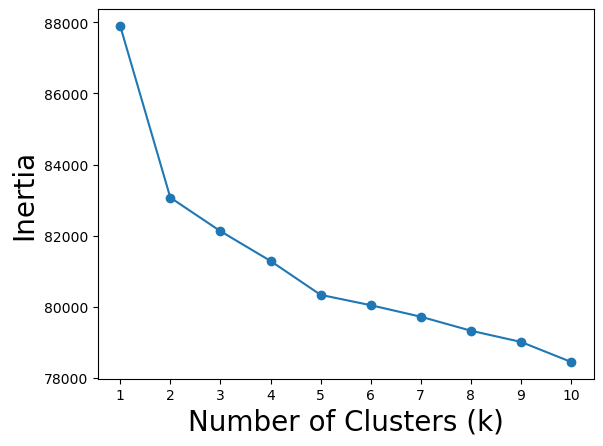

In [13]:
# Elbow curve to determine the number of clusters

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Define a range of cluster numbers to try
num_clusters_range = range(1, 11)  # You can adjust the range as needed

# Initialize a list to store the inertia values
inertia_values = []

random_state = 100

# Fit KMeans for each value of k and calculate inertia
for k in num_clusters_range:
    kmeans = KMeans(n_clusters=k, n_init=50, random_state=random_state)
    kmeans.fit(tfidf_np_array)
    inertia_values.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(num_clusters_range, inertia_values, marker='o')
#plt.title('Elbow Curve for KMeans', fontsize=20)
plt.xlabel('Number of Clusters (k)', fontsize=20)
plt.ylabel('Inertia', fontsize=20)
plt.xticks(num_clusters_range)
plt.show()


In [16]:
from sklearn.cluster import KMeans

# Define the number of clusters
num_clusters = 2

# Create an instance of KMeans clustering
kmeans = KMeans(n_clusters=num_clusters, n_init=50, random_state=random_state)

# Fit the KMeans model to your TF-IDF matrix
kmeans.fit(tfidf_np_array)

# Get cluster labels for each document
cluster_labels = kmeans.labels_

# Print cluster assignments for the first 100 documents (for illustration)
#for i, label in enumerate(cluster_labels[:100]):  
#    print(f"Document {i+1} belongs to cluster {label}")


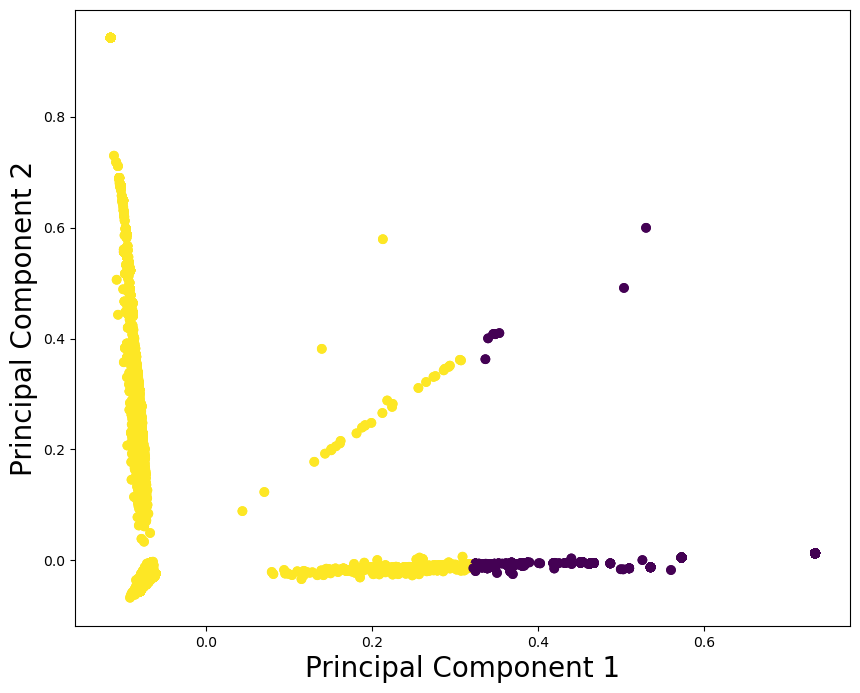

In [17]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Reduce dimensionality using PCA
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(tfidf_np_array)

# Create a scatter plot of the clusters
plt.figure(figsize=(10, 8))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=cluster_labels, cmap='viridis')
#plt.title('K-Means Clustering')
plt.xlabel('Principal Component 1', fontsize=20)
plt.ylabel('Principal Component 2', fontsize=20)
plt.show()


In [18]:
from sklearn.cluster import KMeans

# create KMeans clustering object
kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=random_state)

# fit KMeans clustering model to the tfidf_matrix
kmeans.fit(tfidf_np_array)

# get cluster labels for each row in the tfidf_matrix
df3['cluster_labels'] = kmeans.labels_

# print number of rows in each cluster
unique, counts = np.unique(cluster_labels, return_counts=True)
print(dict(zip(unique, counts)))


{0: 8680, 1: 91048}


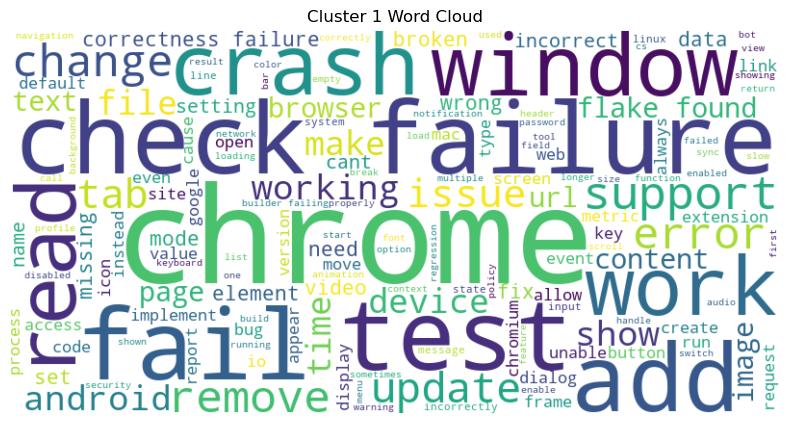

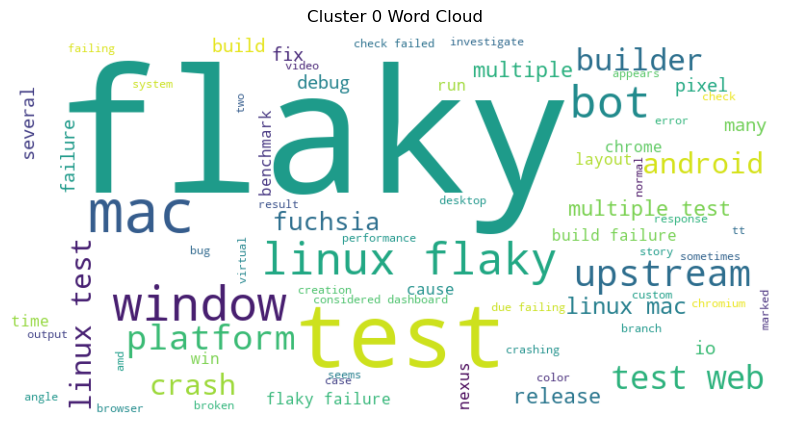

In [19]:
from sklearn.cluster import KMeans
from wordcloud import WordCloud
import matplotlib.pyplot as plt


# Create a dictionary to store the documents in each cluster
cluster_docs = {}
for i, label in enumerate(cluster_labels):
    if label not in cluster_docs:
        cluster_docs[label] = []
    cluster_docs[label].append(i)

# Create word cloud for each cluster
for label, doc_indices in cluster_docs.items():
    # Retrieve the words from the TfidfVectorizer object
    cluster_words = " ".join(feature_names[i] for i in tfidf_matrix[doc_indices].nonzero()[1])

    # Check if cluster contains at least one document with words
    if cluster_words:
        # Create a WordCloud object
        wordcloud = WordCloud(width=800, height=400, max_words=150, background_color='white').generate(cluster_words)

        # Plot the WordCloud
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Cluster {label} Word Cloud')
        plt.axis('off')
        plt.show()
    else:
        print(f"No documents with words in Cluster {label}")



In [20]:
# Get the centroid vectors for each cluster
centroids = kmeans.cluster_centers_

# Get the indices of the most important features for each cluster
important_indices = centroids.argsort()[:, ::-1]

# Get the most important words for each cluster
num_words = 20
cluster_labels = {}
for i in range(num_clusters):
    label = f"Cluster {i+1}: "
    for j in range(num_words):
        label += feature_names[important_indices[i][j]] + ", "
    cluster_labels[i] = label[:-2]

# Print the cluster labels
for i, label in cluster_labels.items():
    print(label)



Cluster 1: flaky, test, mac, linux, window, bot, upstream, platform, web, builder, android, multiple, crash, fuchsia, failure, build, release, io, several, debug
Cluster 2: failure, test, check, chrome, read, failing, crash, window, add, page, fails, tab, error, file, remove, work, android, flake, support, update


In [22]:
df4=df3.drop(['msg_clean','summary_tokenized','no_swds','lemmatized_check','component','lemmatized_no_swds'],axis=1)
df4 

,Unnamed: 0,bug_id,summary,comp_id,component_new,filtered_no_swds,clean_lemma,meaningful_lemm_str,cluster_labels
0,0,1136185,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui,"[keyboard, focus, ring, tab, counter, button]","[keyboard, focus, ring, tab, counter, button]",keyboard focus ring tab counter button,1
1,1,1136184,sheriff-o-matic should no longer show m85 buil...,125,infra,"[longer, show, builders]","[longer, show, builder]",longer show builder,1
2,2,1136183,fps meter isnt capturing dropped frames,200,speed,"[fps, meter, capturing, dropped, frames]","[fps, meter, capturing, dropped, frame]",fps meter capturing dropped frame,1
3,3,1136181,add chrome://flags entry for iph snooze,3,ui,"[add, entry, snooze]","[add, entry, snooze]",add entry snooze,1
4,4,1136179,second row of new tab page buttons not clickable,3,ui,"[second, row, new, tab, page, buttons]","[second, row, new, tab, page, button]",second row new tab page button,1
...,...,...,...,...,...,...,...,...,...
99723,99723,987797,[compile failure] observing compile failure on...,202,os,"[compile, failure, observing, compile, failure...","[compile, failure, observing, compile, failure...",compile failure observing compile failure offi...,1
99724,99724,987788,change precedence for commandline/features to ...,212,mobile,"[change, precedence, align, expectations]","[change, precedence, align, expectation]",change precedence align expectation,1
99725,99725,987750,add a test of backdrop-filter with null (no) c...,188,blink,"[add, test, null, crop]","[add, test, null, crop]",add test null crop,1
99726,99726,987730,dl: beforeactivate commits dcheck,188,blink,"[dl, commits]","[dl, commits]",dl commits,1


In [24]:
# Define a function to map cluster labels to cluster tags
def map_cluster_labels_to_tags(cluster_label):
    cluster_tags = {
        0: "Flaky Bugs",
        1: "Functional and Compatibility Bugs"
#        0: "Functional Performance Bugs",
#        1: "Test and Compatibility Problems",
#        2: "Build and Compilation Issues"
       
    }
    return cluster_tags.get(cluster_label, "Other") 

df4['cluster_tag'] = df4['cluster_labels'].apply(map_cluster_labels_to_tags)

df4

,Unnamed: 0,bug_id,summary,comp_id,component_new,filtered_no_swds,clean_lemma,meaningful_lemm_str,cluster_labels,cluster_tag
0,0,1136185,[mohnstrudel a11y] no keyboard focus ring on t...,3,ui,"[keyboard, focus, ring, tab, counter, button]","[keyboard, focus, ring, tab, counter, button]",keyboard focus ring tab counter button,1,Functional and Compatibility Bugs
1,1,1136184,sheriff-o-matic should no longer show m85 buil...,125,infra,"[longer, show, builders]","[longer, show, builder]",longer show builder,1,Functional and Compatibility Bugs
2,2,1136183,fps meter isnt capturing dropped frames,200,speed,"[fps, meter, capturing, dropped, frames]","[fps, meter, capturing, dropped, frame]",fps meter capturing dropped frame,1,Functional and Compatibility Bugs
3,3,1136181,add chrome://flags entry for iph snooze,3,ui,"[add, entry, snooze]","[add, entry, snooze]",add entry snooze,1,Functional and Compatibility Bugs
4,4,1136179,second row of new tab page buttons not clickable,3,ui,"[second, row, new, tab, page, buttons]","[second, row, new, tab, page, button]",second row new tab page button,1,Functional and Compatibility Bugs
...,...,...,...,...,...,...,...,...,...,...
99723,99723,987797,[compile failure] observing compile failure on...,202,os,"[compile, failure, observing, compile, failure...","[compile, failure, observing, compile, failure...",compile failure observing compile failure offi...,1,Functional and Compatibility Bugs
99724,99724,987788,change precedence for commandline/features to ...,212,mobile,"[change, precedence, align, expectations]","[change, precedence, align, expectation]",change precedence align expectation,1,Functional and Compatibility Bugs
99725,99725,987750,add a test of backdrop-filter with null (no) c...,188,blink,"[add, test, null, crop]","[add, test, null, crop]",add test null crop,1,Functional and Compatibility Bugs
99726,99726,987730,dl: beforeactivate commits dcheck,188,blink,"[dl, commits]","[dl, commits]",dl commits,1,Functional and Compatibility Bugs


C:\Users\yousu\anaconda3\lib\site-packages\seaborn\categorical.py:82: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


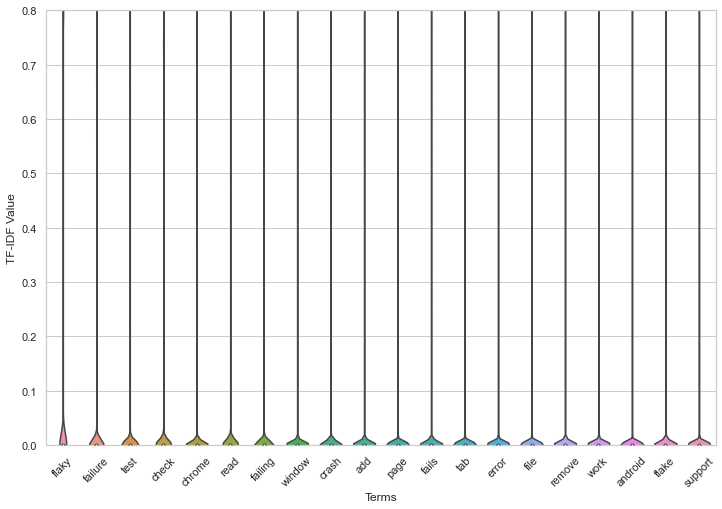

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert TF-IDF matrix to dense array if it's not already
if not isinstance(tfidf_matrix, np.ndarray):
    tfidf_matrix_dense = tfidf_matrix.toarray()
else:
    tfidf_matrix_dense = tfidf_matrix

o_tfidf = {}

for i in range(len(df3)):
    for j, word in enumerate(feature_names):
        if word not in o_tfidf:
            o_tfidf[word] = []
        tfidf_score = tfidf_matrix_dense[i, j]
        o_tfidf[word].append(tfidf_score)

# Convert object to data frame
df_tfidf = pd.DataFrame(o_tfidf)

# Compute the average TF-IDF score for each term
avg_tfidf = df_tfidf.mean().sort_values(ascending=False)

# Select the top 20 terms
top_20_terms = avg_tfidf.head(20).index

# Filter the dataframe to include only the top 20 terms
df_tfidf_top_20 = df_tfidf[top_20_terms]

# Determine the range of TF-IDF values for the top 20 terms
min_val = df_tfidf_top_20.min().min()
max_val = df_tfidf_top_20.max().max()

# Set the style of the plot
sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))
# Create the violin plot for the top 20 terms
sns.violinplot(data=df_tfidf_top_20)

# Set labels for the axes
plt.xlabel("Terms")
plt.ylabel("TF-IDF Value")
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Adjust the y-axis limits to zoom in on the data
plt.ylim(min_val, max_val)

# Show the plot
plt.show()


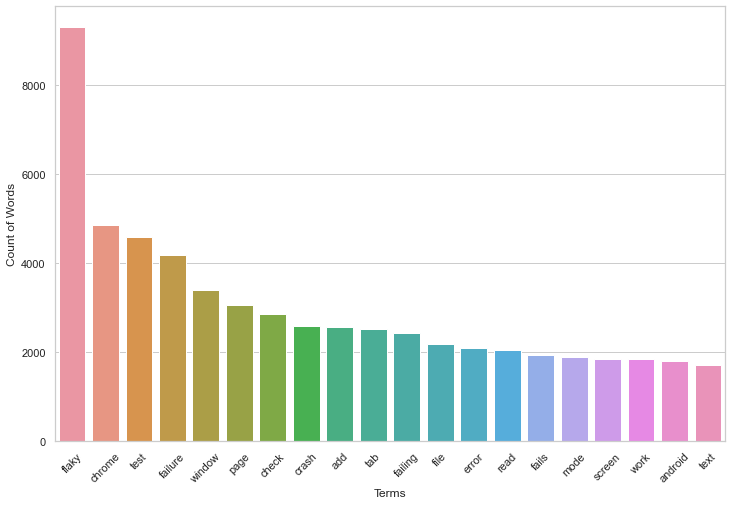

In [57]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming you've already converted the tfidf_matrix to a dense format

# Convert TF-IDF matrix to DataFrame
df_tfidf = pd.DataFrame(tfidf_matrix, columns=feature_names)

# Count the number of non-zero TF-IDF scores for each term
word_counts = df_tfidf.gt(0).sum().sort_values(ascending=False)

# Select the top 20 terms
top_20_terms = word_counts.head(20)

# Set the style of the plot
sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))
# Create the bar plot for the top 20 terms
sns.barplot(x=top_20_terms.index, y=top_20_terms.values)

# Set labels for the axes
plt.xlabel("Terms")
plt.ylabel("Count of Words")
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Show the plot
plt.show()
